# Revenue forecasting: main notebook

Diploma project (KBTU): forecasting quarterly revenue of 21 companies with time-series and machine-learning models.

What happens in this notebook, in order:

1. load the macro data and the company CSV files, clean them and put everything on a quarterly grid
2. exploratory analysis and stationarity tests
3. pick the lag features, then train ML models (raw revenue and log revenue) and time-series models (ARIMA, SARIMA, Prophet, LSTM)
4. forecast every company until the end of 2032
5. compare four scenarios: revenue features only / + micro indicators / + macro forecasts / + both
6. ARIMA + RF + XGBoost ensemble and statistical tests on the differences

A few things to know before running it:

* The company CSVs come from LSEG (Refinitiv) exports and are **not** in this repository, so the data-loading cells will not run as they are. Put your own copy into a folder called `company data` (or change `COMPANY_DATA_DIR` in the first cell).
* The outputs of the last run are saved in the notebook, so you can read all the results without re-running anything.
* Some of the older comments are in Russian, that is left as it was.
* The macro forecasts used in scenarios 3 and 4 are produced by the separate notebook `macro_indicators_arima_forecasting.ipynb`.

## 1. Setup and macro data

In [1]:
# Every CSV goes through csv_path(): it looks in the current folder first and then in COMPANY_DATA_DIR.
# The data folder is not part of the repo (licensed LSEG exports), so point it to your own copy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

plt.style.use('ggplot')

COMPANY_DATA_DIR = Path("company data")


def csv_path(filename, fallback_filename=None):
    candidates = [Path(filename)]
    if fallback_filename is not None:
        candidates.append(Path(fallback_filename))
    candidates.append(COMPANY_DATA_DIR / filename)
    if fallback_filename is not None:
        candidates.append(COMPANY_DATA_DIR / fallback_filename)

    for candidate in candidates:
        if candidate.exists():
            return str(candidate)

    return str(COMPANY_DATA_DIR / filename)


APPLE_PATH = csv_path("apple_final.csv")
MSFT_PATH = csv_path("microsoft_final.csv")
AMZN_PATH = csv_path("amazon_final.csv")
NVDA_PATH = csv_path("nvidia_final.csv")
INTEL_PATH = csv_path("intel.csv")
JPMORGAN_PATH = csv_path("jpmorgan.csv")
ZOOM_PATH = csv_path("zoom.csv")
AMD_PATH = csv_path("amd.csv")
BLACKBERRY_PATH = csv_path("blackberry.csv")
BANK_OF_AMERICA_PATH = csv_path("bank_of_america.csv")
BOEING_PATH = csv_path("boeing.csv")
CHEVRON_PATH = csv_path("chevron.csv")
EXXON_PATH = csv_path("exxon.csv")
GAP_PATH = csv_path("gap.csv")
PELOTON_PATH = csv_path("peloton.csv")
STITCH_PATH = csv_path("stitch.csv")
AIRBUS_PATH = csv_path("airbus.csv")
GAMESTOP_PATH = csv_path("gamestop.csv")
TRIPADVISOR_PATH = csv_path("tripadvisor.csv")
MARRIOTT_PATH = csv_path("marriott.csv")
HILTON_PATH = csv_path("hilton.csv")
VISA_PATH = csv_path("visa.csv")

CPI_PATH = csv_path("CPIAUCSL.csv")
DGS10_PATH = csv_path("DGS10.csv")
BRENT_PATH = csv_path("brent.csv")
NASDAQ_PATH = csv_path("NASDAQCOM.csv")
SP500_PATH = csv_path("S&P index.csv", fallback_filename="S&P index (1).csv")


In [2]:
import pandas as pd
import numpy as np

cpi = pd.read_csv(CPI_PATH)
rate = pd.read_csv(DGS10_PATH)
oil = pd.read_csv(BRENT_PATH)
nasdaq = pd.read_csv(NASDAQ_PATH)
sp500_raw = pd.read_csv(SP500_PATH, header=None)


In [3]:
cpi['observation_date'] = pd.to_datetime(cpi['observation_date'])
rate['observation_date'] = pd.to_datetime(rate['observation_date'])
oil['observation_date'] = pd.to_datetime(oil['observation_date'])
nasdaq['observation_date'] = pd.to_datetime(nasdaq['observation_date'])

cpi = cpi.rename(columns={
    'observation_date': 'DATE',
    'CPIAUCSL': 'CPI'
})

rate = rate.rename(columns={
    'observation_date': 'DATE',
    'DGS10': 'DGS10'
})

oil = oil.rename(columns={
    'observation_date': 'DATE',
    'POILBREUSDM': 'BRENT'
})

nasdaq = nasdaq.rename(columns={
    'observation_date': 'DATE',
    'NASDAQCOM': 'NASDAQ'
})

In [4]:
# найти строку, где начинается таблица с историей
start_idx = sp500_raw[sp500_raw.iloc[:, 0].astype(str).str.contains("Exchange Date", na=False)].index[0]

# взять заголовок и данные начиная с этой строки
sp500 = sp500_raw.iloc[start_idx:].reset_index(drop=True)

# первая строка станет названиями колонок
sp500.columns = sp500.iloc[0]
sp500 = sp500.iloc[1:].reset_index(drop=True)

# оставить только нужные колонки
sp500 = sp500[['Exchange Date', 'Close']].copy()

# переименовать
sp500 = sp500.rename(columns={
    'Exchange Date': 'DATE',
    'Close': 'SP500'
})

# привести типы
sp500['DATE'] = pd.to_datetime(sp500['DATE'], errors='coerce')
sp500['SP500'] = pd.to_numeric(sp500['SP500'], errors='coerce')

sp500.head()

,DATE,SP500
0,2025-12-31,NaN
1,2025-11-30,NaN
2,2025-10-31,NaN
3,2025-09-30,NaN
4,2025-08-31,NaN


In [5]:
# daily / monthly series -> mean per quarter ('QE' = quarter end)
def to_quarterly(df, value_col):
    df = df.copy()
    df['DATE'] = pd.to_datetime(df['DATE'])
    df[value_col] = pd.to_numeric(df[value_col], errors='coerce')
    df = df.dropna(subset=['DATE'])
    df = df.set_index('DATE').resample('QE').mean(numeric_only=True).reset_index()
    df['year'] = df['DATE'].dt.year
    df['quarter'] = df['DATE'].dt.quarter
    return df[['year', 'quarter', value_col]]


In [6]:
cpi_q = to_quarterly(cpi, 'CPI')
rate_q = to_quarterly(rate, 'DGS10')
oil_q = to_quarterly(oil, 'BRENT')
nasdaq_q = to_quarterly(nasdaq, 'NASDAQ')
sp500_q = to_quarterly(sp500, 'SP500')

In [7]:
macro = (
    cpi_q
    .merge(rate_q, on=['year', 'quarter'], how='left')
    .merge(oil_q, on=['year', 'quarter'], how='left')
    .merge(nasdaq_q, on=['year', 'quarter'], how='left')
    .merge(sp500_q, on=['year', 'quarter'], how='left')
)

macro.head()

,year,quarter,CPI,DGS10,BRENT,NASDAQ,SP500
0,2008,1,212.769667,3.665246,96.658675,2334.308852,NaN
1,2008,2,215.537667,3.881563,122.218644,2425.356094,NaN
2,2008,3,218.861000,3.862188,115.380383,2290.819531,NaN
3,2008,4,213.848667,3.234677,55.062906,1604.346250,922.746667
4,2009,1,212.377667,2.736230,44.222591,1483.388525,786.280000


In [8]:
macro = (
    cpi_q
    .merge(rate_q, on=['year', 'quarter'], how='left')
    .merge(oil_q, on=['year', 'quarter'], how='left')
    .merge(nasdaq_q, on=['year', 'quarter'], how='left')
    .merge(sp500_q, on=['year', 'quarter'], how='left')
)

macro.head()

,year,quarter,CPI,DGS10,BRENT,NASDAQ,SP500
0,2008,1,212.769667,3.665246,96.658675,2334.308852,NaN
1,2008,2,215.537667,3.881563,122.218644,2425.356094,NaN
2,2008,3,218.861000,3.862188,115.380383,2290.819531,NaN
3,2008,4,213.848667,3.234677,55.062906,1604.346250,922.746667
4,2009,1,212.377667,2.736230,44.222591,1483.388525,786.280000


In [9]:
print(macro.columns)
print(macro.head())
print(macro.isna().sum())

Index(['year', 'quarter', 'CPI', 'DGS10', 'BRENT', 'NASDAQ', 'SP500'], dtype='str')
   year  quarter         CPI     DGS10       BRENT       NASDAQ       SP500
0  2008        1  212.769667  3.665246   96.658675  2334.308852         NaN
1  2008        2  215.537667  3.881563  122.218644  2425.356094         NaN
2  2008        3  218.861000  3.862188  115.380383  2290.819531         NaN
3  2008        4  213.848667  3.234677   55.062906  1604.346250  922.746667
4  2009        1  212.377667  2.736230   44.222591  1483.388525  786.280000
year        0
quarter     0
CPI         0
DGS10       1
BRENT       0
NASDAQ      1
SP500      69
dtype: int64


In [10]:
# gaps are forward-filled, the backfill only matters for the first quarters if a series starts later than the others
macro = macro.sort_values(['year', 'quarter']).reset_index(drop=True)

macro[['CPI', 'DGS10', 'BRENT', 'NASDAQ', 'SP500']] = (
    macro[['CPI', 'DGS10', 'BRENT', 'NASDAQ', 'SP500']]
    .ffill()
    .bfill()
)

In [11]:
print(macro.isna().sum())
print(macro.head())

year       0
quarter    0
CPI        0
DGS10      0
BRENT      0
NASDAQ     0
SP500      0
dtype: int64
   year  quarter         CPI     DGS10       BRENT       NASDAQ       SP500
0  2008        1  212.769667  3.665246   96.658675  2334.308852  922.746667
1  2008        2  215.537667  3.881563  122.218644  2425.356094  922.746667
2  2008        3  218.861000  3.862188  115.380383  2290.819531  922.746667
3  2008        4  213.848667  3.234677   55.062906  1604.346250  922.746667
4  2009        1  212.377667  2.736230   44.222591  1483.388525  786.280000


## 2. First look at the raw company files (Apple)

The exports are wide tables with one column per period, so the rows with revenue have to be found and reshaped by hand. Apple is used as the example.

In [12]:
apple_df = pd.read_csv("apple_final.csv", engine='python', sep=None)
apple_df.head()
print(apple_df.columns)

Index(['﻿Company Fundamentals - Financial Summary', 'Unnamed: 1', 'Unnamed: 2',
       'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7',
       'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12',
       'Unnamed: 13', 'Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16',
       'Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20',
       'Unnamed: 21', 'Unnamed: 22', 'Unnamed: 23', 'Unnamed: 24',
       'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28',
       'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32',
       'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36',
       'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40',
       'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44',
       'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48',
       'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51', 'Unnamed: 52',
       'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55', 'Unnamed: 56',
       'Unnamed: 57', 'Unn

In [13]:
print(apple_df.head())
print(apple_df.columns)

  ﻿Company Fundamentals - Financial Summary  \
0                              Company Name   
1                       Country of Exchange   
2                   Country of Headquarters   
3                       TRBC Industry Group   
4                               CF Template   

                                  Unnamed: 1 Unnamed: 2 Unnamed: 3 Unnamed: 4  \
0                        Apple Inc (AAPL.OQ)        NaN        NaN        NaN   
1                   United States of America        NaN        NaN        NaN   
2                   United States of America        NaN        NaN        NaN   
3  Computers, Phones & Household Electronics        NaN        NaN        NaN   
4                                        IND        NaN        NaN        NaN   

  Unnamed: 5 Unnamed: 6 Unnamed: 7 Unnamed: 8 Unnamed: 9  ... Unnamed: 63  \
0        NaN        NaN        NaN        NaN        NaN  ...         NaN   
1        NaN        NaN        NaN        NaN        NaN  ...         NaN   

In [14]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 30)

apple_df = pd.read_csv("apple_final.csv", sep=';', engine='python')
apple_df.head(20)

,Company Fundamentals - Financial Summary,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72
0,Company Name,Apple Inc (AAPL.OQ),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Country of Exchange,United States of America,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Country of Headquarters,United States of America,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,TRBC Industry Group,"Computers, Phones & Household Electronics",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CF Template,IND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Consolidation Basis,Consolidated,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Scaling,Billions,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Period,Quarter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Export Date,18-04-2026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Statement Data,2008,2008,2008,2008,2009,2009,2009,2009,2010,2010,2010,2010,2011,2011,2011,2011,2012,2012,2012,2012,2013,2013,2013,2013,2014,2014,2014,2014,2015,2015,2015,2015,2016,2016,2016,2016,2017,2017,2017,2017,2018,2018,2018,20

In [15]:
apple_df.iloc[:30, 0]

0                                          Company Name
1                                   Country of Exchange
2                               Country of Headquarters
3                                   TRBC Industry Group
4                                           CF Template
5                                   Consolidation Basis
6                                               Scaling
7                                                Period
8                                           Export Date
9                                        Statement Data
10                                      Period End Date
11                                       Statement Date
12                                Standardized Currency
13                                        Template Type
14                                                  NaN
15    Financial Summary - Standardized (Currency: US...
16                                           Field Name
17                      Selected Income Statemen

In [16]:
apple_df.iloc[:15, :15]

,Company Fundamentals - Financial Summary,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,Company Name,Apple Inc (AAPL.OQ),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Country of Exchange,United States of America,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Country of Headquarters,United States of America,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,TRBC Industry Group,"Computers, Phones & Household Electronics",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CF Template,IND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Consolidation Basis,Consolidated,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Scaling,Billions,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Period,Quarter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Export Date,18-04-2026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Statement Data,2008,2008,2008,2008,2009,2009,2009,2009,2010,2010,2010,2010,2011,2011


In [17]:
# найти все строки, где есть revenue / sales
mask = apple_df.iloc[:, 0].astype(str).str.contains("Revenue|Sales|Net Sales", case=False, na=False)
apple_df[mask].iloc[:, :15]

,Company Fundamentals - Financial Summary,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
18,Revenue from Business Activities - Total,"10,43","7,98","7,56","11,52","11,88","9,08","9,73","12,21","15,68","13,50","15,70","20,34","26,74","24,67"
51,Revenue from Business Activities - Total,"10,43","7,98","7,56","11,52","11,88","9,08","9,73","12,21","15,68","13,50","15,70","20,34","26,74","24,67"


In [18]:
rows = apple_df[mask].index.tolist()
print(rows)

for r in rows[:10]:
    print("\nROW:", r)
    display(apple_df.iloc[max(0, r-2):r+3, :15])

[18, 51]

ROW: 18


,Company Fundamentals - Financial Summary,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
16,Field Name,29-12-2007,29-03-2008,28-06-2008,27-09-2008,27-12-2008,28-03-2009,27-06-2009,26-09-2009,26-12-2009,27-03-2010,26-06-2010,25-09-2010,25-12-2010,26-03-2011
17,Selected Income Statement Items,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,Revenue from Business Activities - Total,"10,43","7,98","7,56","11,52","11,88","9,08","9,73","12,21","15,68","13,50","15,70","20,34","26,74","24,67"
19,Gross Profit - Industrials/Property - Total,"3,40","2,61","2,74","4,44","4,51","3,63","3,98","5,11","6,41","5,63","6,14","7,51","10,30","10,22"
20,Operating Profit before Non-Recurring Income/E...,"2,20","1,45","1,54","3,15","3,10","2,32","2,63","3,68","4,72","3,98","4,23","5,45","7,83","7,87"



ROW: 51


,Company Fundamentals - Financial Summary,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
49,"Return on Invested Capital - %, TTM","29,4%","29,4%","28,7%","33,2%","33,9%","34,2%","34,9%","30,5%","31,9%","34,0%","35,5%","35,3%","36,8%","38,8%"
50,Growth,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51,Revenue from Business Activities - Total,"10,43","7,98","7,56","11,52","11,88","9,08","9,73","12,21","15,68","13,50","15,70","20,34","26,74","24,67"
52,Operating Profit before Non-Recurring Income/E...,"2,20","1,45","1,54","3,15","3,10","2,32","2,63","3,68","4,72","3,98","4,23","5,45","7,83","7,87"
53,"Earnings before Interest, Taxes, Depreciation ...","2,30","1,56","1,65","3,30","3,27","2,50","2,81","3,91","4,93","4,20","4,51","5,78","8,18","8,31"


In [19]:
revenue_row = 20   # сюда потом подставишь свой номер строки

years = apple_df.iloc[9, 1:]                 # строка Statement Data
dates = apple_df.iloc[10, 1:]                # строка Period End Date
revenue = apple_df.iloc[revenue_row, 1:]     # строка Revenue / Net Sales

apple_tidy = pd.DataFrame({
    'year': pd.to_numeric(years, errors='coerce'),
    'date': pd.to_datetime(dates, dayfirst=True, errors='coerce'),
    'revenue': pd.to_numeric(revenue, errors='coerce')
})

apple_tidy = apple_tidy.dropna(subset=['year', 'date', 'revenue'])
apple_tidy['quarter'] = apple_tidy['date'].dt.quarter
apple_tidy['company'] = 'Apple'

apple_tidy.head()

,year,date,revenue,quarter,company


In [20]:
apple_tidy = apple_tidy.merge(macro, on=['year', 'quarter'], how='left')

apple_tidy[['CPI', 'DGS10', 'BRENT', 'NASDAQ', 'SP500']] = (
    apple_tidy[['CPI', 'DGS10', 'BRENT', 'NASDAQ', 'SP500']].ffill().bfill()
)

apple_tidy.head()

,year,date,revenue,quarter,company,CPI,DGS10,BRENT,NASDAQ,SP500


## 3. Cleaning and combining all companies

In [21]:
# Environment note: install packages outside the notebook to avoid changing NumPy mid-run.
# Required for this notebook: xgboost.
# If missing, run in Terminal once:
# python3 -m pip install --no-deps xgboost
import xgboost
print('xgboost version:', xgboost.__version__)


xgboost version: 3.2.0


In [22]:
# The CSVs only give a quarter-end date, but fiscal years differ between companies.
# Where the file has no fiscal_year / fiscal_quarter this fills them in: start from the first known value (or the calendar quarter of the first date) and add one quarter per row
def complete_fiscal_fields(df, date_col="date", group_col="company"):
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])

    if "fiscal_year" not in df.columns:
        df["fiscal_year"] = np.nan
    if "fiscal_quarter" not in df.columns:
        df["fiscal_quarter"] = np.nan

    sort_cols = [date_col] if group_col not in df.columns else [group_col, date_col]
    df = df.sort_values(sort_cols).reset_index(drop=True)

    if group_col in df.columns:
        groups = df.groupby(group_col, sort=False).groups.values()
    else:
        groups = [df.index]

    for idxs in groups:
        idxs = list(idxs)
        fy = None
        fq = None

        for idx in idxs:
            row_fy = df.at[idx, "fiscal_year"]
            row_fq = df.at[idx, "fiscal_quarter"]

            if pd.notna(row_fy) and pd.notna(row_fq):
                fy = int(row_fy)
                fq = int(row_fq)
            elif fy is None or fq is None:
                fy = int(pd.to_datetime(df.at[idx, date_col]).year)
                fq = int(pd.to_datetime(df.at[idx, date_col]).quarter)
            else:
                fq += 1
                if fq > 4:
                    fq = 1
                    fy += 1

            df.at[idx, "fiscal_year"] = fy
            df.at[idx, "fiscal_quarter"] = fq

    df["fiscal_year"] = df["fiscal_year"].astype(int)
    df["fiscal_quarter"] = df["fiscal_quarter"].astype(int)
    df["fiscal_period"] = df["fiscal_year"].astype(str) + "Q" + df["fiscal_quarter"].astype(str)
    return df


def add_forecast_fiscal_fields(forecast_df, history_df, date_col="date", group_col="company"):
    forecast_df = forecast_df.copy()
    forecast_df["_forecast_order"] = np.arange(len(forecast_df))
    pieces = []
    grouping_cols = [group_col]
    if "model" in forecast_df.columns:
        grouping_cols.append("model")

    for keys, forecast_part in forecast_df.groupby(grouping_cols, sort=False):
        if not isinstance(keys, tuple):
            keys = (keys,)
        company = keys[0]
        history_part = history_df[history_df[group_col] == company].copy()

        keep_history_cols = [
            col for col in [date_col, group_col, "fiscal_year", "fiscal_quarter", "fiscal_period"]
            if col in history_part.columns
        ]
        combined = pd.concat([
            history_part[keep_history_cols].assign(_is_forecast=False),
            forecast_part.assign(_is_forecast=True),
        ], ignore_index=True, sort=False)

        completed = complete_fiscal_fields(combined, date_col=date_col, group_col=group_col)
        pieces.append(completed[completed["_is_forecast"]].copy())

    out = pd.concat(pieces, ignore_index=True, sort=False)
    out = out.sort_values("_forecast_order").drop(columns=["_forecast_order", "_is_forecast"])
    return out.reset_index(drop=True)


def parse_revenue_values(values, scaling=""):
    cleaned = pd.Series(values, dtype="object").astype(str).str.strip()
    cleaned = cleaned.str.replace("\u00a0", "", regex=False).str.replace(" ", "", regex=False)

    if str(scaling).strip().lower() == "billions":
        cleaned = cleaned.str.replace(",", ".", regex=False)
    else:
        cleaned = cleaned.str.replace(",", "", regex=False)

    return pd.to_numeric(cleaned, errors="coerce")


def load_revenue_timeseries_csv(csv_path: str, row_name="Revenue from Business Activities - Total"):
    df = pd.read_csv(csv_path, sep=None, engine="python", encoding="utf-8-sig")

    first_col = df.iloc[:, 0].astype(str).str.strip()

    # fiscal year row from the CSV header (Statement Data)
    fiscal_year_row_idx = df.index[first_col.eq("Statement Data")][0]
    fiscal_year_labels = df.iloc[fiscal_year_row_idx, 1:].tolist()

    # scaling row: the updated files are already in USD billions
    scaling = ""
    scaling_matches = df.index[first_col.eq("Scaling")]
    if len(scaling_matches) > 0:
        scaling = str(df.iloc[scaling_matches[0], 1]).strip()

    # period end dates
    field_row_idx = df.index[first_col.eq("Field Name")][0]
    date_labels = df.iloc[field_row_idx, 1:].tolist()

    # Revenue Total row
    metric_row_idx = df.index[first_col.str.contains(row_name, case=False, na=False)][0]
    values = df.iloc[metric_row_idx, 1:].tolist()

    ts = pd.DataFrame({
        "date_raw": date_labels,
        "fiscal_year_raw": fiscal_year_labels,
        "revenue_raw": values,
    })

    ts["date"] = pd.to_datetime(ts["date_raw"], dayfirst=True, errors="coerce")
    ts["fiscal_year"] = pd.to_numeric(ts["fiscal_year_raw"], errors="coerce")
    ts["revenue"] = parse_revenue_values(ts["revenue_raw"], scaling=scaling)
    ts["revenue_unit"] = "USD billions" if str(scaling).strip().lower() == "billions" else "raw CSV units"

    ts = (
        ts[["date", "fiscal_year", "fiscal_year_raw", "revenue", "revenue_unit"]]
        .dropna(subset=["date", "fiscal_year"])
        .sort_values("date")
        .reset_index(drop=True)
    )
    ts["fiscal_year"] = ts["fiscal_year"].astype(int)
    ts["fiscal_quarter"] = ts.groupby("fiscal_year").cumcount() + 1
    ts["fiscal_period"] = ts["fiscal_year"].astype(str) + "Q" + ts["fiscal_quarter"].astype(str)

    return ts


In [23]:
# (name, csv path) for every company that is used in the study
COMPANY_FILES = [
    ("Apple", APPLE_PATH),
    ("Microsoft", MSFT_PATH),
    ("Amazon", AMZN_PATH),
    ("NVIDIA", NVDA_PATH),
    ("Intel", INTEL_PATH),
    ("JPMorgan", JPMORGAN_PATH),
    ("Zoom", ZOOM_PATH),
    ("AMD", AMD_PATH),
    ("BlackBerry", BLACKBERRY_PATH),
    ("Bank of America", BANK_OF_AMERICA_PATH),
    ("Boeing", BOEING_PATH),
    ("Chevron", CHEVRON_PATH),
    ("Exxon", EXXON_PATH),
    ("Gap", GAP_PATH),
    ("Peloton", PELOTON_PATH),
    ("Stitch Fix", STITCH_PATH),
    ("Airbus", AIRBUS_PATH),
    ("GameStop", GAMESTOP_PATH),
    ("Tripadvisor", TRIPADVISOR_PATH),
    ("Marriott", MARRIOTT_PATH),
    ("Hilton", HILTON_PATH),
    ("Visa", VISA_PATH),
]

series_frames = []
skipped_company_files = []

for company_name, csv_path in COMPANY_FILES:
    try:
        company_ts = load_revenue_timeseries_csv(csv_path)
        company_ts["company"] = company_name
        series_frames.append(company_ts)
    except Exception as exc:
        skipped_company_files.append({
            "company": company_name,
            "path": csv_path,
            "reason": str(exc),
        })

if skipped_company_files:
    print("Skipped files that could not be loaded as revenue time series:")
    for item in skipped_company_files:
        print(f"- {item['company']}: {item['reason']}")

data = pd.concat(series_frames, ignore_index=True)

data.head(), data.tail()


Skipped files that could not be loaded as revenue time series:
- Airbus: index 0 is out of bounds for axis 0 with size 0


(        date  fiscal_year fiscal_year_raw  revenue  revenue_unit  \
 0 2007-12-29         2008            2008    10.43  USD billions   
 1 2008-03-29         2008            2008     7.98  USD billions   
 2 2008-06-28         2008            2008     7.56  USD billions   
 3 2008-09-27         2008            2008    11.52  USD billions   
 4 2008-12-27         2009            2009    11.88  USD billions   
 
    fiscal_quarter fiscal_period company  
 0               1        2008Q1   Apple  
 1               2        2008Q2   Apple  
 2               3        2008Q3   Apple  
 3               4        2008Q4   Apple  
 4               1        2009Q1   Apple  ,
            date  fiscal_year fiscal_year_raw  revenue  revenue_unit  \
 1353 2024-09-30         2024            2024     9.62  USD billions   
 1354 2024-12-31         2025            2025     9.51  USD billions   
 1355 2025-03-31         2025            2025     9.59  USD billions   
 1356 2025-06-30         2025        

In [24]:
print("Missing revenue rows:", data["revenue"].isna().sum())

dups = data.duplicated(subset=["company", "date"]).sum()
print("Duplicates (company,date):", dups)

data = data.drop_duplicates(subset=["company", "date"]).sort_values(["company", "date"]).reset_index(drop=True)

for c in data["company"].unique():
    tmp = data[data["company"] == c].sort_values("date")
    diffs = tmp["date"].diff().value_counts().head(5)
    print("\n", c, "top date diffs:")
    print(diffs)


Missing revenue rows: 0
Duplicates (company,date): 0

 AMD top date diffs:
date
91 days    68
98 days     3
Name: count, dtype: int64

 Amazon top date diffs:
date
92 days    36
91 days    22
90 days    13
Name: count, dtype: int64

 Apple top date diffs:
date
91 days    68
98 days     3
Name: count, dtype: int64

 Bank of America top date diffs:
date
92 days    36
91 days    22
90 days    13
Name: count, dtype: int64

 BlackBerry top date diffs:
date
91 days    44
92 days    18
90 days     7
98 days     1
93 days     1
Name: count, dtype: int64

 Boeing top date diffs:
date
92 days    36
91 days    22
90 days    13
Name: count, dtype: int64

 Chevron top date diffs:
date
92 days    36
91 days    22
90 days    13
Name: count, dtype: int64

 Exxon top date diffs:
date
92 days    36
91 days    22
90 days    13
Name: count, dtype: int64

 GameStop top date diffs:
date
91 days    68
98 days     3
Name: count, dtype: int64

 Gap top date diffs:
date
91 days    68
98 days     3
Name: count, 

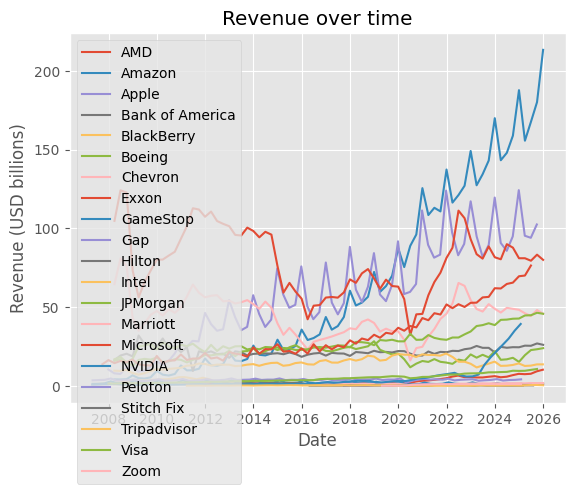

In [25]:
plt.figure()
for c in data["company"].unique():
    tmp = data[data["company"] == c].sort_values("date")
    plt.plot(tmp["date"], tmp["revenue"], label=c)

plt.title("Revenue over time")
plt.xlabel("Date")
plt.ylabel("Revenue (USD billions)")
plt.legend()
plt.show()


### Outliers

In [26]:
# 1.5 * IQR rule per company. Outliers are only flagged here, nothing is removed
def add_iqr_outlier_flag(df_one_company):
    x = df_one_company["revenue"].dropna()
    q1, q3 = x.quantile(0.25), x.quantile(0.75)
    iqr = q3 - q1
    low, high = q1 - 1.5*iqr, q3 + 1.5*iqr
    
    out = df_one_company.copy()
    out["is_outlier_iqr"] = (out["revenue"] < low) | (out["revenue"] > high)
    return out, (low, high)

checked = []
bounds = {}
for c in data["company"].unique():
    tmp = data[data["company"] == c].sort_values("date")
    tmp2, (low, high) = add_iqr_outlier_flag(tmp)
    checked.append(tmp2)
    bounds[c] = (low, high)

data_qc = pd.concat(checked).reset_index(drop=True)

bounds, data_qc[data_qc["is_outlier_iqr"]].head()


({'AMD': (np.float64(-2.6975), np.float64(7.9625)),
  'Amazon': (np.float64(-132.81875), np.float64(261.97125)),
  'Apple': (np.float64(-37.497500000000024), np.float64(157.98250000000002)),
  'Bank of America': (np.float64(15.023749999999998),
   np.float64(29.473750000000003)),
  'BlackBerry': (np.float64(-3.51375), np.float64(6.41625)),
  'Boeing': (np.float64(7.223750000000003), np.float64(32.13375)),
  'Chevron': (np.float64(8.829999999999995), np.float64(78.41000000000001)),
  'Exxon': (np.float64(14.90375000000001), np.float64(144.01375)),
  'GameStop': (np.float64(0.2825), np.float64(3.1824999999999997)),
  'Gap': (np.float64(2.7362499999999996), np.float64(4.926250000000001)),
  'Hilton': (np.float64(-0.04625000000000001), np.float64(2.26375)),
  'Intel': (np.float64(7.871250000000001), np.float64(21.02125)),
  'JPMorgan': (np.float64(14.283750000000005), np.float64(40.293749999999996)),
  'Marriott': (np.float64(-0.23000000000000032),
   np.float64(2.2900000000000005)),
  'Mi

### Micro indicators (company fundamentals)

In [27]:
# Micro indicators extraction from company fundamentals CSV files
# These variables will be used later for Model B / Model D feature sets.

from pathlib import Path

COMPANY_DATA_DIR = Path("company data")

MICRO_INDICATOR_ROWS = {
    "operating_cash_flow": "Net Cash Flow from Operating Activities",
    "total_assets": "Total Assets",
    "ebitda": "Earnings before Interest, Taxes, Depreciation & Amortization (EBITDA)",
    "gross_profit": "Gross Profit - Industrials/Property - Total",
    "income_before_discontinued_extraordinary": "Income before Discontinued Operations & Extraordinary Items",
}


def resolve_company_csv_path(csv_path):
    path = Path(csv_path)
    if path.exists():
        return path

    desktop_path = COMPANY_DATA_DIR / path.name
    if desktop_path.exists():
        return desktop_path

    return path


def load_micro_indicators_csv(csv_path, indicator_rows=MICRO_INDICATOR_ROWS):
    csv_path = resolve_company_csv_path(csv_path)
    df = pd.read_csv(csv_path, sep=None, engine="python", encoding="utf-8-sig")
    first_col = df.iloc[:, 0].astype(str).str.strip()

    fiscal_year_row_idx = df.index[first_col.eq("Statement Data")][0]
    fiscal_year_labels = df.iloc[fiscal_year_row_idx, 1:].tolist()

    field_row_idx = df.index[first_col.eq("Field Name")][0]
    date_labels = df.iloc[field_row_idx, 1:].tolist()

    scaling = ""
    scaling_matches = df.index[first_col.eq("Scaling")]
    if len(scaling_matches) > 0:
        scaling = str(df.iloc[scaling_matches[0], 1]).strip()

    out = pd.DataFrame({
        "date_raw": date_labels,
        "fiscal_year_raw": fiscal_year_labels,
    })
    out["date"] = pd.to_datetime(out["date_raw"], dayfirst=True, errors="coerce")
    out["fiscal_year"] = pd.to_numeric(out["fiscal_year_raw"], errors="coerce")

    missing_rows = []

    for col_name, row_label in indicator_rows.items():
        matches = df.index[first_col.eq(row_label)]

        if len(matches) == 0:
            out[col_name] = np.nan
            missing_rows.append(row_label)
            continue

        values = df.iloc[matches[0], 1:].tolist()
        out[col_name] = parse_revenue_values(values, scaling=scaling)

    out = (
        out[["date", "fiscal_year"] + list(indicator_rows.keys())]
        .dropna(subset=["date", "fiscal_year"])
        .sort_values("date")
        .reset_index(drop=True)
    )
    out["fiscal_year"] = out["fiscal_year"].astype(int)
    out["micro_unit"] = "USD billions" if str(scaling).strip().lower() == "billions" else "raw CSV units"

    return out, missing_rows


In [28]:
micro_frames = []
micro_missing_rows = []

for company_name, csv_path in COMPANY_FILES:
    try:
        company_micro, missing_rows = load_micro_indicators_csv(csv_path)
        company_micro["company"] = company_name
        micro_frames.append(company_micro)

        for row_label in missing_rows:
            micro_missing_rows.append({
                "company": company_name,
                "path": str(resolve_company_csv_path(csv_path)),
                "missing_row": row_label,
            })
    except Exception as exc:
        micro_missing_rows.append({
            "company": company_name,
            "path": str(resolve_company_csv_path(csv_path)),
            "missing_row": f"LOAD ERROR: {exc}",
        })

micro_indicators = pd.concat(micro_frames, ignore_index=True)

print("Micro indicator rows:", micro_indicators.shape[0])
print("Companies with micro data:", micro_indicators["company"].nunique())

if micro_missing_rows:
    micro_missing_rows_df = pd.DataFrame(micro_missing_rows)
    display(micro_missing_rows_df)
else:
    micro_missing_rows_df = pd.DataFrame(columns=["company", "path", "missing_row"])
    print("All requested micro rows found for all loaded company files.")

micro_indicators.head()


Micro indicator rows: 1430
Companies with micro data: 22


,company,path,missing_row
0,JPMorgan,company data/jpmorgan.csv,"Earnings before Interest, Taxes, Depreciation ..."
1,JPMorgan,company data/jpmorgan.csv,Gross Profit - Industrials/Property - Total
2,Bank of America,company data/bank_of_americ...,"Earnings before Interest, Taxes, Depreciation ..."
3,Bank of America,company data/bank_of_americ...,Gross Profit - Industrials/Property - Total
4,Airbus,company data/airbus.csv,Net Cash Flow from Operating Activities
5,Airbus,company data/airbus.csv,Total Assets
6,Airbus,company data/airbus.csv,"Earnings before Interest, Taxes, Depreciation ..."
7,Airbus,company data/airbus.csv,Gross Profit - Industrials/Property - Total
8,Airbus,company data/airbus.csv,Income before Discontinued Operations & Extrao...


,date,fiscal_year,operating_cash_flow,total_assets,ebitda,gross_profit,income_before_discontinued_extraordinary,micro_unit,company
0,2007-12-29,2008,2.79,30.04,2.30,3.40,1.64,USD billions,Apple
1,2008-03-29,2008,1.19,30.47,1.56,2.61,1.10,USD billions,Apple
2,2008-06-28,2008,1.32,31.71,1.65,2.74,1.13,USD billions,Apple
3,2008-09-27,2008,4.30,36.17,3.30,4.44,2.25,USD billions,Apple
4,2008-12-27,2009,3.94,42.79,3.27,4.51,2.26,USD billions,Apple


In [29]:
data_micro = data_qc.merge(
    micro_indicators.drop(columns=["fiscal_year", "micro_unit"], errors="ignore"),
    on=["company", "date"],
    how="left"
)

micro_base_cols = list(MICRO_INDICATOR_ROWS.keys())


def add_micro_features(df, micro_cols=micro_base_cols, group_col="company", revenue_col="revenue"):
    out = df.sort_values([group_col, "date"]).reset_index(drop=True).copy()
    grouped = out.groupby(group_col, sort=False)

    for col in micro_cols:
        out[f"{col}_lag_1"] = grouped[col].shift(1)
        out[f"{col}_lag_4"] = grouped[col].shift(4)

        # Leakage-safe QoQ growth: at quarter t, use growth observed at t-1.
        raw_growth = grouped[col].pct_change()
        out[f"{col}_growth_qoq"] = raw_growth.groupby(out[group_col]).shift(1)

        # Margin/ratio known from previous quarter: indicator(t-1) / revenue(t-1).
        raw_margin = out[col] / out[revenue_col].replace(0, np.nan)
        out[f"{col}_margin_lag1"] = raw_margin.groupby(out[group_col]).shift(1)

    return out


data_micro_features = add_micro_features(data_micro)

micro_feature_cols = []
for col in micro_base_cols:
    micro_feature_cols.extend([
        f"{col}_lag_1",
        f"{col}_lag_4",
        f"{col}_growth_qoq",
        f"{col}_margin_lag1",
    ])

print("Micro base columns:", micro_base_cols)
print("Micro feature columns:", len(micro_feature_cols))
print(micro_feature_cols)

data_micro_features[["company", "date", "revenue"] + micro_base_cols + micro_feature_cols[:8]].head(12)


Micro base columns: ['operating_cash_flow', 'total_assets', 'ebitda', 'gross_profit', 'income_before_discontinued_extraordinary']
Micro feature columns: 20
['operating_cash_flow_lag_1', 'operating_cash_flow_lag_4', 'operating_cash_flow_growth_qoq', 'operating_cash_flow_margin_lag1', 'total_assets_lag_1', 'total_assets_lag_4', 'total_assets_growth_qoq', 'total_assets_margin_lag1', 'ebitda_lag_1', 'ebitda_lag_4', 'ebitda_growth_qoq', 'ebitda_margin_lag1', 'gross_profit_lag_1', 'gross_profit_lag_4', 'gross_profit_growth_qoq', 'gross_profit_margin_lag1', 'income_before_discontinued_extraordinary_lag_1', 'income_before_discontinued_extraordinary_lag_4', 'income_before_discontinued_extraordinary_growth_qoq', 'income_before_discontinued_extraordinary_margin_lag1']


,company,date,revenue,operating_cash_flow,total_assets,ebitda,gross_profit,income_before_discontinued_extraordinary,operating_cash_flow_lag_1,operating_cash_flow_lag_4,operating_cash_flow_growth_qoq,operating_cash_flow_margin_lag1,total_assets_lag_1,total_assets_lag_4,total_assets_growth_qoq,total_assets_margin_lag1
0,AMD,2008-03-29,1.49,0.02,11.21,0.08,0.58,-0.32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AMD,2008-06-28,1.36,-0.24,9.78,-0.02,0.47,-0.69,0.02,NaN,NaN,0.013423,11.21,NaN,NaN,7.523490
2,AMD,2008-09-27,1.80,-0.22,9.44,0.43,0.89,0.02,-0.24,NaN,-13.000000,-0.176471,9.78,NaN,-0.127565,7.191176
3,AMD,2008-12-27,1.16,-0.25,7.67,-0.24,0.24,-1.42,-0.22,NaN,-0.083333,-0.122222,9.44,NaN,-0.034765,5.244444
4,AMD,2009-03-28,1.18,-0.39,9.05,0.04,0.49,-0.41,-0.25,0.02,0.136364,-0.215517,7.67,11.21,-0.187500,6.612069
5,AMD,2009-06-27,1.18,-0.14,8.68,0.03,0.42,-0.33,-0.39,-0.24,0.560000,-0.330508,9.05,9.78,0.179922,7.669492
6,AMD,2009-09-26,1.40,-0.14,8.75,0.21,0.57,-0.13,-0.14,-0.22,-0.641026,-0.118644,8.68,9.44,-0.040884,7.355932
7,AMD,2009-12-26,1.65,1.15,9.08,0.33,0.72,1.18,-0.14,-0.25,0.000000,-0.100000,8.75,7.67,0.008065,6.250000
8,AMD,2010-03-27,1.57,0.02,5.23,0.28,0.72,0.26,1.15,-0.39,-9.214286,0.696970,9.08,9.05,0.037714,5.503030
9,AMD,2010-06-26,1.65,-0.10,4.96,0.22,0.72,-0.04,0.02,-0.14,-0.982609,0.012739,5.23,8.68,-0.424009,3.331210


### Baselines

Naive and moving-average forecasts, the models below have to beat these.

In [30]:
# Naive = repeat the last training value, MA = mean of the last 4 quarters. The last 8 quarters are the test part
def baseline_forecast_one_company(ts, test_size=8, ma_window=4):
    ts = ts.sort_values("date").reset_index(drop=True).copy()
    ts = ts.dropna(subset=["revenue"])

    if len(ts) <= test_size + ma_window:
        raise ValueError("Too few points for chosen test_size/ma_window")

    train = ts.iloc[:-test_size].copy()
    test  = ts.iloc[-test_size:].copy()

    # Naive forecast
    last_train = train["revenue"].iloc[-1]
    test["pred_naive"] = last_train

    # Moving average forecast
    ma_value = train["revenue"].iloc[-ma_window:].mean()
    test["pred_ma"] = ma_value

    return train, test

def mae(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs(y_true - y_pred))

def rmse(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))

def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    eps = 1e-9
    return np.mean(np.abs((y_true - y_pred) / (y_true + eps))) * 100


In [31]:
data

,date,fiscal_year,fiscal_year_raw,revenue,revenue_unit,fiscal_quarter,fiscal_period,company
0,2008-03-29,2008,2008,1.49,USD billions,1,2008Q1,AMD
1,2008-06-28,2008,2008,1.36,USD billions,2,2008Q2,AMD
2,2008-09-27,2008,2008,1.80,USD billions,3,2008Q3,AMD
3,2008-12-27,2008,2008,1.16,USD billions,4,2008Q4,AMD
4,2009-03-28,2009,2009,1.18,USD billions,1,2009Q1,AMD
...,...,...,...,...,...,...,...,...
1353,2024-01-31,2024,2024,1.15,USD billions,4,2024Q4,Zoom
1354,2024-04-30,2025,2025,1.14,USD billions,1,2025Q1,Zoom
1355,2024-07-31,2025,2025,1.16,USD billions,2,2025Q2,Zoom
1356,2024-10-31,2025,2025,1.18,USD billions,3,2025Q3,Zoom


## 4. Exploratory analysis

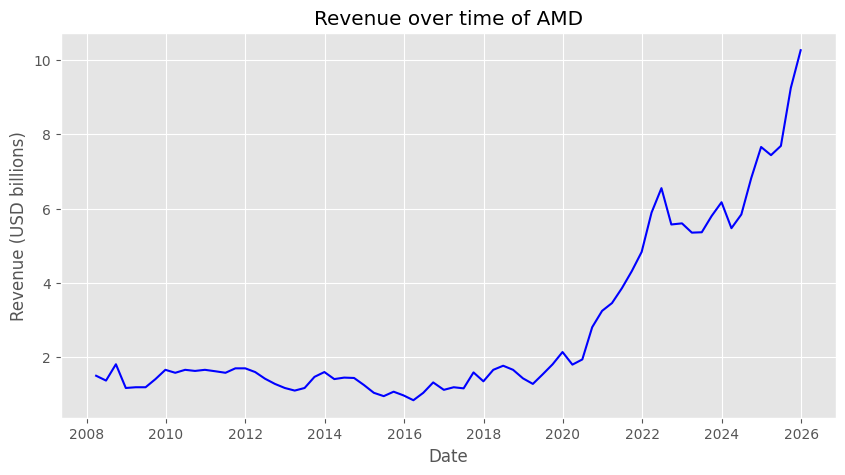

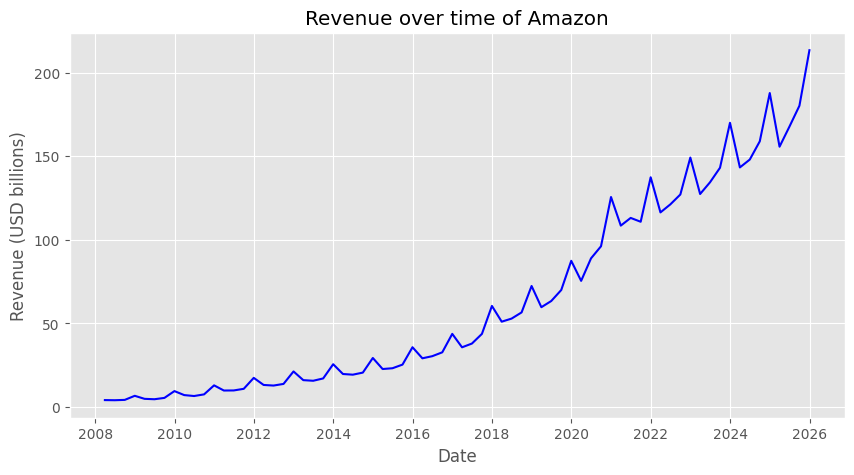

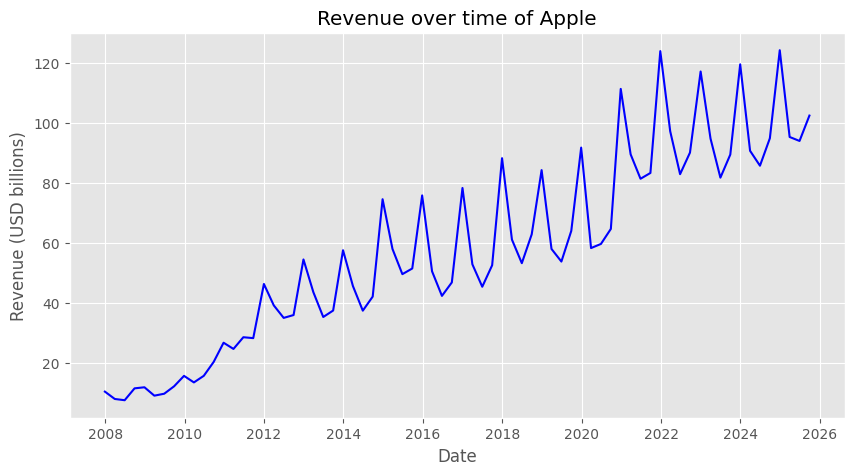

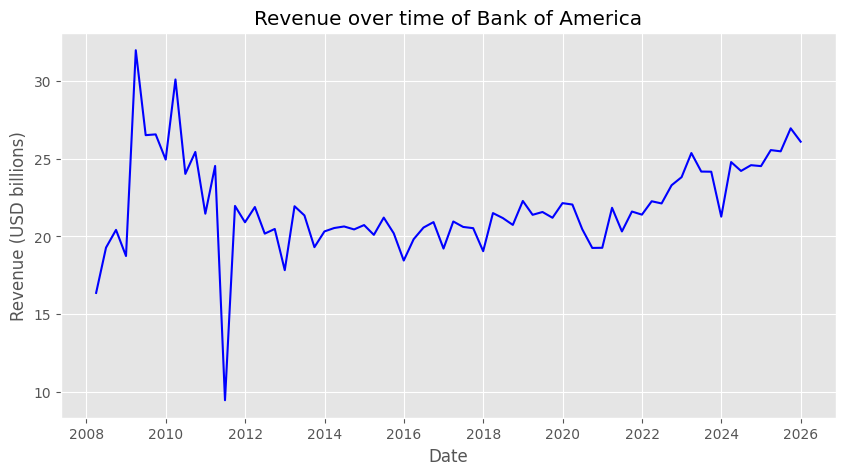

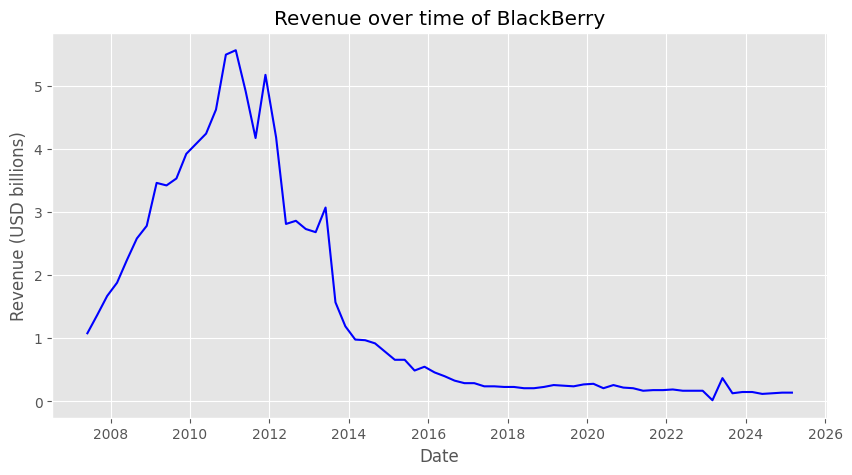

...

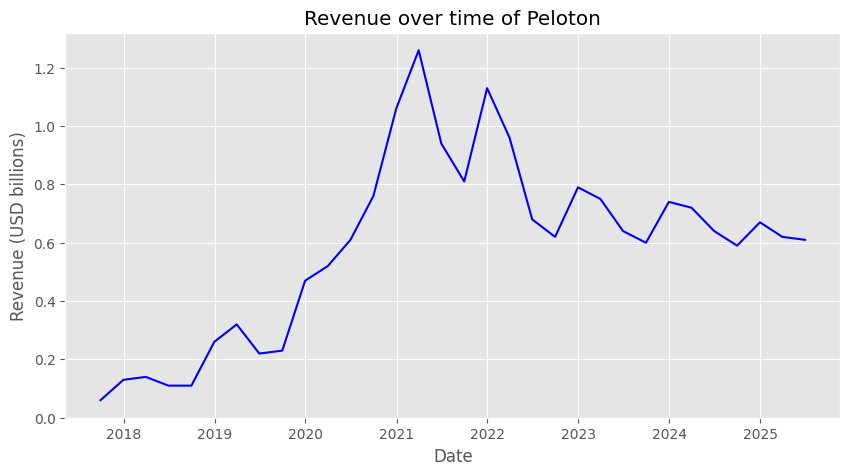

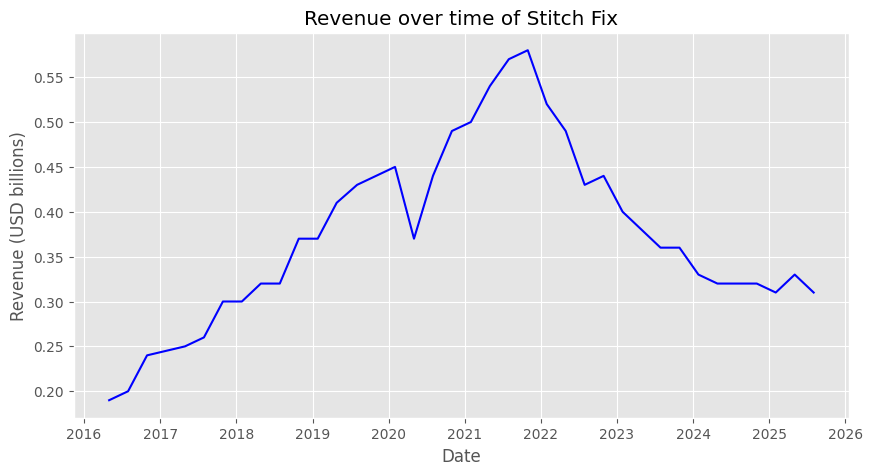

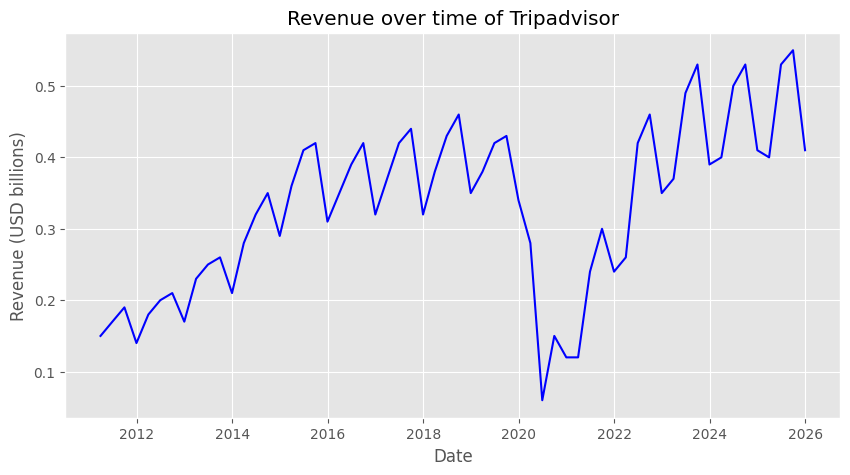

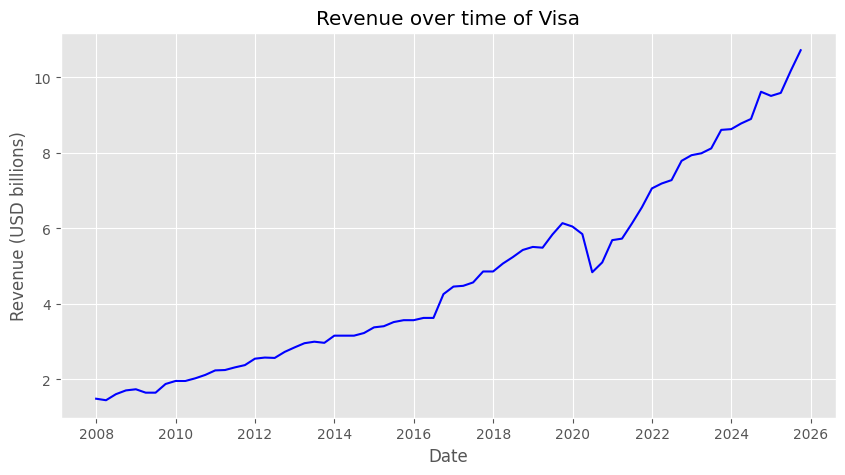

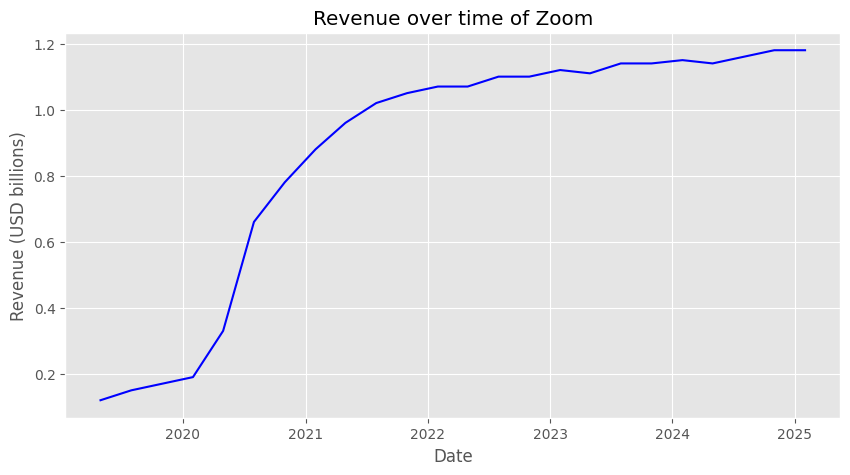

In [32]:
for company in data["company"].unique():
    ts=data[data["company"]==company].sort_values("date")
    plt.figure(figsize=(10,5))
    plt.plot(ts["date"], ts["revenue"], color="blue")
    plt.title(f"Revenue over time of {company}")
    plt.xlabel("Date")
    plt.ylabel("Revenue (USD billions)")
    plt.grid(True)
    plt.show()

In [33]:
for company in data["company"].unique():
    ts = data[data["company"]==company]["revenue"]
    print(f"{company}:")
    print(ts.describe())


AMD:
count    72.000000
mean      2.780139
std       2.310024
min       0.830000
25%       1.300000
50%       1.615000
75%       3.965000
max      10.270000
Name: revenue, dtype: float64
Amazon:
count     72.000000
mean      63.673333
std       58.351910
min        4.060000
25%       15.227500
50%       36.855000
75%      113.925000
max      213.400000
Name: revenue, dtype: float64
Apple:
count     72.000000
mean      58.246111
std       31.950109
min        7.560000
25%       35.807500
50%       54.160000
75%       84.677500
max      124.300000
Name: revenue, dtype: float64
Bank of America:
count    72.000000
mean     21.899306
std       3.095237
min       9.470000
25%      20.442500
50%      21.370000
75%      24.055000
max      31.970000
Name: revenue, dtype: float64
BlackBerry:
count    72.000000
mean      1.408611
std       1.640019
min       0.020000
25%       0.210000
50%       0.430000
75%       2.692500
max       5.560000
Name: revenue, dtype: float64
Boeing:
count    72.00000

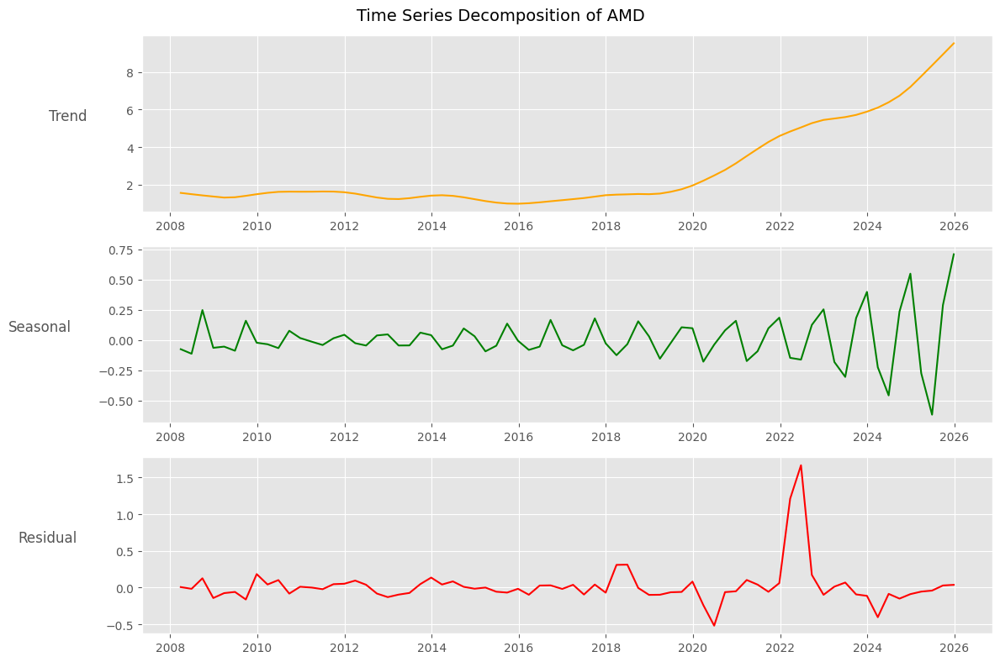

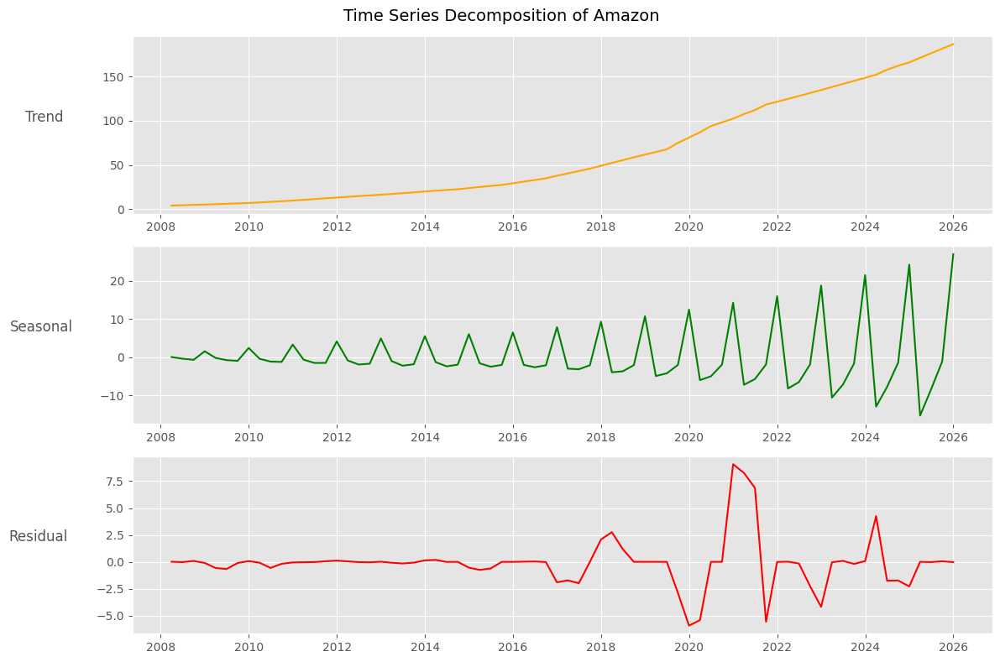

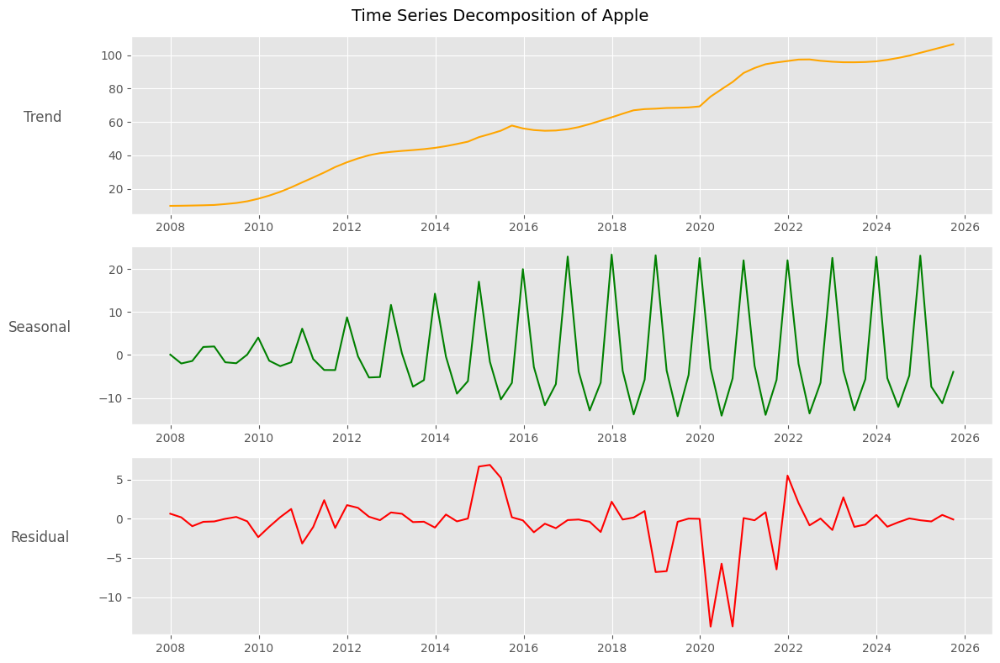

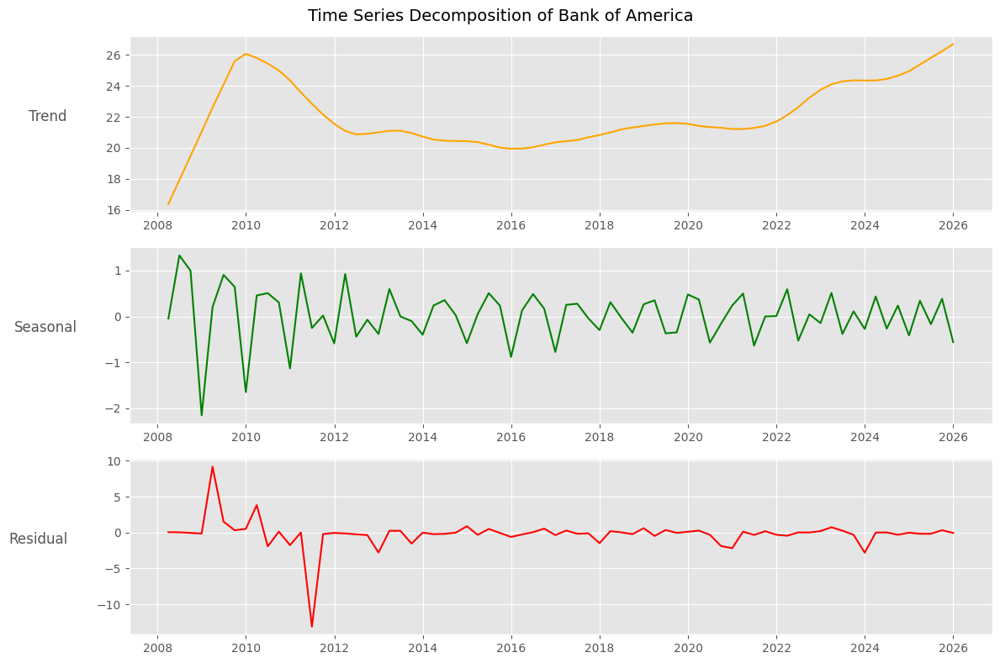

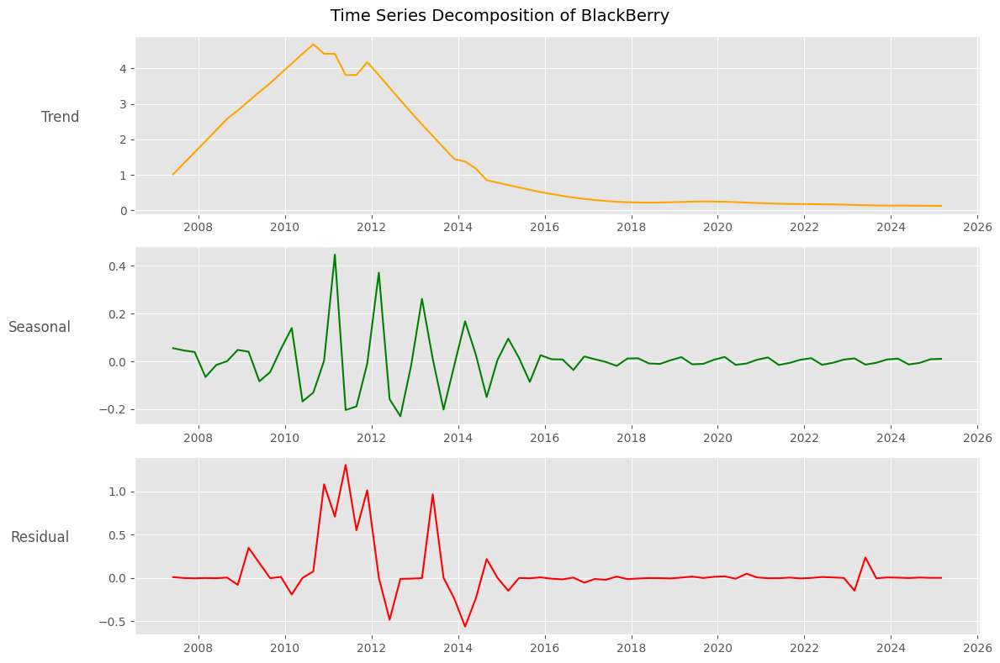

...

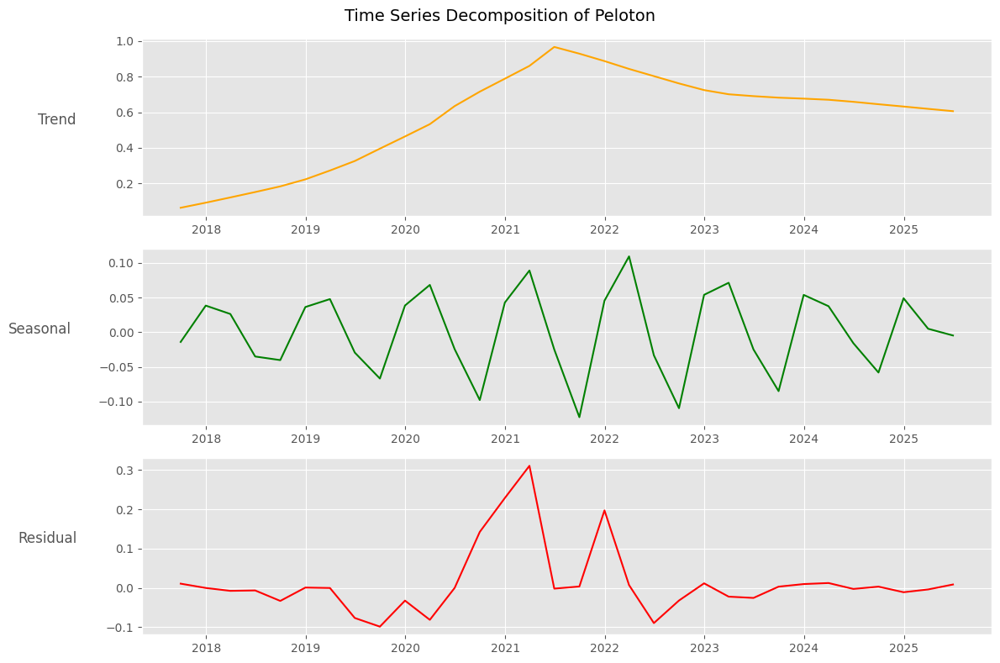

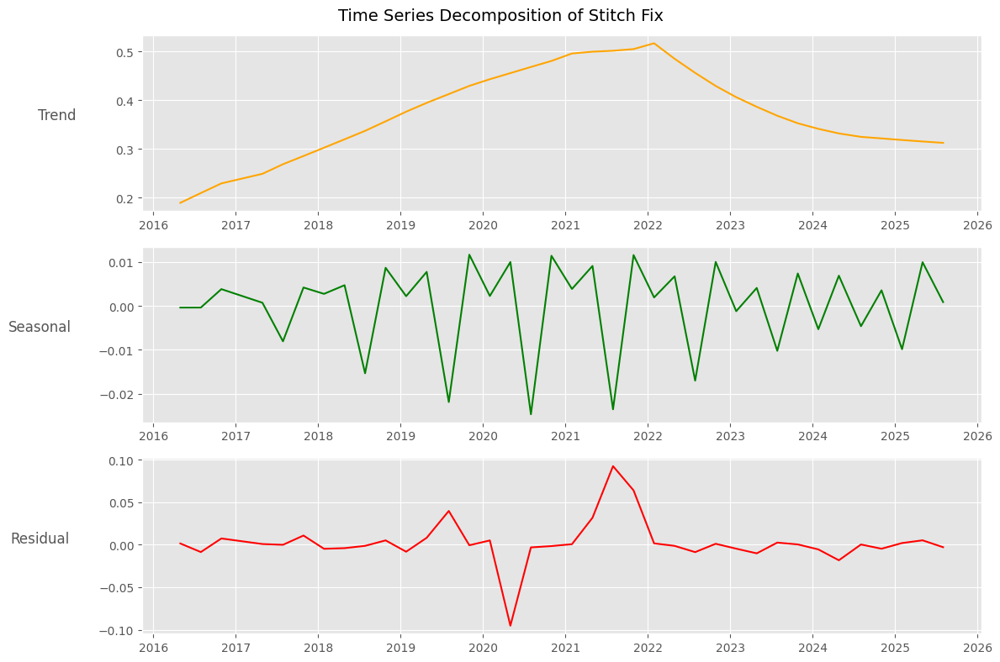

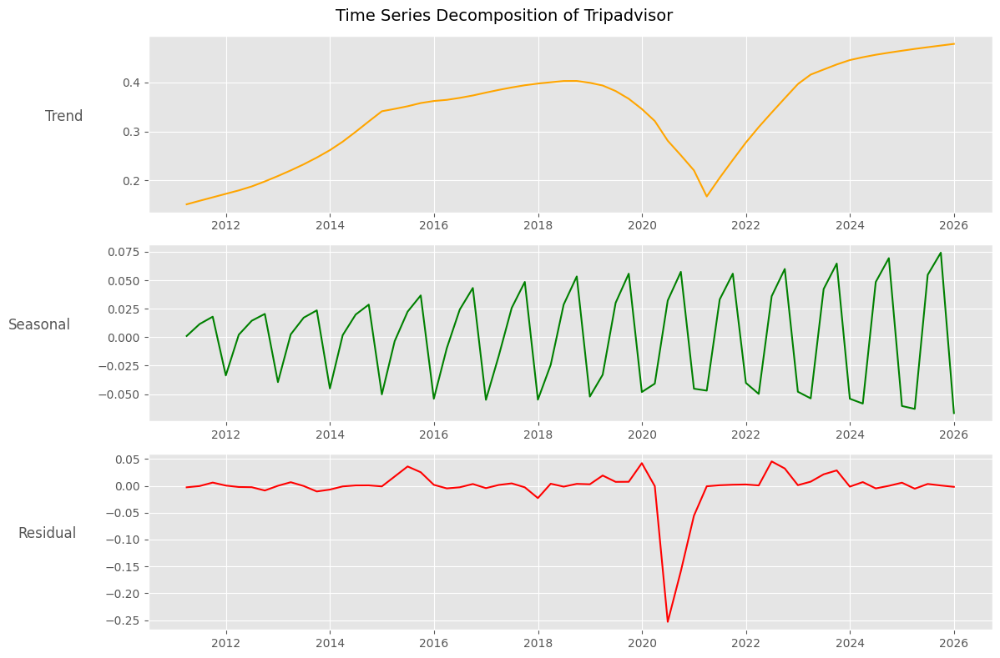

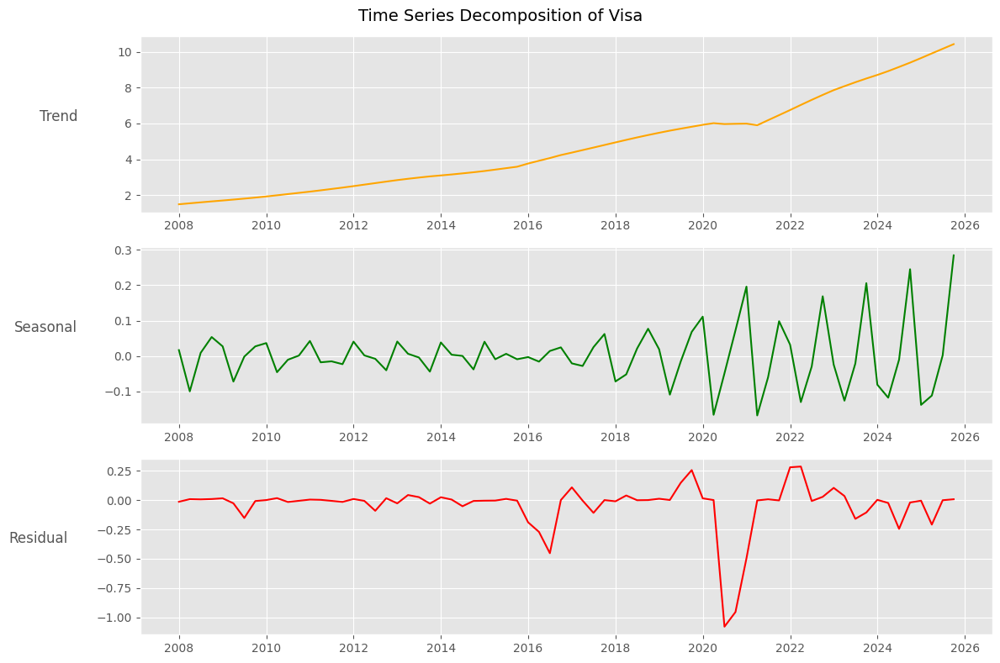

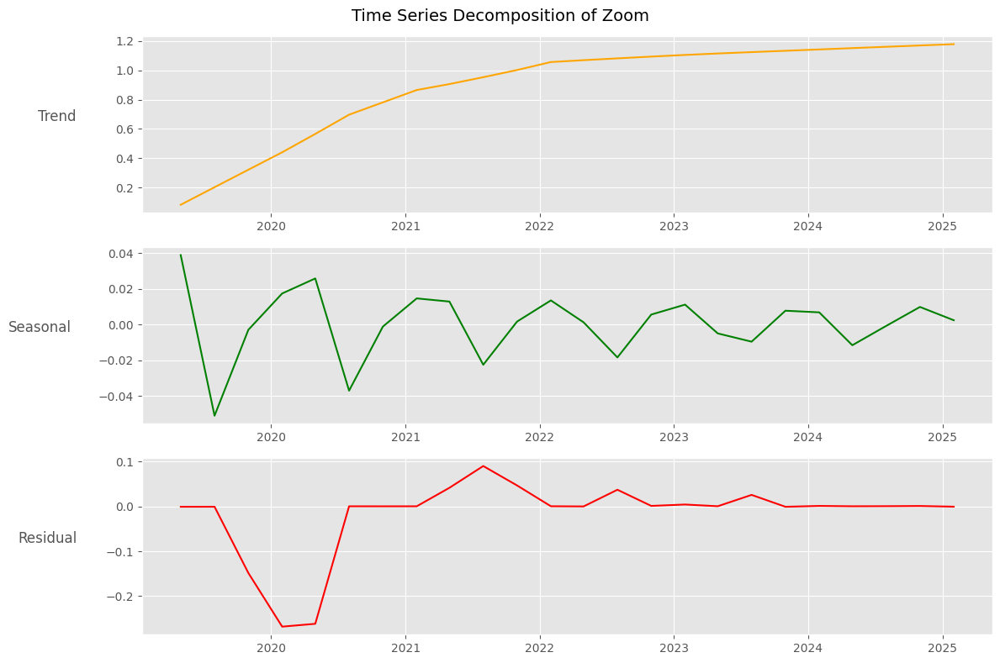

In [34]:
from statsmodels.tsa.seasonal import STL

for company in data["company"].unique():
    ts=(
        data[data["company"]==company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )

    stl=STL(
        ts,
        period=4,
        robust=True
    )
    result=stl.fit()
    
    fig,axes = plt.subplots(3, 1, figsize=(12, 8))

    axes[0].plot(result.trend, label="Trend", color="orange")
    axes[0].set_ylabel("Trend", rotation=0, labelpad=50, va="center")
    axes[0].yaxis.set_label_position("left")

    axes[1].plot(result.seasonal, label="Seasonal", color="green")
    axes[1].set_ylabel("Seasonal", rotation=0, labelpad=50, va="center")
    axes[1].yaxis.set_label_position("left")

    axes[2].plot(result.resid, label="Residual", color="red")
    axes[2].set_ylabel("Residual", rotation=0, labelpad=50, va="center")
    axes[2].yaxis.set_label_position("left")

    plt.suptitle(f"Time Series Decomposition of {company}", fontsize=14)
    plt.tight_layout()
    plt.show()

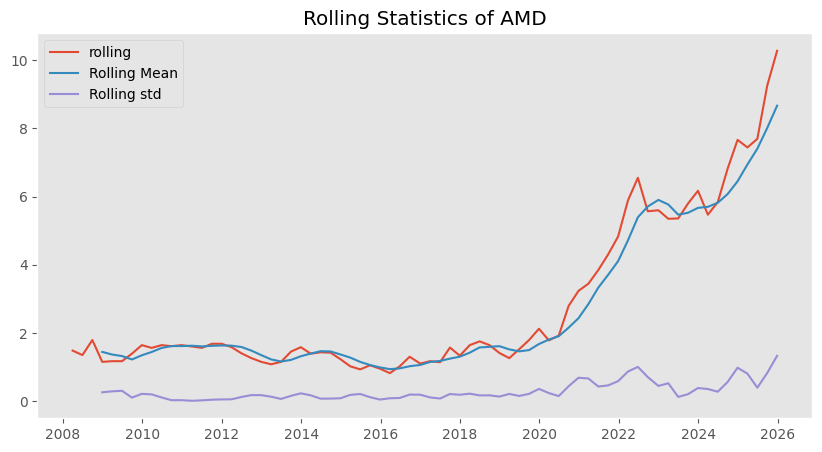

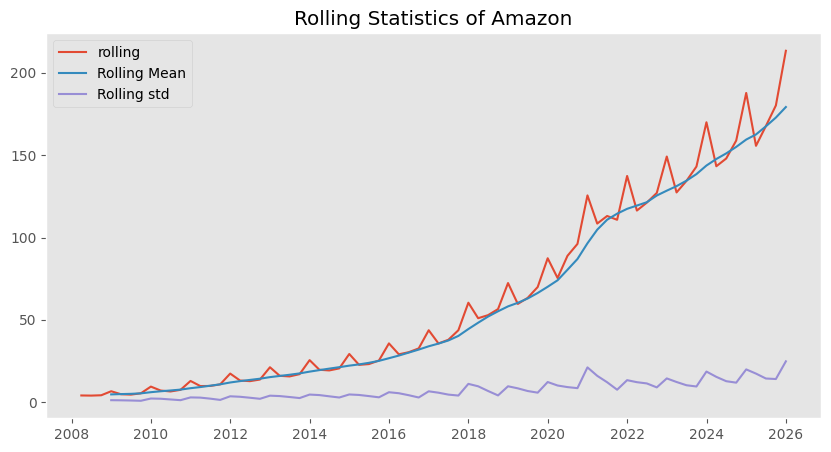

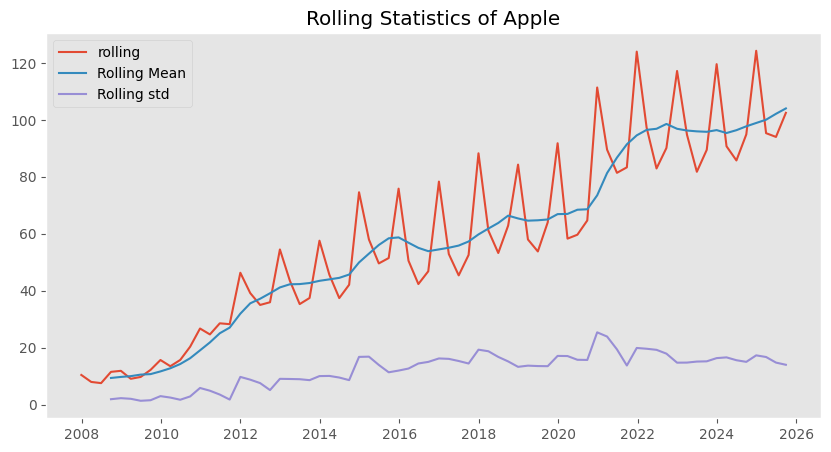

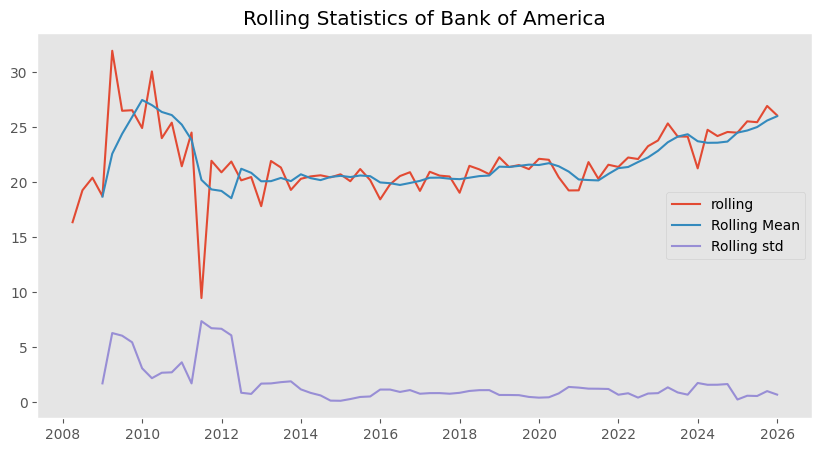

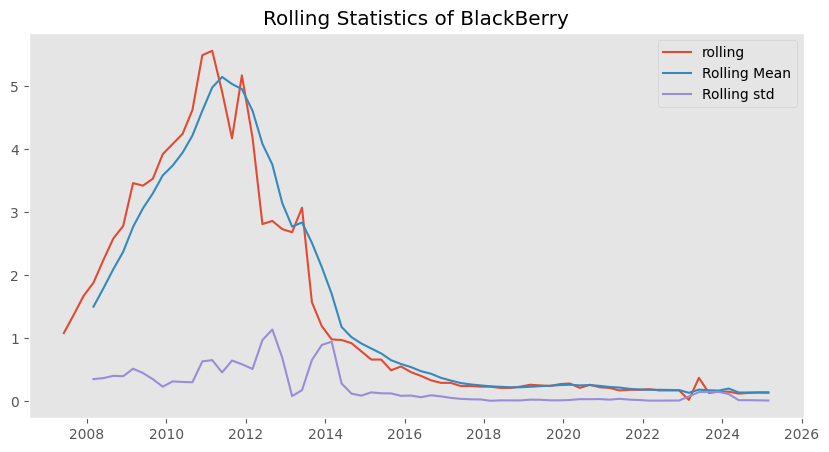

...

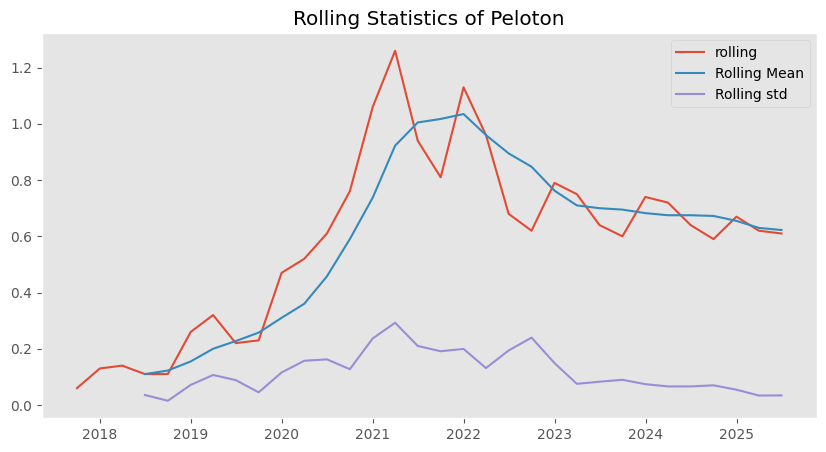

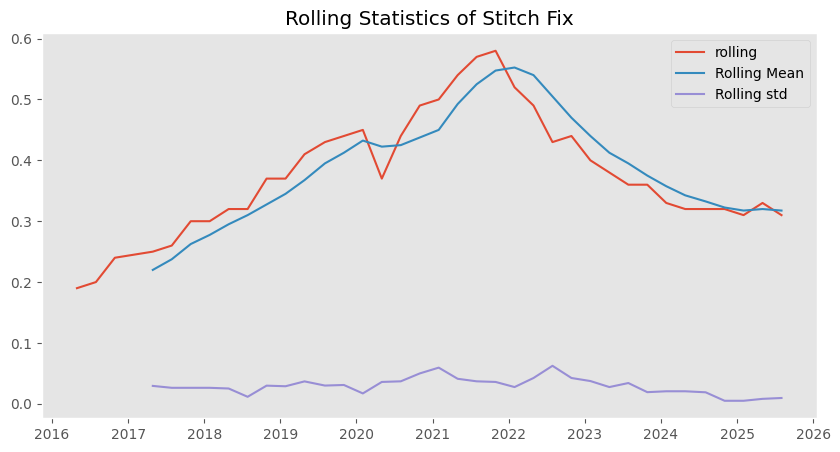

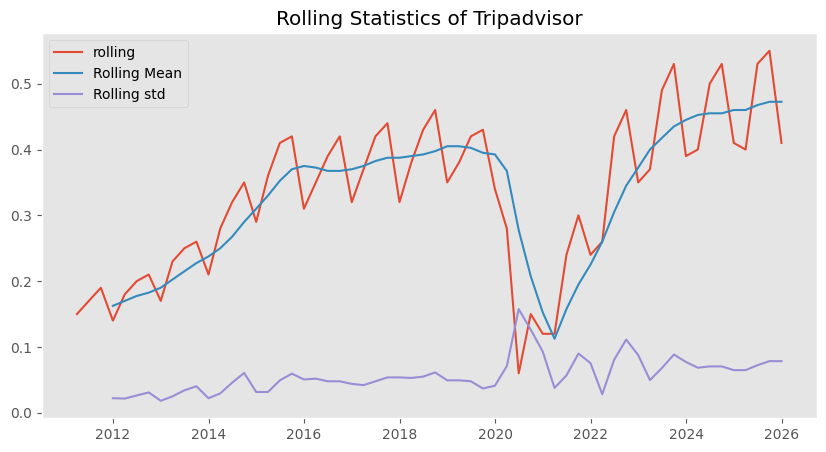

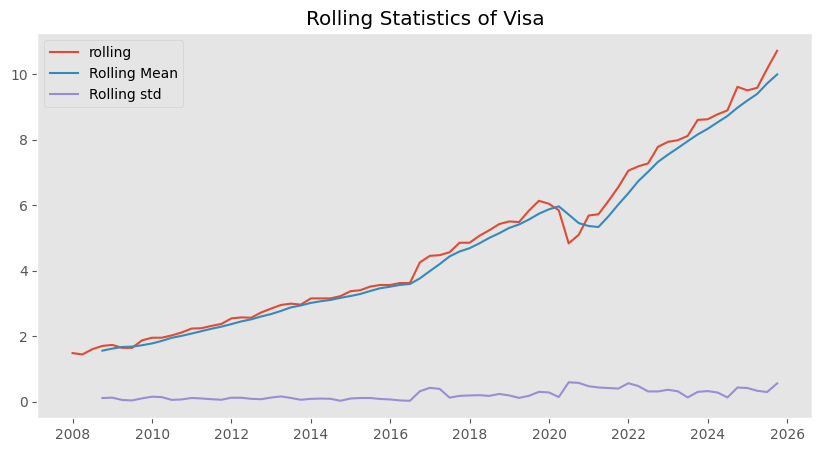

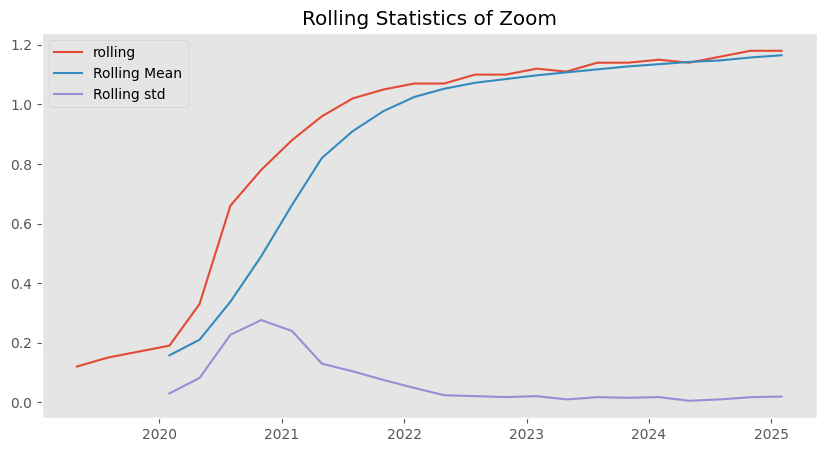

In [35]:
window = 4
for company in data["company"].unique():
    ts=(
        data[data["company"]==company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    rolling_mean=ts.rolling(window).mean()
    rolling_std=ts.rolling(window).std()

    plt.figure(figsize=(10,5))
    plt.plot(ts, label="rolling")
    plt.plot(rolling_mean,label="Rolling Mean")
    plt.plot(rolling_std,label="Rolling std")
    plt.title(f"Rolling Statistics of {company}")
    plt.legend()
    plt.grid()
    plt.show()

In [36]:
window = 4
for company in data["company"].unique():
    ts = data[data["company"]==company]["revenue"]
    last_mean = ts.tail(window).mean()
    last_std = ts.tail(window).std()
    
    print(f"{company}: Rolling mean = {last_mean:,.0f}, std = {last_std:,.0f}")


AMD: Rolling mean = 9, std = 1
Amazon: Rolling mean = 179, std = 25
Apple: Rolling mean = 104, std = 14
Bank of America: Rolling mean = 26, std = 1
BlackBerry: Rolling mean = 0, std = 0
Boeing: Rolling mean = 22, std = 2
Chevron: Rolling mean = 46, std = 2
Exxon: Rolling mean = 81, std = 2
GameStop: Rolling mean = 1, std = 0
Gap: Rolling mean = 4, std = 0
Hilton: Rolling mean = 1, std = 0
Intel: Rolling mean = 13, std = 1
JPMorgan: Rolling mean = 45, std = 1
Marriott: Rolling mean = 2, std = 0
Microsoft: Rolling mean = 70, std = 4
NVIDIA: Rolling mean = 33, std = 6
Peloton: Rolling mean = 1, std = 0
Stitch Fix: Rolling mean = 0, std = 0
Tripadvisor: Rolling mean = 0, std = 0
Visa: Rolling mean = 10, std = 1
Zoom: Rolling mean = 1, std = 0


In [37]:
for company in data_qc["company"].unique():
    ts = data_qc[data_qc["company"]==company]
    n_outliers = ts["is_outlier_iqr"].sum()
    total = len(ts)
    print(f"{company}: {n_outliers} outliers ({n_outliers/total:.1%})")


AMD: 2 outliers (2.8%)
Amazon: 0 outliers (0.0%)
Apple: 0 outliers (0.0%)
Bank of America: 3 outliers (4.2%)
BlackBerry: 0 outliers (0.0%)
Boeing: 0 outliers (0.0%)
Chevron: 1 outliers (1.4%)
Exxon: 0 outliers (0.0%)
GameStop: 8 outliers (11.1%)
Gap: 1 outliers (1.4%)
Hilton: 0 outliers (0.0%)
Intel: 1 outliers (1.4%)
JPMorgan: 8 outliers (11.1%)
Marriott: 0 outliers (0.0%)
Microsoft: 0 outliers (0.0%)
NVIDIA: 7 outliers (9.7%)
Peloton: 0 outliers (0.0%)
Stitch Fix: 0 outliers (0.0%)
Tripadvisor: 0 outliers (0.0%)
Visa: 0 outliers (0.0%)
Zoom: 2 outliers (8.3%)


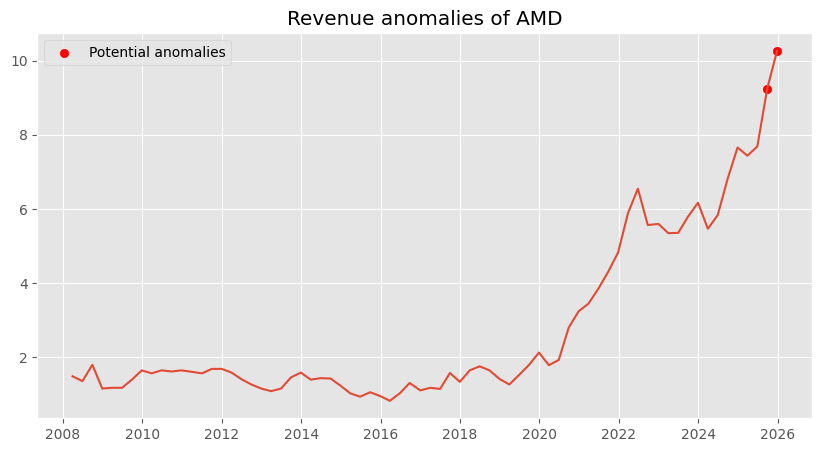

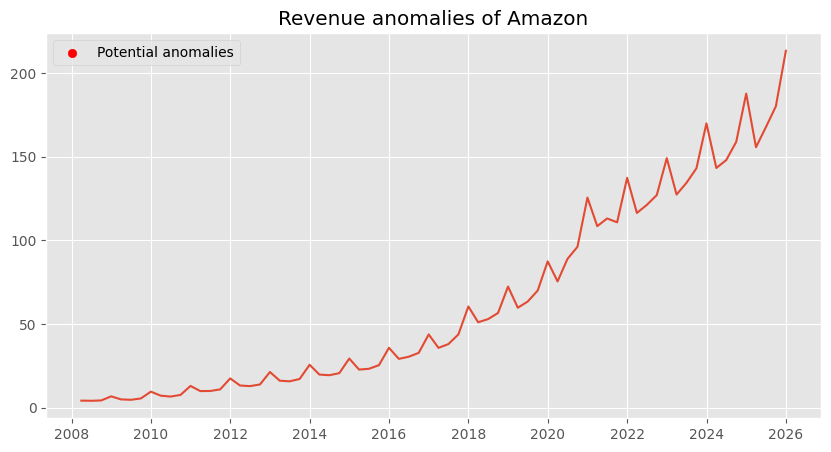

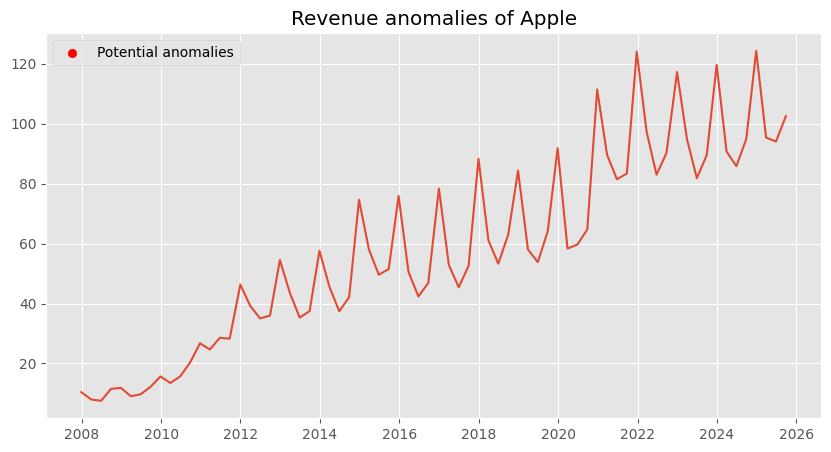

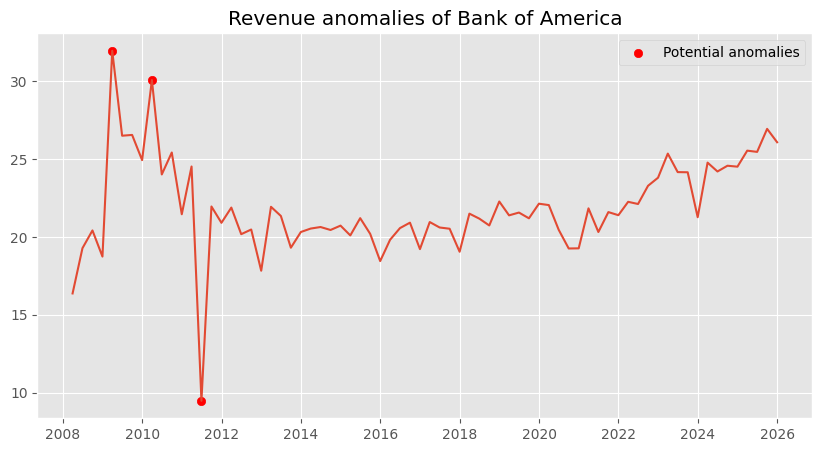

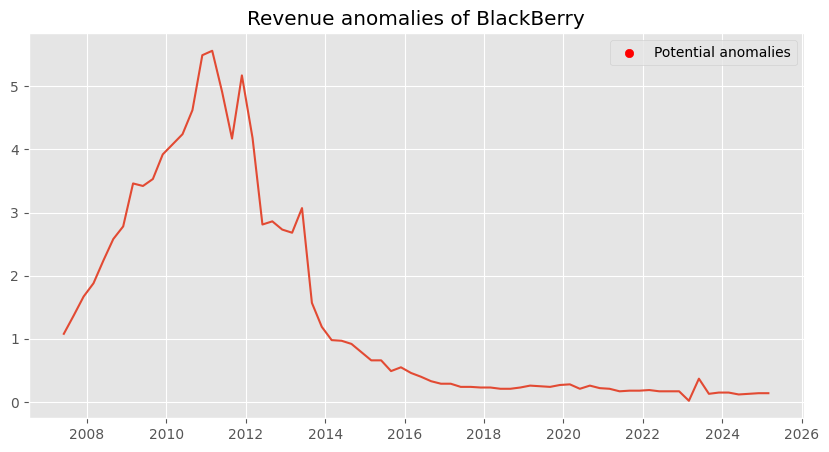

...

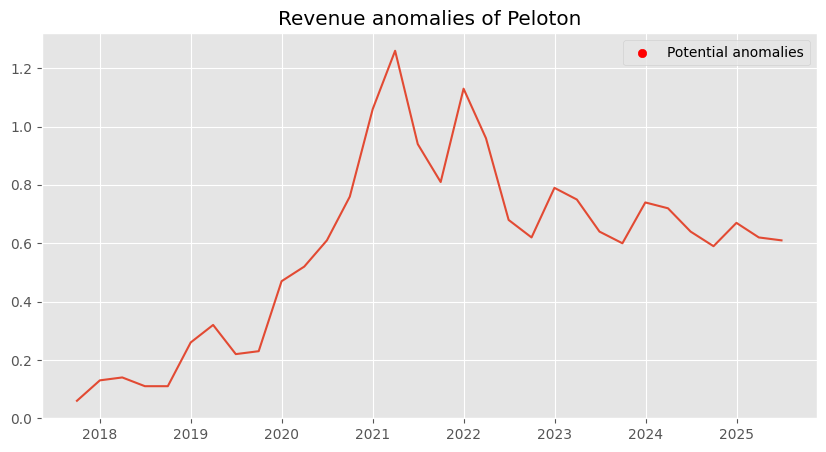

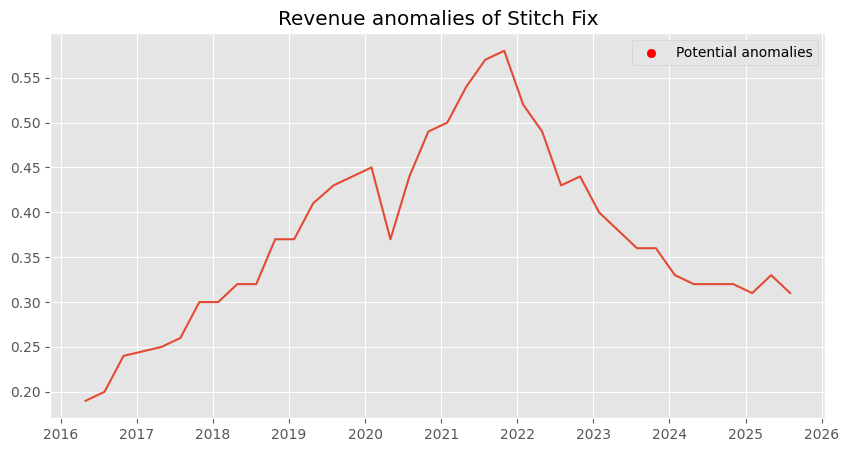

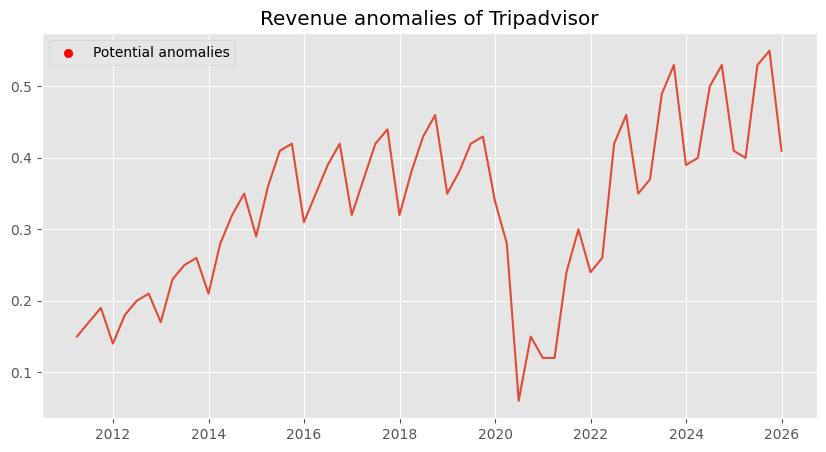

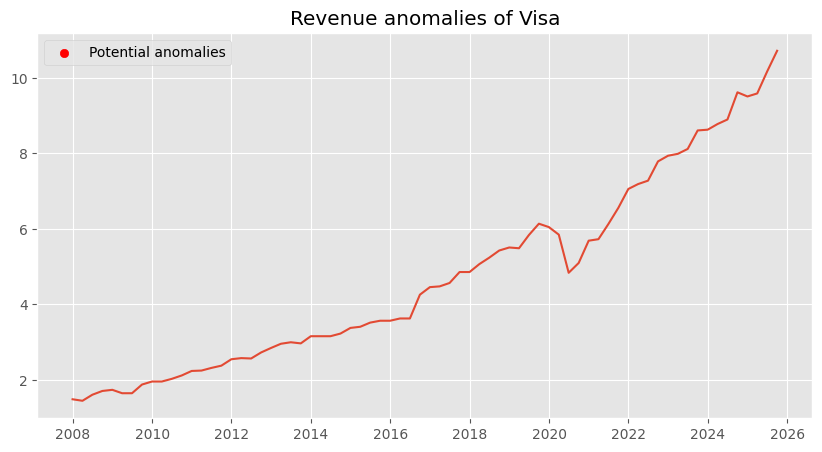

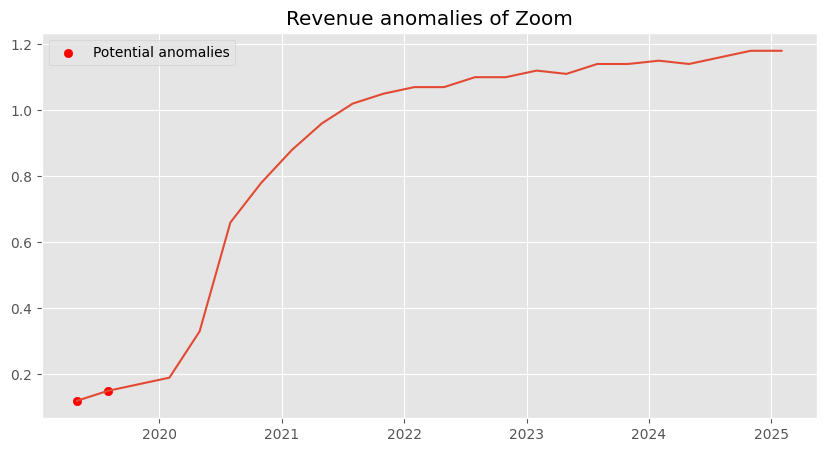

In [38]:
for company in data_qc["company"].unique():
    ts = data_qc[data_qc["company"]==company].sort_values("date")
    plt.figure(figsize=(10,5))
    plt.plot(ts["date"], ts["revenue"])
    plt.scatter(
        ts.loc[ts["is_outlier_iqr"], "date"],
        ts.loc[ts["is_outlier_iqr"], "revenue"],
        color="red",
        label="Potential anomalies"
    )
    plt.title(f"Revenue anomalies of {company}")
    plt.legend()
    plt.grid(True)
    plt.show()


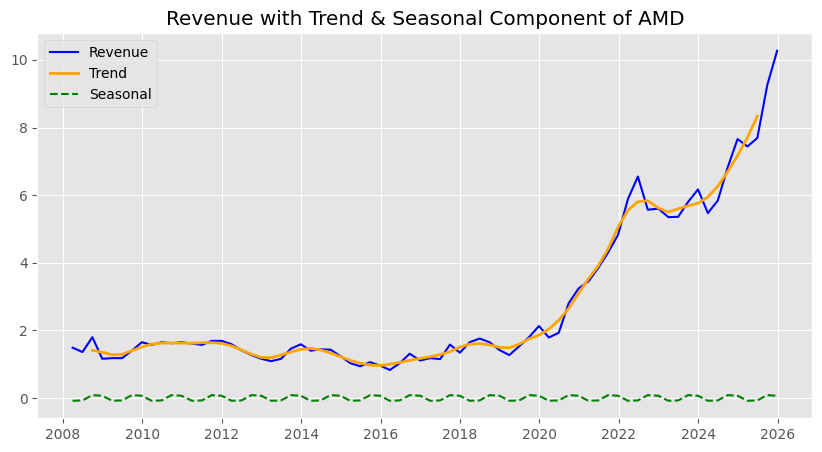

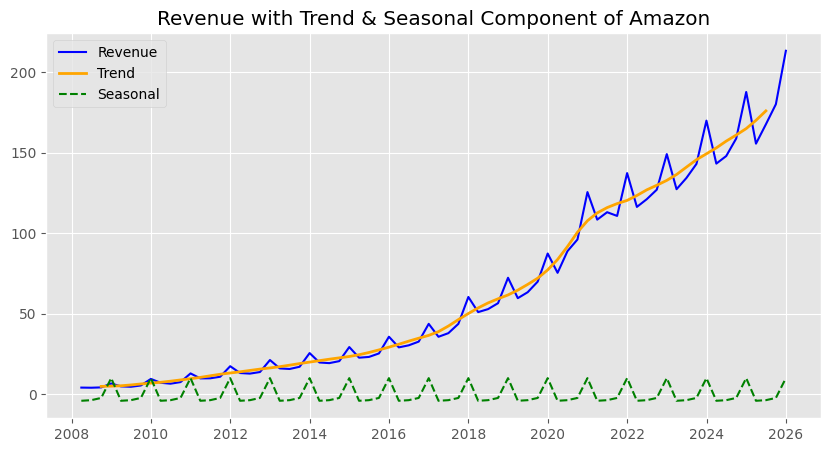

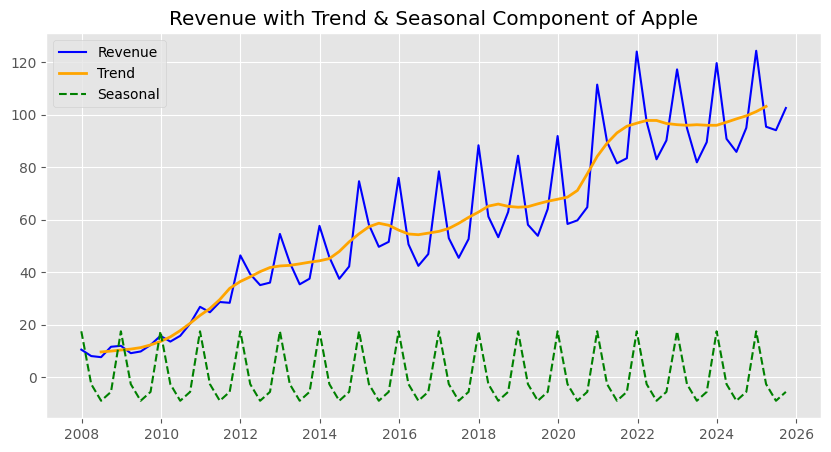

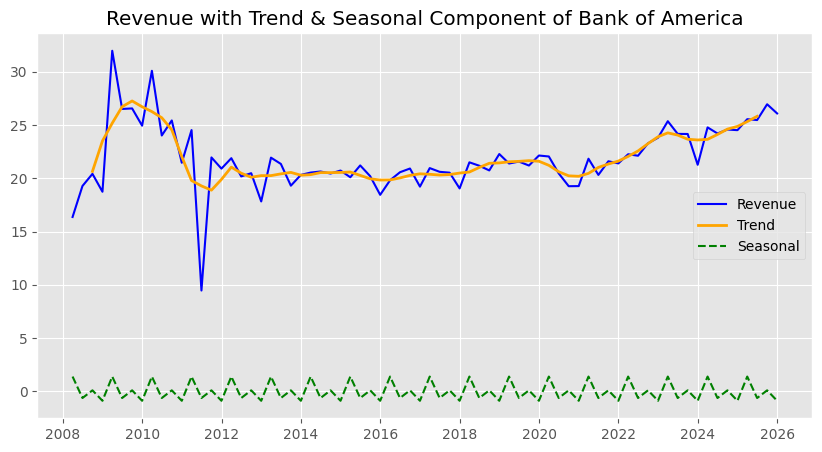

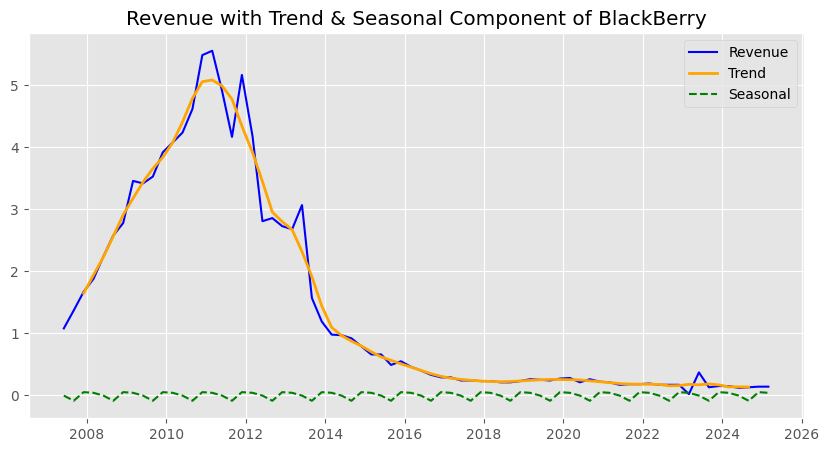

...

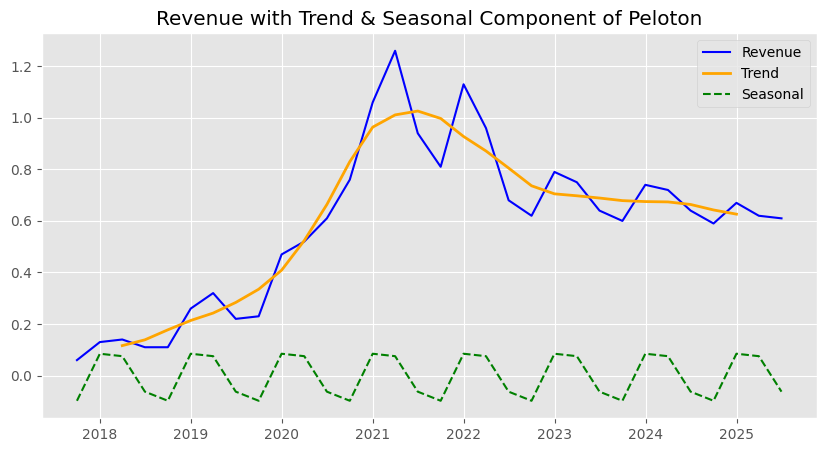

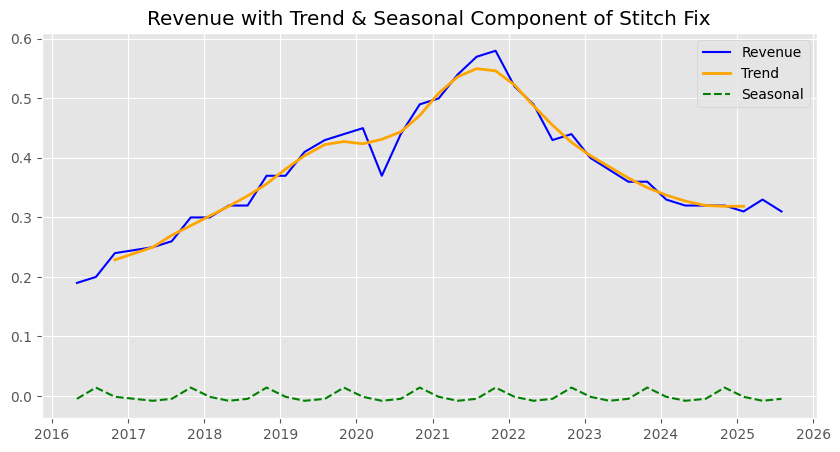

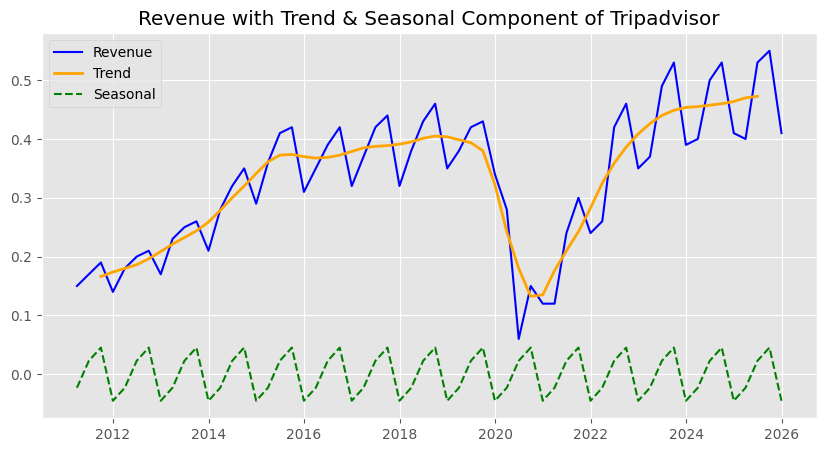

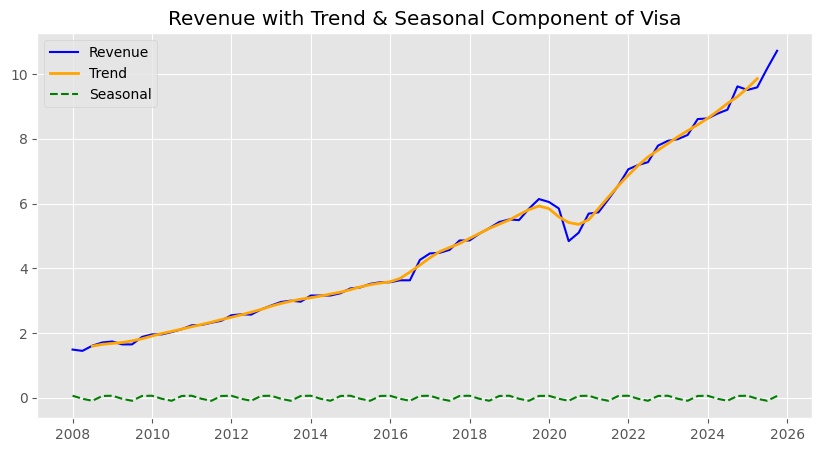

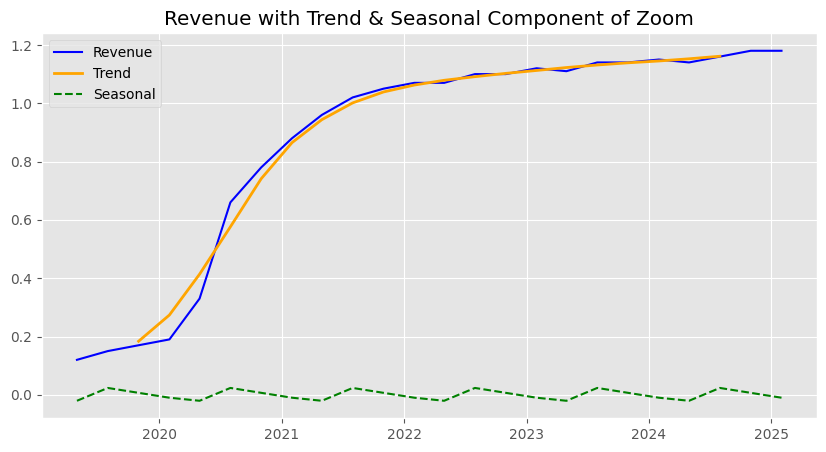

In [39]:
from statsmodels.tsa.seasonal import seasonal_decompose

for company in data["company"].unique():
    ts=data_qc[data_qc["company"]==company].sort_values("date").set_index("date")["revenue"]
    decomposition=seasonal_decompose(
        ts,
        model="additive",
        period=4
    )
    plt.figure(figsize=(10,5))
    plt.plot(ts, label="Revenue", color="blue")
    plt.plot(decomposition.trend, label="Trend", color="orange", linewidth=2)
    plt.plot(decomposition.seasonal, label="Seasonal", color="green", linestyle="--")
    plt.title(f"Revenue with Trend & Seasonal Component of {company}")
    plt.legend()
    plt.grid(True)
    plt.show()

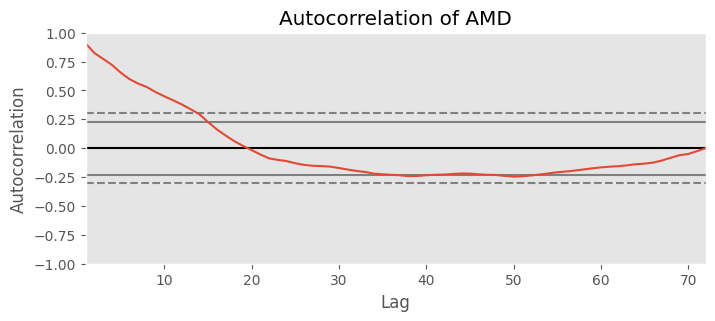

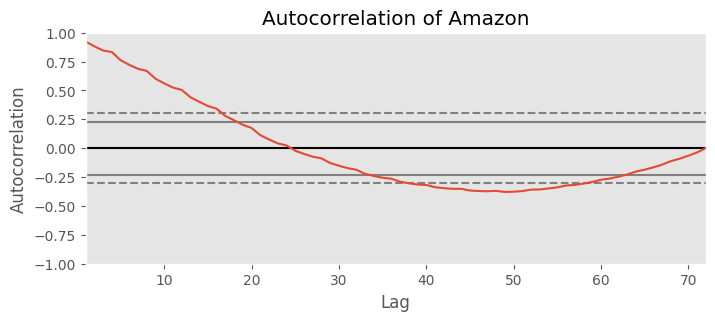

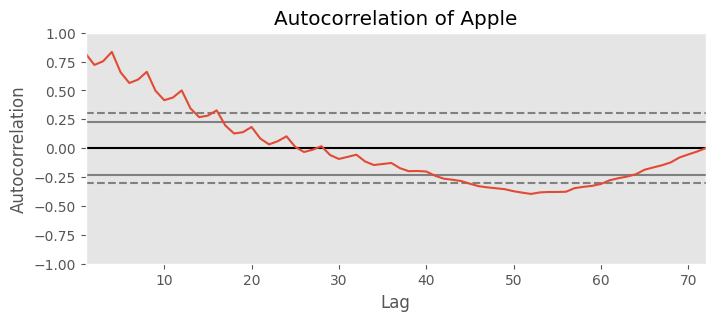

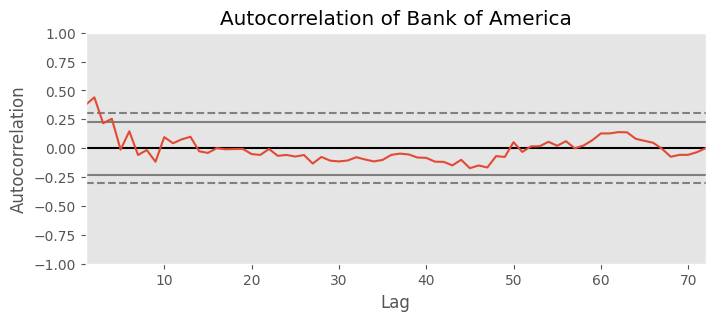

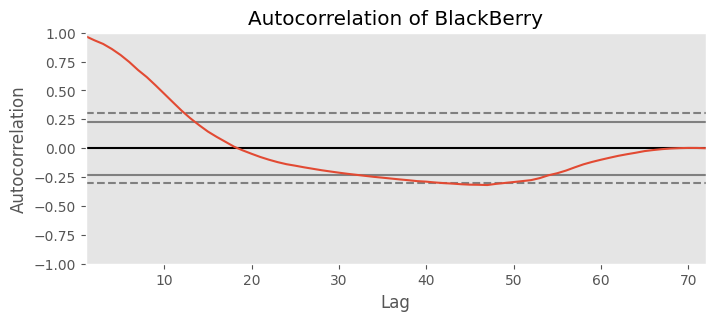

...

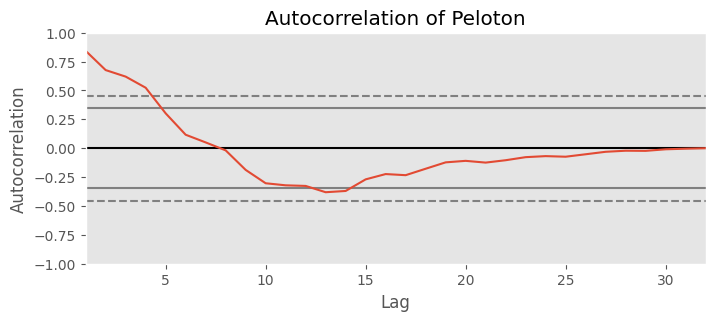

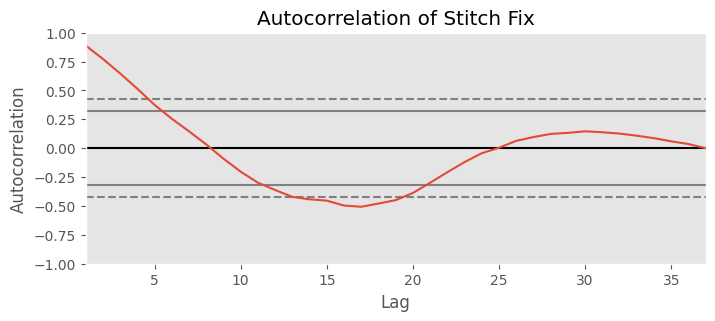

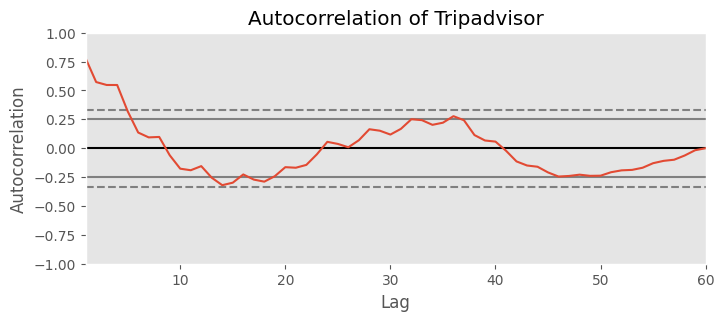

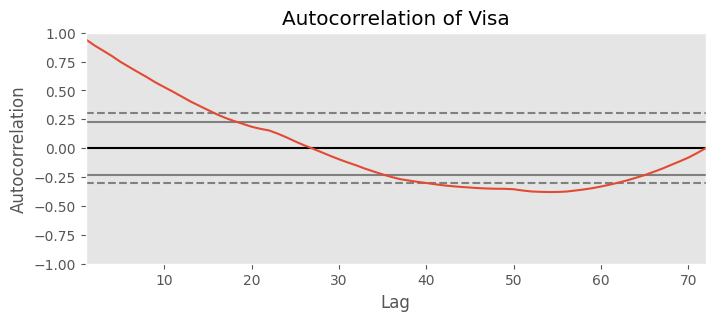

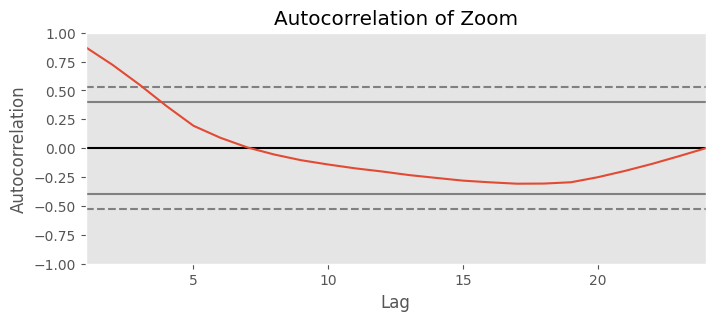

In [40]:
from pandas.plotting import autocorrelation_plot

for company in data["company"].unique():
    ts=data_qc[data_qc["company"]==company].sort_values("date").set_index("date")["revenue"]
    plt.figure(figsize=(8,3))
    autocorrelation_plot(ts)
    plt.title(f"Autocorrelation of {company}")
    plt.show()

In [41]:
for company in data["company"].unique():
    ts = data[data["company"]==company]["revenue"]
    growth = ts.pct_change() * 100
    print(f"{company}'s Average growth: {growth.mean():.2f}%, Max growth: {growth.max():.2f}%")


AMD's Average growth: 3.76%, Max growth: 45.08%
Amazon's Average growth: 8.01%, Max growth: 74.68%
Apple's Average growth: 6.88%, Max growth: 77.11%
Bank of America's Average growth: 2.37%, Max growth: 131.89%
BlackBerry's Average growth: 21.17%, Max growth: 1750.00%
Boeing's Average growth: 1.28%, Max growth: 30.33%
Chevron's Average growth: 0.59%, Max growth: 48.70%
Exxon's Average growth: 0.57%, Max growth: 40.74%
GameStop's Average growth: 8.60%, Max growth: 112.00%
Gap's Average growth: 1.76%, Max growth: 55.45%
Hilton's Average growth: 3.06%, Max growth: 116.67%
Intel's Average growth: 0.85%, Max growth: 17.08%
JPMorgan's Average growth: 1.82%, Max growth: 45.27%
Marriott's Average growth: 3.74%, Max growth: 80.77%
Microsoft's Average growth: 3.27%, Max growth: 47.21%
NVIDIA's Average growth: 6.95%, Max growth: 87.90%
Peloton's Average growth: 13.09%, Max growth: 136.36%
Stitch Fix's Average growth: 1.72%, Max growth: 20.00%
Tripadvisor's Average growth: 6.29%, Max growth: 150.00

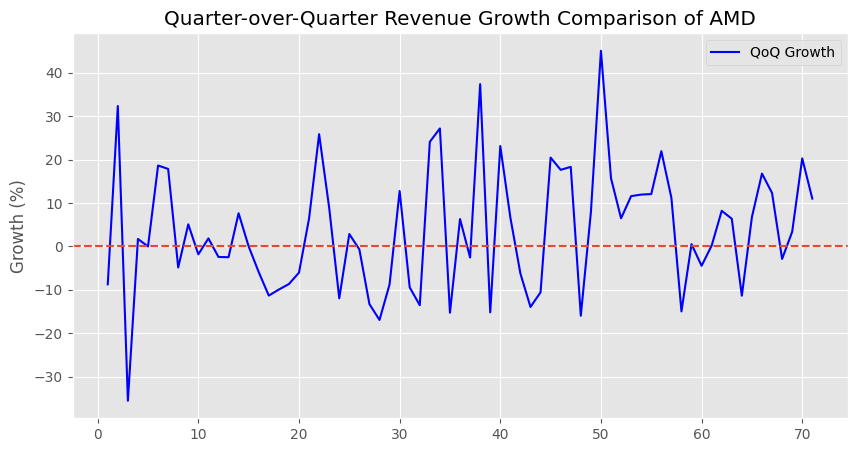

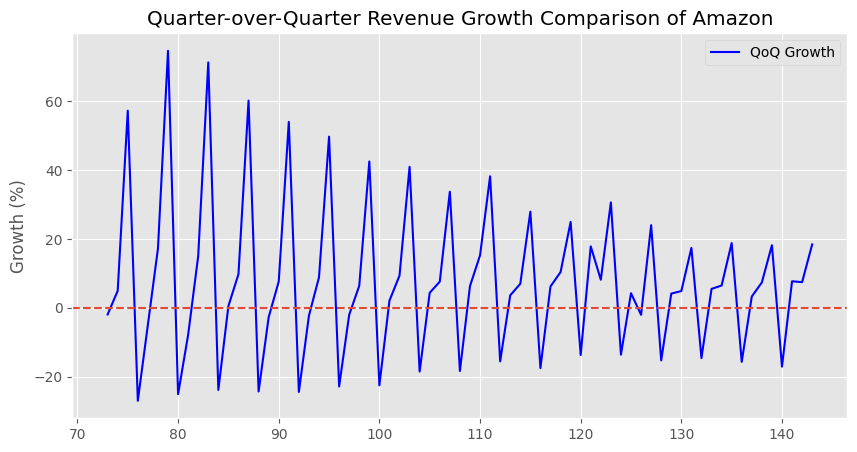

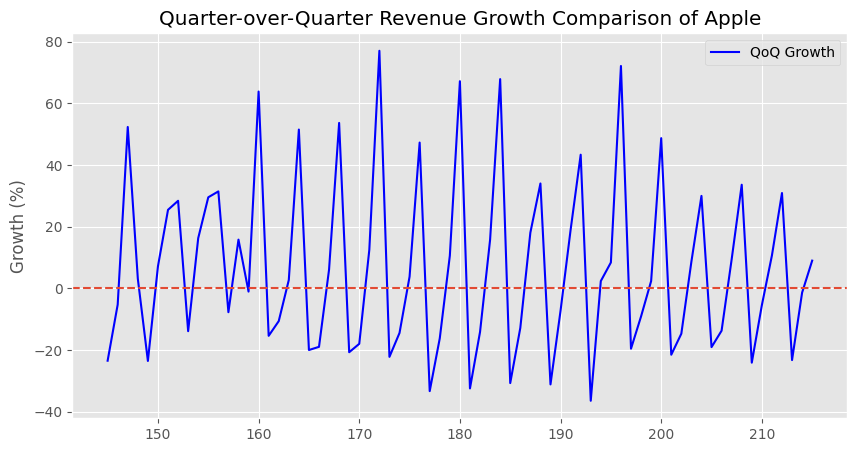

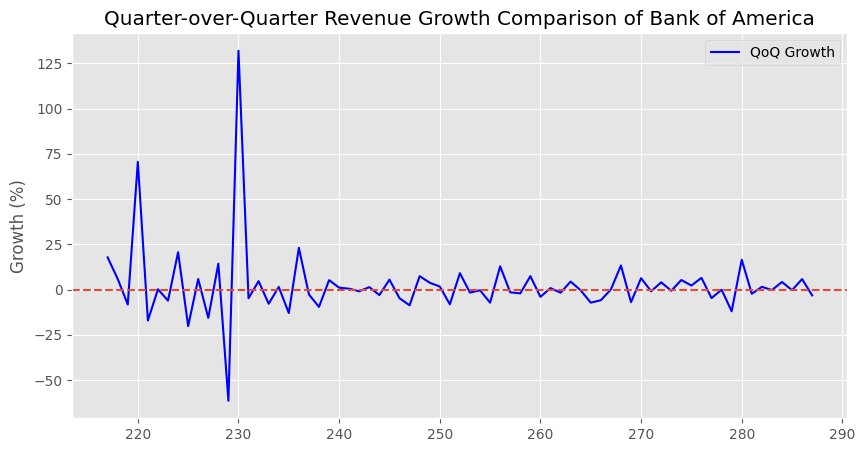

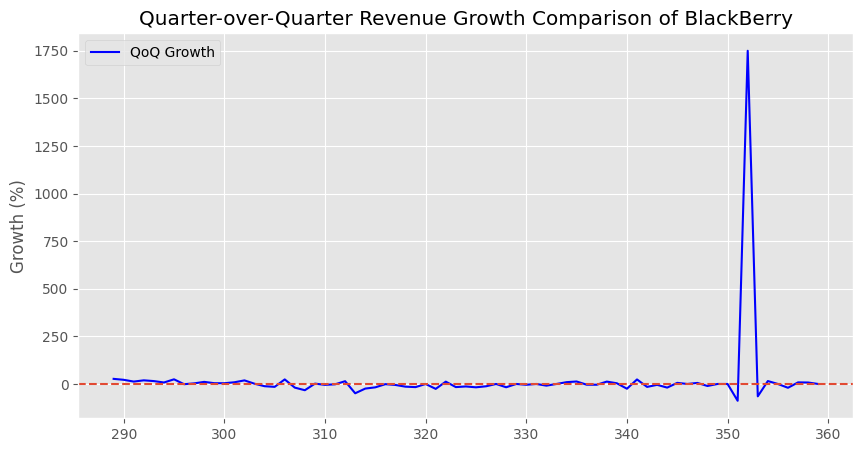

...

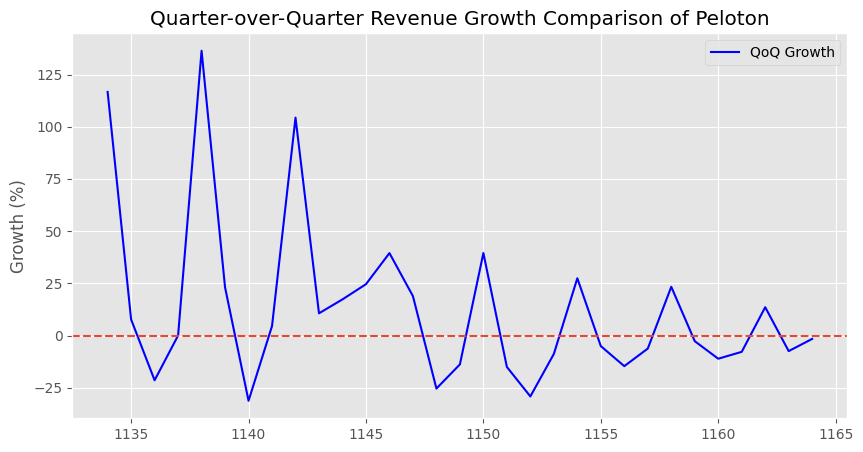

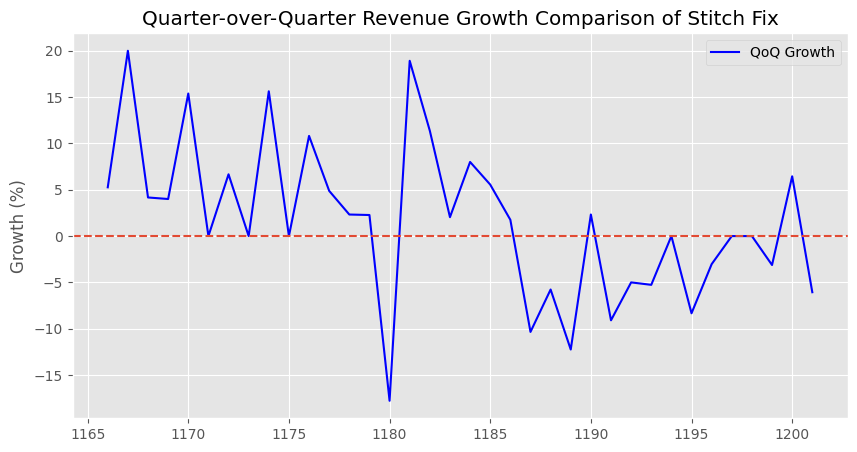

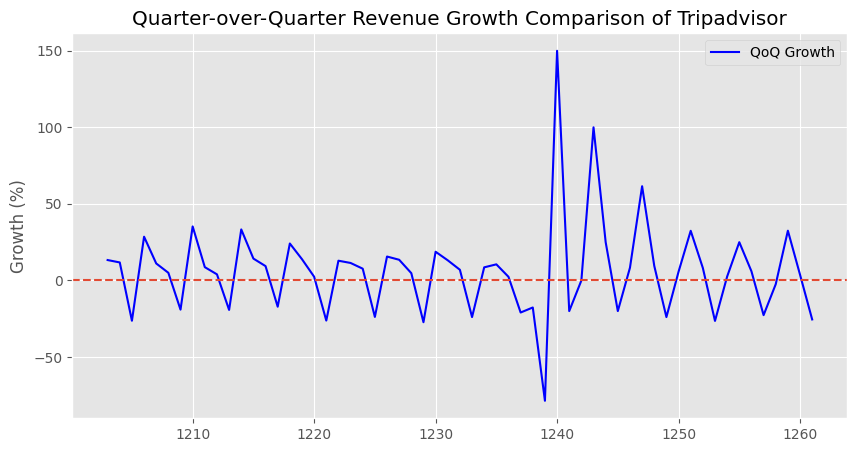

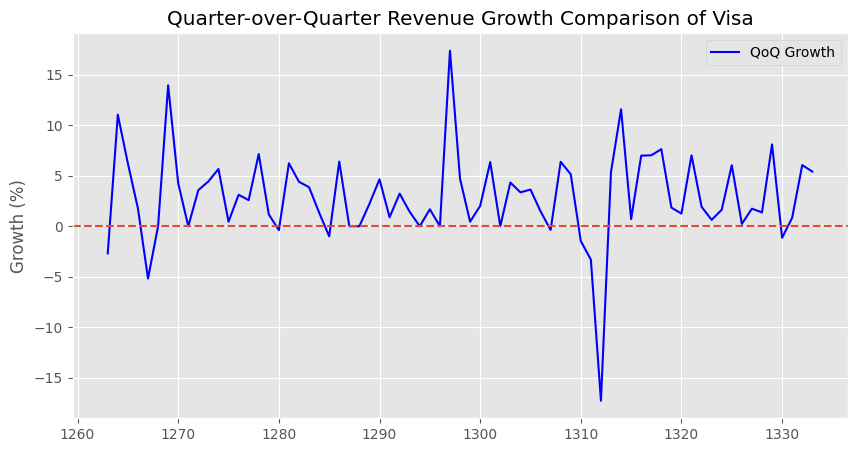

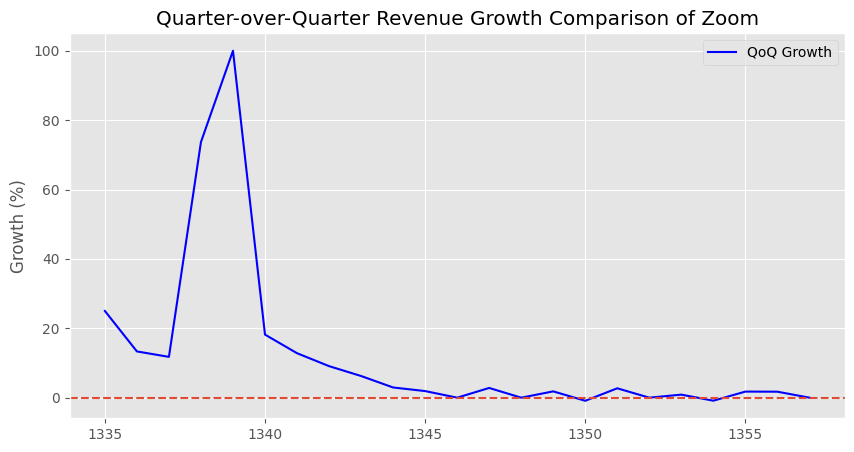

In [42]:
for company in data["company"].unique():
    ts=data[data["company"]==company]["revenue"]
    growth = ts.pct_change() * 100
    plt.figure(figsize=(10,5))
    plt.plot(growth, label="QoQ Growth", color="blue")
    plt.axhline(0, linestyle="--")
    plt.title(f"Quarter-over-Quarter Revenue Growth Comparison of {company}")
    plt.ylabel("Growth (%)")
    plt.legend()
    plt.grid(True)
    plt.show()

In [43]:
data.head()


,date,fiscal_year,fiscal_year_raw,revenue,revenue_unit,fiscal_quarter,fiscal_period,company
0,2008-03-29,2008,2008,1.49,USD billions,1,2008Q1,AMD
1,2008-06-28,2008,2008,1.36,USD billions,2,2008Q2,AMD
2,2008-09-27,2008,2008,1.80,USD billions,3,2008Q3,AMD
3,2008-12-27,2008,2008,1.16,USD billions,4,2008Q4,AMD
4,2009-03-28,2009,2009,1.18,USD billions,1,2009Q1,AMD


## 5. Stationarity: ADF test, differencing, ACF / PACF

In [44]:
# ADF test: H0 = the series has a unit root (not stationary). p < 0.05 means we reject it
from statsmodels.tsa.stattools import adfuller
import numpy as np

def check_stationarity(ts, company_name):
    
    ts_log = np.log(ts)
    
    result = adfuller(ts_log.dropna())
    p_value = result[1]
    
    print(f"\n{company_name}")
    print(f"ADF p-value: {p_value}")
    
    if p_value > 0.05:
        print("Not stationary → applying first differencing")
        ts_diff = ts_log.diff().dropna()
        
        result_diff = adfuller(ts_diff)
        print(f"After differencing p-value: {result_diff[1]}")
        
    else:
        print("Already stationary")
        ts_diff = ts_log
    
    return ts_log, ts_diff


In [45]:
from statsmodels.tsa.seasonal import STL, seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot
def plot_acf_pacf(ts_diff, company_name, lags=12):
    ts_diff = pd.Series(ts_diff).dropna()
    max_lags = max(1, (len(ts_diff) // 2) - 1)
    safe_lags = min(lags, max_lags)

    plt.figure(figsize=(12,5))
    plot_acf(ts_diff, lags=safe_lags)
    plt.title(f"ACF of {company_name} (Differenced Log Revenue)")
    plt.show()

    plt.figure(figsize=(12,5))
    plot_pacf(ts_diff, lags=safe_lags, method="ywm")
    plt.title(f"PACF of {company_name} (Differenced Log Revenue)")
    plt.show()



AMD
ADF p-value: 0.9881132114120105
Not stationary → applying first differencing
After differencing p-value: 2.744796079043999e-13


<Figure size 1200x500 with 0 Axes>

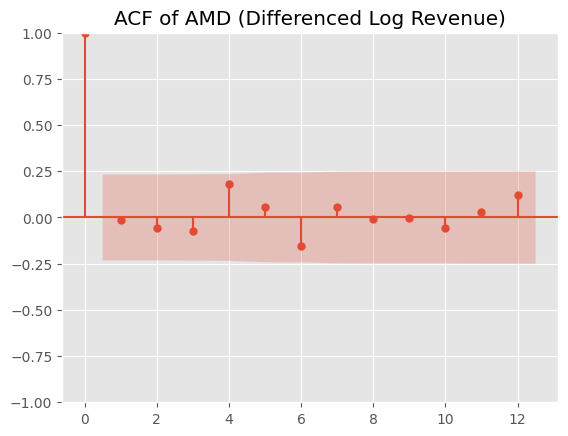

<Figure size 1200x500 with 0 Axes>

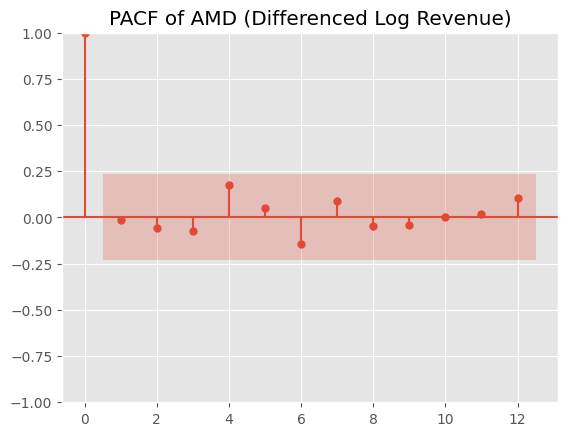


Amazon
ADF p-value: 0.43374305337171776
Not stationary → applying first differencing
After differencing p-value: 0.37119254591285344


<Figure size 1200x500 with 0 Axes>

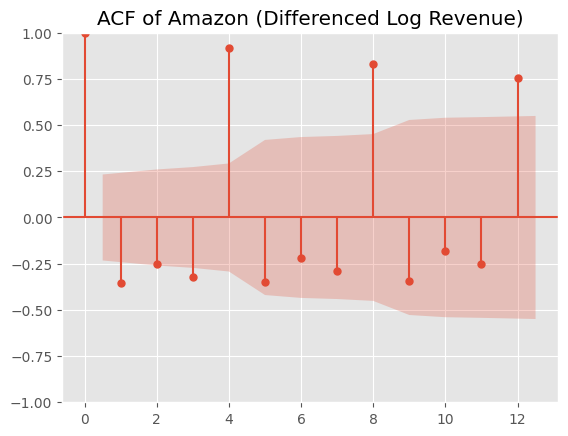

<Figure size 1200x500 with 0 Axes>

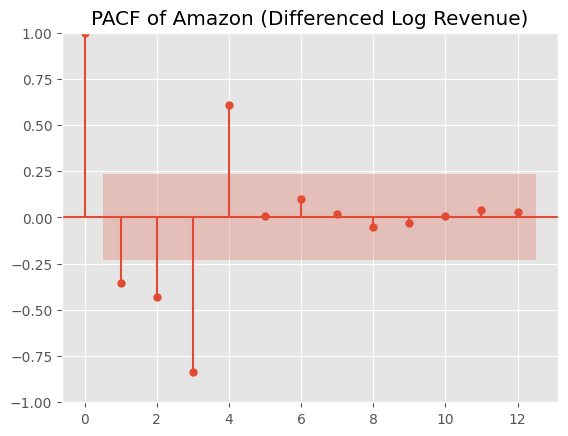


Apple
ADF p-value: 0.057459672379888714
Not stationary → applying first differencing
After differencing p-value: 0.14430178820058104


<Figure size 1200x500 with 0 Axes>

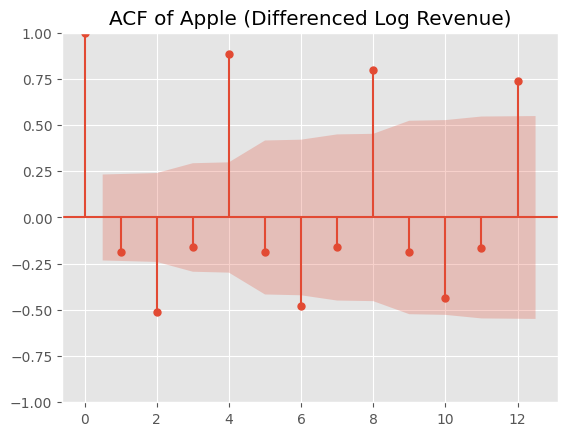

<Figure size 1200x500 with 0 Axes>

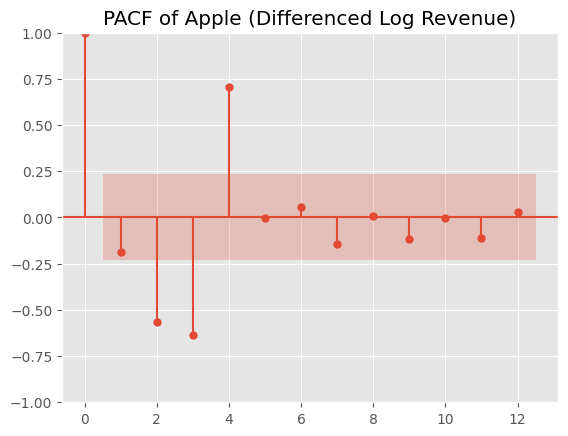


Bank of America
ADF p-value: 0.006374761287793434
Already stationary


<Figure size 1200x500 with 0 Axes>

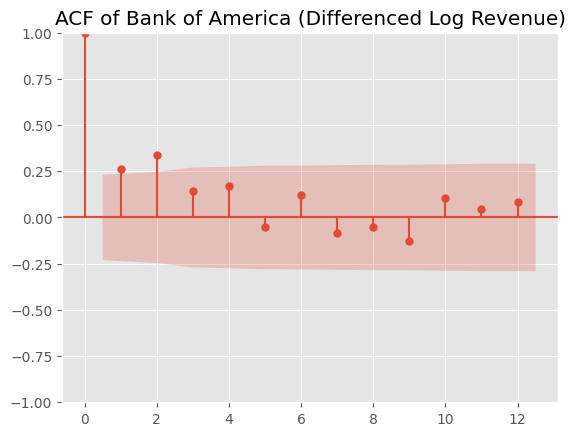

<Figure size 1200x500 with 0 Axes>

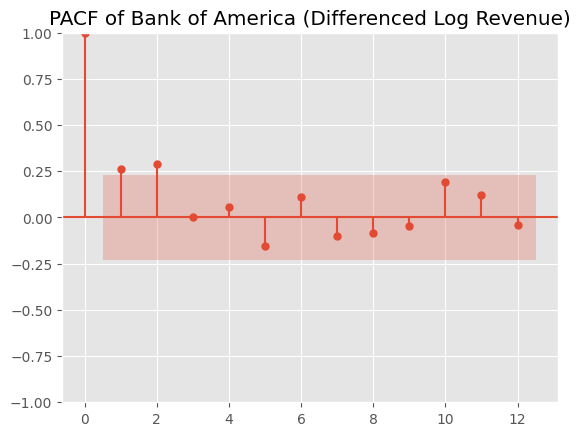


BlackBerry
ADF p-value: 0.9370526951883533
Not stationary → applying first differencing
After differencing p-value: 1.1021443739363861e-15


<Figure size 1200x500 with 0 Axes>

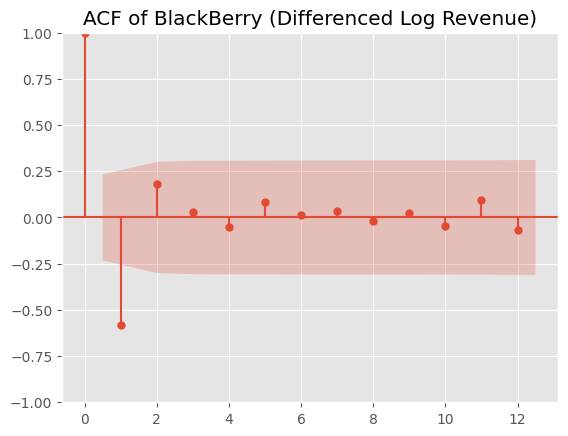

<Figure size 1200x500 with 0 Axes>

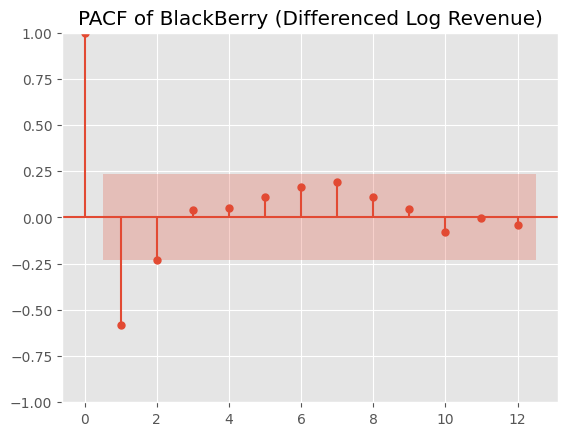


Boeing
ADF p-value: 0.07839182293571056
Not stationary → applying first differencing
After differencing p-value: 3.236178765872995e-19


<Figure size 1200x500 with 0 Axes>

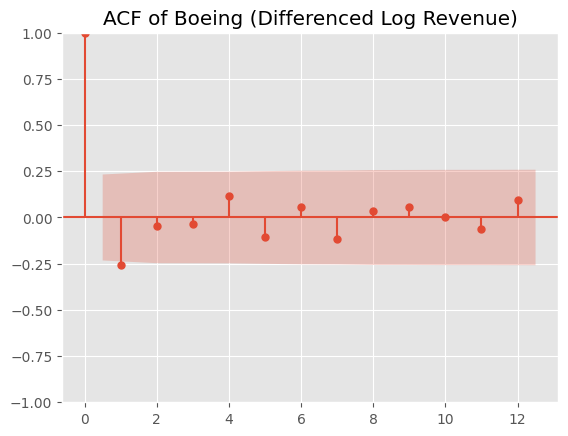

<Figure size 1200x500 with 0 Axes>

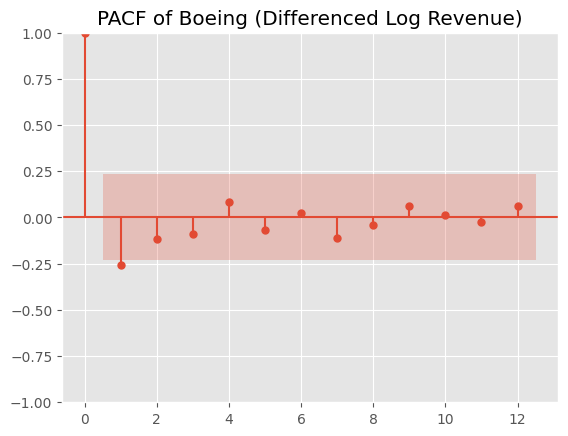


Chevron
ADF p-value: 0.12750254721842175
Not stationary → applying first differencing
After differencing p-value: 3.6091161371044976e-11


<Figure size 1200x500 with 0 Axes>

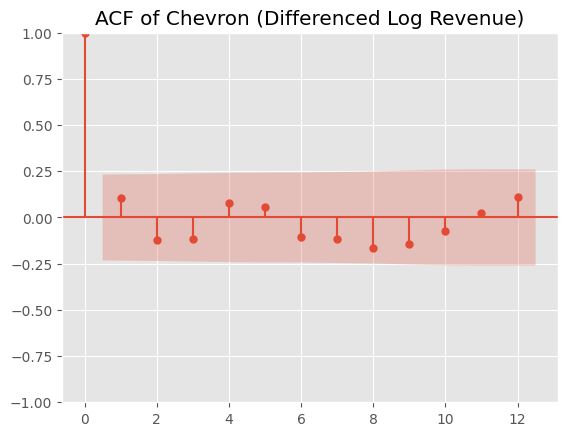

<Figure size 1200x500 with 0 Axes>

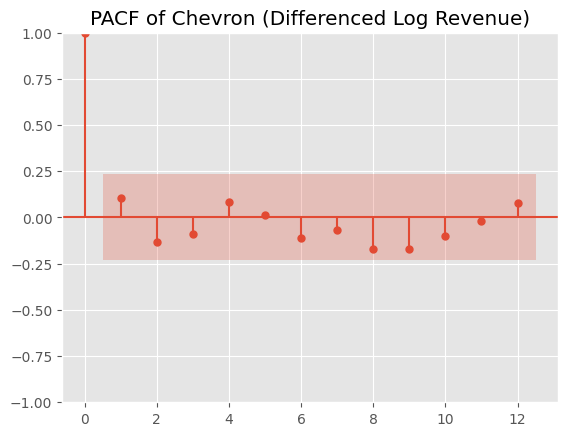


Exxon
ADF p-value: 0.15209859960485078
Not stationary → applying first differencing
After differencing p-value: 1.56329940226478e-11


<Figure size 1200x500 with 0 Axes>

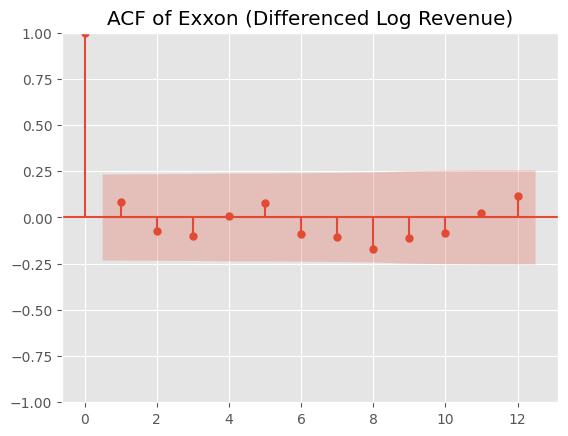

<Figure size 1200x500 with 0 Axes>

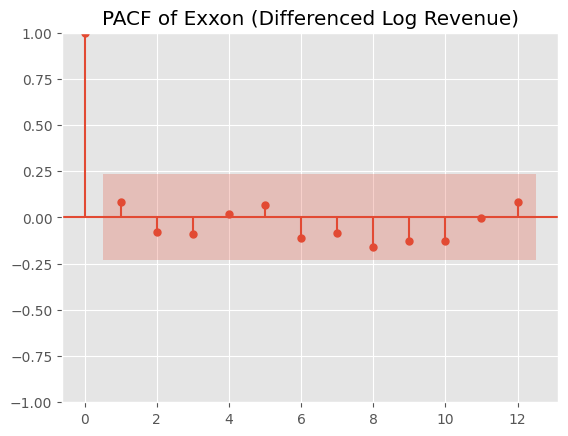


GameStop
ADF p-value: 0.9919062444237099
Not stationary → applying first differencing
After differencing p-value: 0.0055139782567180514


<Figure size 1200x500 with 0 Axes>

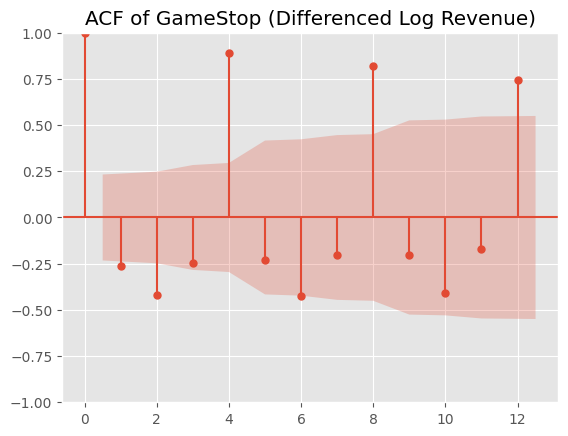

<Figure size 1200x500 with 0 Axes>

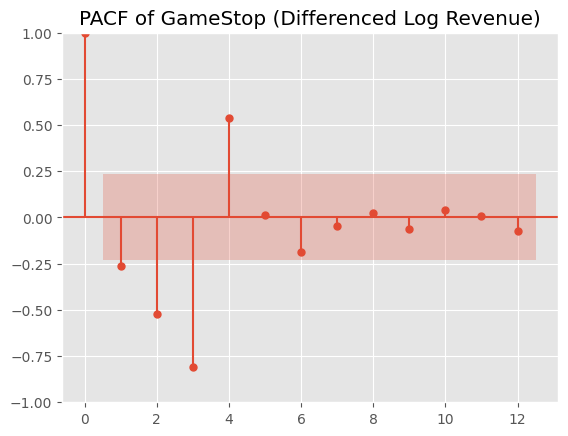


Gap
ADF p-value: 0.42708003073406064
Not stationary → applying first differencing
After differencing p-value: 2.7357686218780637e-05


<Figure size 1200x500 with 0 Axes>

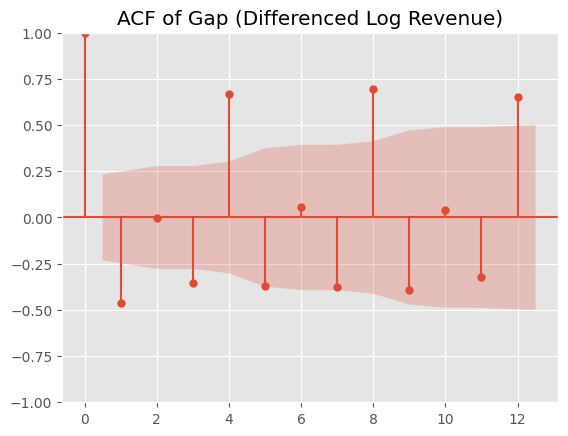

<Figure size 1200x500 with 0 Axes>

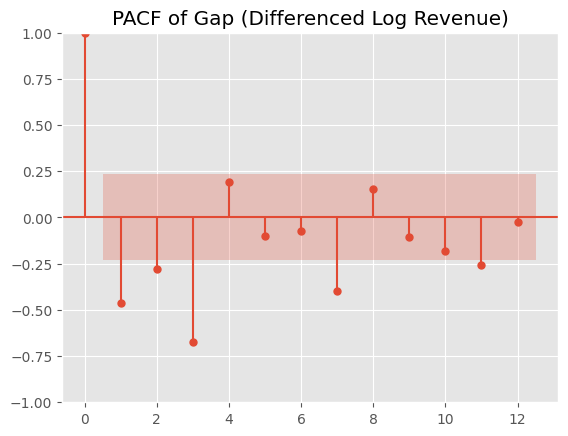


Hilton
ADF p-value: 0.1481021482077559
Not stationary → applying first differencing
After differencing p-value: 9.912482155361767e-14


<Figure size 1200x500 with 0 Axes>

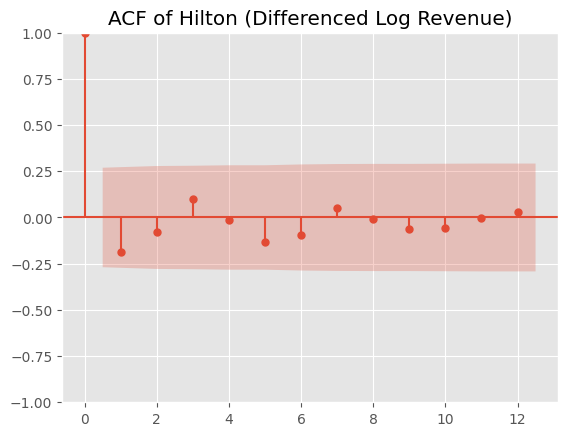

<Figure size 1200x500 with 0 Axes>

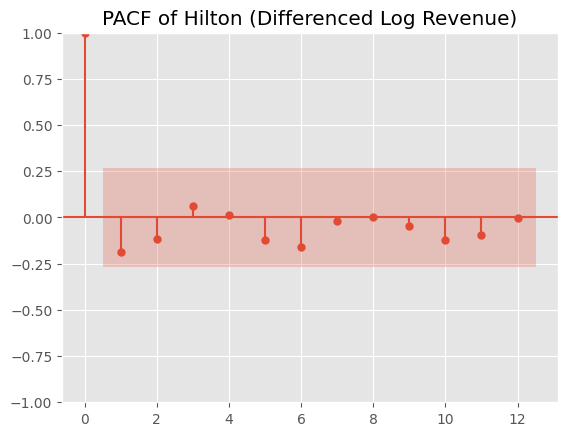


Intel
ADF p-value: 0.011953313095648723
Already stationary


<Figure size 1200x500 with 0 Axes>

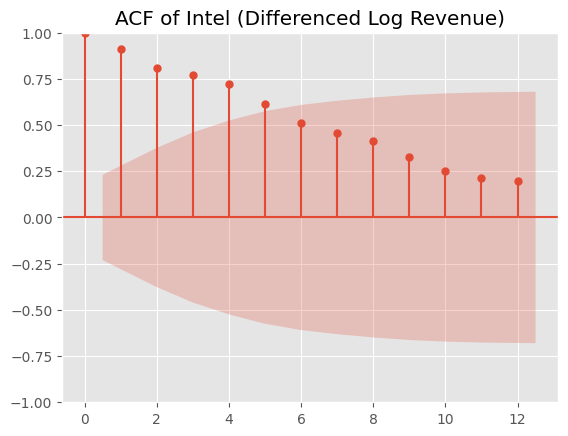

<Figure size 1200x500 with 0 Axes>

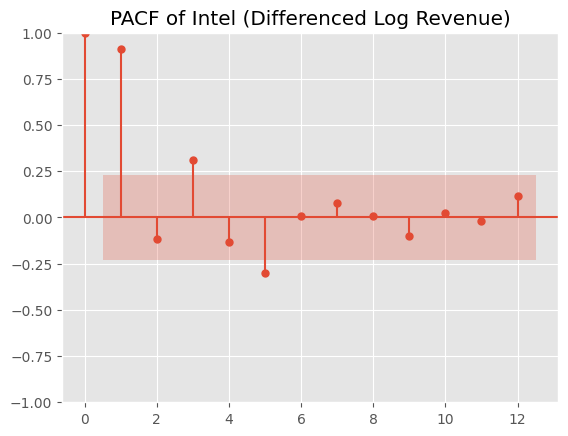


JPMorgan
ADF p-value: 1.0
Not stationary → applying first differencing
After differencing p-value: 0.016654077749765017


<Figure size 1200x500 with 0 Axes>

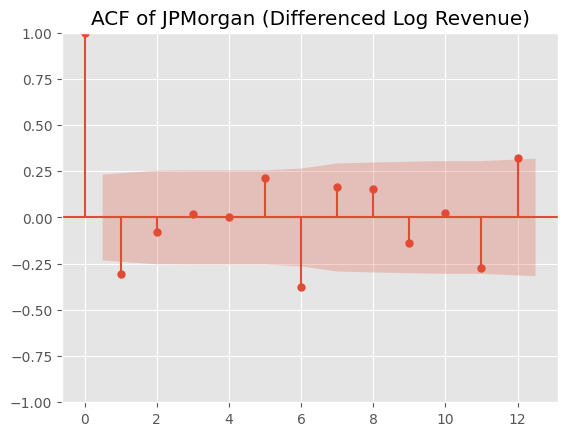

<Figure size 1200x500 with 0 Axes>

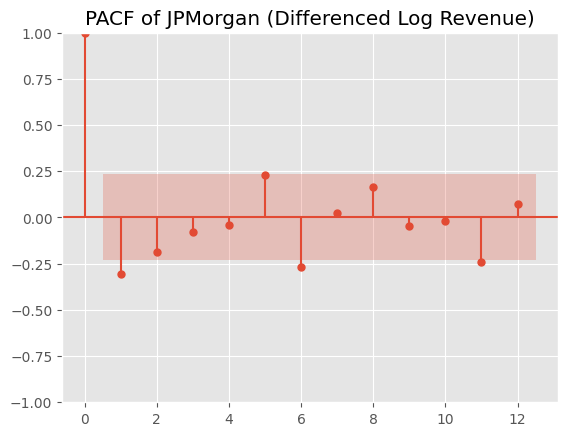


Marriott
ADF p-value: 0.14955055667512301
Not stationary → applying first differencing
After differencing p-value: 6.058947703172232e-19


<Figure size 1200x500 with 0 Axes>

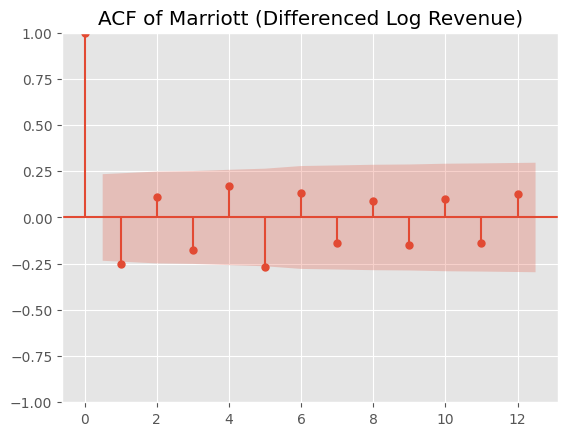

<Figure size 1200x500 with 0 Axes>

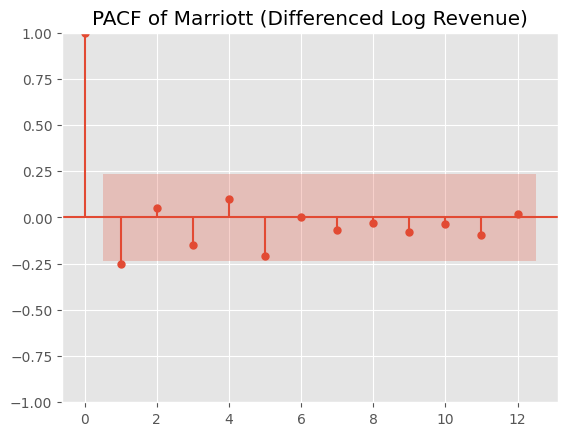


Microsoft
ADF p-value: 0.9990181770757949
Not stationary → applying first differencing
After differencing p-value: 0.6386793417169193


<Figure size 1200x500 with 0 Axes>

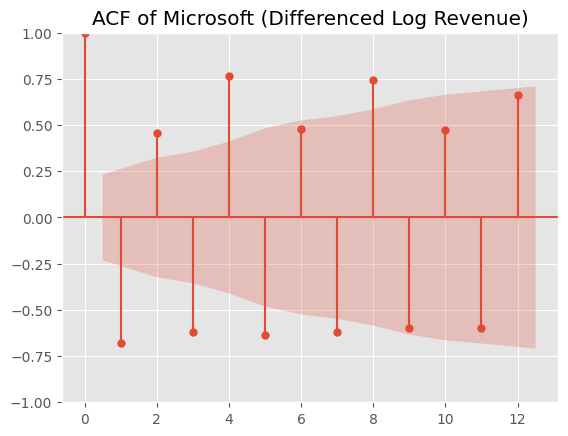

<Figure size 1200x500 with 0 Axes>

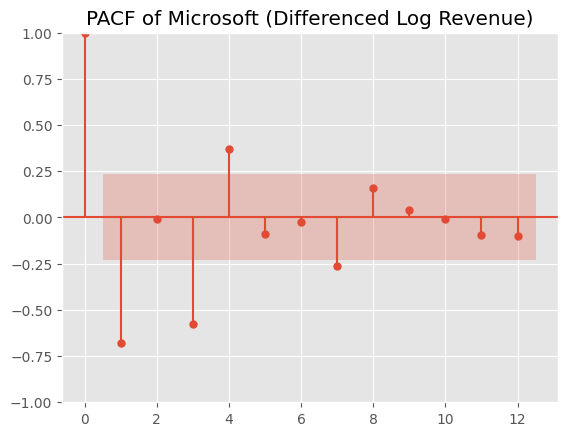


NVIDIA
ADF p-value: 0.998011676576678
Not stationary → applying first differencing
After differencing p-value: 9.716205016477333e-06


<Figure size 1200x500 with 0 Axes>

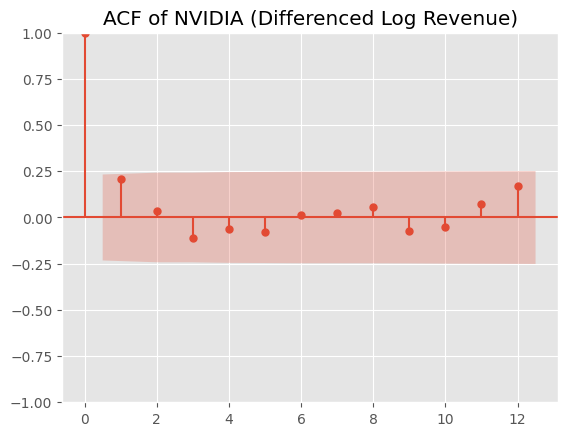

<Figure size 1200x500 with 0 Axes>

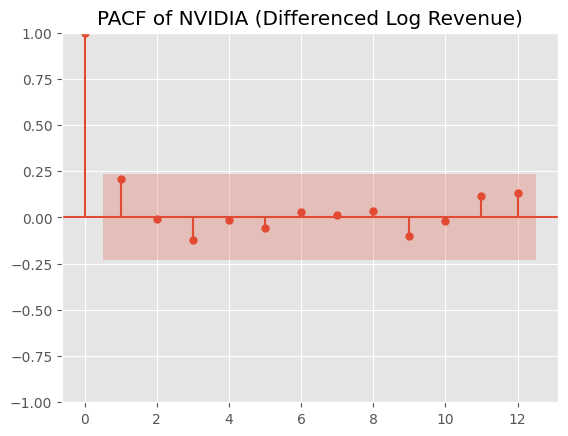


Peloton
ADF p-value: 0.0004323234921741464
Already stationary


<Figure size 1200x500 with 0 Axes>

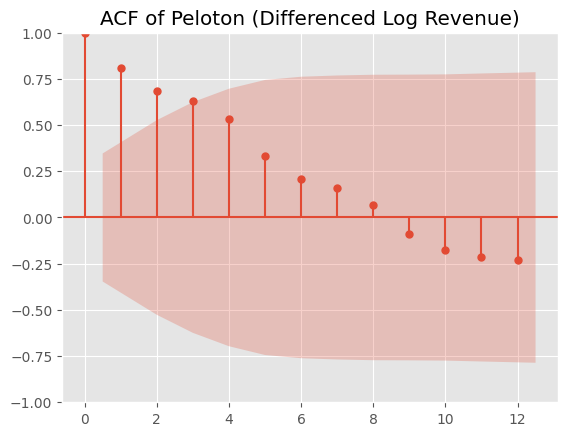

<Figure size 1200x500 with 0 Axes>

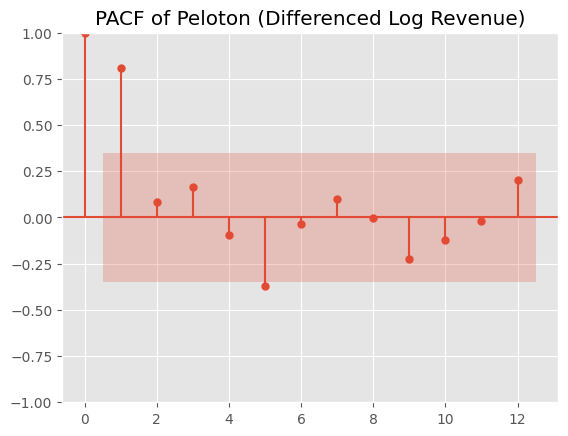


Stitch Fix
ADF p-value: 0.09225458790098734
Not stationary → applying first differencing
After differencing p-value: 1.1586573864116155e-05


<Figure size 1200x500 with 0 Axes>

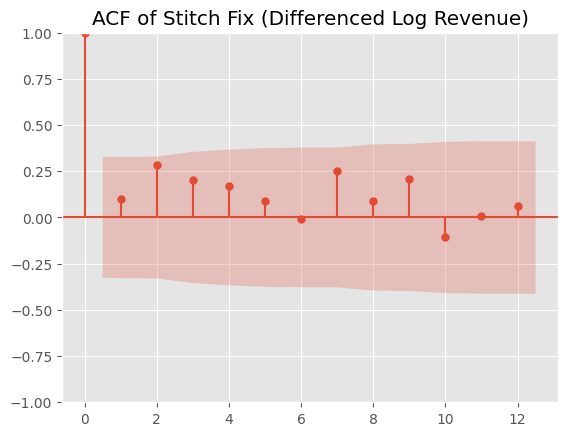

<Figure size 1200x500 with 0 Axes>

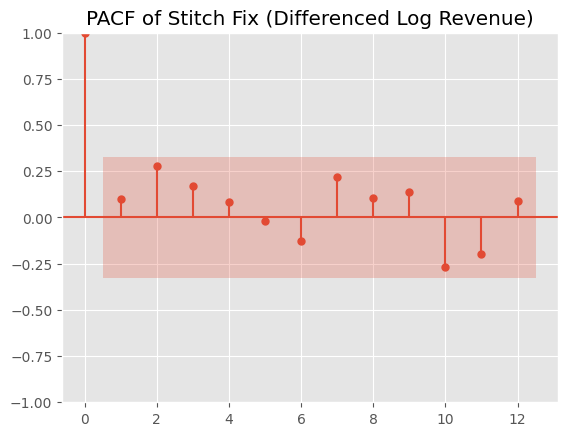


Tripadvisor
ADF p-value: 0.027750983752156975
Already stationary


<Figure size 1200x500 with 0 Axes>

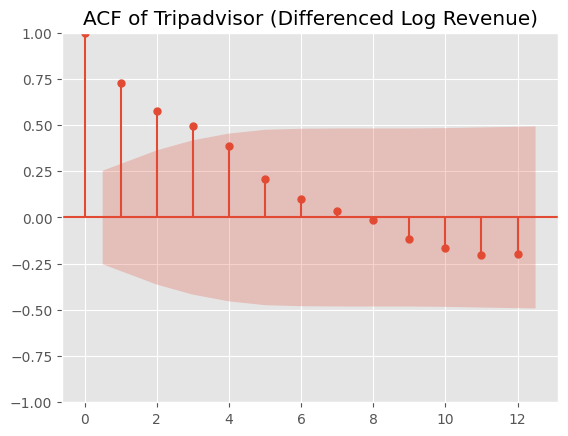

<Figure size 1200x500 with 0 Axes>

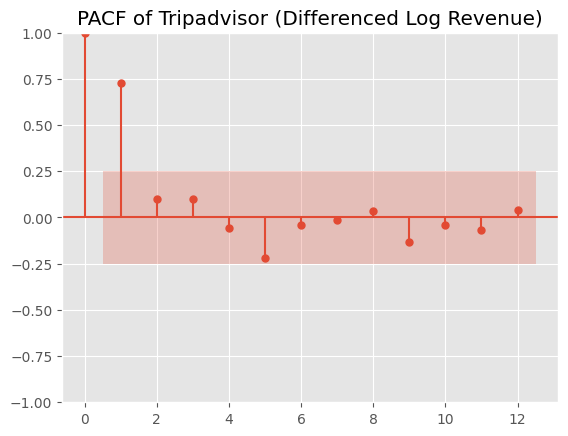


Visa
ADF p-value: 0.8889525327358963
Not stationary → applying first differencing
After differencing p-value: 2.4526772818493632e-11


<Figure size 1200x500 with 0 Axes>

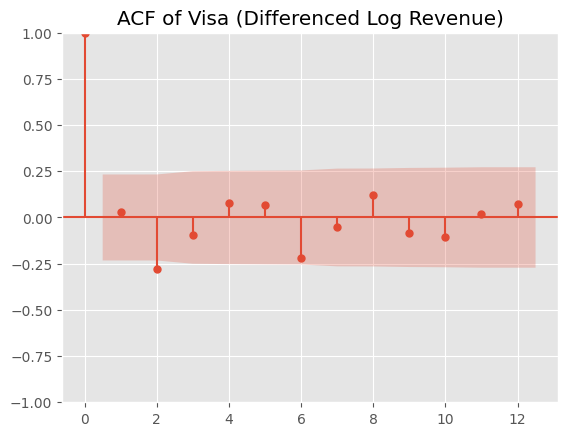

<Figure size 1200x500 with 0 Axes>

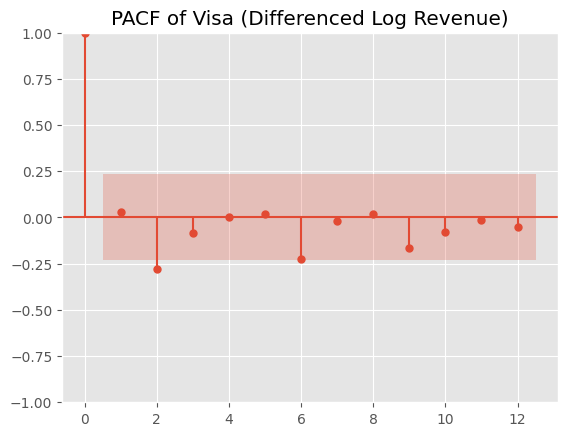


Zoom
ADF p-value: 0.49597276675782787
Not stationary → applying first differencing
After differencing p-value: 0.002008664785988285


<Figure size 1200x500 with 0 Axes>

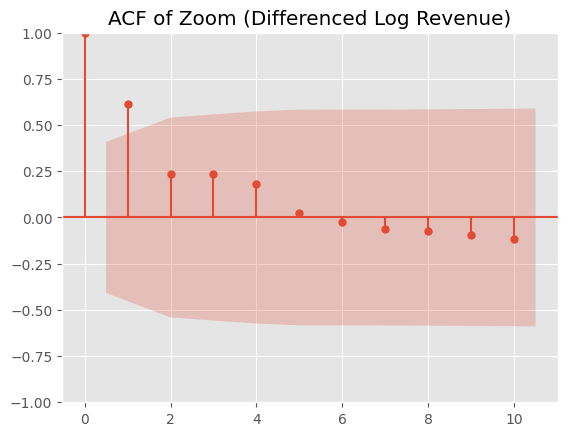

<Figure size 1200x500 with 0 Axes>

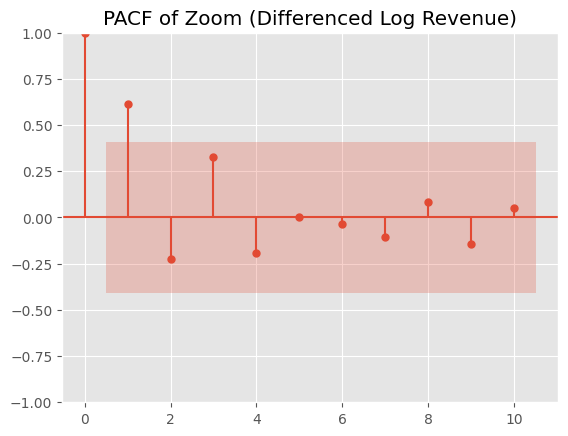

In [46]:


for company in data["company"].unique():
    ts = data[data["company"]==company].sort_values("date").set_index("date")["revenue"]
    ts_log, ts_diff = check_stationarity(ts, company)
    plot_acf_pacf(ts_diff, company)


In [47]:
def adf_test(series, name=""):
    result = adfuller(series)
    
    print(f"\nADF Test for {name}")
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value}")


In [48]:
for company in data["company"].unique():
    
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    
    adf_test(ts, company)



ADF Test for AMD
ADF Statistic: 3.080590423851768
p-value: 1.0
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312

ADF Test for Amazon
ADF Statistic: 0.3878790747667682
p-value: 0.9810359604744654
Critical Values:
   1%: -3.5463945337644063
   5%: -2.911939409384601
   10%: -2.5936515282964665

ADF Test for Apple
ADF Statistic: -0.8786508690596487
p-value: 0.7949216735963608
Critical Values:
   1%: -3.5319549603840894
   5%: -2.905755128523123
   10%: -2.5903569458676765

ADF Test for Bank of America
ADF Statistic: -2.9694149206858
p-value: 0.0378510709279982
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653

ADF Test for BlackBerry
ADF Statistic: -0.8031861642015524
p-value: 0.818184363896652
Critical Values:
   1%: -3.526004646825607
   5%: -2.9032002348069774
   10%: -2.5889948363419957

ADF Test for Boeing
ADF Statistic: -2.5433942211832328
p-value: 0.10526977952319161
Critical Values:
  

<Figure size 1200x500 with 0 Axes>

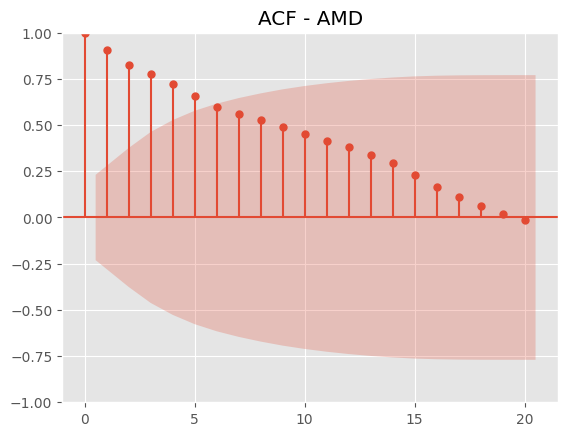

<Figure size 1200x500 with 0 Axes>

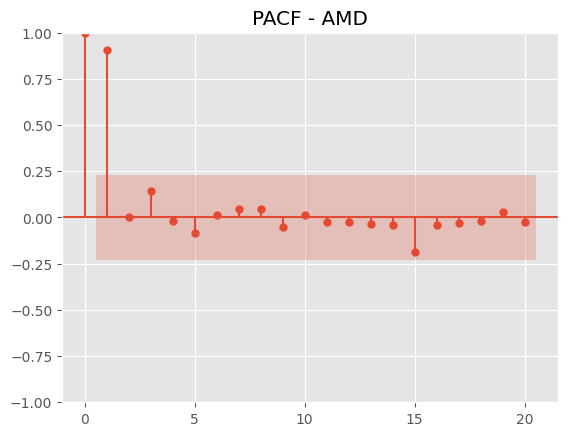

<Figure size 1200x500 with 0 Axes>

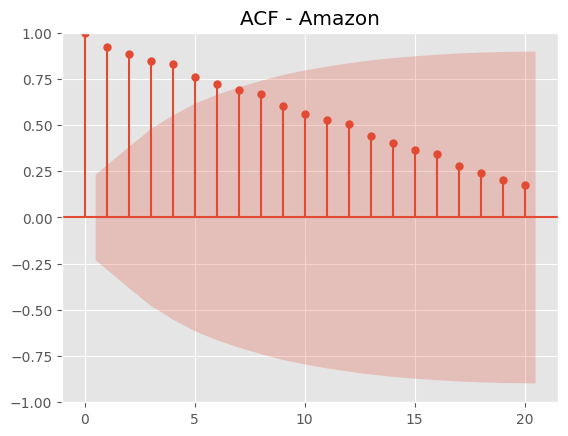

<Figure size 1200x500 with 0 Axes>

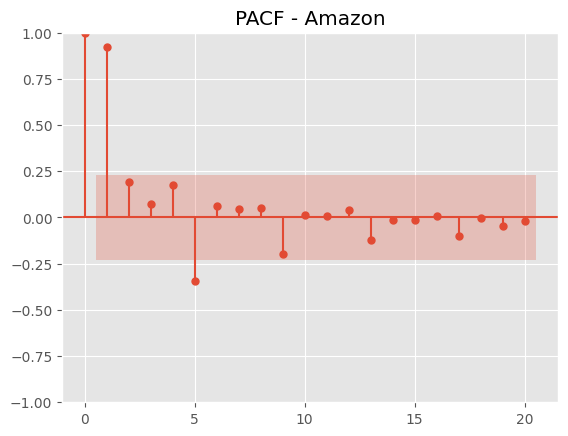

<Figure size 1200x500 with 0 Axes>

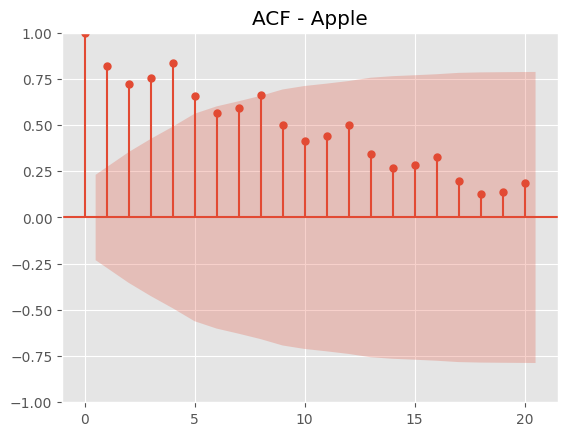

<Figure size 1200x500 with 0 Axes>

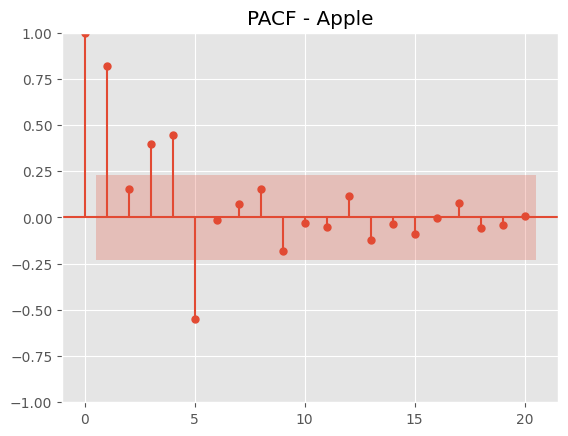

<Figure size 1200x500 with 0 Axes>

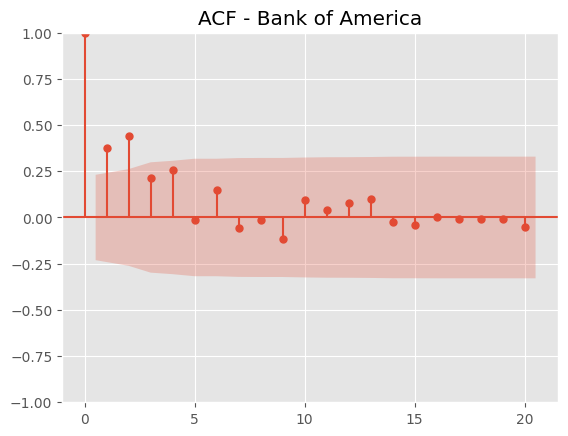

<Figure size 1200x500 with 0 Axes>

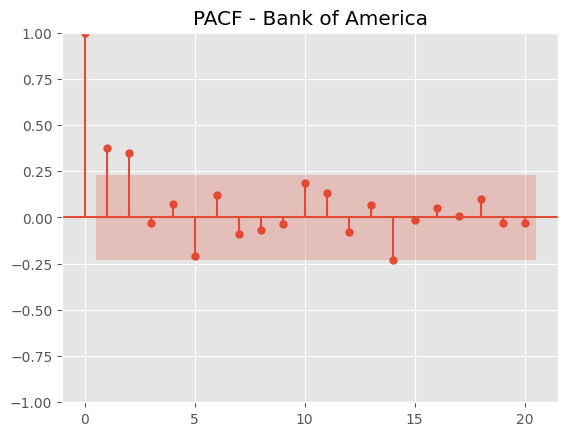

<Figure size 1200x500 with 0 Axes>

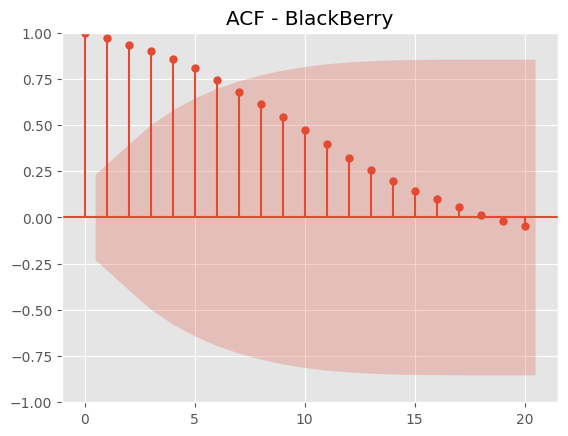

<Figure size 1200x500 with 0 Axes>

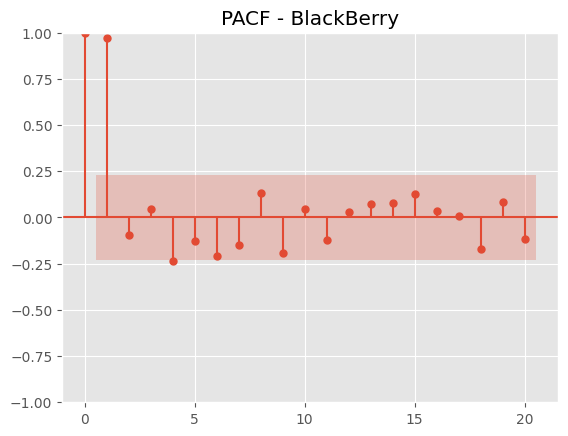

<Figure size 1200x500 with 0 Axes>

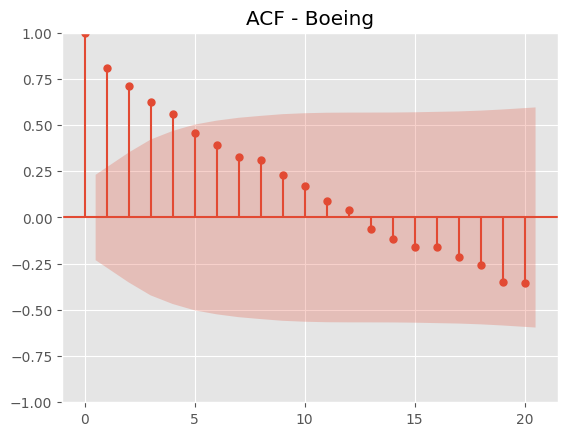

<Figure size 1200x500 with 0 Axes>

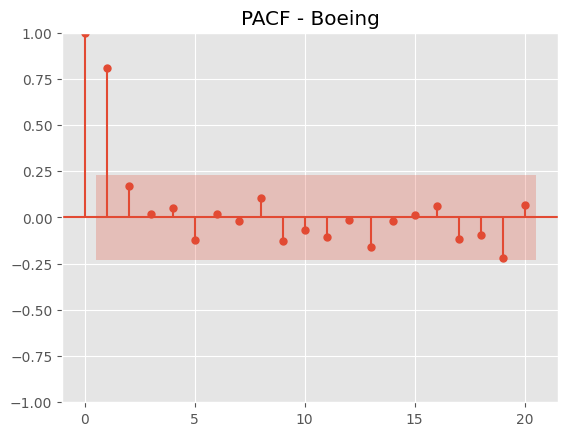

<Figure size 1200x500 with 0 Axes>

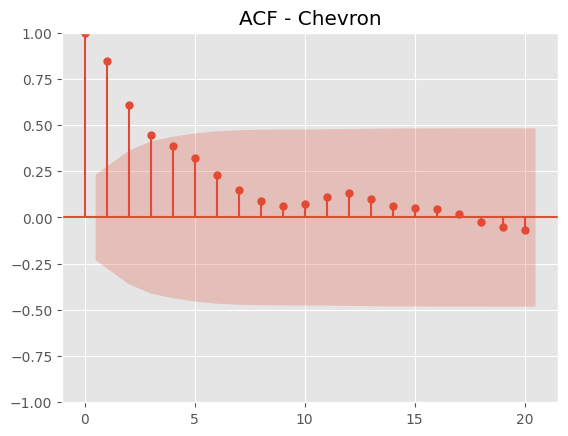

<Figure size 1200x500 with 0 Axes>

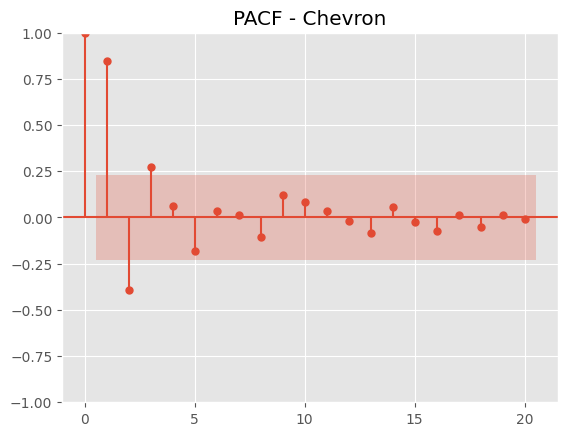

<Figure size 1200x500 with 0 Axes>

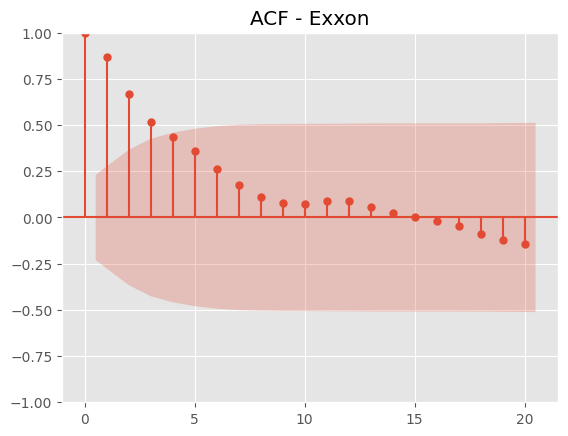

<Figure size 1200x500 with 0 Axes>

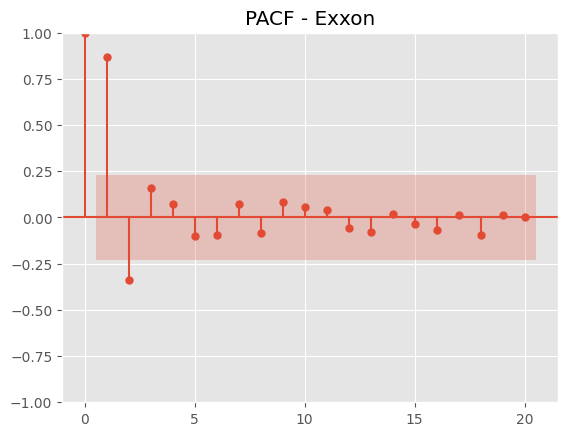

<Figure size 1200x500 with 0 Axes>

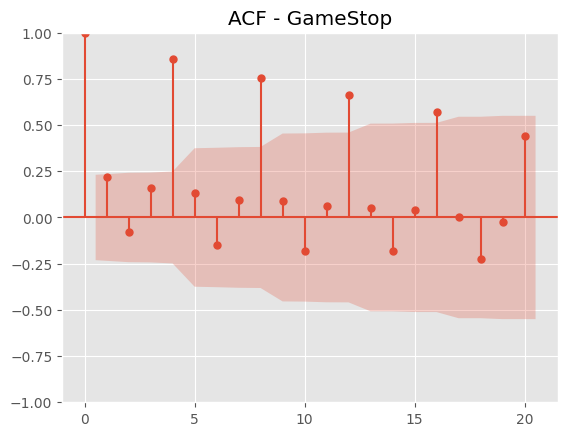

<Figure size 1200x500 with 0 Axes>

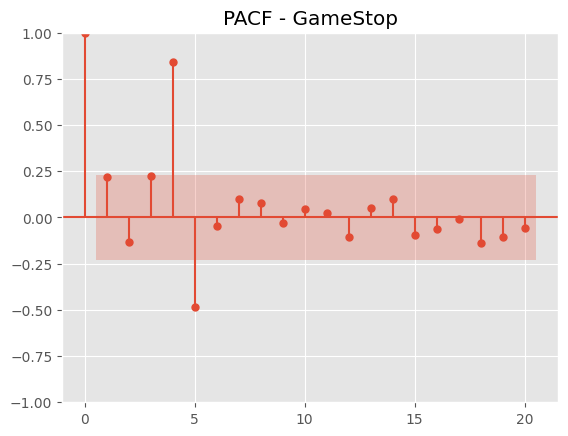

<Figure size 1200x500 with 0 Axes>

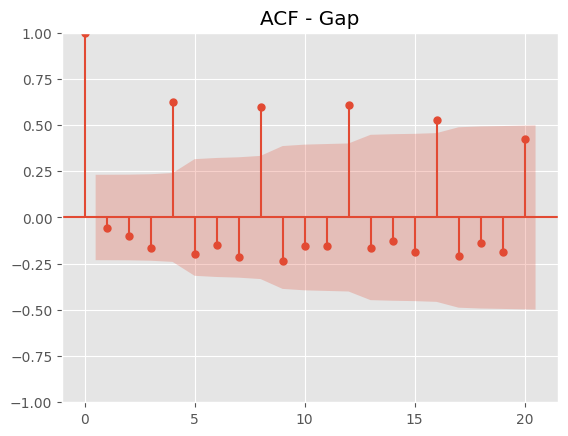

<Figure size 1200x500 with 0 Axes>

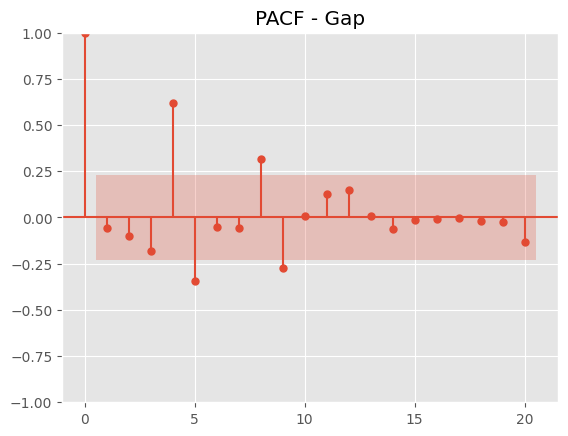

<Figure size 1200x500 with 0 Axes>

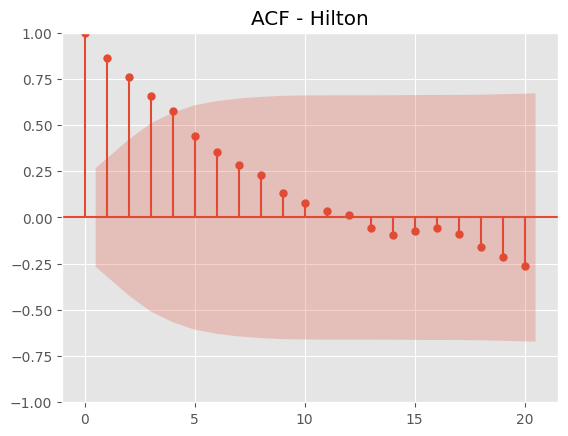

<Figure size 1200x500 with 0 Axes>

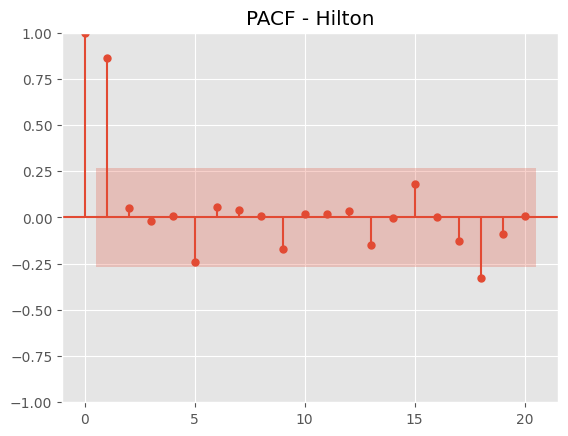

<Figure size 1200x500 with 0 Axes>

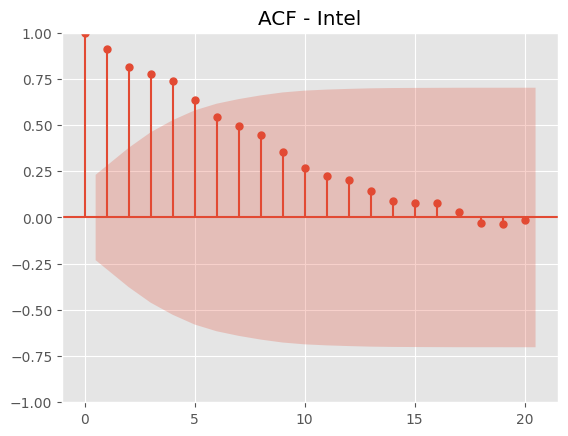

<Figure size 1200x500 with 0 Axes>

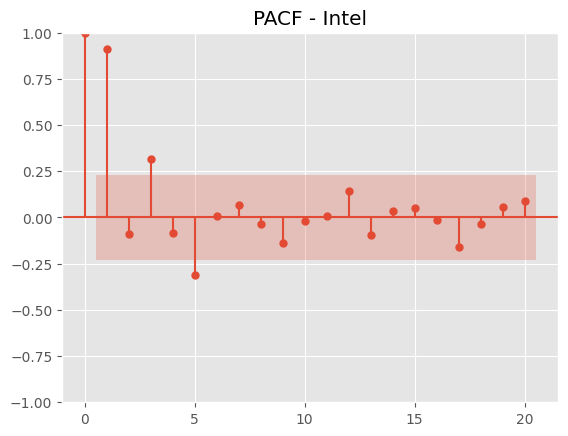

<Figure size 1200x500 with 0 Axes>

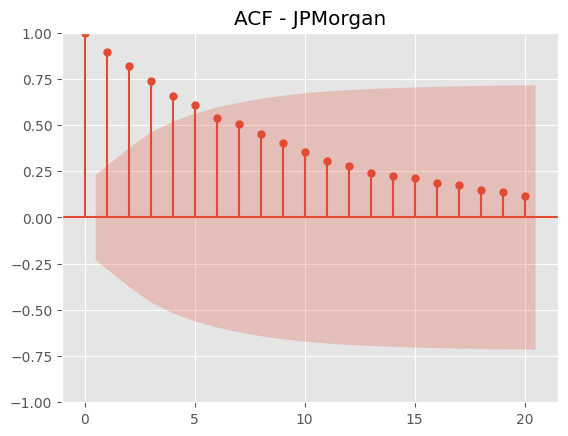

<Figure size 1200x500 with 0 Axes>

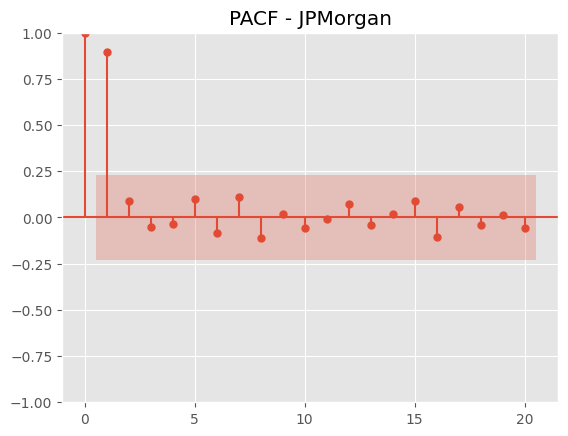

<Figure size 1200x500 with 0 Axes>

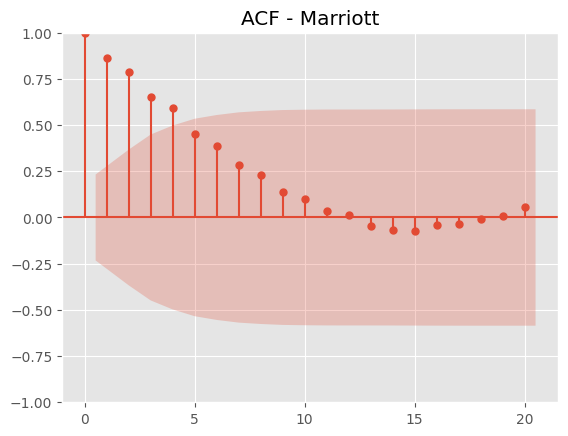

<Figure size 1200x500 with 0 Axes>

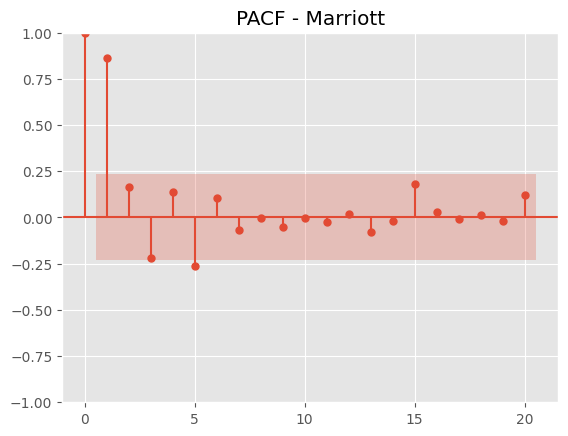

<Figure size 1200x500 with 0 Axes>

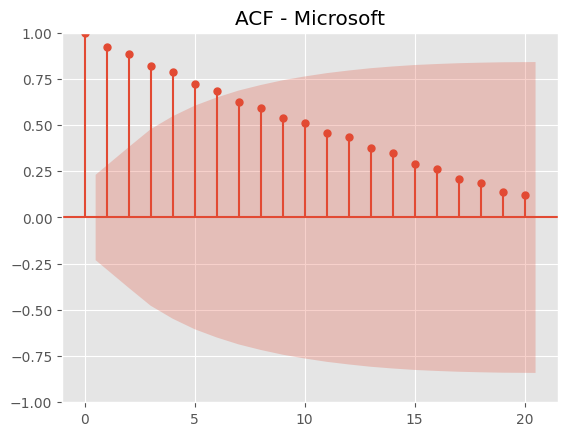

<Figure size 1200x500 with 0 Axes>

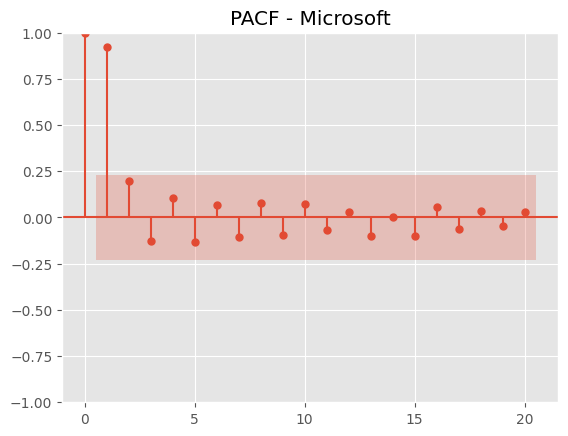

<Figure size 1200x500 with 0 Axes>

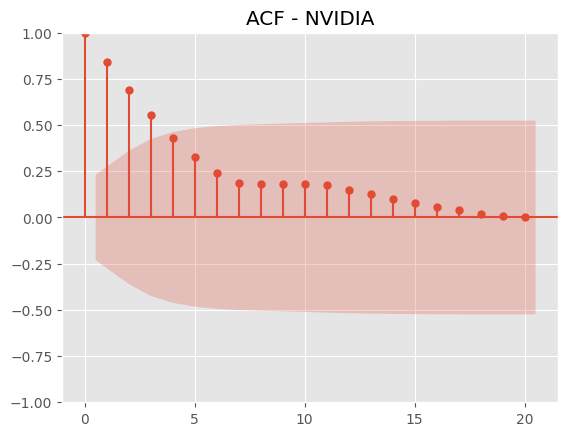

<Figure size 1200x500 with 0 Axes>

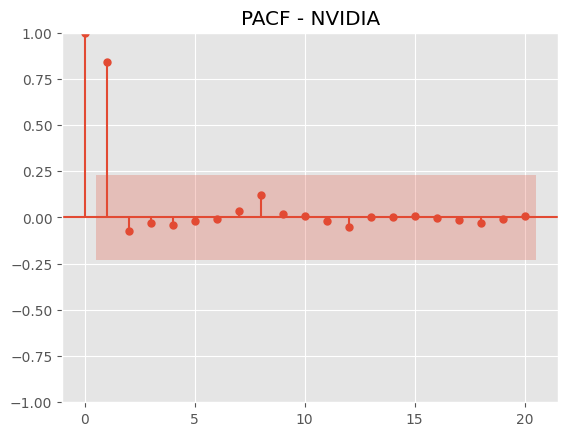

<Figure size 1200x500 with 0 Axes>

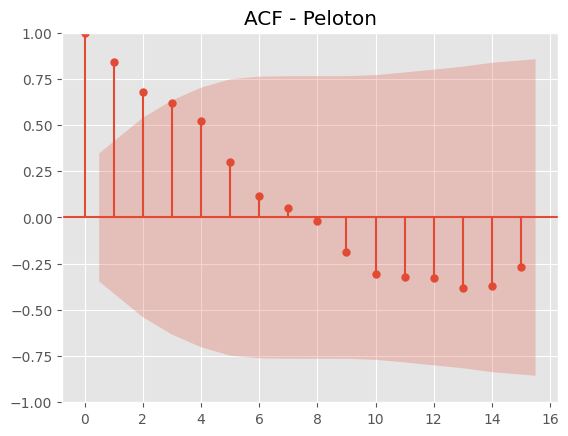

<Figure size 1200x500 with 0 Axes>

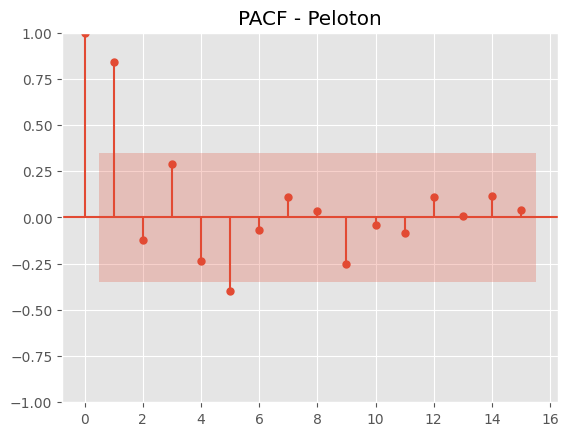

<Figure size 1200x500 with 0 Axes>

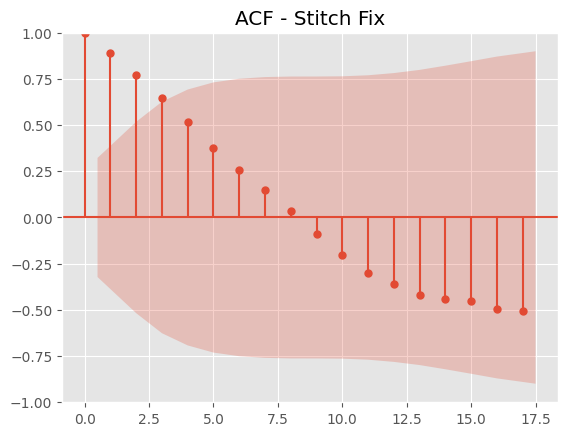

<Figure size 1200x500 with 0 Axes>

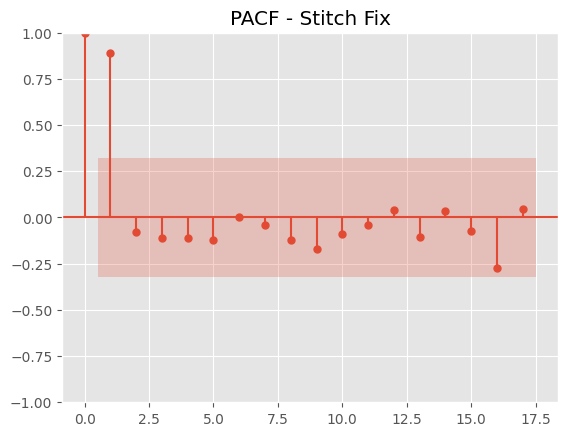

<Figure size 1200x500 with 0 Axes>

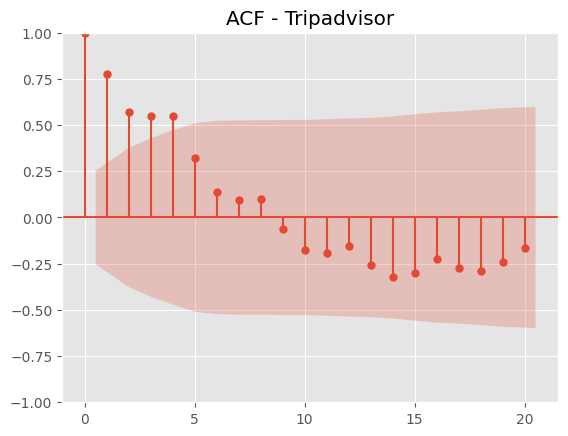

<Figure size 1200x500 with 0 Axes>

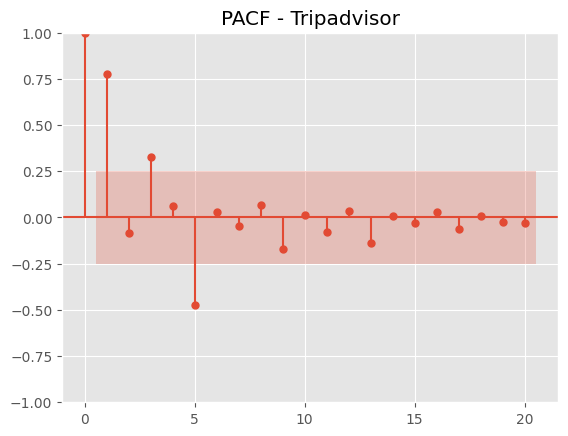

<Figure size 1200x500 with 0 Axes>

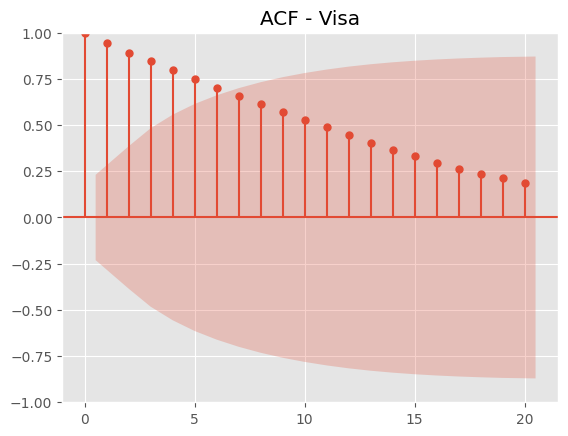

<Figure size 1200x500 with 0 Axes>

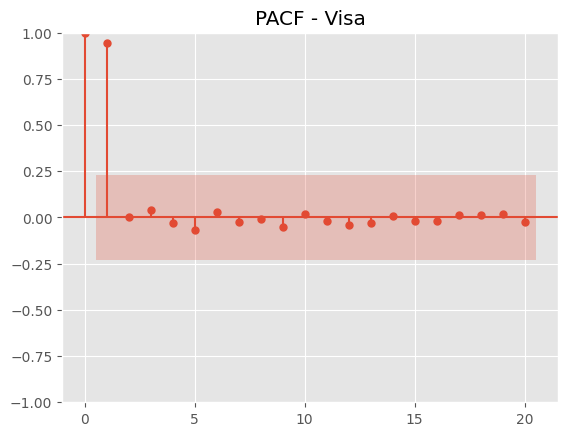

<Figure size 1200x500 with 0 Axes>

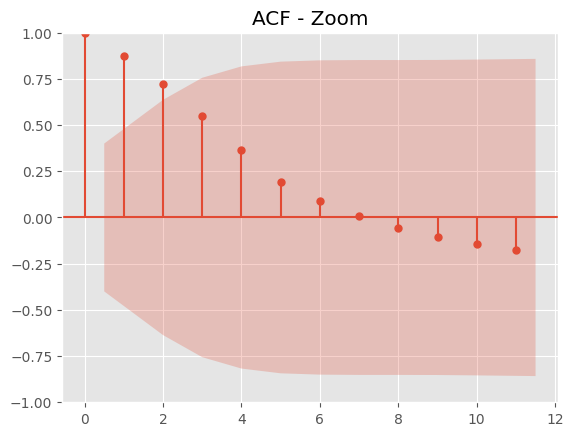

<Figure size 1200x500 with 0 Axes>

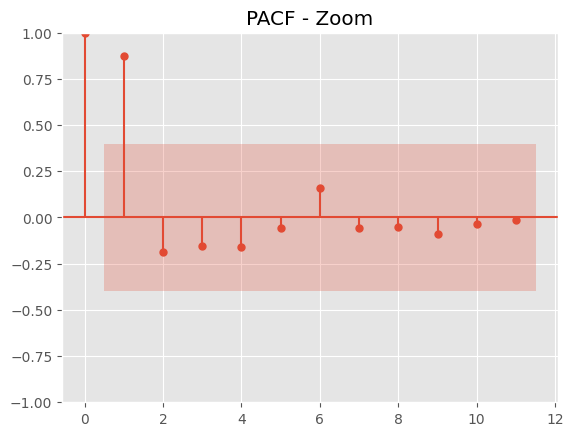

In [49]:
for company in data["company"].unique():
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    safe_lags = max(1, min(20, (len(ts) // 2) - 1))

    plt.figure(figsize=(12,5))
    plot_acf(ts, lags=safe_lags)
    plt.title(f"ACF - {company}")
    plt.show()

    plt.figure(figsize=(12,5))
    plot_pacf(ts, lags=safe_lags, method='ywm')
    plt.title(f"PACF - {company}")
    plt.show()


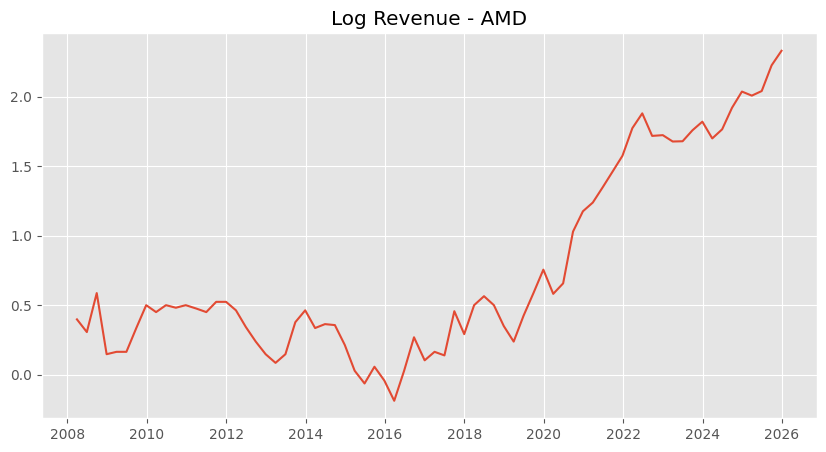


ADF Test for AMD (Log)
ADF Statistic: 0.6206288884476702
p-value: 0.9881132114120105
Critical Values:
   1%: -3.526004646825607
   5%: -2.9032002348069774
   10%: -2.5889948363419957


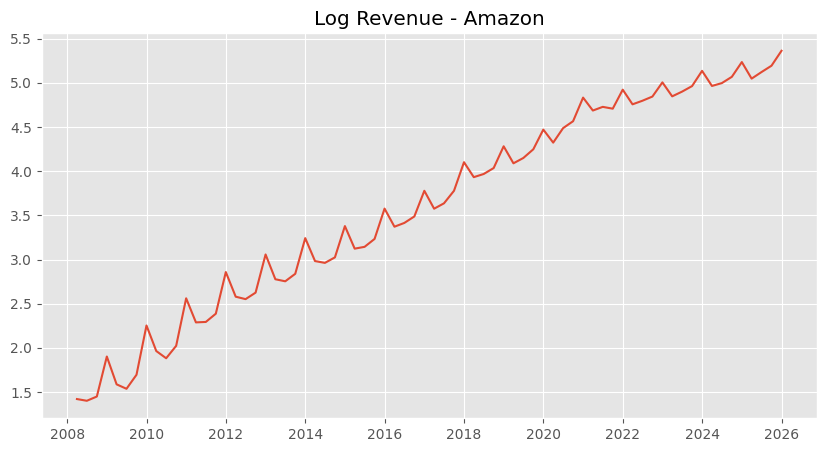


ADF Test for Amazon (Log)
ADF Statistic: -1.6948980505138997
p-value: 0.43374305337171776
Critical Values:
   1%: -3.5386953618719676
   5%: -2.9086446751210775
   10%: -2.591896782564878


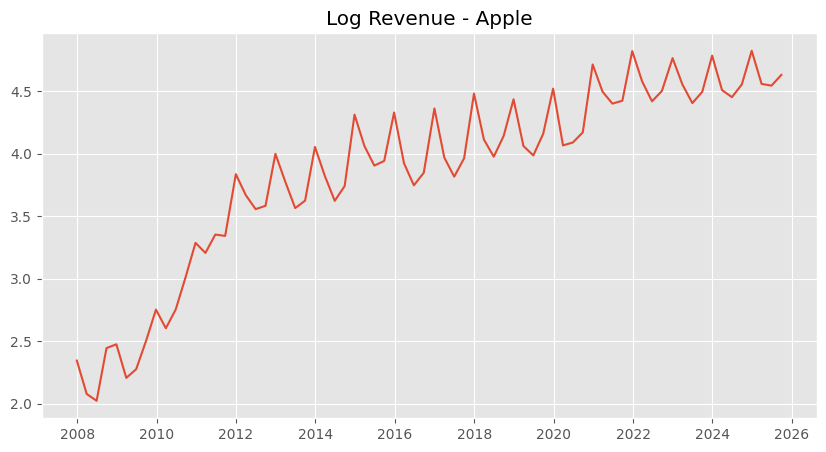


ADF Test for Apple (Log)
ADF Statistic: -2.8057318133576135
p-value: 0.057459672379888714
Critical Values:
   1%: -3.5319549603840894
   5%: -2.905755128523123
   10%: -2.5903569458676765


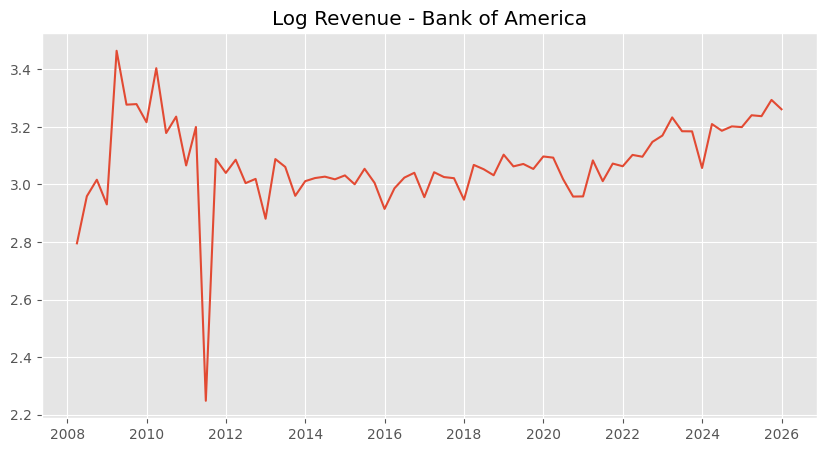


ADF Test for Bank of America (Log)
ADF Statistic: -3.5693499941571307
p-value: 0.006374761287793434
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653


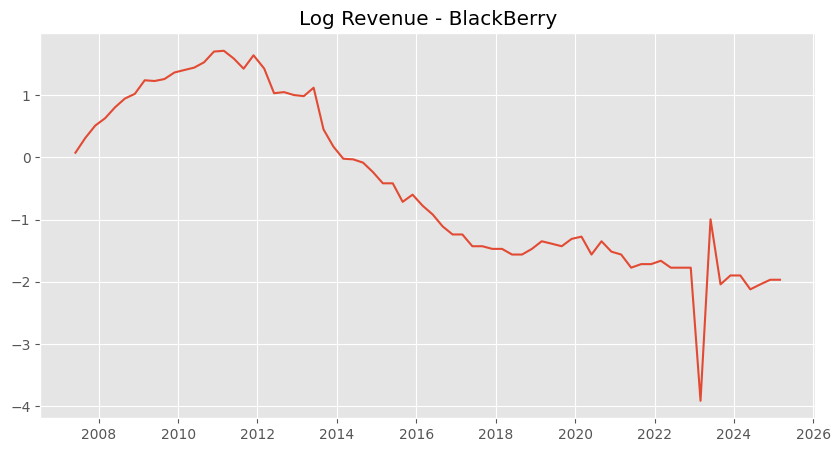


ADF Test for BlackBerry (Log)
ADF Statistic: -0.21219182617061333
p-value: 0.9370526951883533
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312


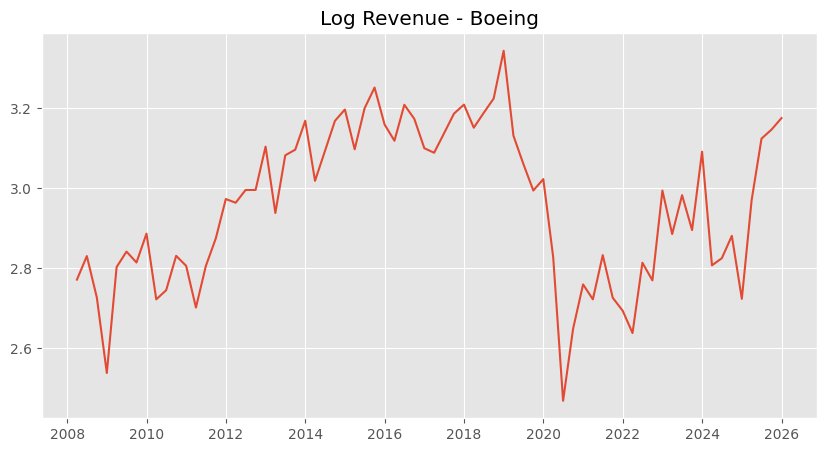


ADF Test for Boeing (Log)
ADF Statistic: -2.675405037566995
p-value: 0.07839182293571056
Critical Values:
   1%: -3.526004646825607
   5%: -2.9032002348069774
   10%: -2.5889948363419957


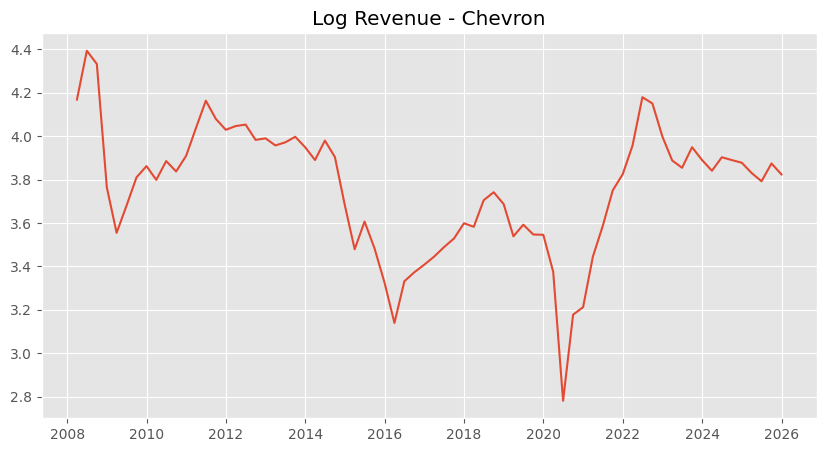


ADF Test for Chevron (Log)
ADF Statistic: -2.4523500873900557
p-value: 0.12750254721842175
Critical Values:
   1%: -3.526004646825607
   5%: -2.9032002348069774
   10%: -2.5889948363419957


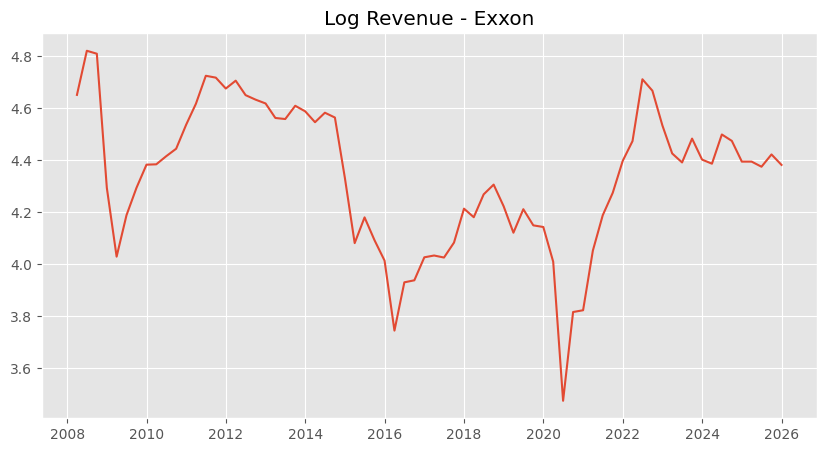


ADF Test for Exxon (Log)
ADF Statistic: -2.3641933055557494
p-value: 0.15209859960485078
Critical Values:
   1%: -3.526004646825607
   5%: -2.9032002348069774
   10%: -2.5889948363419957


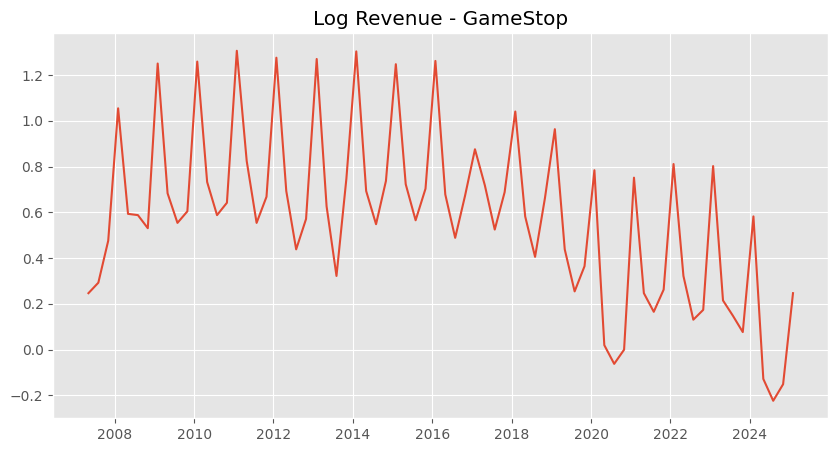


ADF Test for GameStop (Log)
ADF Statistic: 0.8170360825132756
p-value: 0.9919062444237099
Critical Values:
   1%: -3.53692771987915
   5%: -2.907887369384766
   10%: -2.591493291015625


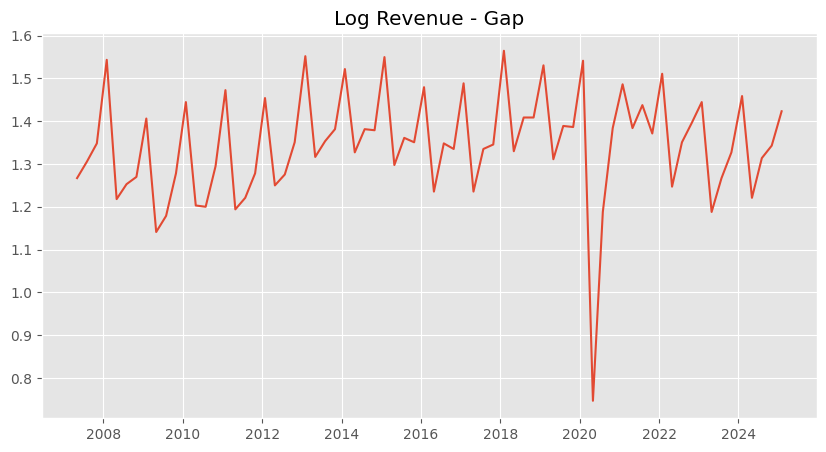


ADF Test for Gap (Log)
ADF Statistic: -1.7078354024299442
p-value: 0.42708003073406064
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776


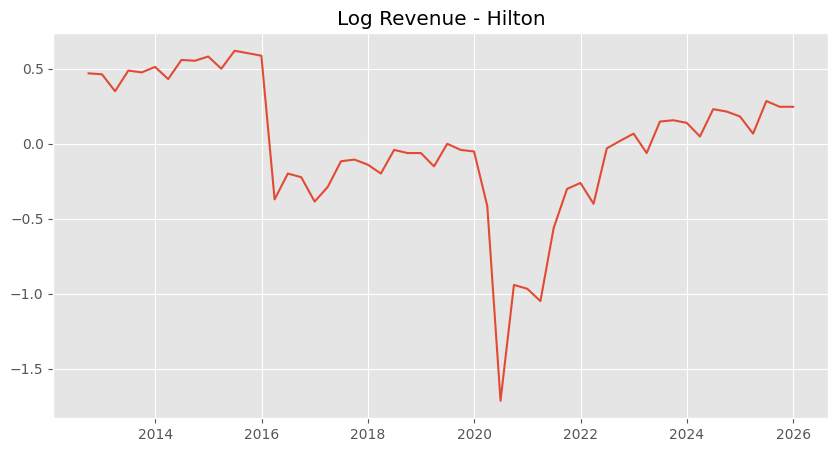


ADF Test for Hilton (Log)
ADF Statistic: -2.3777942388191238
p-value: 0.1481021482077559
Critical Values:
   1%: -3.560242358792829
   5%: -2.9178502070837
   10%: -2.5967964150943397


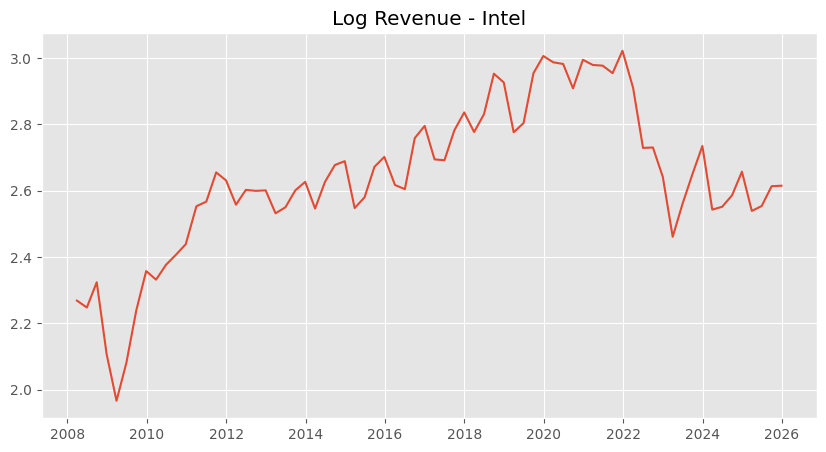


ADF Test for Intel (Log)
ADF Statistic: -3.3719436689722566
p-value: 0.011953313095648723
Critical Values:
   1%: -3.5319549603840894
   5%: -2.905755128523123
   10%: -2.5903569458676765


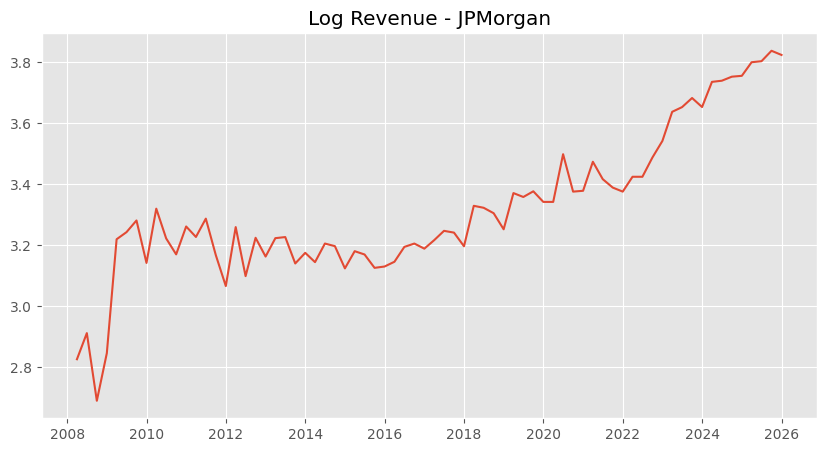


ADF Test for JPMorgan (Log)
ADF Statistic: 2.788666582278407
p-value: 1.0
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776


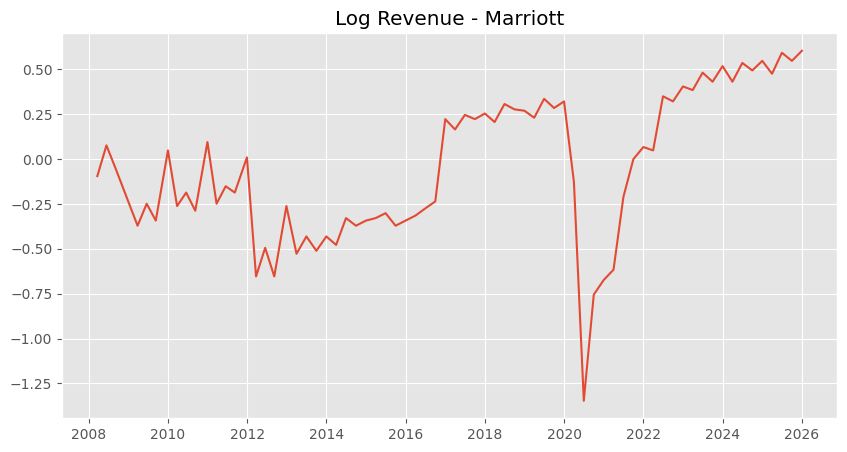


ADF Test for Marriott (Log)
ADF Statistic: -2.3728356773985073
p-value: 0.14955055667512301
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653


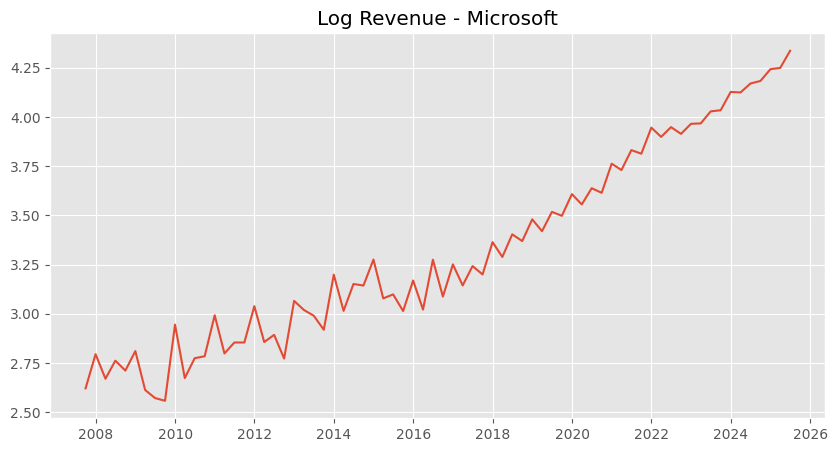


ADF Test for Microsoft (Log)
ADF Statistic: 2.4172034290680915
p-value: 0.9990181770757949
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776


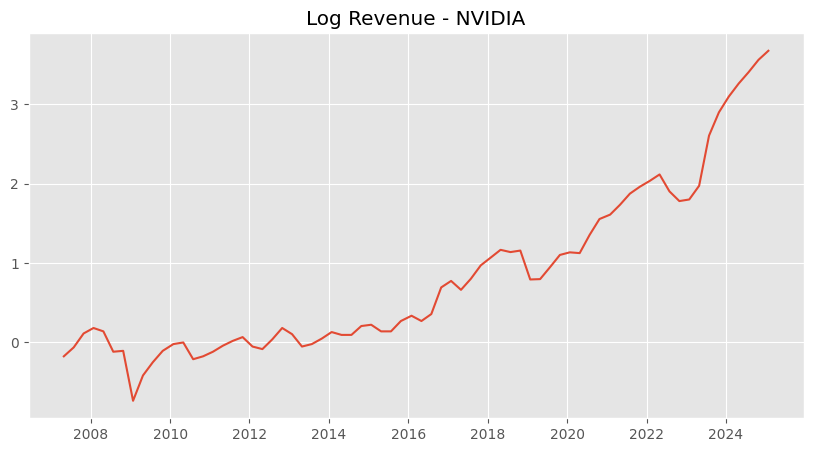


ADF Test for NVIDIA (Log)
ADF Statistic: 1.6543013011224952
p-value: 0.998011676576678
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312


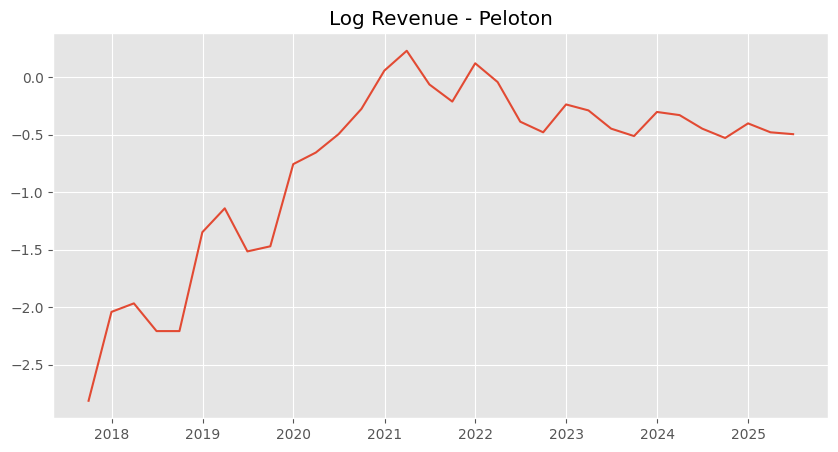


ADF Test for Peloton (Log)
ADF Statistic: -4.306798511383602
p-value: 0.0004323234921741464
Critical Values:
   1%: -3.7529275211638033
   5%: -2.998499866852963
   10%: -2.6389669754253307


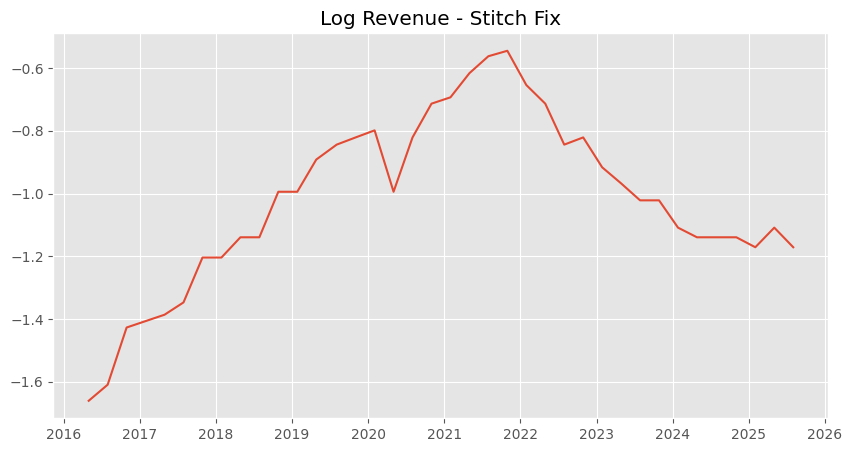


ADF Test for Stitch Fix (Log)
ADF Statistic: -2.603604445425016
p-value: 0.09225458790098734
Critical Values:
   1%: -3.626651907578875
   5%: -2.9459512825788754
   10%: -2.6116707716049383


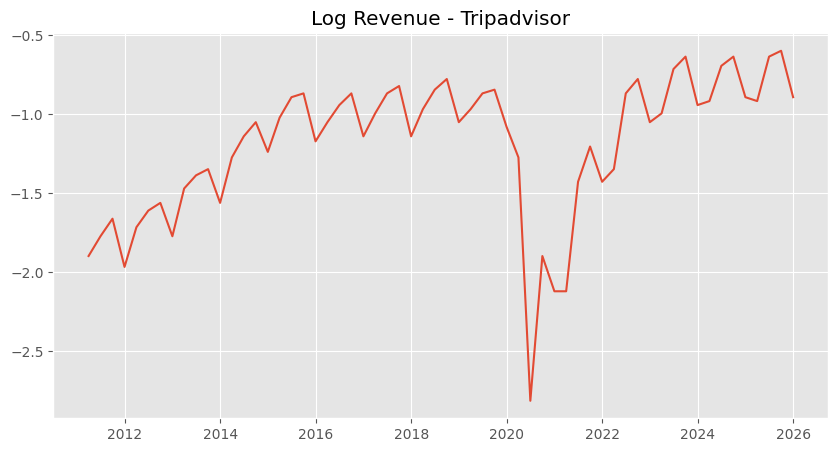


ADF Test for Tripadvisor (Log)
ADF Statistic: -3.084119153546913
p-value: 0.027750983752156975
Critical Values:
   1%: -3.5463945337644063
   5%: -2.911939409384601
   10%: -2.5936515282964665


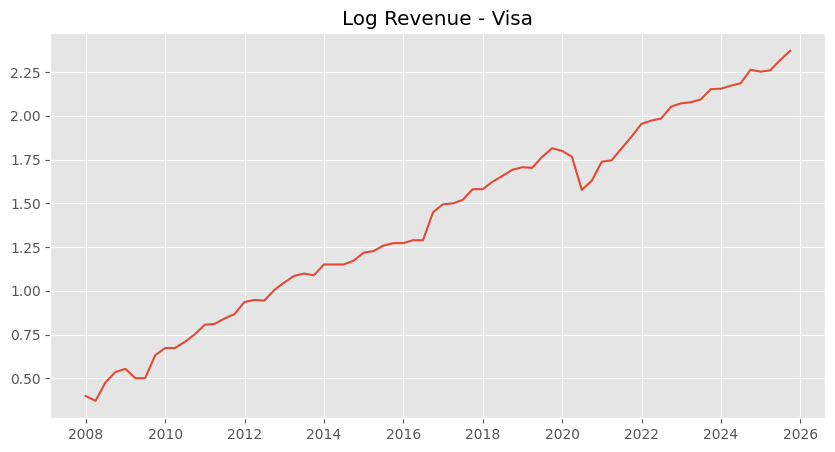


ADF Test for Visa (Log)
ADF Statistic: -0.5155179526520731
p-value: 0.8889525327358963
Critical Values:
   1%: -3.526004646825607
   5%: -2.9032002348069774
   10%: -2.5889948363419957


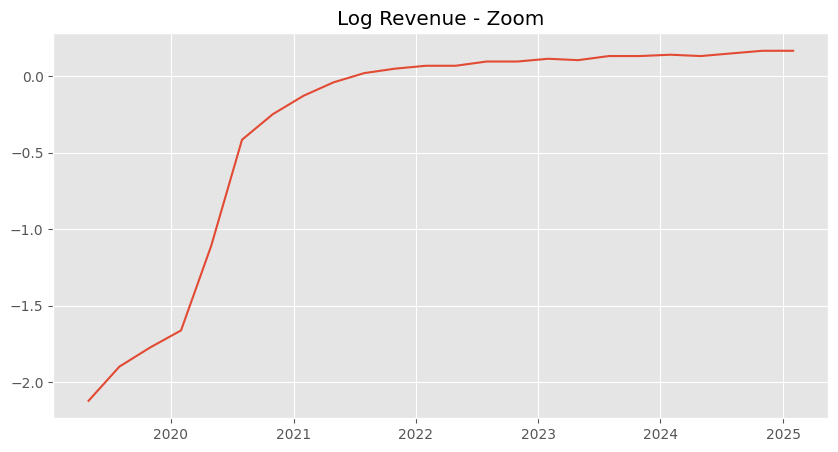


ADF Test for Zoom (Log)
ADF Statistic: -1.575330643458599
p-value: 0.49597276675782787
Critical Values:
   1%: -4.01203360058309
   5%: -3.1041838775510207
   10%: -2.6909873469387753


In [50]:
for company in data["company"].unique():
    
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    
    log_ts = np.log(ts)
    
    plt.figure(figsize=(10,5))
    plt.plot(log_ts)
    plt.title(f"Log Revenue - {company}")
    plt.show()
    
    adf_test(log_ts, f"{company} (Log)")


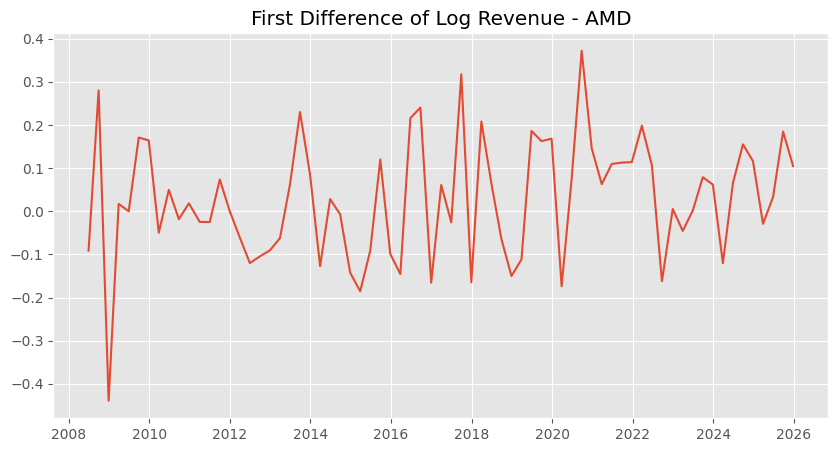


ADF Test for AMD (Diff Log)
ADF Statistic: -8.365825687712807
p-value: 2.744796079043999e-13
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653


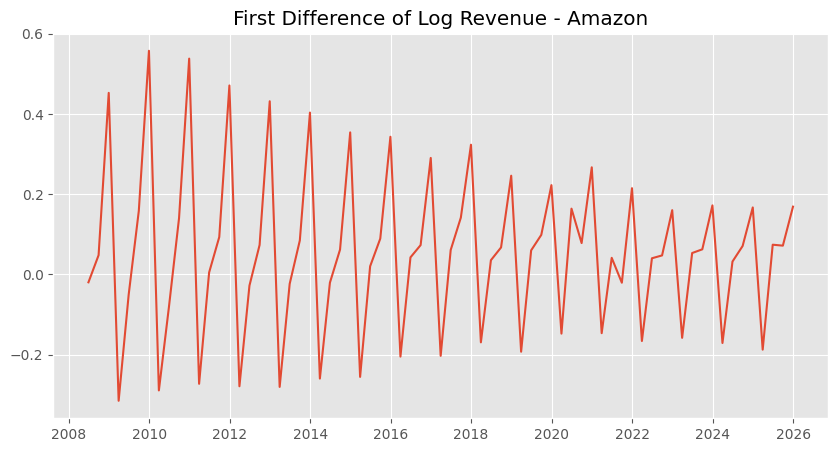


ADF Test for Amazon (Diff Log)
ADF Statistic: -1.818751676157091
p-value: 0.37119254591285344
Critical Values:
   1%: -3.5386953618719676
   5%: -2.9086446751210775
   10%: -2.591896782564878


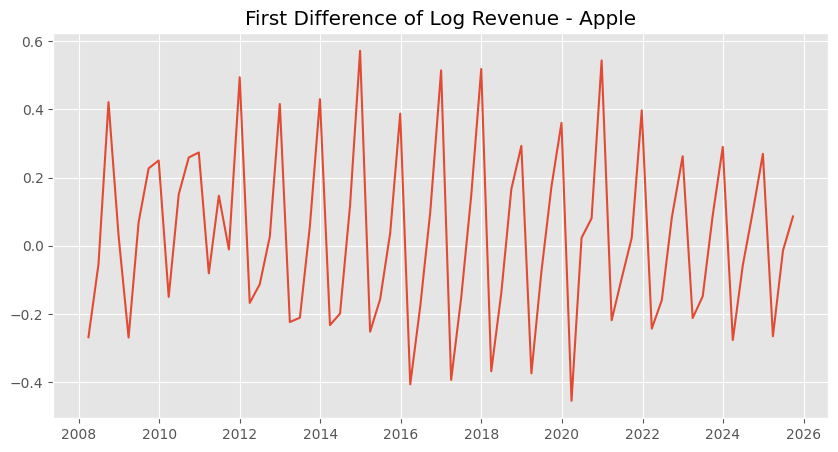


ADF Test for Apple (Diff Log)
ADF Statistic: -2.3909682797110916
p-value: 0.14430178820058104
Critical Values:
   1%: -3.5319549603840894
   5%: -2.905755128523123
   10%: -2.5903569458676765


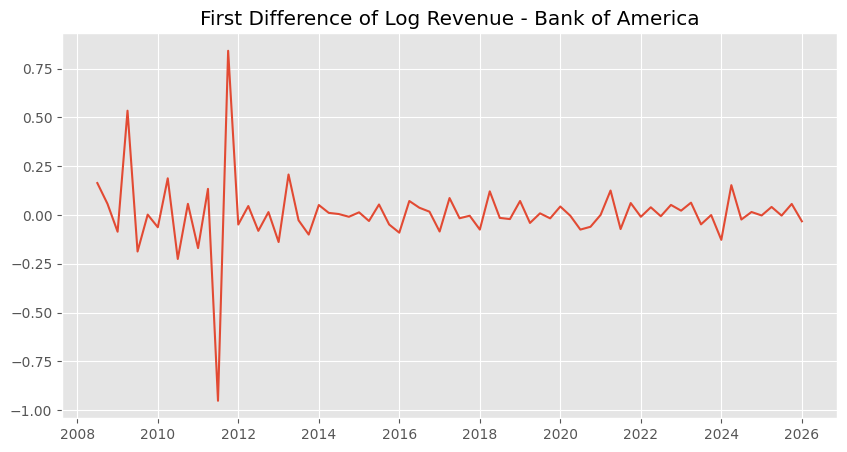


ADF Test for Bank of America (Diff Log)
ADF Statistic: -3.864975492792764
p-value: 0.0023082745103437767
Critical Values:
   1%: -3.5386953618719676
   5%: -2.9086446751210775
   10%: -2.591896782564878


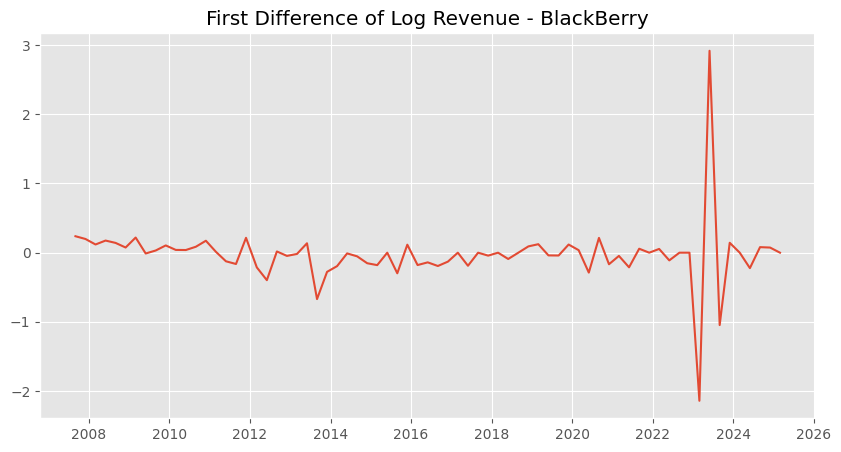


ADF Test for BlackBerry (Diff Log)
ADF Statistic: -9.302606409333324
p-value: 1.1021443739363861e-15
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312


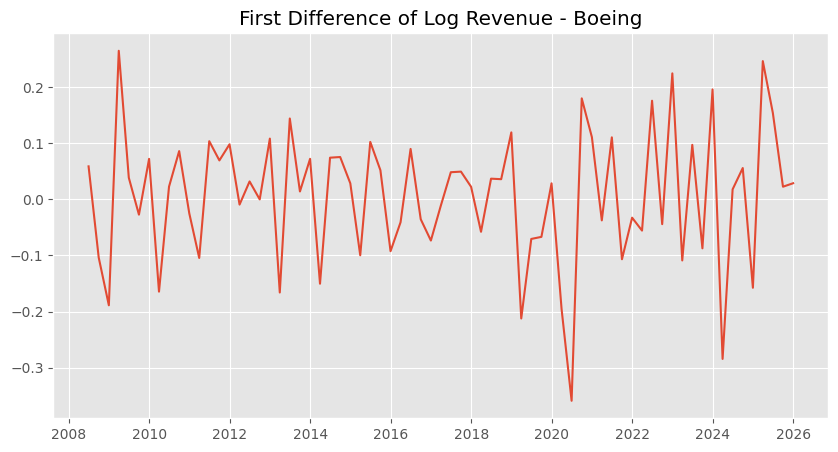


ADF Test for Boeing (Diff Log)
ADF Statistic: -10.71623190818368
p-value: 3.236178765872995e-19
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653


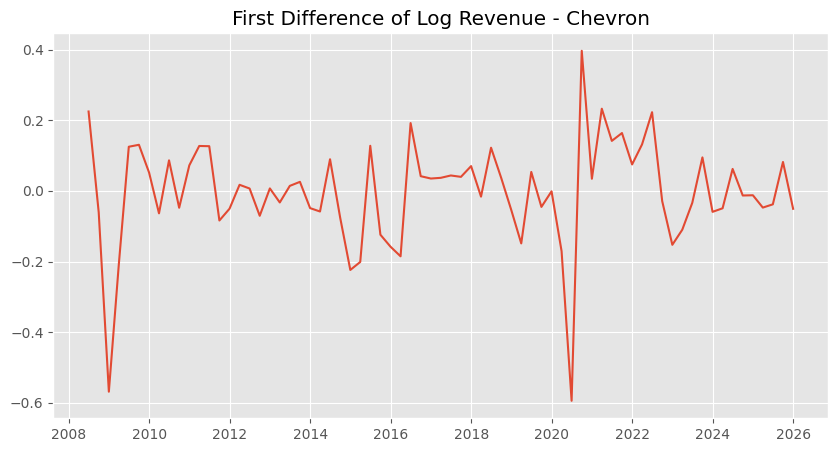


ADF Test for Chevron (Diff Log)
ADF Statistic: -7.529539812547098
p-value: 3.6091161371044976e-11
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653


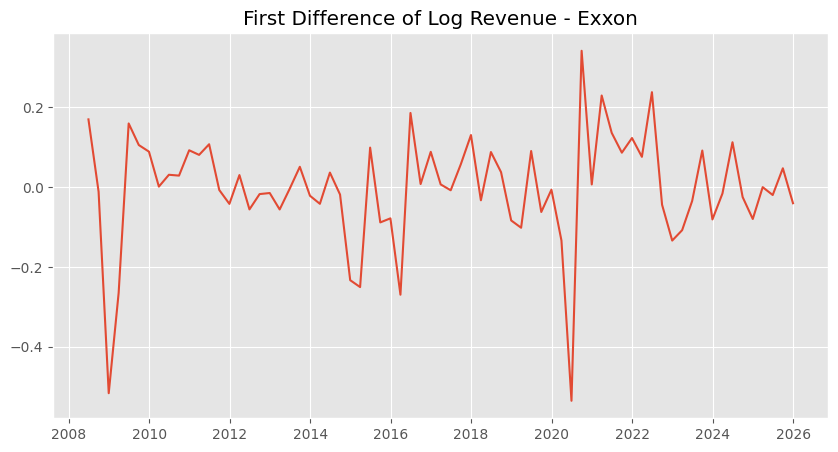


ADF Test for Exxon (Diff Log)
ADF Statistic: -7.674333513491965
p-value: 1.56329940226478e-11
Critical Values:
   1%: -3.5274258688046647
   5%: -2.903810816326531
   10%: -2.5893204081632653


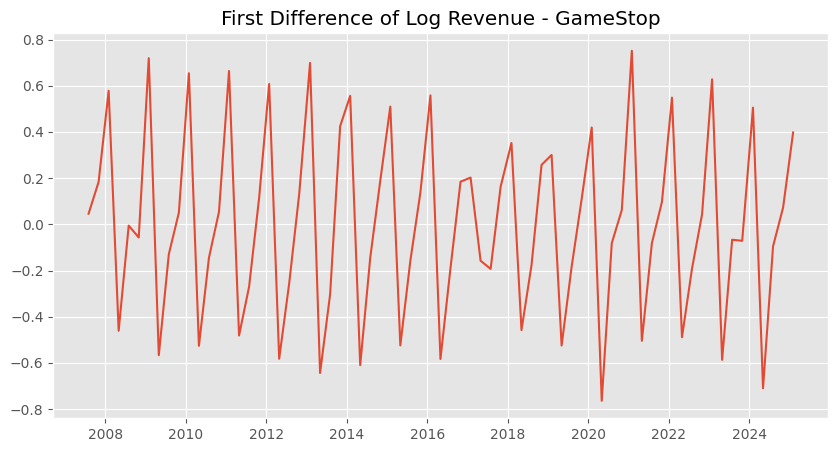


ADF Test for GameStop (Diff Log)
ADF Statistic: -3.613180990241107
p-value: 0.0055139782567180514
Critical Values:
   1%: -3.53692771987915
   5%: -2.907887369384766
   10%: -2.591493291015625


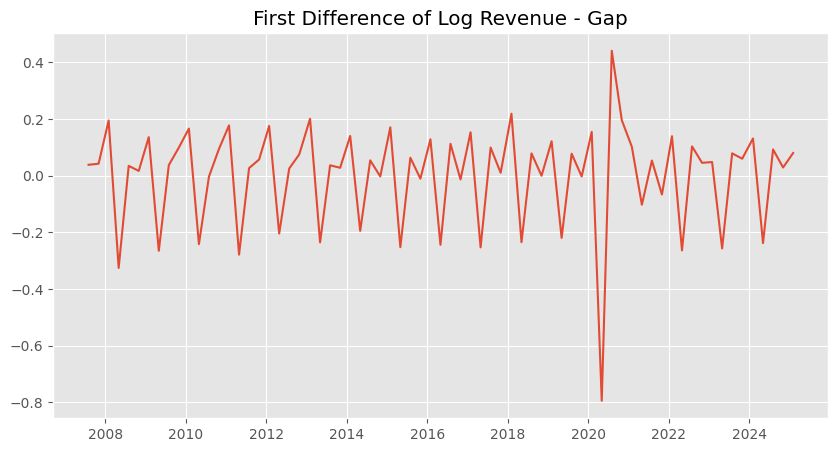


ADF Test for Gap (Diff Log)
ADF Statistic: -4.953916834431615
p-value: 2.7357686218780637e-05
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776


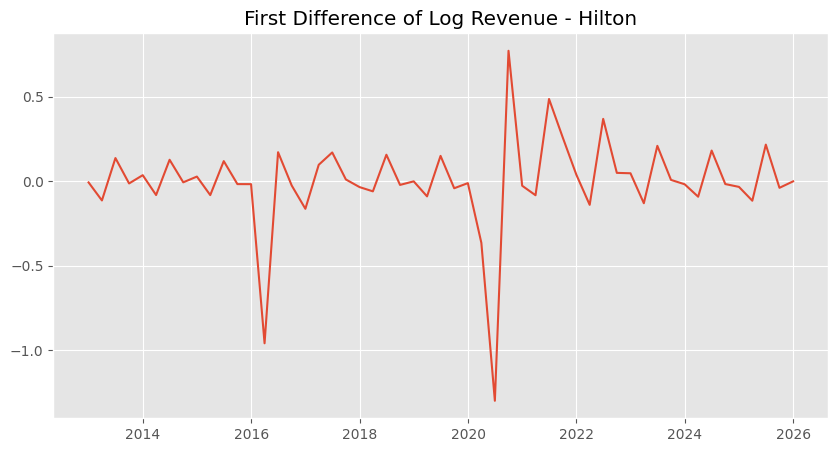


ADF Test for Hilton (Diff Log)
ADF Statistic: -8.53878436150952
p-value: 9.912482155361767e-14
Critical Values:
   1%: -3.562878534649522
   5%: -2.918973284023669
   10%: -2.597393446745562


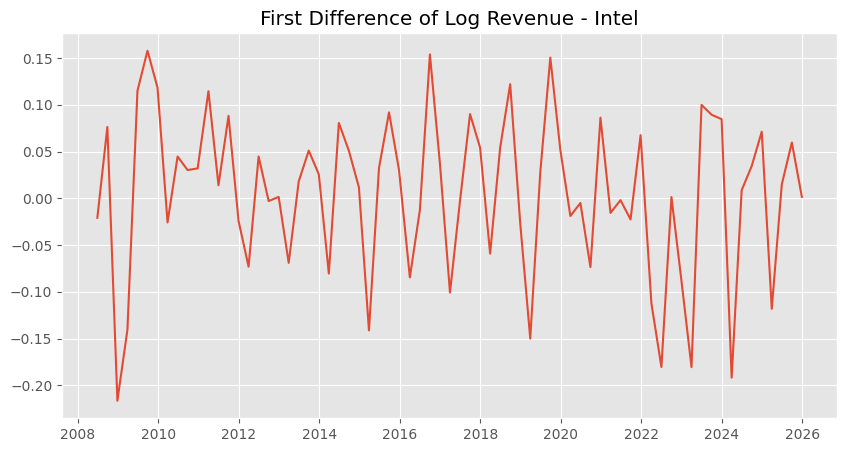


ADF Test for Intel (Diff Log)
ADF Statistic: -4.055817556039315
p-value: 0.0011448456076953745
Critical Values:
   1%: -3.5319549603840894
   5%: -2.905755128523123
   10%: -2.5903569458676765


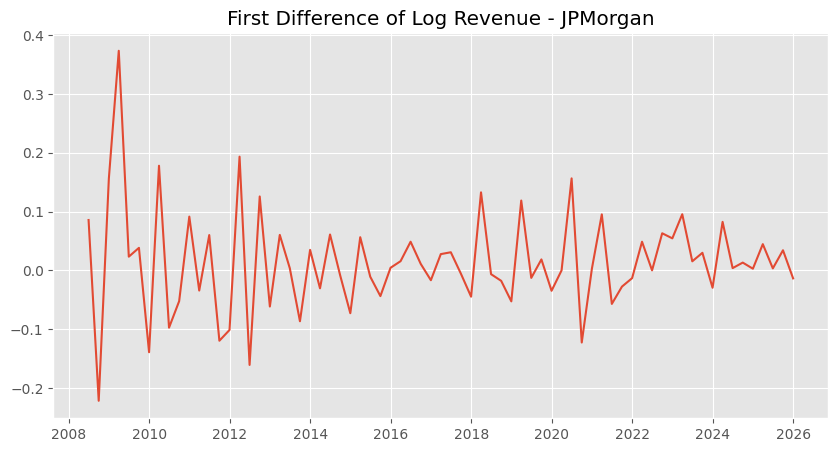


ADF Test for JPMorgan (Diff Log)
ADF Statistic: -3.262219415176048
p-value: 0.016654077749765017
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776


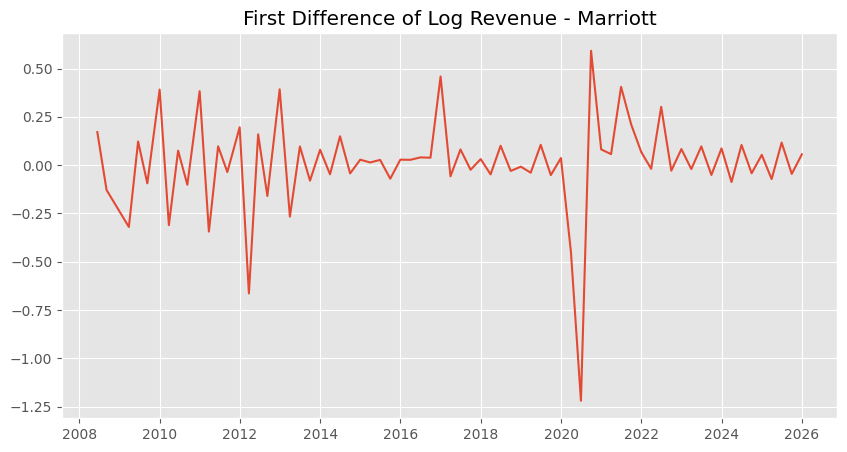


ADF Test for Marriott (Diff Log)
ADF Statistic: -10.604279540370701
p-value: 6.058947703172232e-19
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312


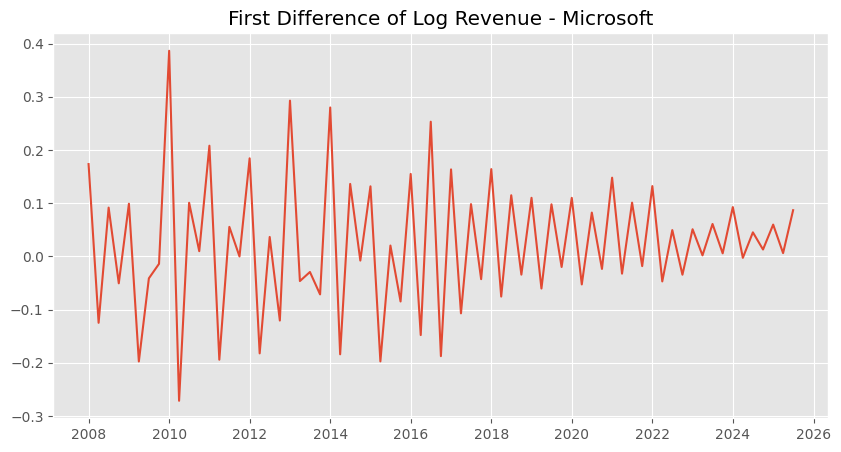


ADF Test for Microsoft (Diff Log)
ADF Statistic: -1.2790993063986844
p-value: 0.6386793417169193
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944


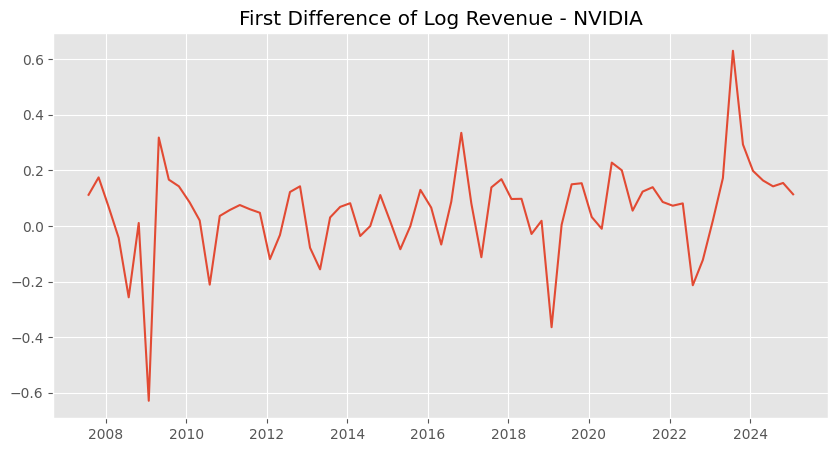


ADF Test for NVIDIA (Diff Log)
ADF Statistic: -5.178705616386238
p-value: 9.716205016477333e-06
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312


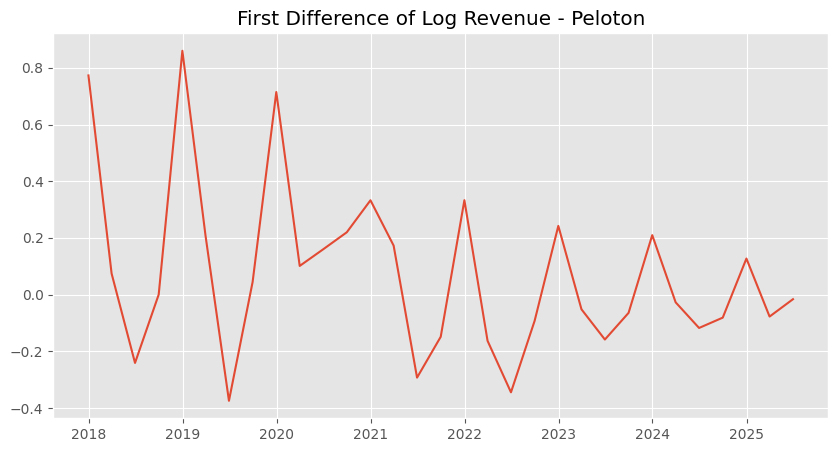


ADF Test for Peloton (Diff Log)
ADF Statistic: -0.7959461853406324
p-value: 0.8203099456827302
Critical Values:
   1%: -3.7529275211638033
   5%: -2.998499866852963
   10%: -2.6389669754253307


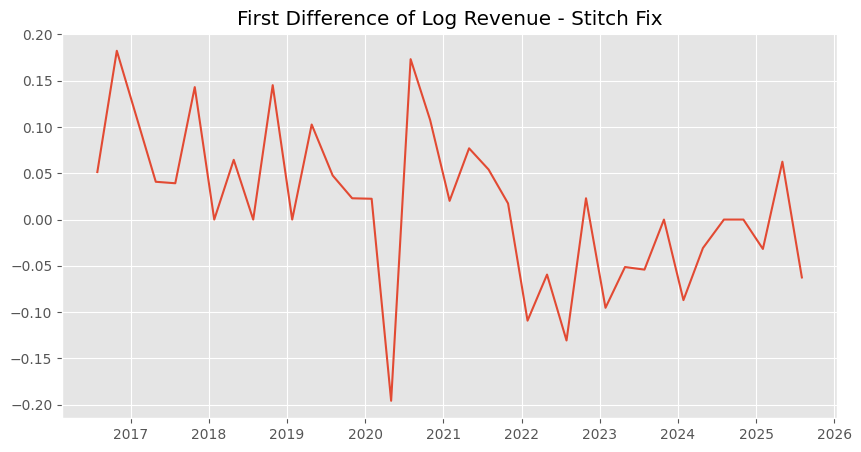


ADF Test for Stitch Fix (Diff Log)
ADF Statistic: -5.141028687463679
p-value: 1.1586573864116155e-05
Critical Values:
   1%: -3.6327426647230316
   5%: -2.9485102040816327
   10%: -2.6130173469387756


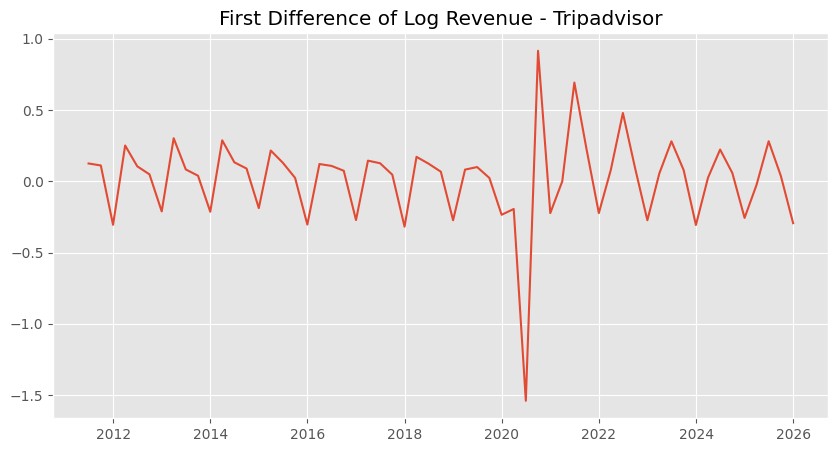


ADF Test for Tripadvisor (Diff Log)
ADF Statistic: -9.624950131516282
p-value: 1.6702649932161467e-16
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944


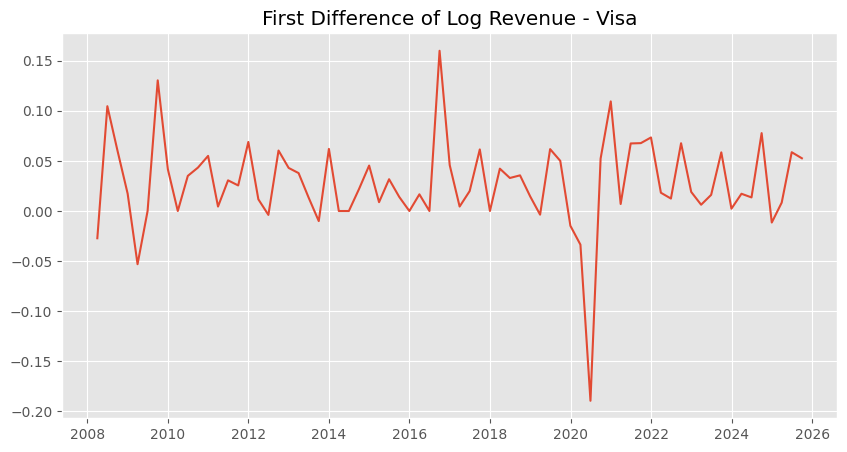


ADF Test for Visa (Diff Log)
ADF Statistic: -7.596484474336373
p-value: 2.4526772818493632e-11
Critical Values:
   1%: -3.528889992207215
   5%: -2.9044395987933362
   10%: -2.589655654274312


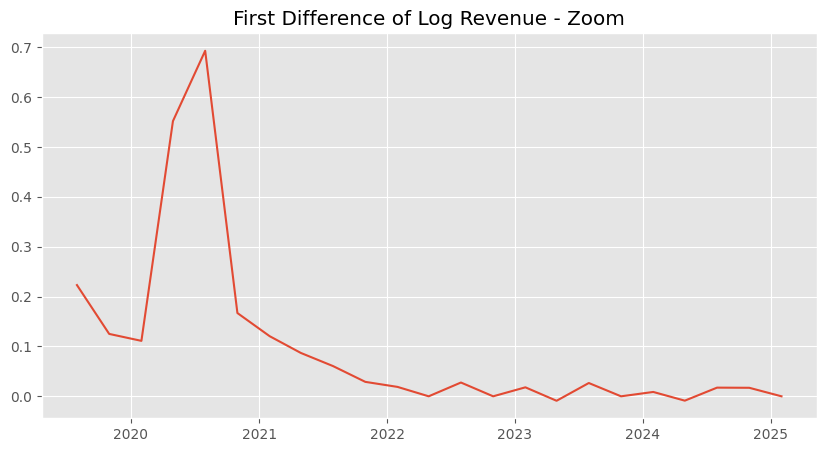


ADF Test for Zoom (Diff Log)
ADF Statistic: -3.903579022812199
p-value: 0.002008664785988285
Critical Values:
   1%: -4.01203360058309
   5%: -3.1041838775510207
   10%: -2.6909873469387753


In [51]:
for company in data["company"].unique():
    
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    
    log_ts = np.log(ts)
    diff_ts = log_ts.diff().dropna()
    
    plt.figure(figsize=(10,5))
    plt.plot(diff_ts)
    plt.title(f"First Difference of Log Revenue - {company}")
    plt.show()
    
    adf_test(diff_ts, f"{company} (Diff Log)")


<Figure size 1200x500 with 0 Axes>

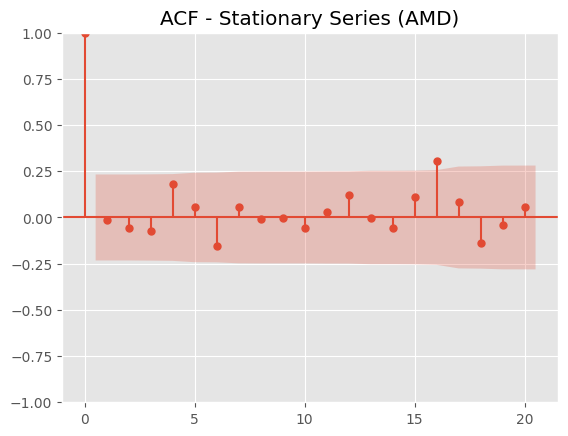

<Figure size 1200x500 with 0 Axes>

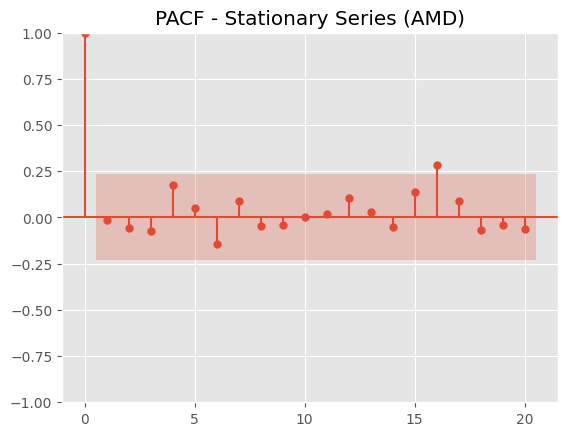

<Figure size 1200x500 with 0 Axes>

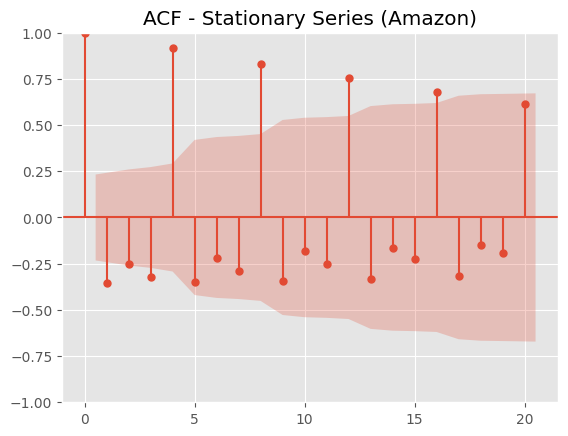

<Figure size 1200x500 with 0 Axes>

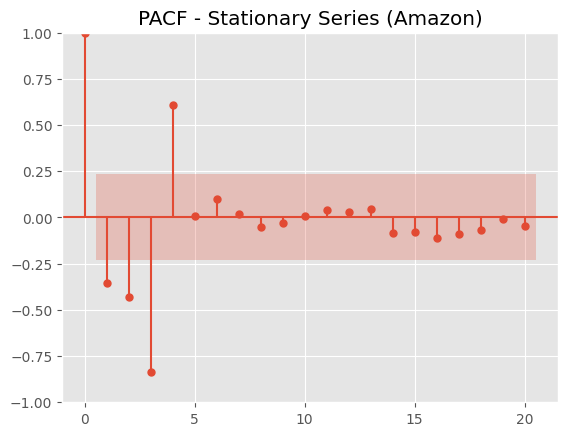

<Figure size 1200x500 with 0 Axes>

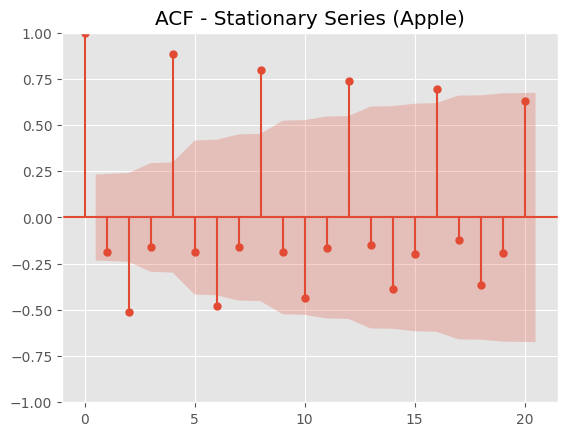

<Figure size 1200x500 with 0 Axes>

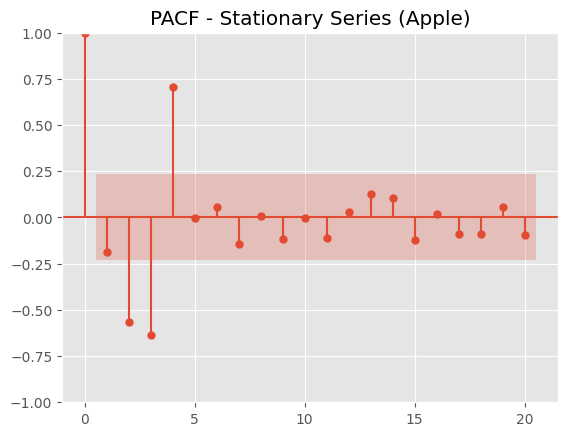

<Figure size 1200x500 with 0 Axes>

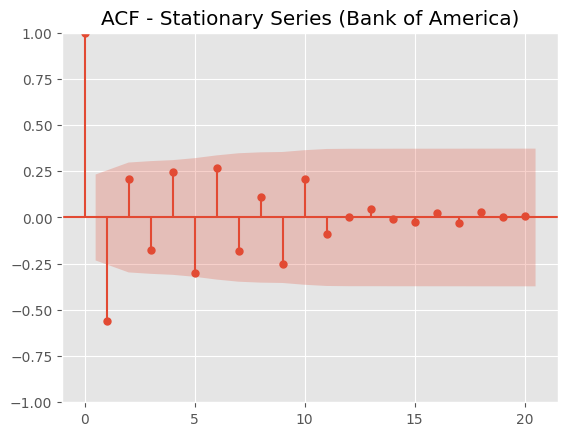

<Figure size 1200x500 with 0 Axes>

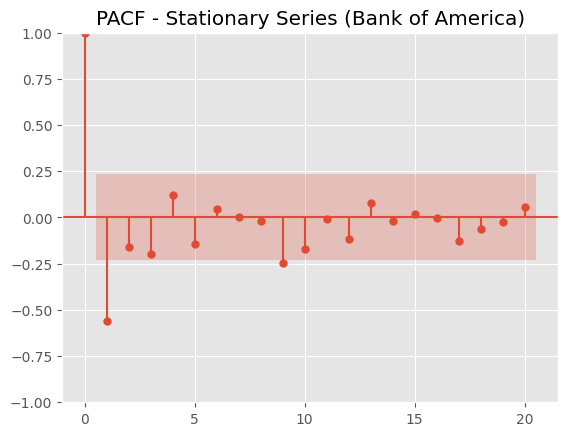

<Figure size 1200x500 with 0 Axes>

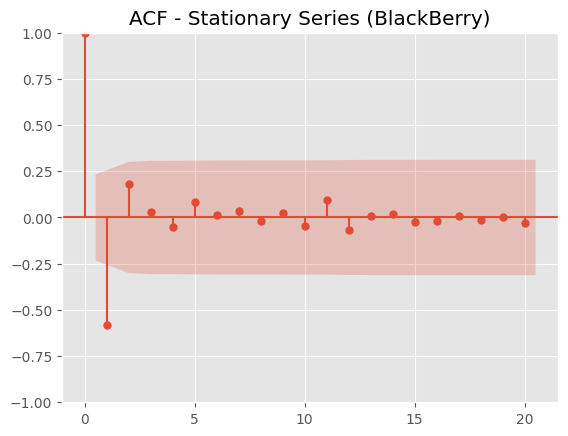

<Figure size 1200x500 with 0 Axes>

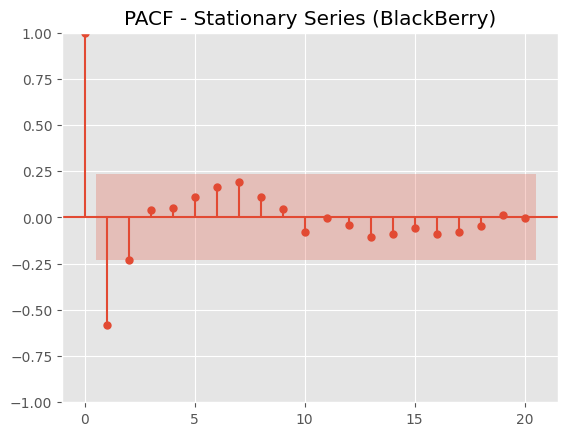

<Figure size 1200x500 with 0 Axes>

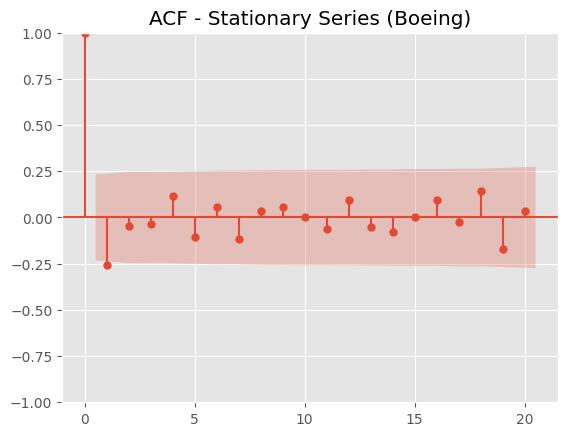

<Figure size 1200x500 with 0 Axes>

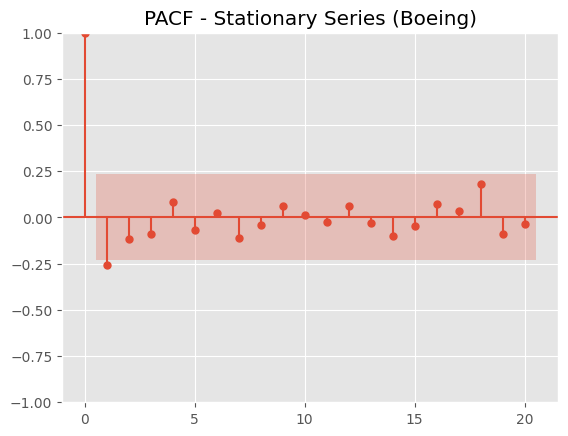

<Figure size 1200x500 with 0 Axes>

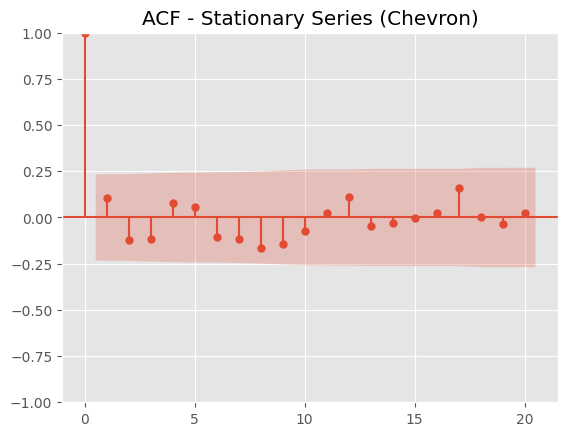

<Figure size 1200x500 with 0 Axes>

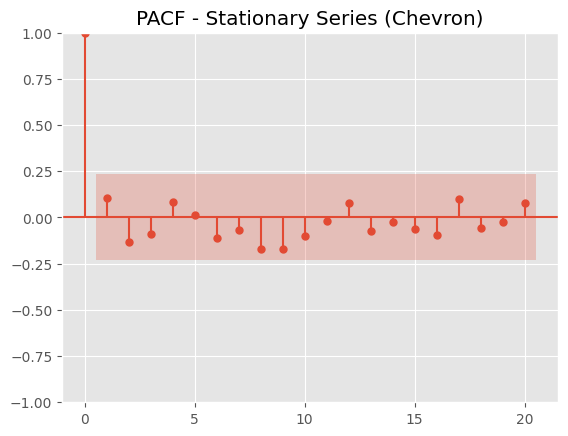

<Figure size 1200x500 with 0 Axes>

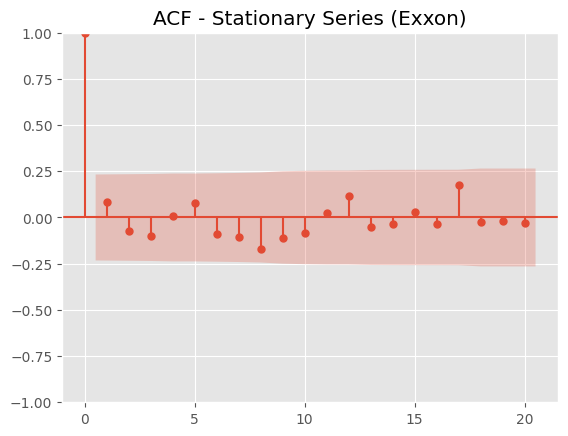

<Figure size 1200x500 with 0 Axes>

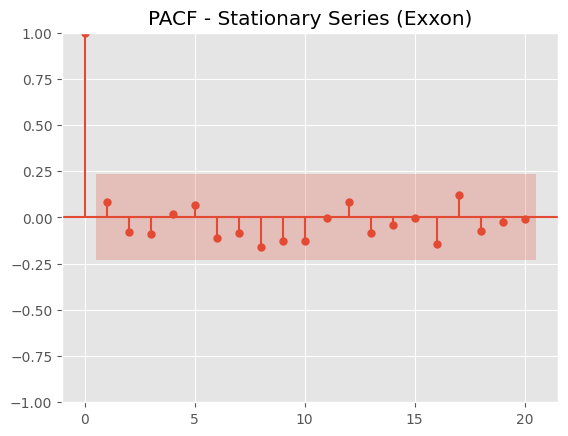

<Figure size 1200x500 with 0 Axes>

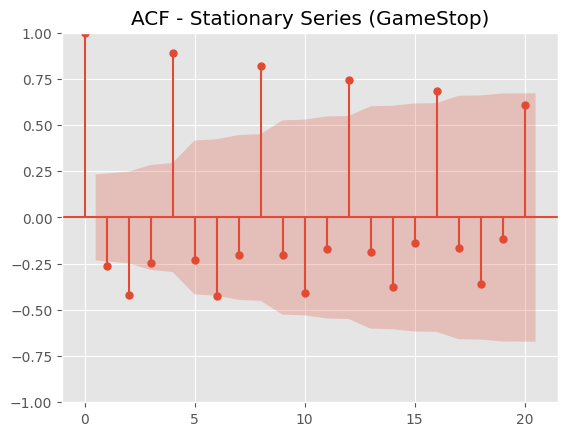

<Figure size 1200x500 with 0 Axes>

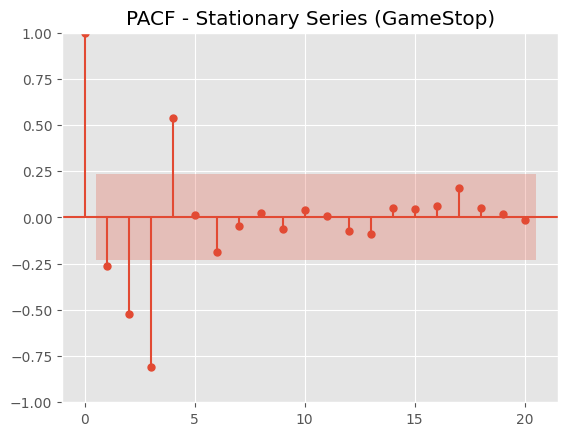

<Figure size 1200x500 with 0 Axes>

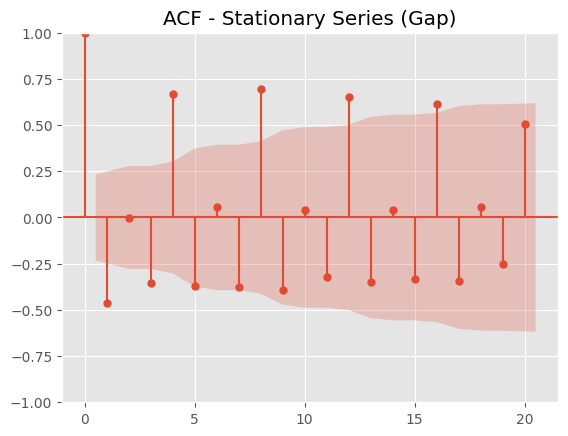

<Figure size 1200x500 with 0 Axes>

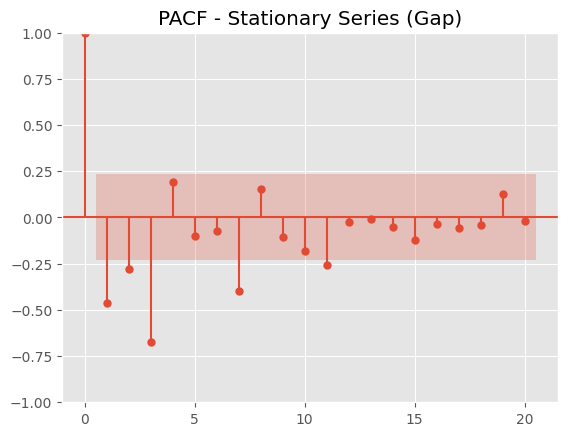

<Figure size 1200x500 with 0 Axes>

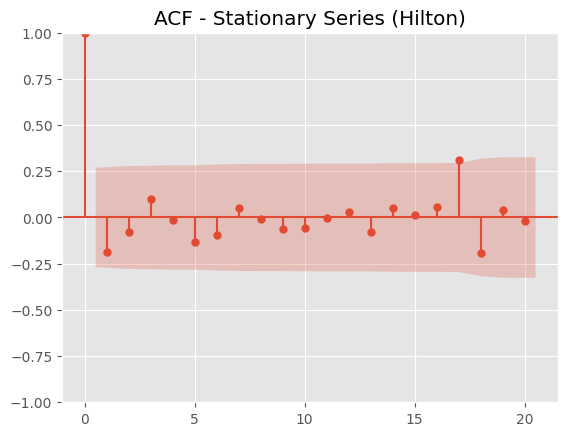

<Figure size 1200x500 with 0 Axes>

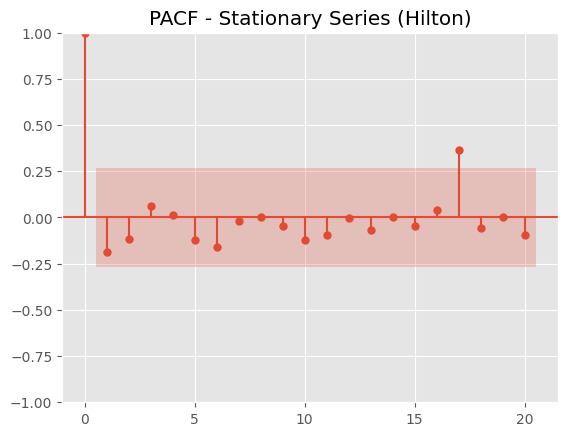

<Figure size 1200x500 with 0 Axes>

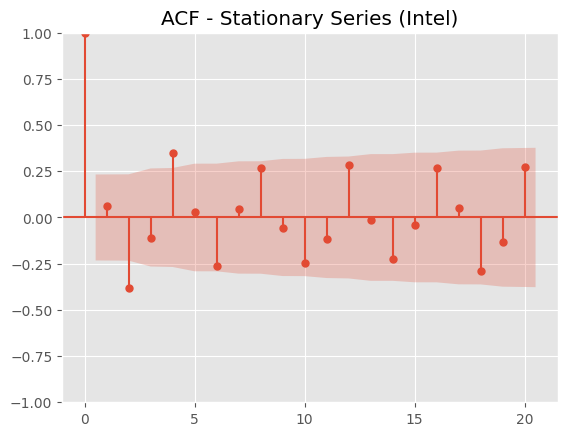

<Figure size 1200x500 with 0 Axes>

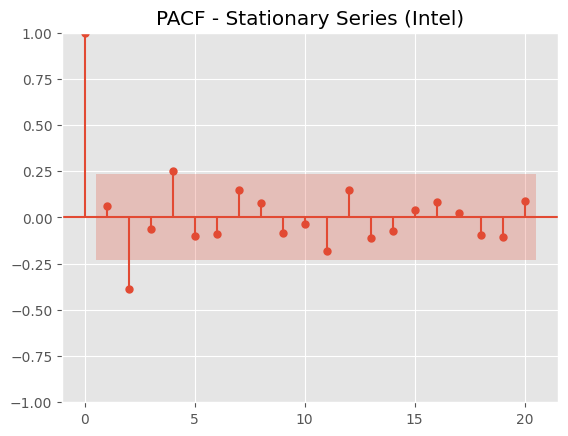

<Figure size 1200x500 with 0 Axes>

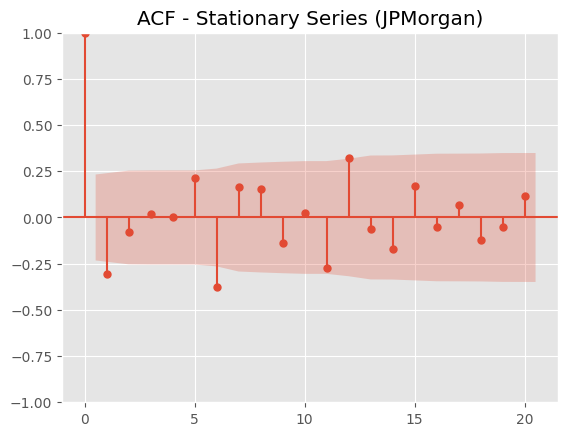

<Figure size 1200x500 with 0 Axes>

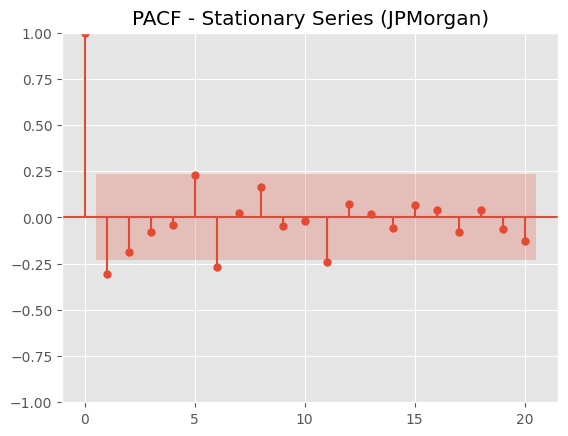

<Figure size 1200x500 with 0 Axes>

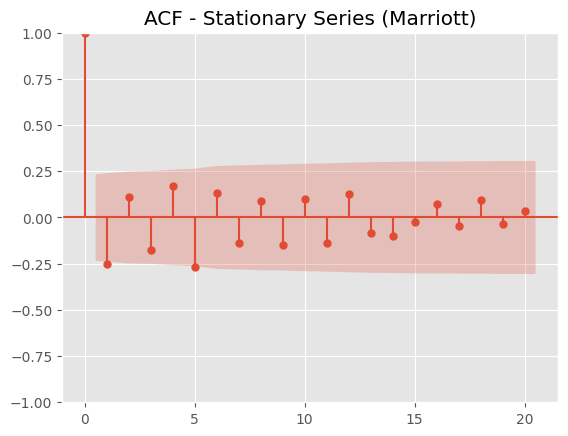

<Figure size 1200x500 with 0 Axes>

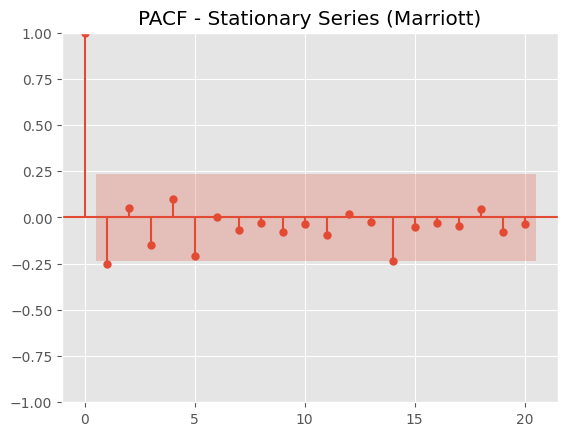

<Figure size 1200x500 with 0 Axes>

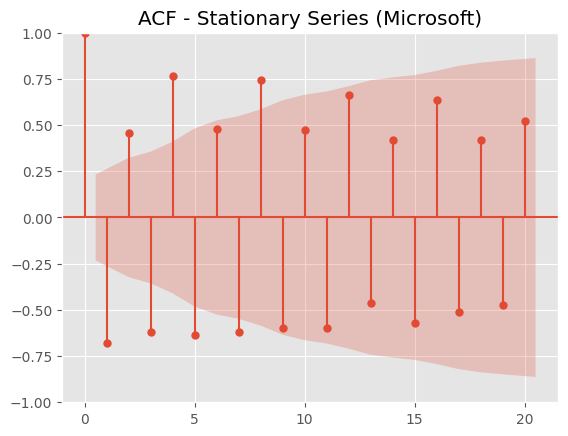

<Figure size 1200x500 with 0 Axes>

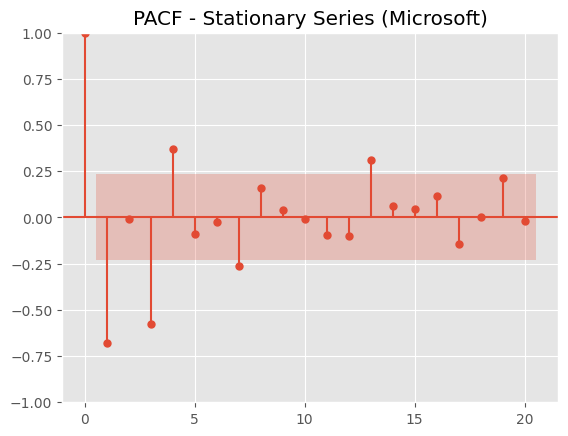

<Figure size 1200x500 with 0 Axes>

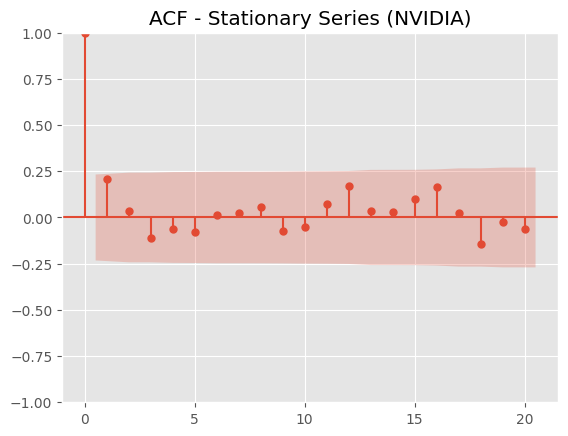

<Figure size 1200x500 with 0 Axes>

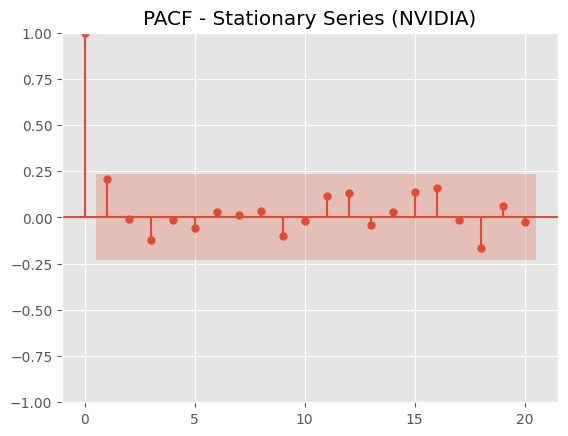

<Figure size 1200x500 with 0 Axes>

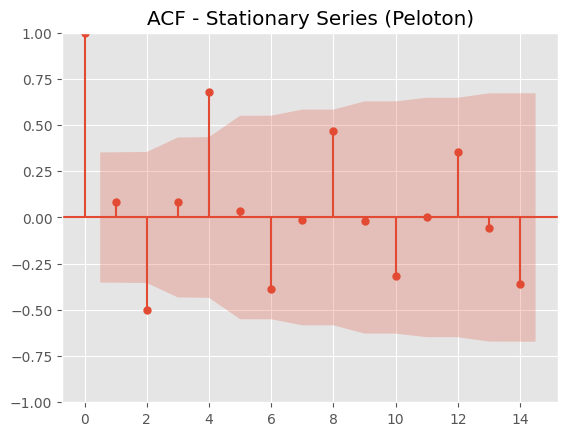

<Figure size 1200x500 with 0 Axes>

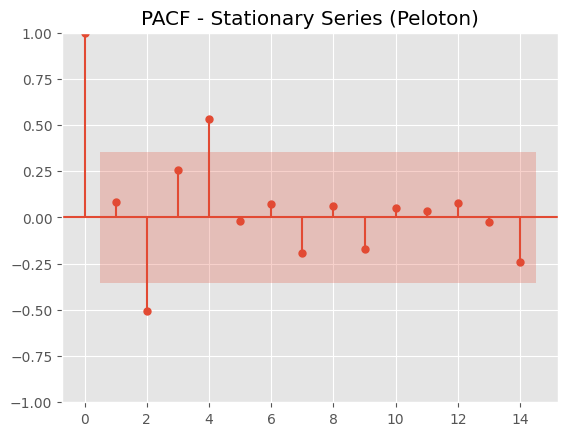

<Figure size 1200x500 with 0 Axes>

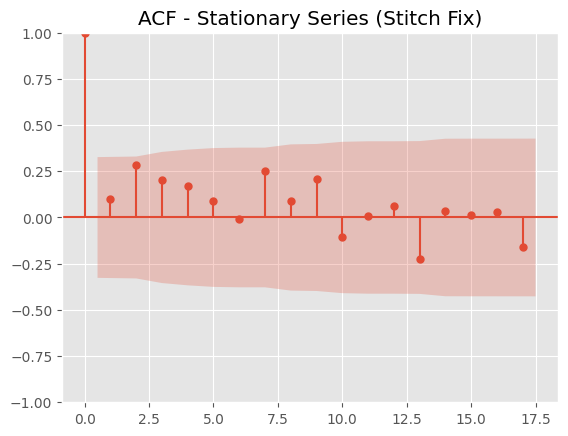

<Figure size 1200x500 with 0 Axes>

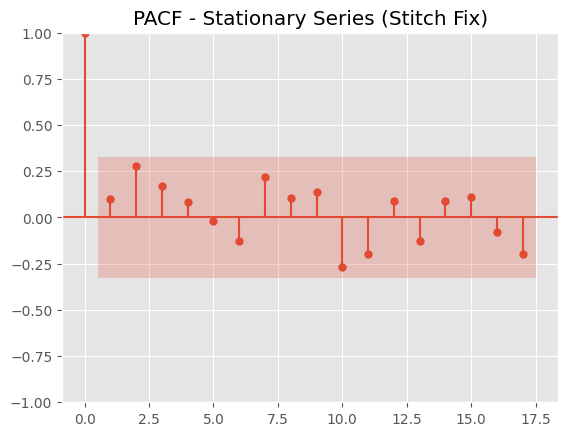

<Figure size 1200x500 with 0 Axes>

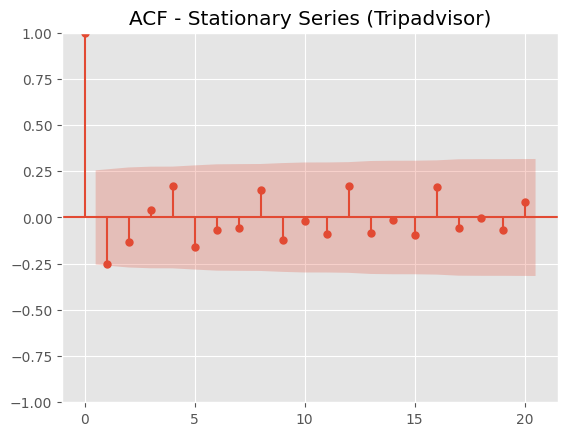

<Figure size 1200x500 with 0 Axes>

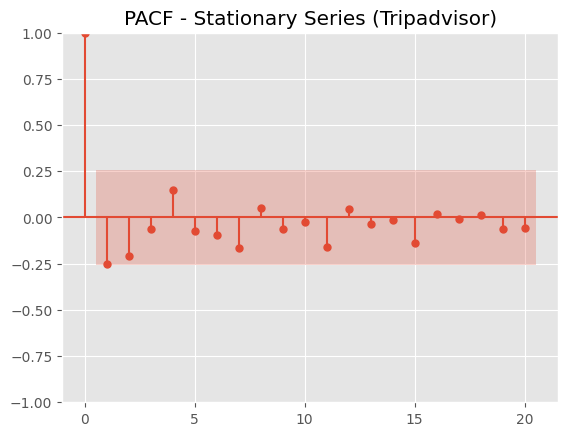

<Figure size 1200x500 with 0 Axes>

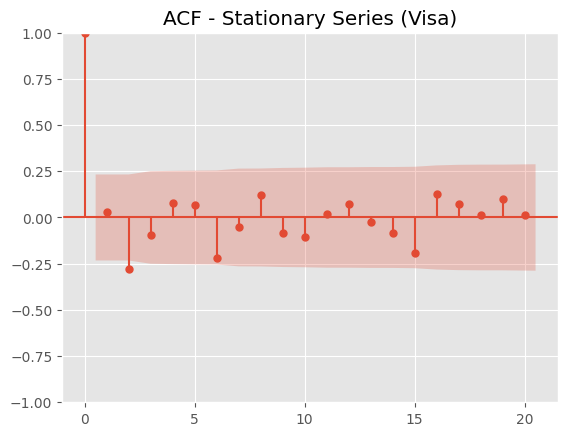

<Figure size 1200x500 with 0 Axes>

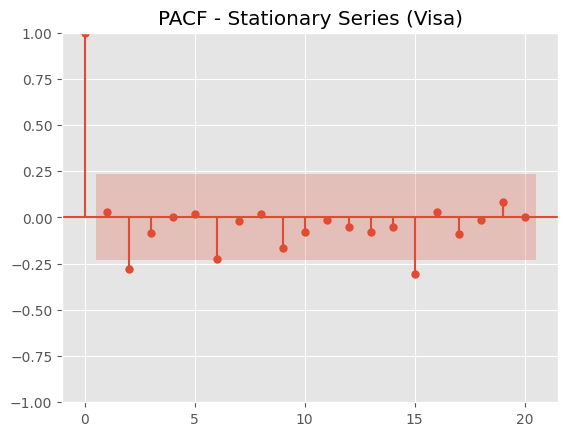

<Figure size 1200x500 with 0 Axes>

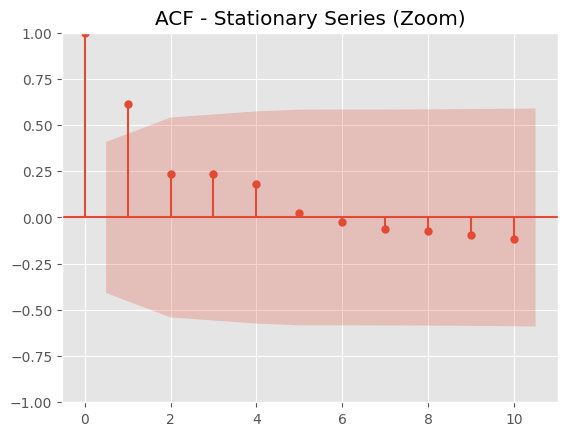

<Figure size 1200x500 with 0 Axes>

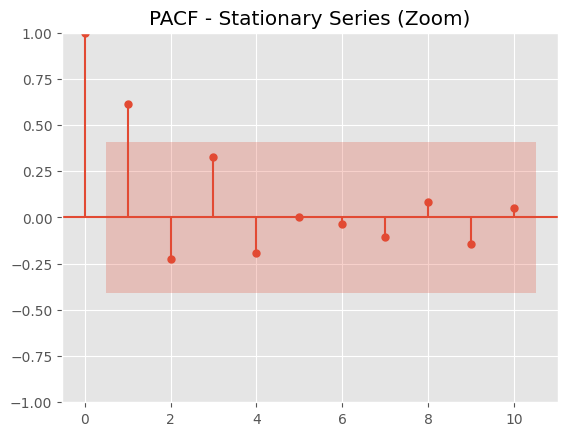

In [52]:
for company in data["company"].unique():
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )

    diff_ts = np.log(ts).diff().dropna()
    safe_lags = max(1, min(20, (len(diff_ts) // 2) - 1))

    plt.figure(figsize=(12,5))
    plot_acf(diff_ts, lags=safe_lags)
    plt.title(f"ACF - Stationary Series ({company})")
    plt.show()

    plt.figure(figsize=(12,5))
    plot_pacf(diff_ts, lags=safe_lags, method='ywm')
    plt.title(f"PACF - Stationary Series ({company})")
    plt.show()


In [53]:
from statsmodels.tsa.stattools import adfuller
import numpy as np

def check_stationarity_full(ts, company_name):
    
    print(f"\n===== {company_name} =====")
    
    # 1. Log transformation
    ts_log = np.log(ts)
    
    # 2. ADF test before differencing
    result = adfuller(ts_log.dropna())
    print("ADF Test on Log Series")
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    
    if result[1] > 0.05:
        print("Series is NOT stationary → applying first differencing\n")
        
        ts_diff = ts_log.diff().dropna()
        
        result_diff = adfuller(ts_diff)
        print("ADF Test After Differencing")
        print(f"ADF Statistic: {result_diff[0]}")
        print(f"p-value: {result_diff[1]}")
        
        if result_diff[1] < 0.05:
            print("Series became stationary after differencing.")
        else:
            print("Series is still NOT stationary.")
            
    else:
        print("Series is already stationary.")
        ts_diff = ts_log
        
    return ts_log, ts_diff


In [54]:
for company in data["company"].unique():
    ts = data[data["company"] == company] \
            .sort_values("date") \
            .set_index("date")["revenue"]
    
    ts_log, ts_diff = check_stationarity_full(ts, company)



===== AMD =====
ADF Test on Log Series
ADF Statistic: 0.6206288884476702
p-value: 0.9881132114120105
Series is NOT stationary → applying first differencing

ADF Test After Differencing
ADF Statistic: -8.365825687712807
p-value: 2.744796079043999e-13
Series became stationary after differencing.

===== Amazon =====
ADF Test on Log Series
ADF Statistic: -1.6948980505138997
p-value: 0.43374305337171776
Series is NOT stationary → applying first differencing

ADF Test After Differencing
ADF Statistic: -1.818751676157091
p-value: 0.37119254591285344
Series is still NOT stationary.

===== Apple =====
ADF Test on Log Series
ADF Statistic: -2.8057318133576135
p-value: 0.057459672379888714
Series is NOT stationary → applying first differencing

ADF Test After Differencing
ADF Statistic: -2.3909682797110916
p-value: 0.14430178820058104
Series is still NOT stationary.

===== Bank of America =====
ADF Test on Log Series
ADF Statistic: -3.5693499941571307
p-value: 0.006374761287793434
Series is alre

In [55]:
from statsmodels.tsa.stattools import acf, pacf

def identify_lags(ts_diff, company_name, max_lags=12):
    ts_diff = pd.Series(ts_diff).dropna()
    safe_lags = max(1, min(max_lags, (len(ts_diff) // 2) - 1))

    acf_vals = acf(ts_diff, nlags=safe_lags)
    pacf_vals = pacf(ts_diff, nlags=safe_lags)

    print(f"\nSignificant lags for {company_name}")

    threshold = 1.96 / np.sqrt(len(ts_diff))

    print("ACF significant lags:")
    for i in range(1, len(acf_vals)):
        if abs(acf_vals[i]) > threshold:
            print(f"Lag {i}: {acf_vals[i]}")

    print("\nPACF significant lags:")
    for i in range(1, len(pacf_vals)):
        if abs(pacf_vals[i]) > threshold:
            print(f"Lag {i}: {pacf_vals[i]}")


In [56]:
for company in data["company"].unique():
    ts = data[data["company"] == company] \
            .sort_values("date") \
            .set_index("date")["revenue"]
    _, ts_diff = check_stationarity_full(ts, company)
    identify_lags(ts_diff, company)



===== AMD =====
ADF Test on Log Series
ADF Statistic: 0.6206288884476702
p-value: 0.9881132114120105
Series is NOT stationary → applying first differencing

ADF Test After Differencing
ADF Statistic: -8.365825687712807
p-value: 2.744796079043999e-13
Series became stationary after differencing.

Significant lags for AMD
ACF significant lags:

PACF significant lags:

===== Amazon =====
ADF Test on Log Series
ADF Statistic: -1.6948980505138997
p-value: 0.43374305337171776
Series is NOT stationary → applying first differencing

ADF Test After Differencing
ADF Statistic: -1.818751676157091
p-value: 0.37119254591285344
Series is still NOT stationary.

Significant lags for Amazon
ACF significant lags:
Lag 1: -0.3521936768188675
Lag 2: -0.251183280712885
Lag 3: -0.32045171303970604
Lag 4: 0.9152888291545714
Lag 5: -0.35127787834568613
Lag 7: -0.2883319345070391
Lag 8: 0.8308648894988511
Lag 9: -0.3443511424092857
Lag 11: -0.2524614524567641
Lag 12: 0.7538785696759154

PACF significant lags:
L

In [57]:
# def adf_test(series):
#     result = adfuller(series.dropna())
    
#     print("ADF Statistic:", result[0])
#     print("p-value:", result[1])
#     print("Critical Values:")
    
#     for key, value in result[4].items():
#         print(f"   {key}: {value}")
        
# adf_test(data['revenue'])


<Figure size 1000x500 with 0 Axes>

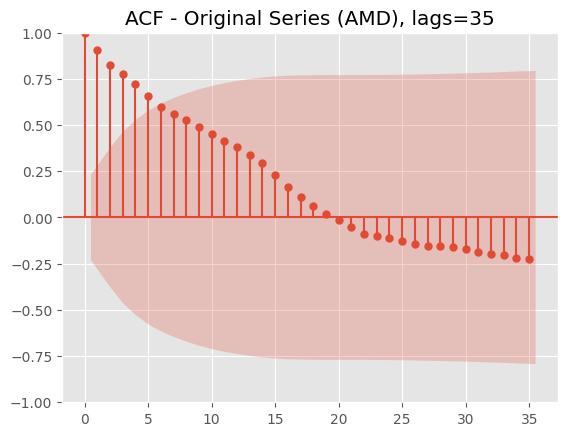

<Figure size 1000x500 with 0 Axes>

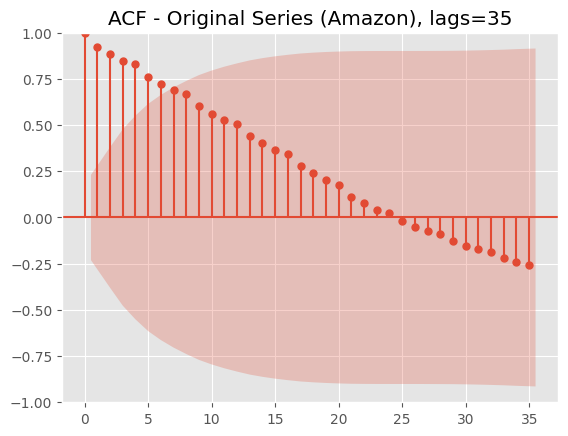

<Figure size 1000x500 with 0 Axes>

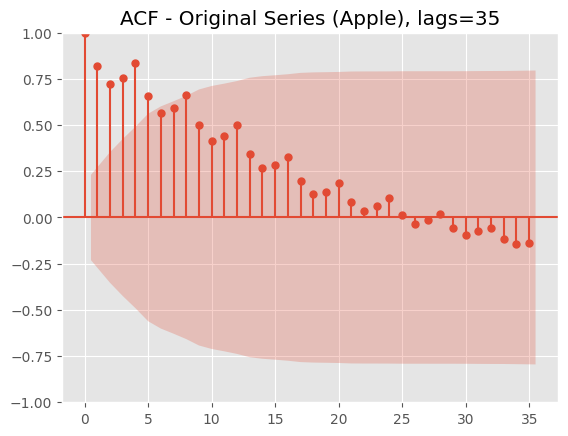

<Figure size 1000x500 with 0 Axes>

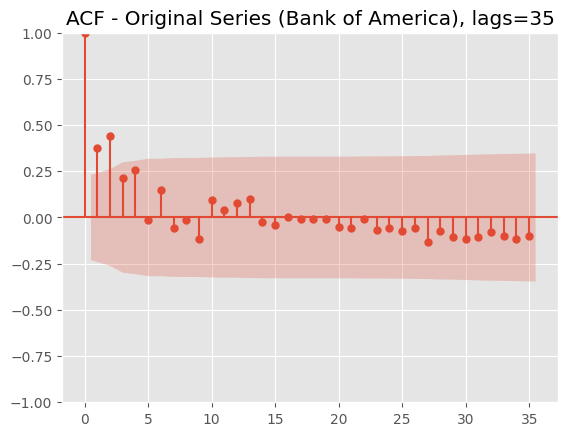

<Figure size 1000x500 with 0 Axes>

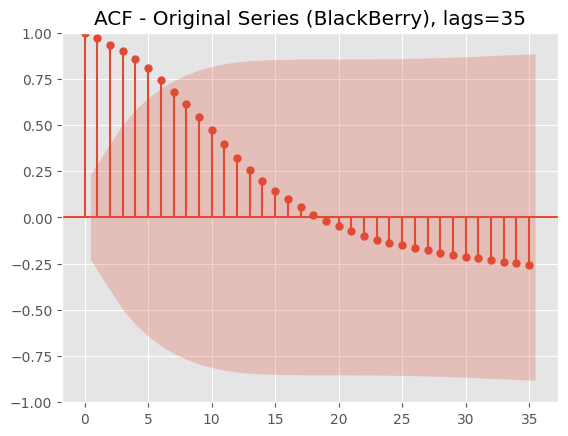

<Figure size 1000x500 with 0 Axes>

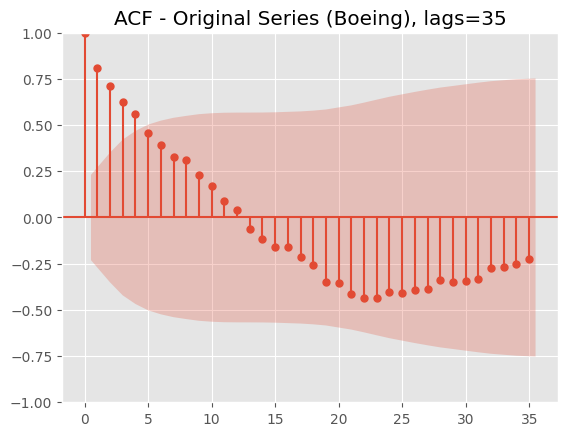

<Figure size 1000x500 with 0 Axes>

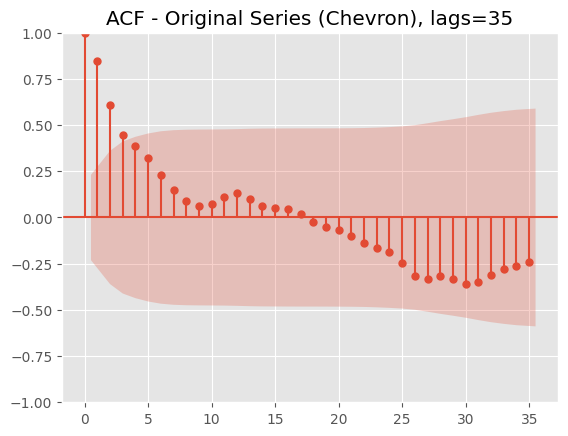

<Figure size 1000x500 with 0 Axes>

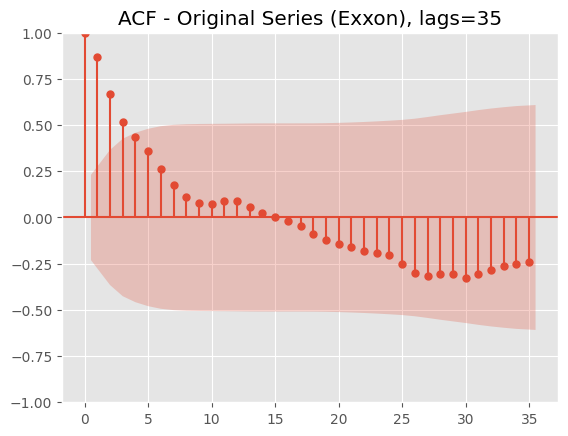

<Figure size 1000x500 with 0 Axes>

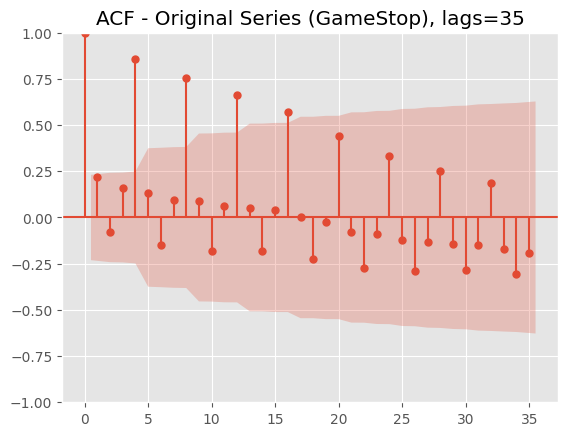

<Figure size 1000x500 with 0 Axes>

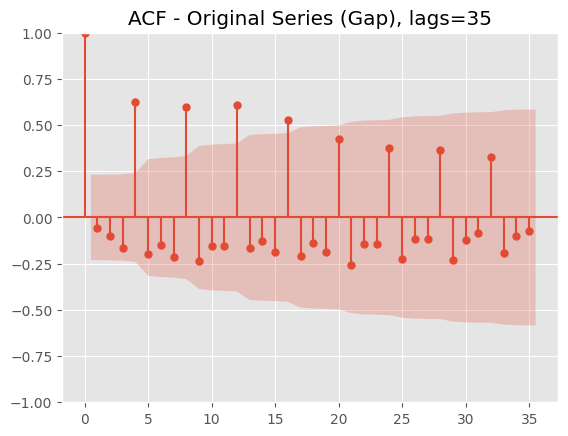

<Figure size 1000x500 with 0 Axes>

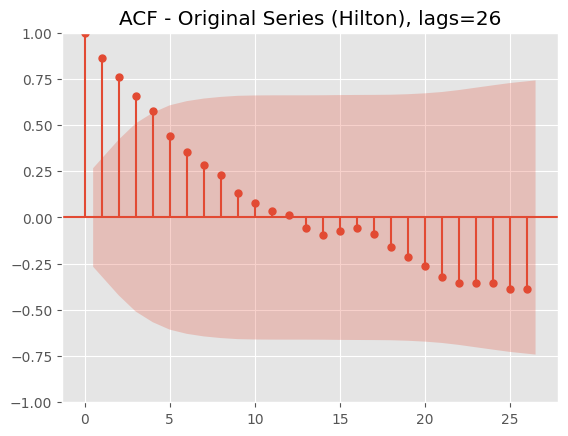

<Figure size 1000x500 with 0 Axes>

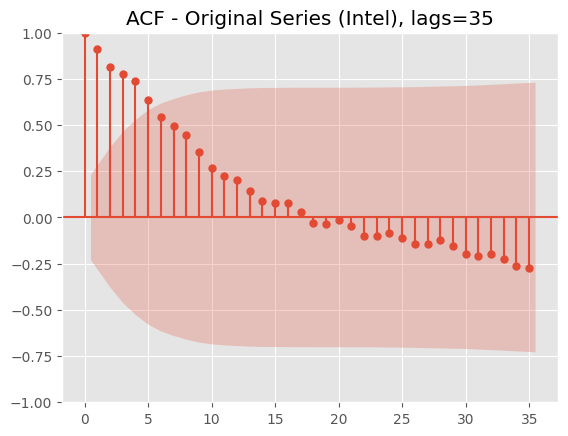

<Figure size 1000x500 with 0 Axes>

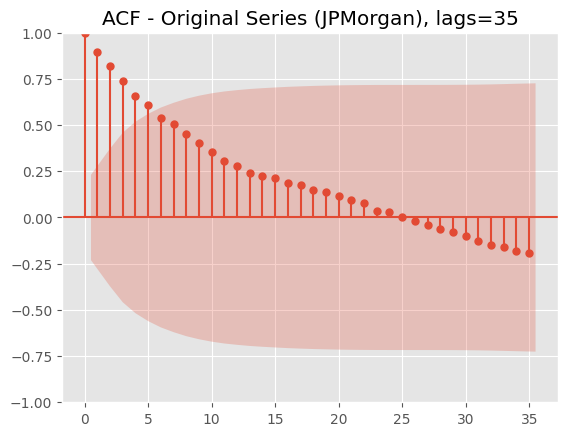

<Figure size 1000x500 with 0 Axes>

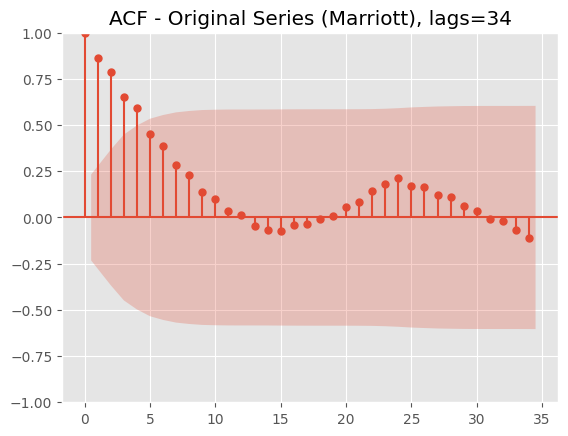

<Figure size 1000x500 with 0 Axes>

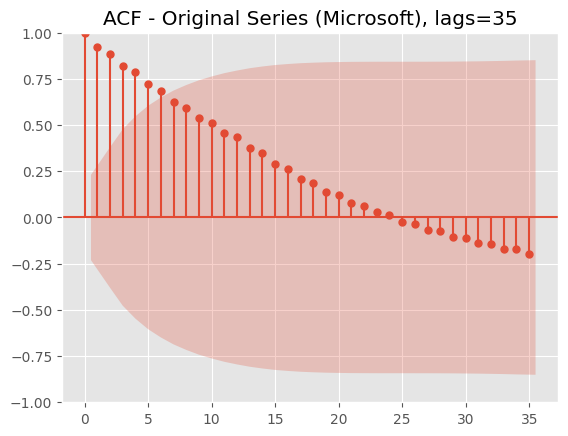

<Figure size 1000x500 with 0 Axes>

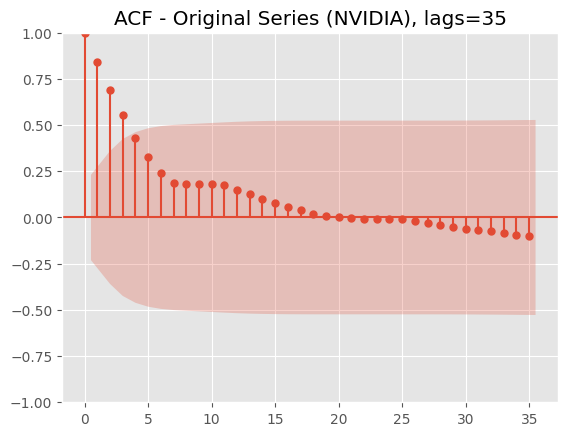

<Figure size 1000x500 with 0 Axes>

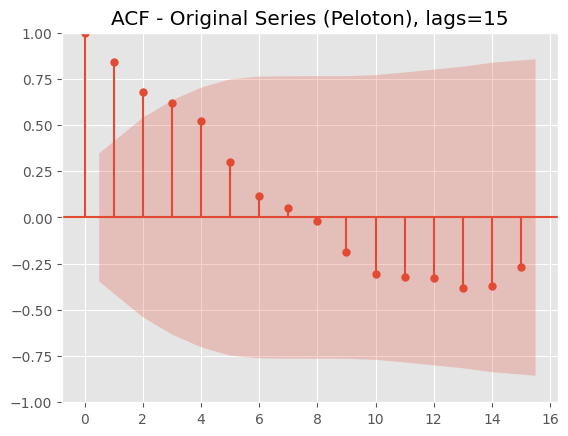

<Figure size 1000x500 with 0 Axes>

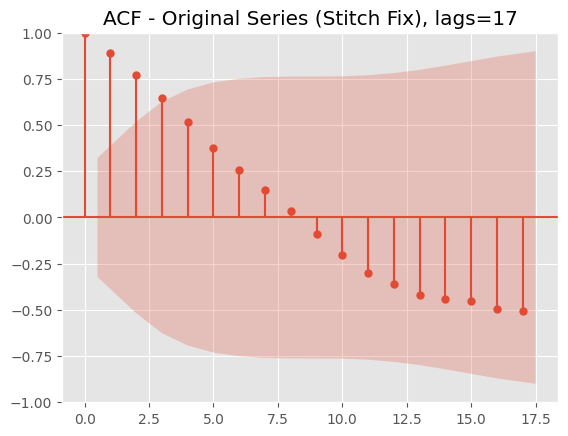

<Figure size 1000x500 with 0 Axes>

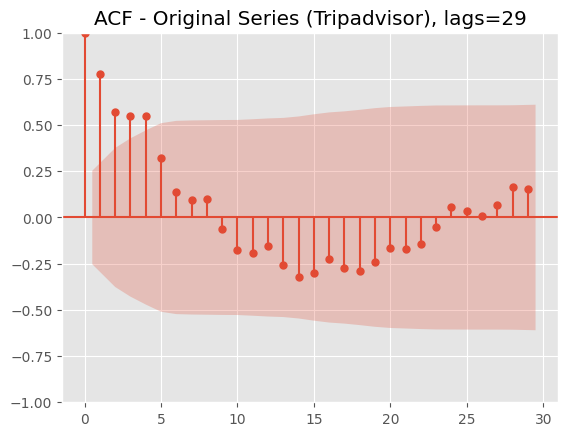

<Figure size 1000x500 with 0 Axes>

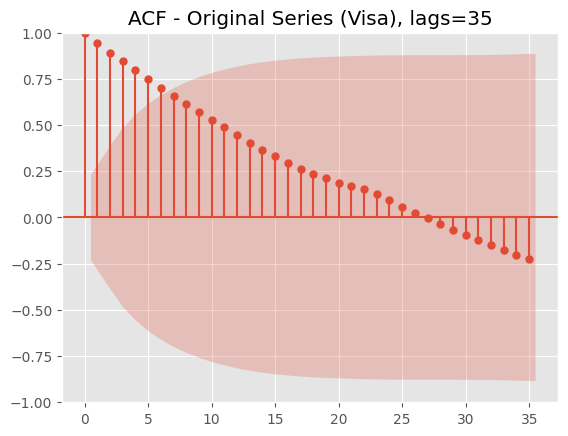

<Figure size 1000x500 with 0 Axes>

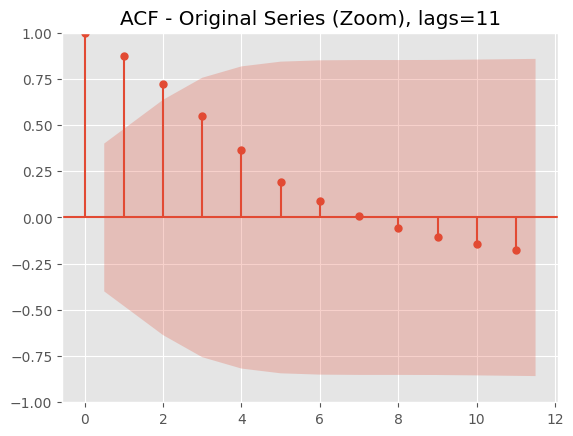

In [58]:
for company in data["company"].unique():
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    safe_lags = max(1, min(40, len(ts) // 2 - 1))
    plt.figure(figsize=(10,5))
    plot_acf(ts, lags=safe_lags)
    plt.title(f"ACF - Original Series ({company}), lags={safe_lags}")
    plt.show()


<Figure size 1000x500 with 0 Axes>

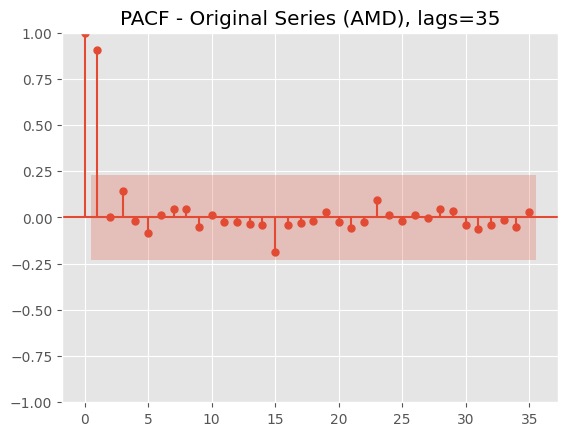

<Figure size 1000x500 with 0 Axes>

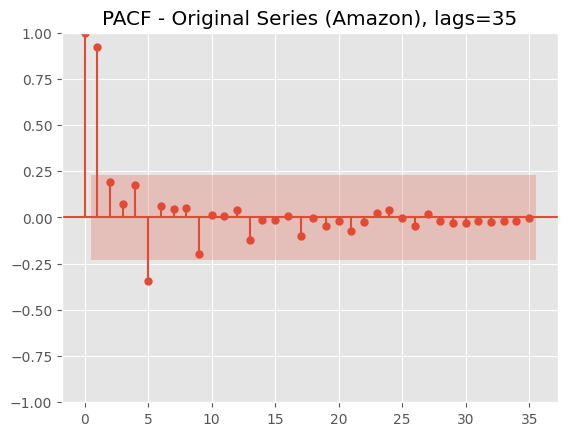

<Figure size 1000x500 with 0 Axes>

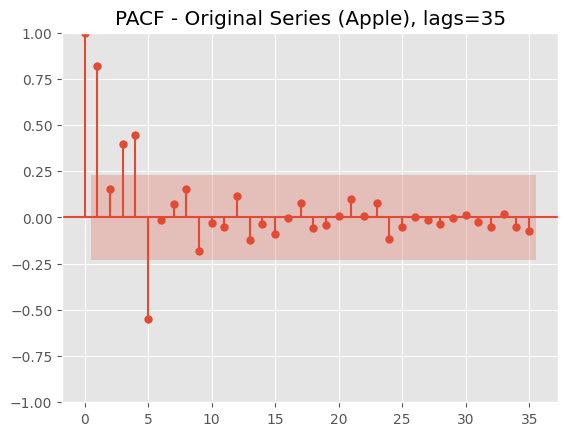

<Figure size 1000x500 with 0 Axes>

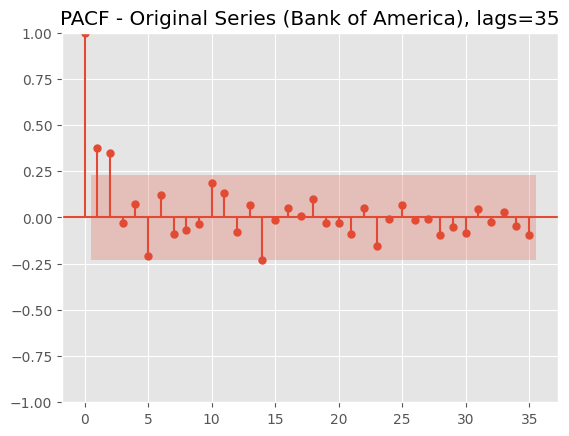

<Figure size 1000x500 with 0 Axes>

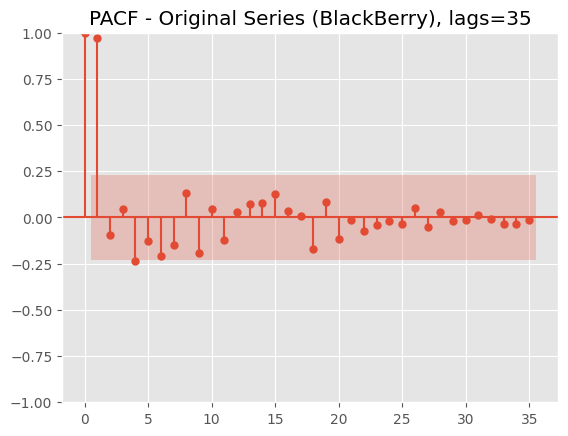

<Figure size 1000x500 with 0 Axes>

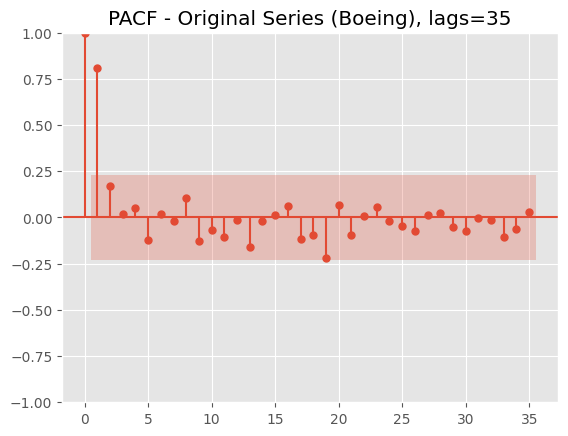

<Figure size 1000x500 with 0 Axes>

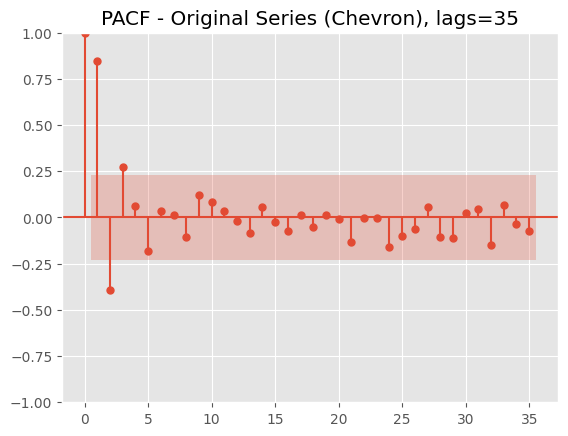

<Figure size 1000x500 with 0 Axes>

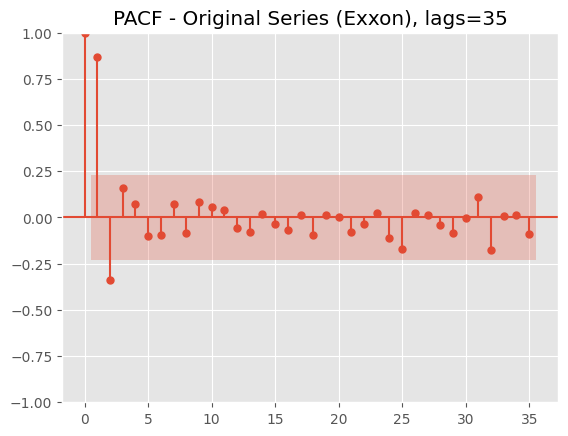

<Figure size 1000x500 with 0 Axes>

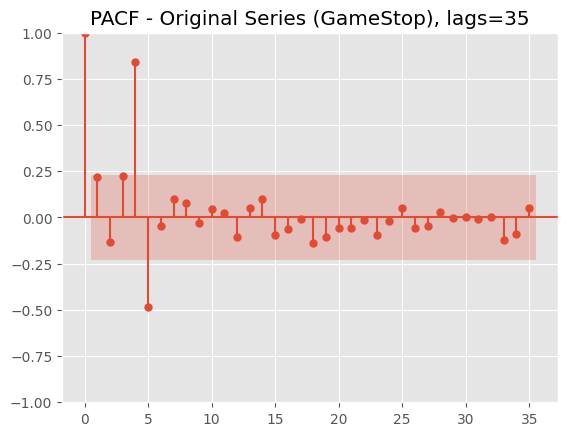

<Figure size 1000x500 with 0 Axes>

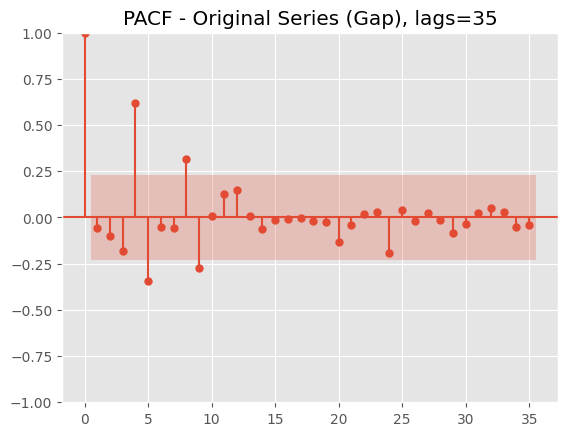

<Figure size 1000x500 with 0 Axes>

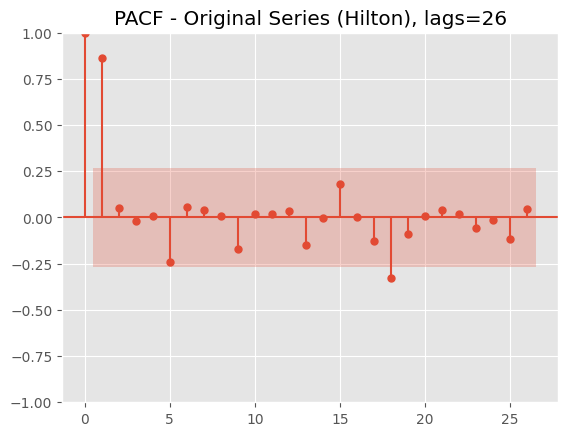

<Figure size 1000x500 with 0 Axes>

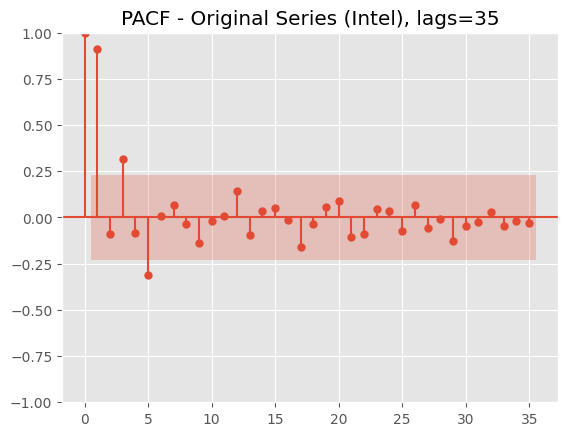

<Figure size 1000x500 with 0 Axes>

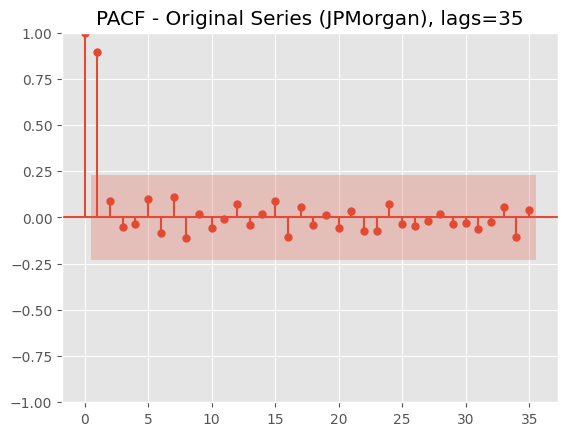

<Figure size 1000x500 with 0 Axes>

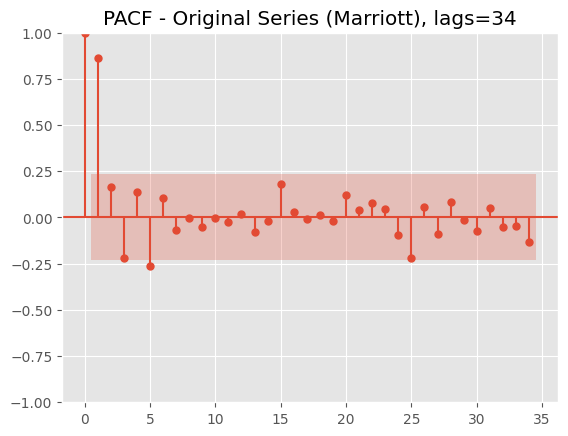

<Figure size 1000x500 with 0 Axes>

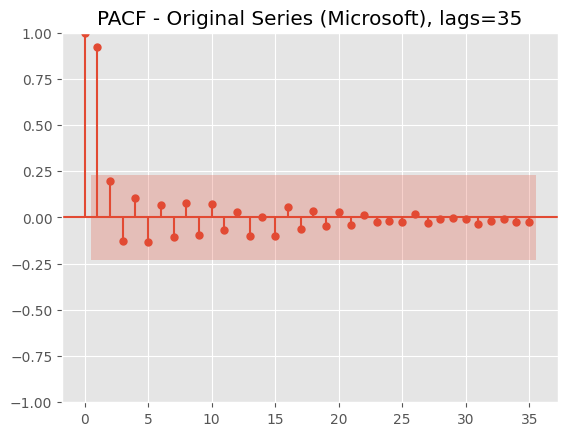

<Figure size 1000x500 with 0 Axes>

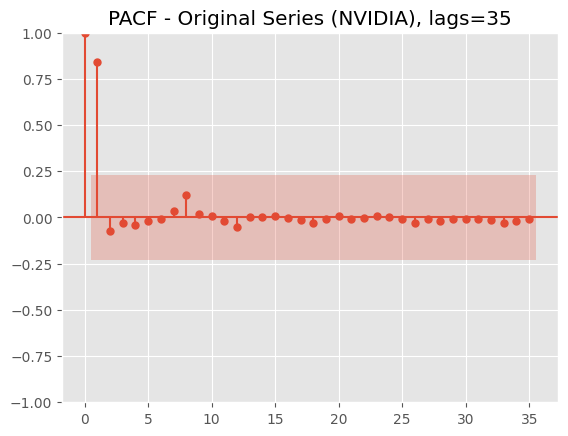

<Figure size 1000x500 with 0 Axes>

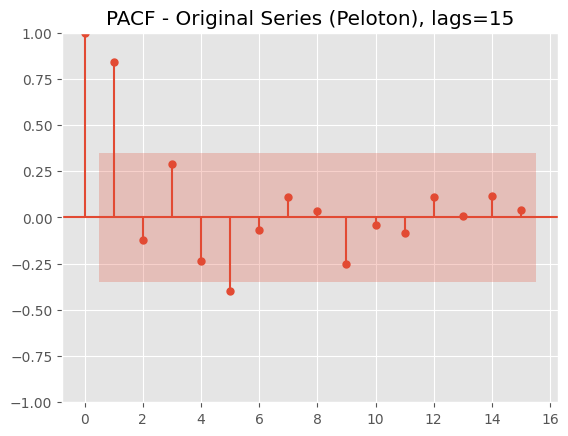

<Figure size 1000x500 with 0 Axes>

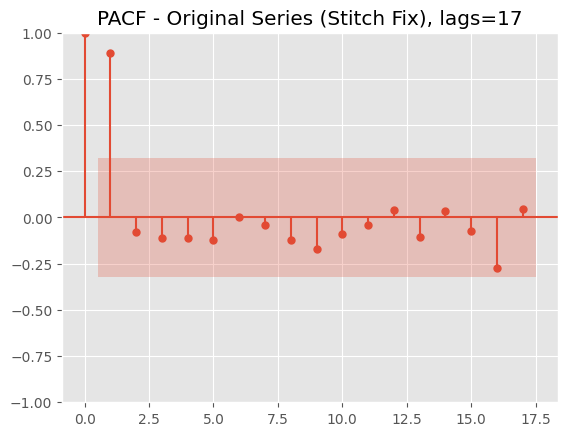

<Figure size 1000x500 with 0 Axes>

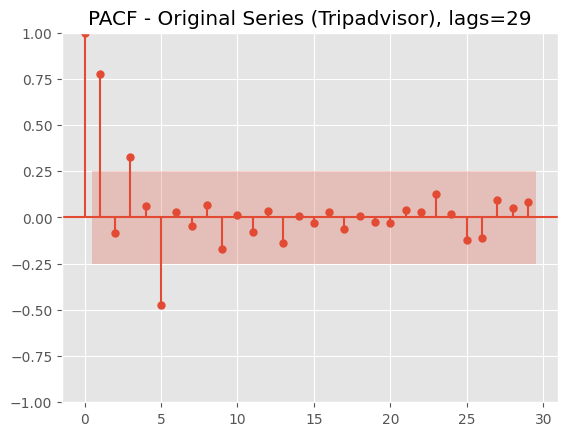

<Figure size 1000x500 with 0 Axes>

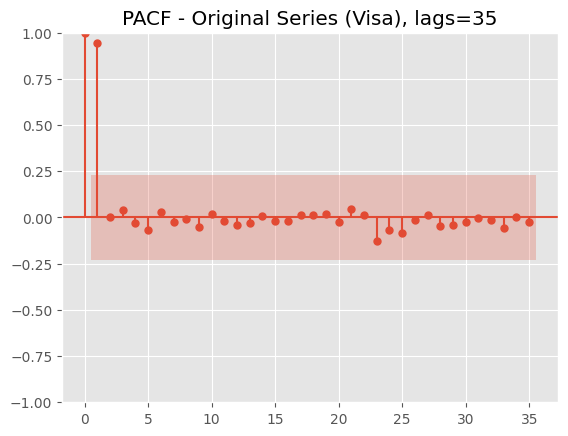

<Figure size 1000x500 with 0 Axes>

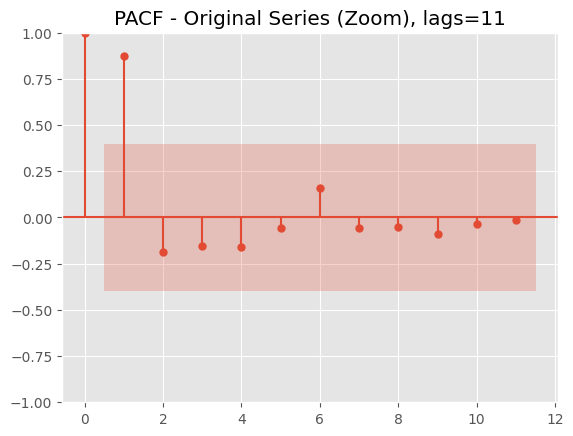

In [59]:
for company in data["company"].unique():
    ts = (
        data[data["company"] == company]
        .sort_values("date")
        .set_index("date")["revenue"]
        .dropna()
    )
    safe_lags = max(1, min(40, len(ts) // 2 - 1))
    plt.figure(figsize=(10,5))
    plot_pacf(ts, lags=safe_lags, method='ywm')
    plt.title(f"PACF - Original Series ({company}), lags={safe_lags}")
    plt.show()


## 6. Choosing the lag features

In [60]:
# Lag feature importance screening before model experiments
# Purpose: test lag_1 ... lag_12 first, then keep only the most useful lags.

from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, mean_squared_error


def build_lag_importance_dataset(df, max_lag=12, date_col="date", group_col="company", target_col="revenue"):
    lag_df = complete_fiscal_fields(df, date_col=date_col, group_col=group_col)
    lag_df = lag_df.sort_values([group_col, date_col]).reset_index(drop=True)

    grouped_revenue = lag_df.groupby(group_col)[target_col]
    lag_features = []

    for lag in range(1, max_lag + 1):
        col = f"lag_{lag}"
        lag_df[col] = grouped_revenue.shift(lag)
        lag_features.append(col)

    lag_df = lag_df.dropna(subset=lag_features + [target_col]).reset_index(drop=True)
    return lag_df, lag_features


def split_last_n_by_company(df, n_test=8, group_col="company", date_col="date"):
    train_parts = []
    test_parts = []

    for company, company_df in df.groupby(group_col):
        company_df = company_df.sort_values(date_col)

        if len(company_df) <= n_test:
            print(f"Skipping {company}: only {len(company_df)} usable rows")
            continue

        train_parts.append(company_df.iloc[:-n_test])
        test_parts.append(company_df.iloc[-n_test:])

    train_df = pd.concat(train_parts, ignore_index=True)
    test_df = pd.concat(test_parts, ignore_index=True)
    return train_df, test_df


In [61]:
lag_screen_df, lag_candidate_features = build_lag_importance_dataset(
    data_qc,
    max_lag=12,
    date_col="date",
    group_col="company",
    target_col="revenue"
)

lag_train_df, lag_test_df = split_last_n_by_company(lag_screen_df, n_test=8)

X_train_lags = lag_train_df[lag_candidate_features]
y_train_lags = lag_train_df["revenue"]
X_test_lags = lag_test_df[lag_candidate_features]
y_test_lags = lag_test_df["revenue"]

lag_rf = RandomForestRegressor(
    n_estimators=500,
    max_depth=6,
    min_samples_leaf=3,
    random_state=42,
    n_jobs=-1
)
lag_rf.fit(X_train_lags, y_train_lags)
lag_rf_pred = lag_rf.predict(X_test_lags)

lag_rf_rmse = np.sqrt(mean_squared_error(y_test_lags, lag_rf_pred))
lag_rf_mae = mean_absolute_error(y_test_lags, lag_rf_pred)

print("Lag screening rows:", lag_screen_df.shape[0])
print("Train rows:", lag_train_df.shape[0])
print("Test rows:", lag_test_df.shape[0])
print("RF lag-only MAE:", round(lag_rf_mae, 3))
print("RF lag-only RMSE:", round(lag_rf_rmse, 3))


Lag screening rows: 1106
Train rows: 938
Test rows: 168
RF lag-only MAE: 3.241
RF lag-only RMSE: 8.254


In [62]:
rf_importance = pd.DataFrame({
    "feature": lag_candidate_features,
    "rf_importance": lag_rf.feature_importances_
})

perm = permutation_importance(
    lag_rf,
    X_test_lags,
    y_test_lags,
    n_repeats=20,
    random_state=42,
    scoring="neg_root_mean_squared_error"
)

perm_importance = pd.DataFrame({
    "feature": lag_candidate_features,
    "permutation_importance": perm.importances_mean
})

lag_importance = (
    rf_importance
    .merge(perm_importance, on="feature", how="left")
)

lag_importance["rf_rank"] = lag_importance["rf_importance"].rank(ascending=False, method="min")
lag_importance["permutation_rank"] = lag_importance["permutation_importance"].rank(ascending=False, method="min")
lag_importance["average_rank"] = lag_importance[["rf_rank", "permutation_rank"]].mean(axis=1)
lag_importance = lag_importance.sort_values(["average_rank", "rf_rank"]).reset_index(drop=True)

lag_importance


,feature,rf_importance,permutation_importance,rf_rank,permutation_rank,average_rank
0,lag_1,0.718850,32.669788,1.0,1.0,1.0
1,lag_4,0.123400,9.253876,2.0,2.0,2.0
2,lag_2,0.057746,2.696081,3.0,3.0,3.0
3,lag_8,0.043455,0.563567,4.0,5.0,4.5
4,lag_3,0.026923,0.812464,5.0,4.0,4.5
5,lag_5,0.009752,0.238682,6.0,6.0,6.0
6,lag_6,0.004206,0.214451,8.0,7.0,7.5
7,lag_9,0.004707,0.138458,7.0,9.0,8.0
8,lag_12,0.003307,0.139253,10.0,8.0,9.0
9,lag_7,0.003962,0.085691,9.0,10.0,9.5


Selected lag features: ['lag_1', 'lag_2', 'lag_4', 'lag_8']


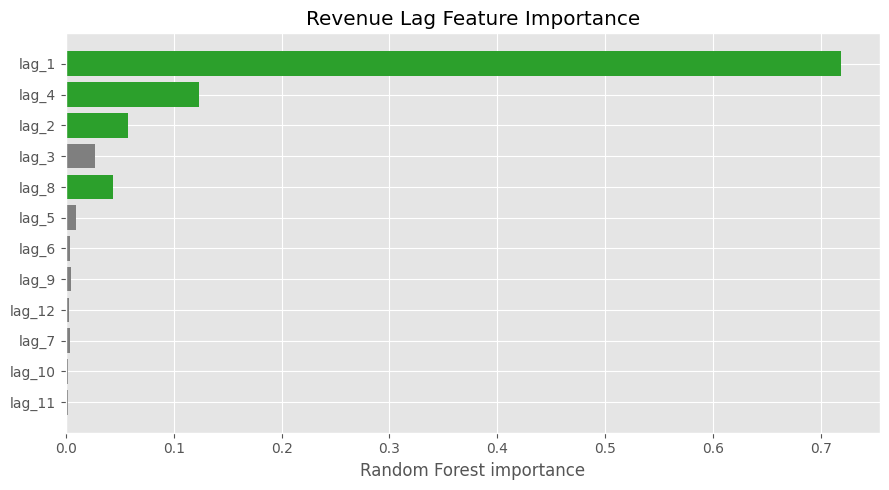

In [63]:
# Lags picked after looking at the ranking above. lag_4 and lag_8 are the same quarter one and two years ago, so they carry the seasonality
selected_lag_features = ["lag_1", "lag_2", "lag_4", "lag_8"]

print("Selected lag features:", selected_lag_features)

plt.figure(figsize=(9, 5))
plot_df = lag_importance.sort_values("average_rank", ascending=False)
colors = ["tab:green" if feature in selected_lag_features else "tab:gray" for feature in plot_df["feature"]]
plt.barh(plot_df["feature"], plot_df["rf_importance"], color=colors)
plt.title("Revenue Lag Feature Importance")
plt.xlabel("Random Forest importance")
plt.tight_layout()
plt.show()


## 7. Machine learning without macro variables (raw revenue)

In [64]:

# Non-macro machine learning dataset
# Features: selected revenue lags + revenue history + seasonality.

from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import ParameterGrid
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.svm import SVR
from xgboost import XGBRegressor

METRIC_SORT_ORDER = ["sMAPE", "MAPE", "RMSE", "MAE"]

baseline_features = ["lag_1", "lag_2", "lag_4", "lag_8"]

revenue_history_features = [
    "roll_mean_4", "roll_std_4",
    "roll_mean_8", "roll_std_8",
    "growth_1"
]

seasonality_features = [
    "quarter", "sin_q", "cos_q"
]

log_baseline_features = ["log_lag_1", "log_lag_2", "log_lag_4", "log_lag_8"]

log_revenue_history_features = [
    "log_roll_mean_4", "log_roll_std_4",
    "log_roll_mean_8", "log_roll_std_8",
    "log_growth_1"
]

model_features_no_macro = baseline_features + revenue_history_features + seasonality_features
model_features_log_target = log_baseline_features + log_revenue_history_features + seasonality_features
cat_features = ["company"]
target_col = "revenue"


In [65]:
# All features are built from shift(1) or older values, so a row for quarter t only sees data up to t-1 (no leakage).
# Only sin/cos of the quarter are not shifted, they are known in advance

def add_no_macro_feature_columns(out, date_col="date", group_col="company", target_col="revenue"):
    out = complete_fiscal_fields(out, date_col=date_col, group_col=group_col)
    out = out.sort_values([group_col, date_col]).reset_index(drop=True)

    grouped_revenue = out.groupby(group_col)[target_col]
    log_revenue = np.log1p(out[target_col])
    grouped_log_revenue = log_revenue.groupby(out[group_col])

    for lag in [1, 2, 4, 8]:
        out[f"lag_{lag}"] = grouped_revenue.shift(lag)
        out[f"log_lag_{lag}"] = grouped_log_revenue.shift(lag)

    for window in [4, 8]:
        shifted = grouped_revenue.shift(1)
        out[f"roll_mean_{window}"] = shifted.groupby(out[group_col]).transform(
            lambda s: s.rolling(window).mean()
        )
        out[f"roll_std_{window}"] = shifted.groupby(out[group_col]).transform(
            lambda s: s.rolling(window).std()
        )

        shifted_log = grouped_log_revenue.shift(1)
        out[f"log_roll_mean_{window}"] = shifted_log.groupby(out[group_col]).transform(
            lambda s: s.rolling(window).mean()
        )
        out[f"log_roll_std_{window}"] = shifted_log.groupby(out[group_col]).transform(
            lambda s: s.rolling(window).std()
        )

    # growth_1 is pct_change_{t-1}: the previous quarter's percentage change, shifted to avoid leakage.
    growth = grouped_revenue.pct_change()
    out["growth_1"] = growth.groupby(out[group_col]).shift(1)

    # log_growth_1 is the previous quarter's log change, aligned with the log-target feature space.
    log_growth = grouped_log_revenue.diff()
    out["log_growth_1"] = log_growth.groupby(out[group_col]).shift(1)

    q = out["fiscal_quarter"].astype(int)
    out["quarter"] = q
    out["sin_q"] = np.sin(2 * np.pi * q / 4)
    out["cos_q"] = np.cos(2 * np.pi * q / 4)

    all_model_features = sorted(set(model_features_no_macro + model_features_log_target))
    out[all_model_features] = out[all_model_features].replace([np.inf, -np.inf], np.nan)
    return out


def create_no_macro_ml_features(df, date_col="date", group_col="company", target_col="revenue"):
    out = add_no_macro_feature_columns(df, date_col=date_col, group_col=group_col, target_col=target_col)
    required_features = sorted(set(model_features_no_macro + model_features_log_target))
    out = out.dropna(subset=required_features + [target_col]).reset_index(drop=True)
    return out


def split_last_n_by_company(df, n_test=8, group_col="company", date_col="date"):
    train_parts = []
    test_parts = []

    for company, company_df in df.groupby(group_col):
        company_df = company_df.sort_values(date_col)
        if len(company_df) <= n_test:
            print(f"Skipping {company}: only {len(company_df)} usable rows")
            continue
        train_parts.append(company_df.iloc[:-n_test])
        test_parts.append(company_df.iloc[-n_test:])

    return pd.concat(train_parts, ignore_index=True), pd.concat(test_parts, ignore_index=True)


ml_no_macro = create_no_macro_ml_features(data_qc)
train_df, test_df = split_last_n_by_company(ml_no_macro, n_test=8)

print("ML rows:", ml_no_macro.shape[0])
print("Train rows:", train_df.shape[0])
print("Test rows:", test_df.shape[0])
print("Companies:", train_df["company"].nunique())
ml_no_macro.head()


ML rows: 1190
Train rows: 1022
Test rows: 168
Companies: 21


,date,fiscal_year,fiscal_year_raw,revenue,revenue_unit,fiscal_quarter,fiscal_period,company,is_outlier_iqr,lag_1,log_lag_1,lag_2,log_lag_2,lag_4,log_lag_4,lag_8,log_lag_8,roll_mean_4,roll_std_4,log_roll_mean_4,log_roll_std_4,roll_mean_8,roll_std_8,log_roll_mean_8,log_roll_std_8,growth_1,log_growth_1,quarter,sin_q,cos_q
0,2010-03-27,2010,2010,1.57,USD billions,1,2010Q1,AMD,False,1.65,0.974560,1.40,0.875469,1.18,0.779325,1.49,0.912283,1.3525,0.223812,0.852170,0.093336,1.40250,0.234992,0.872419,0.096164,0.178571,0.099091,1,1.000000e+00,6.123234e-17
1,2010-06-26,2010,2010,1.65,USD billions,2,2010Q2,AMD,False,1.57,0.943906,1.65,0.974560,1.18,0.779325,1.36,0.858662,1.4500,0.208006,0.893315,0.086549,1.41250,0.240876,0.876372,0.098655,-0.048485,-0.030654,2,1.224647e-16,-1.000000e+00
2,2010-09-25,2010,2010,1.62,USD billions,3,2010Q3,AMD,False,1.65,0.974560,1.57,0.943906,1.40,0.875469,1.80,1.029619,1.5675,0.117863,0.942123,0.046727,1.44875,0.253345,0.890859,0.104045,0.050955,0.030654,3,-1.000000e+00,-1.836970e-16
3,2010-12-25,2010,2010,1.65,USD billions,4,2010Q4,AMD,False,1.62,0.963174,1.65,0.974560,1.65,0.974560,1.16,0.770108,1.6225,0.037749,0.964050,0.014462,1.42625,0.223986,0.882553,0.093504,-0.018182,-0.011385,4,-2.449294e-16,1.000000e+00
4,2011-04-02,2011,2011,1.61,USD billions,1,2011Q1,AMD,False,1.65,0.974560,1.62,0.963174,1.57,0.943906,1.18,0.779325,1.6225,0.037749,0.964050,0.014462,1.48750,0.207140,0.908110,0.086021,0.018519,0.011385,1,1.000000e+00,6.123234e-17


In [66]:
# Micro feature set for later experiments
# Model B can use these features together with revenue lags/history/seasonality.

model_features_with_micro = model_features_no_macro + micro_feature_cols

ml_with_micro = create_no_macro_ml_features(data_micro_features)
ml_with_micro = ml_with_micro.dropna(subset=model_features_with_micro + [target_col]).reset_index(drop=True)

print("No-macro baseline/history/seasonality features:", len(model_features_no_macro))
print("Micro features:", len(micro_feature_cols))
print("Total features with micro:", len(model_features_with_micro))
print("Rows with complete micro feature set:", ml_with_micro.shape[0])
print("Companies with complete micro feature set:", ml_with_micro["company"].nunique())

ml_with_micro[["company", "date", "revenue"] + model_features_with_micro[:10]].head()


No-macro baseline/history/seasonality features: 12
Micro features: 20
Total features with micro: 32
Rows with complete micro feature set: 1049
Companies with complete micro feature set: 19


,company,date,revenue,lag_1,lag_2,lag_4,lag_8,roll_mean_4,roll_std_4,roll_mean_8,roll_std_8,growth_1,quarter
0,AMD,2010-03-27,1.57,1.65,1.40,1.18,1.49,1.3525,0.223812,1.40250,0.234992,0.178571,1
1,AMD,2010-06-26,1.65,1.57,1.65,1.18,1.36,1.4500,0.208006,1.41250,0.240876,-0.048485,2
2,AMD,2010-09-25,1.62,1.65,1.57,1.40,1.80,1.5675,0.117863,1.44875,0.253345,0.050955,3
3,AMD,2010-12-25,1.65,1.62,1.65,1.65,1.16,1.6225,0.037749,1.42625,0.223986,-0.018182,4
4,AMD,2011-04-02,1.61,1.65,1.62,1.57,1.18,1.6225,0.037749,1.48750,0.207140,0.018519,1


In [67]:

def make_preprocess(scale_numeric=True, numeric_features=None):
    numeric_features = list(numeric_features or model_features_no_macro)
    numeric_steps = [("imputer", SimpleImputer(strategy="median"))]
    if scale_numeric:
        numeric_steps.append(("scaler", StandardScaler()))

    numeric_transformer = Pipeline(steps=numeric_steps)
    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore"))
    ])

    return ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, cat_features)
        ],
        remainder="drop"
    )


def rmse(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))


def mape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mask = y_true != 0
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100)


def smape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.abs(y_true) + np.abs(y_pred) + 1e-9
    return float(np.mean(2 * np.abs(y_pred - y_true) / denom) * 100)


def metric_row(y_true, y_pred):
    return {
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": rmse(y_true, y_pred),
        "MAPE": mape(y_true, y_pred),
        "sMAPE": smape(y_true, y_pred)
    }


In [68]:
# Rolling-origin CV: each fold validates on 4 quarters and trains on the (up to) 20 quarters right before them, then the window moves forward.
# The final 8-quarter test part is not used here

def rolling_origin_splits_grouped(df, n_splits=3, horizon=4, min_train=20, group_col="company", date_col="date"):
    grouped = {
        company: g.sort_values(date_col).reset_index(drop=True)
        for company, g in df.groupby(group_col)
        if len(g) >= min_train + horizon
    }

    if not grouped:
        raise ValueError("No company has enough rows for rolling-origin validation.")

    max_possible = min((len(g) - min_train) // horizon for g in grouped.values())
    n_splits_eff = min(n_splits, max_possible)

    for fold in range(n_splits_eff):
        train_parts = []
        valid_parts = []

        for company, g in grouped.items():
            valid_end = len(g) - (n_splits_eff - fold - 1) * horizon
            valid_start = valid_end - horizon
            train_start = max(0, valid_start - min_train)

            train_parts.append(g.iloc[train_start:valid_start])
            valid_parts.append(g.iloc[valid_start:valid_end])

        yield (
            fold + 1,
            pd.concat(train_parts, ignore_index=True),
            pd.concat(valid_parts, ignore_index=True)
        )


def evaluate_cv_model(model, df, n_splits=3, horizon=4, min_train=20, feature_cols=None):
    rows = []
    feature_cols = list(feature_cols or model_features_no_macro)

    for fold, fold_train, fold_valid in rolling_origin_splits_grouped(
        df, n_splits=n_splits, horizon=horizon, min_train=min_train
    ):
        X_train = fold_train[cat_features + feature_cols]
        y_train = fold_train[target_col]
        X_valid = fold_valid[cat_features + feature_cols]
        y_valid = fold_valid[target_col]

        fitted = clone(model)
        fitted.fit(X_train, y_train)
        pred = fitted.predict(X_valid)

        row = metric_row(y_valid, pred)
        row["fold"] = fold
        rows.append(row)

    return pd.DataFrame(rows)


def tune_model(model_name, base_model, param_grid, df_for_tuning, feature_cols=None):
    rows = []

    for params in ParameterGrid(param_grid):
        model = clone(base_model)
        model.set_params(**params)
        cv_metrics = evaluate_cv_model(model, df_for_tuning, feature_cols=feature_cols)
        avg = cv_metrics[["MAE", "RMSE", "MAPE", "sMAPE"]].mean().to_dict()
        rows.append({"model": model_name, "params": params, **avg})

    results = pd.DataFrame(rows).sort_values(METRIC_SORT_ORDER).reset_index(drop=True)
    best_params = results.loc[0, "params"]
    best_model = clone(base_model).set_params(**best_params)
    return best_model, results


In [69]:
lr_model = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=True)),
    ("model", LinearRegression())
])

rf_base = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=False)),
    ("model", RandomForestRegressor(random_state=42, n_jobs=-1))
])

xgb_base = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=False)),
    ("model", XGBRegressor(
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1,
        verbosity=0
    ))
])

svr_base = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=True)),
    ("model", SVR())
])

rf_grid = {
    "model__n_estimators": [300, 600],
    "model__max_depth": [4, 8, None],
    "model__min_samples_leaf": [2, 4],
    "model__max_features": ["sqrt", 0.8]
}

xgb_grid = {
    "model__n_estimators": [200, 400],
    "model__max_depth": [2, 3, 4],
    "model__learning_rate": [0.03, 0.05],
    "model__subsample": [0.8, 1.0],
    "model__colsample_bytree": [0.8, 1.0]
}

svr_grid = {
    "model__kernel": ["rbf"],
    "model__C": [1, 10, 100],
    "model__epsilon": [0.01, 0.1, 0.5],
    "model__gamma": ["scale", "auto"]
}


In [70]:
# Tune only on the training period. The final last-8-quarter test set is untouched.

lr_cv_results = evaluate_cv_model(lr_model, train_df)
lr_summary = lr_cv_results[["MAE", "RMSE", "MAPE", "sMAPE"]].mean().to_dict()
print("Linear Regression CV:", {k: round(v, 3) for k, v in lr_summary.items()})

best_rf_model, rf_tuning_results = tune_model("Random Forest", rf_base, rf_grid, train_df)
print("Best RF params:")
print(rf_tuning_results.loc[0, "params"])

best_xgb_model, xgb_tuning_results = tune_model("XGBoost", xgb_base, xgb_grid, train_df)
print("Best XGB params:")
print(xgb_tuning_results.loc[0, "params"])

best_svr_model, svr_tuning_results = tune_model("SVR", svr_base, svr_grid, train_df)
print("Best SVR params:")
print(svr_tuning_results.loc[0, "params"])


Linear Regression CV: {'MAE': 2.914, 'RMSE': 5.74, 'MAPE': 34.236, 'sMAPE': 30.625}
Best RF params:
{'model__max_depth': None, 'model__max_features': 0.8, 'model__min_samples_leaf': 2, 'model__n_estimators': 300}
Best XGB params:
{'model__colsample_bytree': 1.0, 'model__learning_rate': 0.05, 'model__max_depth': 4, 'model__n_estimators': 400, 'model__subsample': 1.0}
Best SVR params:
{'model__C': 100, 'model__epsilon': 0.01, 'model__gamma': 'auto', 'model__kernel': 'rbf'}


In [71]:

tuning_summary = pd.concat([
    pd.DataFrame([{ "model": "Linear Regression", "params": {}, **lr_summary }]),
    rf_tuning_results.head(1),
    xgb_tuning_results.head(1),
    svr_tuning_results.head(1)
], ignore_index=True)

tuning_summary = (
    tuning_summary[["model", "MAE", "RMSE", "MAPE", "sMAPE", "params"]]
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)
tuning_summary


,model,MAE,RMSE,MAPE,sMAPE,params
0,Random Forest,4.142922,8.710643,19.467159,15.555212,"{'model__max_depth': None, 'model__max_feature..."
1,XGBoost,3.803668,7.606976,23.854406,15.692633,"{'model__colsample_bytree': 1.0, 'model__learn..."
2,SVR,3.819757,8.393044,19.742377,16.524154,"{'model__C': 100, 'model__epsilon': 0.01, 'mod..."
3,Linear Regression,2.913606,5.740209,34.235674,30.625478,{}


In [72]:

final_models = {
    "Linear Regression": lr_model,
    "Random Forest": best_rf_model,
    "XGBoost": best_xgb_model,
    "SVR": best_svr_model
}

X_train_final = train_df[cat_features + model_features_no_macro]
y_train_final = train_df[target_col]
X_test_final = test_df[cat_features + model_features_no_macro]
y_test_final = test_df[target_col]

final_metric_rows = []
final_prediction_frames = []

for model_name, model in final_models.items():
    fitted = clone(model)
    fitted.fit(X_train_final, y_train_final)
    pred = fitted.predict(X_test_final)

    metrics = metric_row(y_test_final, pred)
    final_metric_rows.append({"model": model_name, **metrics})

    pred_df = test_df[["company", "date", "revenue"]].copy()
    pred_df["model"] = model_name
    pred_df["predicted_revenue"] = pred
    final_prediction_frames.append(pred_df)

ml_no_macro_leaderboard = pd.DataFrame(final_metric_rows).sort_values(METRIC_SORT_ORDER).reset_index(drop=True)
ml_no_macro_predictions = pd.concat(final_prediction_frames, ignore_index=True)

ml_no_macro_leaderboard


,model,MAE,RMSE,MAPE,sMAPE
0,SVR,3.357290,11.495945,246.392501,10.499310
1,Random Forest,2.959578,7.970402,11.435706,11.150595
2,XGBoost,2.647736,7.039719,14.621577,13.253996
3,Linear Regression,2.035064,3.778559,85.129264,22.947736


In [73]:

company_metric_rows = []

for (company, model_name), g in ml_no_macro_predictions.groupby(["company", "model"]):
    metrics = metric_row(g["revenue"], g["predicted_revenue"])
    company_metric_rows.append({
        "company": company,
        "model": model_name,
        **metrics
    })

ml_no_macro_company_metrics = (
    pd.DataFrame(company_metric_rows)
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

ml_no_macro_company_metrics


,company,model,MAE,RMSE,MAPE,sMAPE
0,AMD,SVR,0.603923,0.734872,7.553492,7.971255
1,AMD,Linear Regression,0.643812,0.726531,8.278396,8.659644
2,AMD,Random Forest,0.668668,0.820164,8.618485,8.943805
3,AMD,XGBoost,0.890560,1.041378,11.481458,12.117575
4,Amazon,Linear Regression,9.328929,9.955195,5.448176,5.485343
...,...,...,...,...,...,...
79,Visa,Random Forest,0.888970,0.895977,9.382496,8.957030
80,Zoom,Random Forest,0.046063,0.050495,3.981587,3.889385
81,Zoom,SVR,0.042145,0.065892,3.718584,3.898560
82,Zoom,XGBoost,0.054531,0.061399,4.715613,4.584813


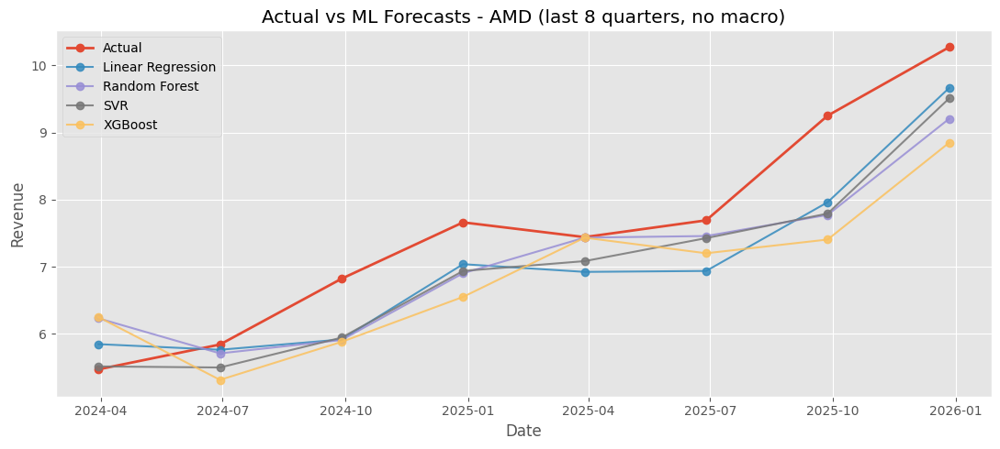

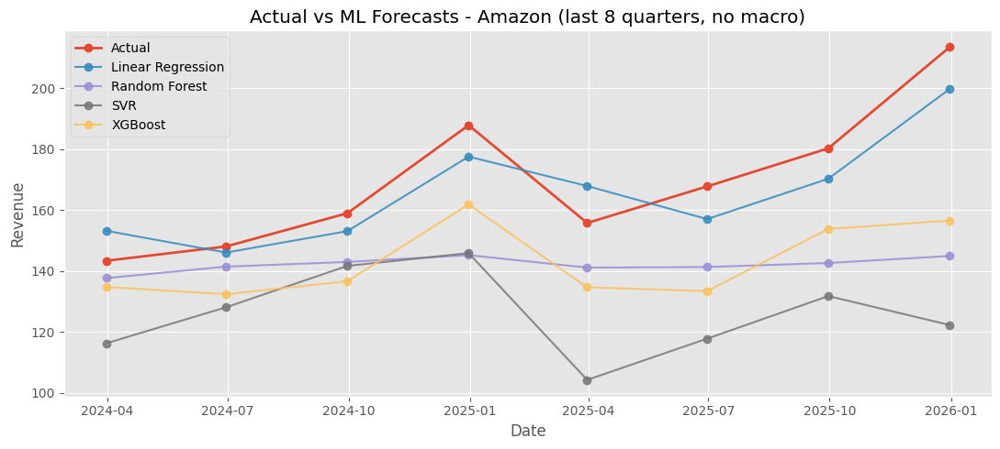

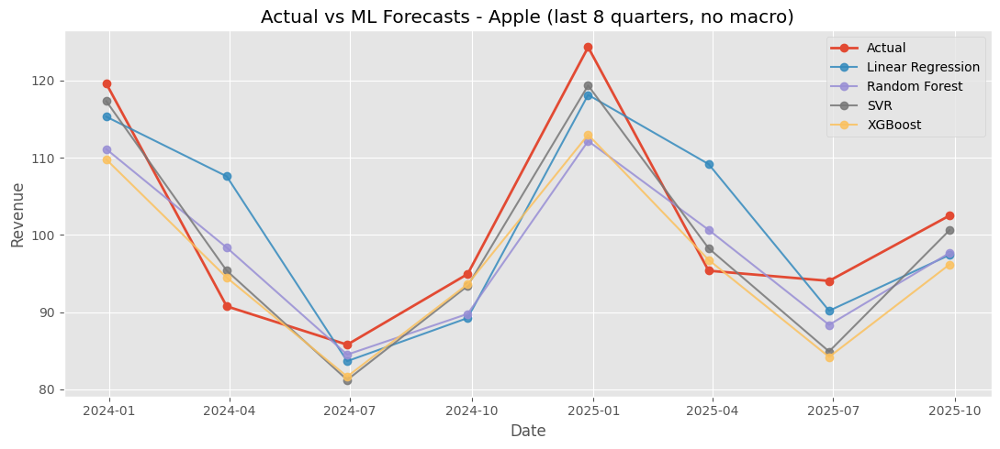

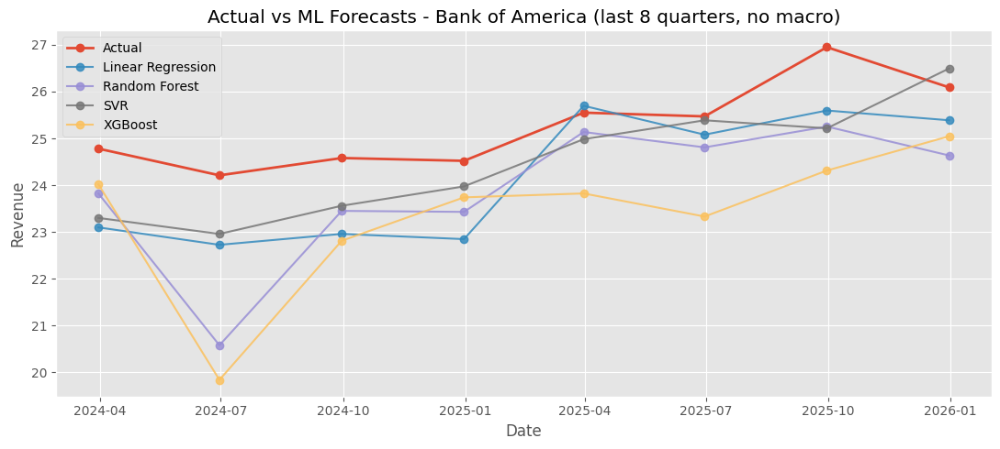

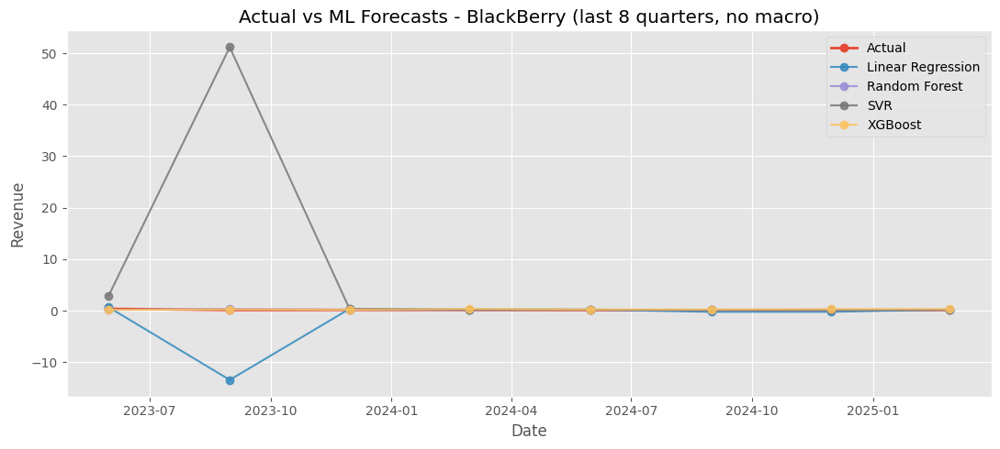

...

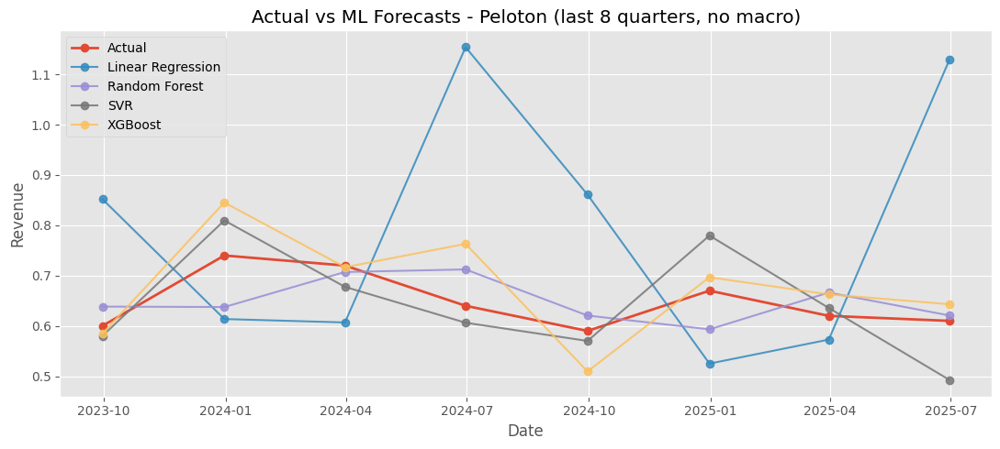

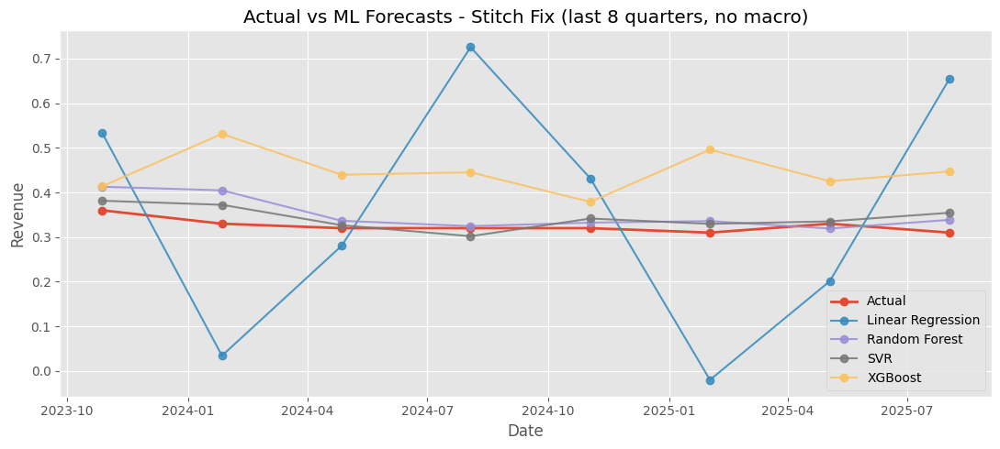

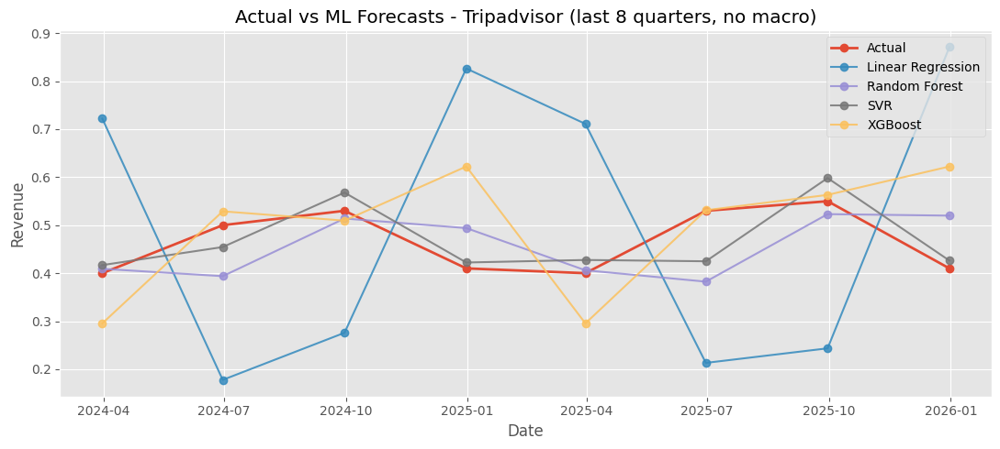

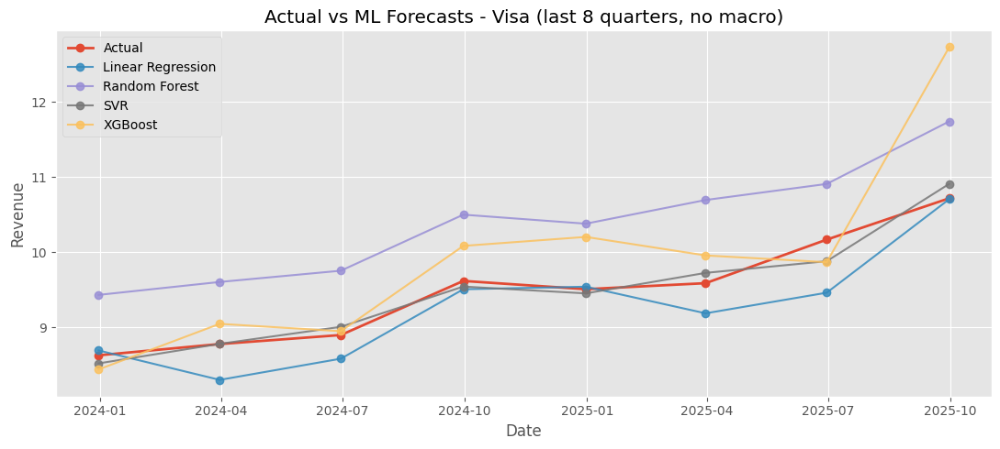

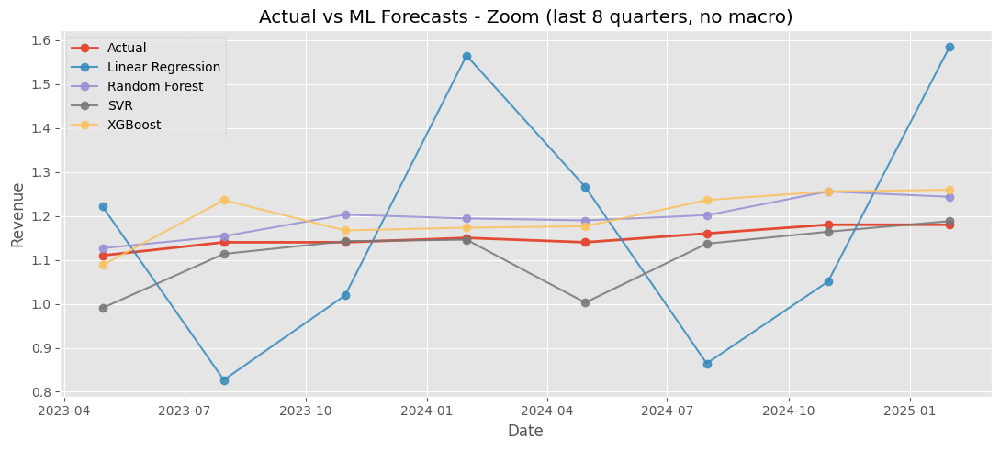

In [74]:
for company in sorted(ml_no_macro_predictions["company"].unique()):
    company_df = ml_no_macro_predictions[ml_no_macro_predictions["company"] == company].sort_values("date")

    plt.figure(figsize=(11, 5))
    actual = company_df.drop_duplicates("date")
    plt.plot(actual["date"], actual["revenue"], marker="o", label="Actual", linewidth=2)

    for model_name in sorted(company_df["model"].unique()):
        model_df = company_df[company_df["model"] == model_name]
        plt.plot(model_df["date"], model_df["predicted_revenue"], marker="o", label=model_name, alpha=0.85)

    plt.title(f"Actual vs ML Forecasts - {company} (last 8 quarters, no macro)")
    plt.xlabel("Date")
    plt.ylabel("Revenue")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [75]:
from pathlib import Path
import json

results_dir = Path("experiment_results") / "ML_no_macro"
results_dir.mkdir(parents=True, exist_ok=True)

ml_no_macro_leaderboard.to_csv(results_dir / "leaderboard.csv", index=False)
ml_no_macro_company_metrics.to_csv(results_dir / "metrics_by_company.csv", index=False)
ml_no_macro_predictions.to_csv(results_dir / "predictions.csv", index=False)

config = {
    "experiment": "ML_no_macro",
    "models": list(final_models.keys()),
    "features": model_features_no_macro,
    "categorical_features": cat_features,
    "target": target_col,
    "tuning": "rolling-origin validation on training period",
    "final_test": "last 8 quarters per company"
}

with open(results_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)

print("Saved results to:", results_dir)


Saved results to: experiment_results/ML_no_macro


## 8. Time-series models: ARIMA, Prophet, LSTM

In [76]:
# Time-series models: ARIMA, Prophet, LSTM
# Tuning uses rolling-origin validation inside the training period.
# The final last-8-quarter test set remains untouched.

import warnings
from itertools import product

from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import MinMaxScaler

try:
    from prophet import Prophet
    PROPHET_AVAILABLE = True
except Exception as exc:
    PROPHET_AVAILABLE = False
    print("Prophet unavailable:", exc)

try:
    import tensorflow as tf
    from tensorflow.keras import Sequential
    from tensorflow.keras.layers import Dense, Dropout, Input, LSTM
    from tensorflow.keras.callbacks import EarlyStopping
    tf.get_logger().setLevel("ERROR")
    TF_AVAILABLE = True
except Exception as exc:
    TF_AVAILABLE = False
    print("TensorFlow unavailable:", exc)

warnings.filterwarnings("ignore")


Importing plotly failed. Interactive plots will not work.


In [77]:
def get_company_series(df, company, date_col="date", target_col="revenue"):
    return (
        df[df["company"] == company]
        .sort_values(date_col)
        .set_index(date_col)[target_col]
        .astype(float)
        .dropna()
    )


def rolling_series_splits(series, n_splits=2, horizon=4, min_train=16):
    series = series.sort_index().dropna()
    max_possible = (len(series) - min_train) // horizon
    n_splits_eff = min(n_splits, max_possible)

    if n_splits_eff <= 0:
        return []

    splits = []
    for fold in range(n_splits_eff):
        valid_end = len(series) - (n_splits_eff - fold - 1) * horizon
        valid_start = valid_end - horizon
        train = series.iloc[:valid_start]
        valid = series.iloc[valid_start:valid_end]
        splits.append((fold + 1, train, valid))

    return splits


def evaluate_forecast_values(actual, pred):
    return metric_row(np.asarray(actual, dtype=float), np.asarray(pred, dtype=float))


def summarize_tuning_rows(rows):
    if not rows:
        return pd.DataFrame()

    out = pd.DataFrame(rows)
    metric_cols = ["MAE", "RMSE", "MAPE", "sMAPE"]
    return (
        out.groupby(["model", "company", "params"], as_index=False)[metric_cols]
        .mean()
        .sort_values(["company", "RMSE", "sMAPE", "MAE"])
        .reset_index(drop=True)
    )


In [78]:
def arima_forecast(train_series, steps, order):
    model = ARIMA(train_series, order=order)
    fitted = model.fit()
    return fitted.forecast(steps=steps).values


arima_grid = [
    {"order": order}
    for order in product([0, 1, 2], [0, 1], [0, 1, 2])
    if order != (0, 0, 0)
]

arima_tuning_rows = []
arima_best_params = {}

for company in sorted(train_df["company"].unique()):
    series = get_company_series(train_df, company)
    splits = rolling_series_splits(series, n_splits=2, horizon=4, min_train=16)

    for params in arima_grid:
        for fold, fold_train, fold_valid in splits:
            try:
                pred = arima_forecast(fold_train, steps=len(fold_valid), order=params["order"])
                metrics = evaluate_forecast_values(fold_valid.values, pred)
                arima_tuning_rows.append({
                    "model": "ARIMA",
                    "company": company,
                    "fold": fold,
                    "params": str(params),
                    **metrics
                })
            except Exception:
                continue

arima_tuning_results = summarize_tuning_rows(arima_tuning_rows)

for company in sorted(train_df["company"].unique()):
    company_results = arima_tuning_results[arima_tuning_results["company"] == company]
    if not company_results.empty:
        arima_best_params[company] = eval(company_results.iloc[0]["params"])

arima_tuning_results.head(10)


,model,company,params,MAE,RMSE,MAPE,sMAPE
0,ARIMA,AMD,"{'order': (1, 1, 2)}",0.441824,0.529502,7.506432,7.696600
1,ARIMA,AMD,"{'order': (1, 1, 1)}",0.465670,0.529819,7.879439,8.089447
2,ARIMA,AMD,"{'order': (2, 1, 2)}",0.473140,0.562811,8.089619,8.226358
3,ARIMA,AMD,"{'order': (2, 0, 1)}",0.459609,0.569582,7.649379,8.034603
4,ARIMA,AMD,"{'order': (2, 1, 0)}",0.552455,0.616733,9.277019,9.830683
5,ARIMA,AMD,"{'order': (1, 1, 0)}",0.560585,0.624967,9.372933,9.983527
6,ARIMA,AMD,"{'order': (2, 1, 1)}",0.568571,0.635375,9.585256,10.133593
7,ARIMA,AMD,"{'order': (0, 1, 2)}",0.596643,0.658797,10.072083,10.684424
8,ARIMA,AMD,"{'order': (0, 1, 1)}",0.625467,0.682023,10.548246,11.261777
9,ARIMA,AMD,"{'order': (1, 0, 2)}",0.683792,0.731990,11.521500,12.366062


In [ ]:
def prophet_forecast(train_series, steps, params):
    if not PROPHET_AVAILABLE:
        raise RuntimeError("Prophet is not available")

    train_prophet = train_series.reset_index()
    train_prophet.columns = ["ds", "y"]

    model = Prophet(
        yearly_seasonality=False,
        weekly_seasonality=False,
        daily_seasonality=False,
        changepoint_prior_scale=params["changepoint_prior_scale"],
        seasonality_prior_scale=params["seasonality_prior_scale"],
        seasonality_mode=params["seasonality_mode"]
    )
    model.add_seasonality(
        name="quarterly",
        period=365.25,
        fourier_order=params["fourier_order"]
    )
    model.fit(train_prophet)

    future_dates = pd.date_range(start=train_series.index.max(), periods=steps + 1, freq="QE")[1:]
    future = pd.DataFrame({"ds": future_dates})
    forecast = model.predict(future)
    return forecast["yhat"].values


prophet_grid = [
    {
        "changepoint_prior_scale": cps,
        "seasonality_prior_scale": sps,
        "seasonality_mode": mode,
        "fourier_order": fourier
    }
    for cps in [0.01, 0.05, 0.1]
    for sps in [1.0, 5.0]
    for mode in ["additive", "multiplicative"]
    for fourier in [2, 3]
]

prophet_tuning_rows = []
prophet_best_params = {}

if PROPHET_AVAILABLE:
    for company in sorted(train_df["company"].unique()):
        series = get_company_series(train_df, company)
        splits = rolling_series_splits(series, n_splits=2, horizon=4, min_train=16)

        for params in prophet_grid:
            for fold, fold_train, fold_valid in splits:
                try:
                    pred = prophet_forecast(fold_train, steps=len(fold_valid), params=params)
                    metrics = evaluate_forecast_values(fold_valid.values, pred)
                    prophet_tuning_rows.append({
                        "model": "Prophet",
                        "company": company,
                        "fold": fold,
                        "params": str(params),
                        **metrics
                    })
                except Exception:
                    continue

prophet_tuning_results = summarize_tuning_rows(prophet_tuning_rows)

for company in sorted(train_df["company"].unique()):
    company_results = prophet_tuning_results[prophet_tuning_results["company"] == company]
    if not company_results.empty:
        prophet_best_params[company] = eval(company_results.iloc[0]["params"])

prophet_tuning_results.head(10)


19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
19:02:25 - cmdstanpy - INFO - Chain [1]

In [ ]:
# LSTM: the series is scaled to 0-1 (scaler fitted on the training part only) and cut into windows of `lookback` quarters that predict the next value
def make_lstm_supervised(values, lookback):
    X, y = [], []
    for i in range(lookback, len(values)):
        X.append(values[i - lookback:i])
        y.append(values[i])
    return np.asarray(X), np.asarray(y)


def lstm_forecast(train_series, steps, params):
    if not TF_AVAILABLE:
        raise RuntimeError("TensorFlow is not available")

    tf.keras.backend.clear_session()
    tf.random.set_seed(42)

    values = train_series.values.reshape(-1, 1).astype(float)
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(values).flatten()

    lookback = params["lookback"]
    X, y = make_lstm_supervised(scaled, lookback)

    if len(X) < 8:
        raise ValueError("Too few observations for LSTM")

    X = X.reshape((X.shape[0], X.shape[1], 1))

    model = Sequential([
        Input(shape=(lookback, 1)),
        LSTM(params["units"]),
        Dropout(params["dropout"]),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")

    early_stop = EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True
    )

    validation_split = 0.2 if len(X) >= 12 else 0.0

    model.fit(
        X,
        y,
        epochs=params["epochs"],
        batch_size=params["batch_size"],
        verbose=0,
        callbacks=[early_stop] if validation_split > 0 else [],
        shuffle=False,
        validation_split=validation_split
    )

    history = scaled.tolist()
    preds_scaled = []

    for _ in range(steps):
        x_input = np.asarray(history[-lookback:]).reshape((1, lookback, 1))
        next_scaled = float(model.predict(x_input, verbose=0)[0, 0])
        preds_scaled.append(next_scaled)
        history.append(next_scaled)

    return scaler.inverse_transform(np.asarray(preds_scaled).reshape(-1, 1)).flatten()


# Small grid: LSTM is slow because every company/parameter pair trains a neural network.
# Increase this list only after the rest of the pipeline is stable.
lstm_grid = [
    {"lookback": 4, "units": 16, "dropout": 0.0, "batch_size": 8, "epochs": 30},
    {"lookback": 4, "units": 32, "dropout": 0.1, "batch_size": 8, "epochs": 30},
    {"lookback": 8, "units": 16, "dropout": 0.1, "batch_size": 8, "epochs": 30},
]

LSTM_TUNE_COMPANIES = sorted(train_df["company"].unique())
# For a quick test run, uncomment the next line:
# LSTM_TUNE_COMPANIES = LSTM_TUNE_COMPANIES[:5]

lstm_tuning_rows = []
lstm_best_params = {}

if TF_AVAILABLE:
    for company in LSTM_TUNE_COMPANIES:
        print("Tuning LSTM:", company)
        series = get_company_series(train_df, company)
        splits = rolling_series_splits(series, n_splits=1, horizon=4, min_train=20)

        for params in lstm_grid:
            for fold, fold_train, fold_valid in splits:
                try:
                    pred = lstm_forecast(fold_train, steps=len(fold_valid), params=params)
                    metrics = evaluate_forecast_values(fold_valid.values, pred)
                    lstm_tuning_rows.append({
                        "model": "LSTM",
                        "company": company,
                        "fold": fold,
                        "params": str(params),
                        **metrics
                    })
                except Exception as exc:
                    print(f"Skipping LSTM {company} {params}: {exc}")
                    continue

lstm_tuning_results = summarize_tuning_rows(lstm_tuning_rows)

for company in sorted(train_df["company"].unique()):
    company_results = lstm_tuning_results[lstm_tuning_results["company"] == company]
    if not company_results.empty:
        lstm_best_params[company] = eval(company_results.iloc[0]["params"])

lstm_tuning_results.head(10)


In [ ]:
def collect_ts_final_forecasts(model_name, best_params_by_company, forecast_func):
    rows = []

    for company in sorted(test_df["company"].unique()):
        train_series = get_company_series(train_df, company)
        test_series = get_company_series(test_df, company)

        params = best_params_by_company.get(company)
        if params is None:
            continue

        try:
            pred = forecast_func(train_series, steps=len(test_series), params=params)
        except TypeError:
            pred = forecast_func(train_series, steps=len(test_series), order=params["order"])
        except Exception as exc:
            print(f"Skipping {model_name} for {company}: {exc}")
            continue

        for date, actual, predicted in zip(test_series.index, test_series.values, pred):
            rows.append({
                "company": company,
                "date": date,
                "model": model_name,
                "revenue": actual,
                "predicted_revenue": predicted,
                "params": str(params)
            })

    return pd.DataFrame(rows)


ts_prediction_frames = []

ts_prediction_frames.append(
    collect_ts_final_forecasts("ARIMA", arima_best_params, arima_forecast)
)

if PROPHET_AVAILABLE:
    ts_prediction_frames.append(
        collect_ts_final_forecasts("Prophet", prophet_best_params, prophet_forecast)
    )

if TF_AVAILABLE:
    ts_prediction_frames.append(
        collect_ts_final_forecasts("LSTM", lstm_best_params, lstm_forecast)
    )

ts_prediction_frames = [df for df in ts_prediction_frames if not df.empty]
time_series_predictions = pd.concat(ts_prediction_frames, ignore_index=True)

time_series_predictions.head()


In [ ]:
ts_metric_rows = []

for model_name, g_model in time_series_predictions.groupby("model"):
    metrics = metric_row(g_model["revenue"], g_model["predicted_revenue"])
    ts_metric_rows.append({"model": model_name, **metrics})

time_series_leaderboard = (
    pd.DataFrame(ts_metric_rows)
    .sort_values(["RMSE", "sMAPE", "MAE"])
    .reset_index(drop=True)
)

ts_company_metric_rows = []

for (company, model_name), g in time_series_predictions.groupby(["company", "model"]):
    metrics = metric_row(g["revenue"], g["predicted_revenue"])
    ts_company_metric_rows.append({
        "company": company,
        "model": model_name,
        **metrics
    })

time_series_company_metrics = (
    pd.DataFrame(ts_company_metric_rows)
    .sort_values(["company", "RMSE", "sMAPE"])
    .reset_index(drop=True)
)

time_series_leaderboard


In [ ]:
time_series_company_metrics


In [ ]:
for company in sorted(time_series_predictions["company"].unique()):
    company_df = time_series_predictions[time_series_predictions["company"] == company].sort_values("date")

    plt.figure(figsize=(11, 5))
    actual = company_df.drop_duplicates("date")
    plt.plot(actual["date"], actual["revenue"], marker="o", label="Actual", linewidth=2)

    for model_name in sorted(company_df["model"].unique()):
        model_df = company_df[company_df["model"] == model_name]
        plt.plot(model_df["date"], model_df["predicted_revenue"], marker="o", label=model_name, alpha=0.85)

    plt.title(f"Actual vs Time-Series Forecasts - {company} (last 8 quarters)")
    plt.xlabel("Date")
    plt.ylabel("Revenue")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
all_model_leaderboard = pd.concat([
    ml_no_macro_leaderboard.assign(model_family="Machine Learning"),
    time_series_leaderboard.assign(model_family="Time Series")
], ignore_index=True)

all_model_leaderboard = all_model_leaderboard.sort_values(["RMSE", "sMAPE", "MAE"]).reset_index(drop=True)
all_model_leaderboard


In [ ]:
ts_results_dir = Path("experiment_results") / "time_series_no_macro"
ts_results_dir.mkdir(parents=True, exist_ok=True)

time_series_leaderboard.to_csv(ts_results_dir / "leaderboard.csv", index=False)
time_series_company_metrics.to_csv(ts_results_dir / "metrics_by_company.csv", index=False)
time_series_predictions.to_csv(ts_results_dir / "predictions.csv", index=False)

all_model_leaderboard.to_csv(Path("experiment_results") / "all_no_macro_model_comparison.csv", index=False)

config = {
    "experiment": "time_series_no_macro",
    "models": ["ARIMA", "Prophet", "LSTM"],
    "target": "revenue",
    "tuning": "rolling-origin validation inside training period",
    "final_test": "last 8 quarters per company",
    "arima_grid": arima_grid,
    "prophet_grid": prophet_grid,
    "lstm_grid": lstm_grid
}

with open(ts_results_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)

print("Saved time-series results to:", ts_results_dir)
print("Saved combined comparison to:", Path("experiment_results") / "all_no_macro_model_comparison.csv")


## 9. Log-target ML models

In [ ]:

# Log-target ML models
# These models train on log1p(revenue), use log-space lag/rolling features,
# then convert predictions back with a Duan smearing correction.
# Smearing corrects the otherwise systematic median-vs-mean underprediction
# that plain expm1 creates after fitting in log space.


def to_log_target(y):
    return np.log1p(np.asarray(y, dtype=float))


# Duan smearing: the mean of exp(residuals) on the training data.
# Without it exp(prediction) is roughly the median, not the mean, and revenue would be underpredicted
def duan_smearing_factor(y_train_log, y_train_log_pred):
    residuals = np.asarray(y_train_log, dtype=float) - np.asarray(y_train_log_pred, dtype=float)
    return float(np.mean(np.exp(residuals)))


# back to revenue: exp(pred) * factor - 1 (inverse of log1p), cut at 0 because revenue can't be negative
def from_log_target(y_log, smearing_factor=1.0):
    revenue_pred = np.exp(np.asarray(y_log, dtype=float)) * smearing_factor - 1
    return np.maximum(revenue_pred, 0)


def fit_log_target_model(model, X_train, y_train_log):
    fitted = clone(model)
    fitted.fit(X_train, y_train_log)
    train_pred_log = fitted.predict(X_train)
    smearing_factor = duan_smearing_factor(y_train_log, train_pred_log)
    resid_var = float(np.var(np.asarray(y_train_log) - np.asarray(train_pred_log), ddof=1))
    return fitted, smearing_factor, resid_var


log_lr_model = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=True, numeric_features=model_features_log_target)),
    ("model", LinearRegression())
])

rf_log_base = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=False, numeric_features=model_features_log_target)),
    ("model", RandomForestRegressor(random_state=42, n_jobs=-1))
])

xgb_log_base = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=False, numeric_features=model_features_log_target)),
    ("model", XGBRegressor(
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1,
        verbosity=0
    ))
])

svr_log_base = Pipeline(steps=[
    ("preprocess", make_preprocess(scale_numeric=True, numeric_features=model_features_log_target)),
    ("model", SVR())
])


def evaluate_cv_model_log_target(model, df, n_splits=3, horizon=4, min_train=20):
    rows = []

    for fold, fold_train, fold_valid in rolling_origin_splits_grouped(
        df, n_splits=n_splits, horizon=horizon, min_train=min_train
    ):
        X_train = fold_train[cat_features + model_features_log_target]
        y_train_log = to_log_target(fold_train[target_col])

        X_valid = fold_valid[cat_features + model_features_log_target]
        y_valid = fold_valid[target_col]

        fitted, smearing_factor, resid_var = fit_log_target_model(model, X_train, y_train_log)
        pred_log = fitted.predict(X_valid)
        pred = from_log_target(pred_log, smearing_factor=smearing_factor)

        row = metric_row(y_valid, pred)
        row["fold"] = fold
        row["smearing_factor"] = smearing_factor
        row["log_resid_var"] = resid_var
        rows.append(row)

    return pd.DataFrame(rows)


def tune_model_log_target(model_name, base_model, param_grid, df_for_tuning):
    rows = []

    for params in ParameterGrid(param_grid):
        model = clone(base_model)
        model.set_params(**params)
        cv_metrics = evaluate_cv_model_log_target(model, df_for_tuning)
        avg = cv_metrics[["MAE", "RMSE", "MAPE", "sMAPE"]].mean().to_dict()
        rows.append({"model": model_name, "params": params, **avg})

    results = (
        pd.DataFrame(rows)
        .sort_values(METRIC_SORT_ORDER)
        .reset_index(drop=True)
    )
    best_params = results.loc[0, "params"]
    best_model = clone(base_model).set_params(**best_params)
    return best_model, results


In [ ]:

lr_log_cv_results = evaluate_cv_model_log_target(log_lr_model, train_df)
lr_log_summary = lr_log_cv_results[["MAE", "RMSE", "MAPE", "sMAPE"]].mean().to_dict()
print("Log-target Linear Regression CV:", {k: round(v, 3) for k, v in lr_log_summary.items()})

best_rf_log_model, rf_log_tuning_results = tune_model_log_target(
    "Random Forest log-target", rf_log_base, rf_grid, train_df
)
print("Best log-target RF params:")
print(rf_log_tuning_results.loc[0, "params"])

best_xgb_log_model, xgb_log_tuning_results = tune_model_log_target(
    "XGBoost log-target", xgb_log_base, xgb_grid, train_df
)
print("Best log-target XGB params:")
print(xgb_log_tuning_results.loc[0, "params"])

best_svr_log_model, svr_log_tuning_results = tune_model_log_target(
    "SVR log-target", svr_log_base, svr_grid, train_df
)
print("Best log-target SVR params:")
print(svr_log_tuning_results.loc[0, "params"])


In [ ]:

log_tuning_summary = pd.concat([
    pd.DataFrame([{ "model": "Linear Regression log-target", "params": {}, **lr_log_summary }]),
    rf_log_tuning_results.head(1),
    xgb_log_tuning_results.head(1),
    svr_log_tuning_results.head(1)
], ignore_index=True)

log_tuning_summary = (
    log_tuning_summary[["model", "MAE", "RMSE", "MAPE", "sMAPE", "params"]]
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

log_tuning_summary


In [ ]:

log_target_models = {
    "Linear Regression log-target": log_lr_model,
    "Random Forest log-target": best_rf_log_model,
    "XGBoost log-target": best_xgb_log_model,
    "SVR log-target": best_svr_log_model
}

X_train_log_final = train_df[cat_features + model_features_log_target]
y_train_log_final = to_log_target(train_df[target_col])
X_test_log_final = test_df[cat_features + model_features_log_target]
y_test_final = test_df[target_col]

log_metric_rows = []
log_prediction_frames = []

for model_name, model in log_target_models.items():
    fitted, smearing_factor, resid_var = fit_log_target_model(model, X_train_log_final, y_train_log_final)
    pred_log = fitted.predict(X_test_log_final)
    pred = from_log_target(pred_log, smearing_factor=smearing_factor)

    metrics = metric_row(y_test_final, pred)
    log_metric_rows.append({
        "model": model_name,
        "smearing_factor": smearing_factor,
        "log_resid_var": resid_var,
        **metrics
    })

    pred_df = test_df[["company", "date", "revenue"]].copy()
    pred_df["model"] = model_name
    pred_df["predicted_revenue"] = pred
    pred_df["smearing_factor"] = smearing_factor
    pred_df["log_resid_var"] = resid_var
    log_prediction_frames.append(pred_df)

ml_log_target_leaderboard = (
    pd.DataFrame(log_metric_rows)
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)
ml_log_target_predictions = pd.concat(log_prediction_frames, ignore_index=True)

ml_log_target_leaderboard


In [ ]:

log_company_metric_rows = []

for (company, model_name), g in ml_log_target_predictions.groupby(["company", "model"]):
    metrics = metric_row(g["revenue"], g["predicted_revenue"])
    log_company_metric_rows.append({
        "company": company,
        "model": model_name,
        "smearing_factor": g["smearing_factor"].iloc[0],
        "log_resid_var": g["log_resid_var"].iloc[0],
        **metrics
    })

ml_log_target_company_metrics = (
    pd.DataFrame(log_company_metric_rows)
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

ml_log_target_company_metrics


In [ ]:

ml_raw_vs_log_leaderboard = pd.concat([
    ml_no_macro_leaderboard.assign(target_type="raw revenue"),
    ml_log_target_leaderboard.assign(target_type="log1p revenue, log features, Duan smearing")
], ignore_index=True)

ml_raw_vs_log_leaderboard = (
    ml_raw_vs_log_leaderboard
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

ml_raw_vs_log_leaderboard


In [ ]:

ml_raw_vs_log_company_metrics = pd.concat([
    ml_no_macro_company_metrics.assign(target_type="raw revenue"),
    ml_log_target_company_metrics.assign(target_type="log1p revenue, log features, Duan smearing")
], ignore_index=True)

ml_raw_vs_log_company_metrics = (
    ml_raw_vs_log_company_metrics
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

ml_raw_vs_log_company_metrics


In [ ]:

# Rolling-origin per-company metrics for a more stable company-level comparison.
# The last-8-quarter holdout remains useful, but each company has only eight test points there.

def cv_predictions_for_model(model_name, model, df, feature_cols, log_target=False,
                             n_splits=3, horizon=4, min_train=20):
    prediction_frames = []

    for fold, fold_train, fold_valid in rolling_origin_splits_grouped(
        df, n_splits=n_splits, horizon=horizon, min_train=min_train
    ):
        X_train = fold_train[cat_features + feature_cols]
        X_valid = fold_valid[cat_features + feature_cols]

        if log_target:
            y_train = to_log_target(fold_train[target_col])
            fitted, smearing_factor, resid_var = fit_log_target_model(model, X_train, y_train)
            pred = from_log_target(fitted.predict(X_valid), smearing_factor=smearing_factor)
        else:
            fitted = clone(model)
            fitted.fit(X_train, fold_train[target_col])
            pred = np.maximum(fitted.predict(X_valid), 0)
            smearing_factor = np.nan
            resid_var = np.nan

        fold_pred = fold_valid[["company", "date", "revenue"]].copy()
        fold_pred["fold"] = fold
        fold_pred["model"] = model_name
        fold_pred["target_type"] = (
            "log1p revenue, log features, Duan smearing"
            if log_target else
            "raw revenue"
        )
        fold_pred["predicted_revenue"] = pred
        fold_pred["smearing_factor"] = smearing_factor
        fold_pred["log_resid_var"] = resid_var
        prediction_frames.append(fold_pred)

    return pd.concat(prediction_frames, ignore_index=True)


rolling_cv_prediction_frames = []

for model_name, model in final_models.items():
    rolling_cv_prediction_frames.append(
        cv_predictions_for_model(model_name, model, train_df, model_features_no_macro, log_target=False)
    )

for model_name, model in log_target_models.items():
    rolling_cv_prediction_frames.append(
        cv_predictions_for_model(model_name, model, train_df, model_features_log_target, log_target=True)
    )

ml_raw_vs_log_rolling_cv_predictions = pd.concat(rolling_cv_prediction_frames, ignore_index=True)

rolling_company_metric_rows = []
for (company, model_name, target_type), g in ml_raw_vs_log_rolling_cv_predictions.groupby(
    ["company", "model", "target_type"]
):
    metrics = metric_row(g["revenue"], g["predicted_revenue"])
    rolling_company_metric_rows.append({
        "company": company,
        "model": model_name,
        "target_type": target_type,
        "n_validation_points": len(g),
        **metrics
    })

ml_raw_vs_log_rolling_cv_company_metrics = (
    pd.DataFrame(rolling_company_metric_rows)
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

ml_raw_vs_log_rolling_cv_company_metrics


In [ ]:
for company in sorted(ml_log_target_predictions["company"].unique()):
    company_df = ml_log_target_predictions[ml_log_target_predictions["company"] == company].sort_values("date")

    plt.figure(figsize=(11, 5))
    actual = company_df.drop_duplicates("date")
    plt.plot(actual["date"], actual["revenue"], marker="o", label="Actual", linewidth=2)

    for model_name in sorted(company_df["model"].unique()):
        model_df = company_df[company_df["model"] == model_name]
        plt.plot(model_df["date"], model_df["predicted_revenue"], marker="o", label=model_name, alpha=0.85)

    plt.title(f"Actual vs Log-Target ML Forecasts - {company} (last 8 quarters, no macro)")
    plt.xlabel("Date")
    plt.ylabel("Revenue")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:

log_results_dir = Path("experiment_results") / "ML_no_macro_log_target"
log_results_dir.mkdir(parents=True, exist_ok=True)

ml_log_target_leaderboard.to_csv(log_results_dir / "leaderboard.csv", index=False)
ml_log_target_company_metrics.to_csv(log_results_dir / "metrics_by_company.csv", index=False)
ml_log_target_predictions.to_csv(log_results_dir / "predictions.csv", index=False)
log_tuning_summary.to_csv(log_results_dir / "tuning_summary.csv", index=False)
ml_raw_vs_log_leaderboard.to_csv(Path("experiment_results") / "ml_raw_vs_log_comparison.csv", index=False)
ml_raw_vs_log_company_metrics.to_csv(Path("experiment_results") / "ml_raw_vs_log_company_metrics.csv", index=False)
ml_raw_vs_log_rolling_cv_company_metrics.to_csv(
    Path("experiment_results") / "ml_raw_vs_log_rolling_cv_company_metrics.csv",
    index=False
)
ml_raw_vs_log_rolling_cv_predictions.to_csv(
    Path("experiment_results") / "ml_raw_vs_log_rolling_cv_predictions.csv",
    index=False
)

config = {
    "experiment": "ML_no_macro_log_target",
    "models": list(log_target_models.keys()),
    "raw_features": model_features_no_macro,
    "log_target_features": model_features_log_target,
    "categorical_features": cat_features,
    "target_transformation": "log1p(revenue)",
    "inverse_transformation": "exp(prediction) * Duan smearing factor - 1, clipped at zero",
    "tuning": "rolling-origin validation on training period, sorted by sMAPE, MAPE, RMSE, MAE",
    "final_test": "last 8 quarters per company",
    "stability_check": "rolling-origin per-company metrics saved separately"
}

with open(log_results_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)

print("Saved log-target ML results to:", log_results_dir)
print("Saved raw vs log comparison to:", Path("experiment_results") / "ml_raw_vs_log_comparison.csv")
print("Saved rolling-CV company comparison to:", Path("experiment_results") / "ml_raw_vs_log_rolling_cv_company_metrics.csv")


## 10. SARIMA and log-target time series

In [ ]:
# SARIMA and log-target time-series models
# Adds SARIMA, plus log1p target variants for ARIMA, SARIMA, and Prophet.

from statsmodels.tsa.statespace.sarimax import SARIMAX


def arima_log_forecast(train_series, steps, order):
    train_log = np.log1p(train_series.astype(float))
    model = ARIMA(train_log, order=order)
    fitted = model.fit()
    try:
        train_pred_log = fitted.fittedvalues
        residuals = np.asarray(train_log) - np.asarray(train_pred_log)
        smearing_factor = float(np.mean(np.exp(residuals)))
    except Exception:
        smearing_factor = 1.0
    pred_log = fitted.forecast(steps=steps).values
    return np.maximum(np.expm1(pred_log) * smearing_factor, 0)


def sarima_forecast(train_series, steps, order, seasonal_order):
    model = SARIMAX(
        train_series,
        order=order,
        seasonal_order=seasonal_order,
        enforce_stationarity=False,
        enforce_invertibility=False
    )
    fitted = model.fit(disp=False)
    return fitted.forecast(steps=steps).values


def sarima_log_forecast(train_series, steps, order, seasonal_order):
    train_log = np.log1p(train_series.astype(float))
    model = SARIMAX(
        train_log,
        order=order,
        seasonal_order=seasonal_order,
        enforce_stationarity=False,
        enforce_invertibility=False,
    )
    fitted = model.fit(disp=False)
    try:
        train_pred_log = fitted.fittedvalues
        residuals = np.asarray(train_log) - np.asarray(train_pred_log)
        smearing_factor = float(np.mean(np.exp(residuals)))
    except Exception:
        smearing_factor = 1.0
    pred_log = fitted.forecast(steps=steps).values
    return np.maximum(np.expm1(pred_log) * smearing_factor, 0)


def prophet_log_forecast(train_series, steps, params):
    if not PROPHET_AVAILABLE:
        raise RuntimeError("Prophet is not available")

    train_prophet = train_series.reset_index()
    train_prophet.columns = ["ds", "y"]
    train_prophet["y"] = np.log1p(train_prophet["y"].astype(float))

    model = Prophet(
        yearly_seasonality=False,
        weekly_seasonality=False,
        daily_seasonality=False,
        changepoint_prior_scale=params["changepoint_prior_scale"],
        seasonality_prior_scale=params["seasonality_prior_scale"],
        seasonality_mode=params["seasonality_mode"]
    )
    model.add_seasonality(
        name="quarterly",
        period=365.25,
        fourier_order=params["fourier_order"]
    )
    model.fit(train_prophet)

    future_dates = pd.date_range(start=train_series.index.max(), periods=steps + 1, freq="QE")[1:]
    future = pd.DataFrame({"ds": future_dates})
    forecast = model.predict(future)
    return np.maximum(np.expm1(forecast["yhat"].values), 0)


In [ ]:
# candidate (p,d,q)(P,D,Q,4) orders, the seasonal period is 4 because the data is quarterly
sarima_grid = [
    {
        "order": order,
        "seasonal_order": seasonal_order
    }
    for order in [(0, 1, 1), (1, 1, 0), (1, 1, 1), (2, 1, 1)]
    for seasonal_order in [(0, 0, 0, 4), (1, 0, 0, 4), (0, 1, 1, 4), (1, 1, 1, 4)]
]


def tune_sarima_model(model_name, forecast_func):
    tuning_rows = []
    best_params = {}

    for company in sorted(train_df["company"].unique()):
        series = get_company_series(train_df, company)
        splits = rolling_series_splits(series, n_splits=2, horizon=4, min_train=16)

        for params in sarima_grid:
            for fold, fold_train, fold_valid in splits:
                try:
                    pred = forecast_func(
                        fold_train,
                        steps=len(fold_valid),
                        order=params["order"],
                        seasonal_order=params["seasonal_order"]
                    )
                    metrics = evaluate_forecast_values(fold_valid.values, pred)
                    tuning_rows.append({
                        "model": model_name,
                        "company": company,
                        "fold": fold,
                        "params": str(params),
                        **metrics
                    })
                except Exception:
                    continue

    tuning_results = summarize_tuning_rows(tuning_rows)

    for company in sorted(train_df["company"].unique()):
        company_results = tuning_results[tuning_results["company"] == company]
        if not company_results.empty:
            best_params[company] = eval(company_results.iloc[0]["params"])

    return best_params, tuning_results


sarima_best_params, sarima_tuning_results = tune_sarima_model("SARIMA", sarima_forecast)
sarima_log_best_params, sarima_log_tuning_results = tune_sarima_model("SARIMA log-target", sarima_log_forecast)

sarima_tuning_results.head(10)


In [ ]:
def tune_arima_log_model():
    tuning_rows = []
    best_params = {}

    for company in sorted(train_df["company"].unique()):
        series = get_company_series(train_df, company)
        splits = rolling_series_splits(series, n_splits=2, horizon=4, min_train=16)

        for params in arima_grid:
            for fold, fold_train, fold_valid in splits:
                try:
                    pred = arima_log_forecast(fold_train, steps=len(fold_valid), order=params["order"])
                    metrics = evaluate_forecast_values(fold_valid.values, pred)
                    tuning_rows.append({
                        "model": "ARIMA log-target",
                        "company": company,
                        "fold": fold,
                        "params": str(params),
                        **metrics
                    })
                except Exception:
                    continue

    tuning_results = summarize_tuning_rows(tuning_rows)

    for company in sorted(train_df["company"].unique()):
        company_results = tuning_results[tuning_results["company"] == company]
        if not company_results.empty:
            best_params[company] = eval(company_results.iloc[0]["params"])

    return best_params, tuning_results


arima_log_best_params, arima_log_tuning_results = tune_arima_log_model()
arima_log_tuning_results.head(10)


In [ ]:
def tune_prophet_log_model():
    tuning_rows = []
    best_params = {}

    if not PROPHET_AVAILABLE:
        return best_params, pd.DataFrame()

    for company in sorted(train_df["company"].unique()):
        series = get_company_series(train_df, company)
        splits = rolling_series_splits(series, n_splits=2, horizon=4, min_train=16)

        for params in prophet_grid:
            for fold, fold_train, fold_valid in splits:
                try:
                    pred = prophet_log_forecast(fold_train, steps=len(fold_valid), params=params)
                    metrics = evaluate_forecast_values(fold_valid.values, pred)
                    tuning_rows.append({
                        "model": "Prophet log-target",
                        "company": company,
                        "fold": fold,
                        "params": str(params),
                        **metrics
                    })
                except Exception:
                    continue

    tuning_results = summarize_tuning_rows(tuning_rows)

    for company in sorted(train_df["company"].unique()):
        company_results = tuning_results[tuning_results["company"] == company]
        if not company_results.empty:
            best_params[company] = eval(company_results.iloc[0]["params"])

    return best_params, tuning_results


prophet_log_best_params, prophet_log_tuning_results = tune_prophet_log_model()
prophet_log_tuning_results.head(10)


In [ ]:
def collect_sarima_final_forecasts(model_name, best_params_by_company, forecast_func):
    rows = []

    for company in sorted(test_df["company"].unique()):
        train_series = get_company_series(train_df, company)
        test_series = get_company_series(test_df, company)
        params = best_params_by_company.get(company)

        if params is None:
            continue

        try:
            pred = forecast_func(
                train_series,
                steps=len(test_series),
                order=params["order"],
                seasonal_order=params["seasonal_order"]
            )
        except Exception as exc:
            print(f"Skipping {model_name} for {company}: {exc}")
            continue

        for date, actual, predicted in zip(test_series.index, test_series.values, pred):
            rows.append({
                "company": company,
                "date": date,
                "model": model_name,
                "revenue": actual,
                "predicted_revenue": predicted,
                "params": str(params)
            })

    return pd.DataFrame(rows)


ts_extra_prediction_frames = []

ts_extra_prediction_frames.append(
    collect_ts_final_forecasts("ARIMA log-target", arima_log_best_params, arima_log_forecast)
)

ts_extra_prediction_frames.append(
    collect_sarima_final_forecasts("SARIMA", sarima_best_params, sarima_forecast)
)

ts_extra_prediction_frames.append(
    collect_sarima_final_forecasts("SARIMA log-target", sarima_log_best_params, sarima_log_forecast)
)

if PROPHET_AVAILABLE:
    ts_extra_prediction_frames.append(
        collect_ts_final_forecasts("Prophet log-target", prophet_log_best_params, prophet_log_forecast)
    )

ts_extra_prediction_frames = [df for df in ts_extra_prediction_frames if not df.empty]
time_series_extra_predictions = pd.concat(ts_extra_prediction_frames, ignore_index=True)

time_series_extra_predictions.head()


In [ ]:
time_series_all_predictions = pd.concat([
    time_series_predictions,
    time_series_extra_predictions
], ignore_index=True)

ts_all_metric_rows = []

for model_name, g_model in time_series_all_predictions.groupby("model"):
    metrics = metric_row(g_model["revenue"], g_model["predicted_revenue"])
    ts_all_metric_rows.append({"model": model_name, **metrics})

time_series_all_leaderboard = (
    pd.DataFrame(ts_all_metric_rows)
    .sort_values(["sMAPE", "MAPE", "RMSE", "MAE"])
    .reset_index(drop=True)
)

ts_all_company_metric_rows = []

for (company, model_name), g in time_series_all_predictions.groupby(["company", "model"]):
    metrics = metric_row(g["revenue"], g["predicted_revenue"])
    ts_all_company_metric_rows.append({
        "company": company,
        "model": model_name,
        **metrics
    })

time_series_all_company_metrics = (
    pd.DataFrame(ts_all_company_metric_rows)
    .sort_values(["company", "sMAPE", "MAPE", "RMSE"])
    .reset_index(drop=True)
)

time_series_all_leaderboard


In [ ]:
time_series_all_company_metrics


In [ ]:
all_models_with_log_and_sarima = pd.concat([
    ml_raw_vs_log_leaderboard.assign(model_family="Machine Learning"),
    time_series_all_leaderboard.assign(model_family="Time Series")
], ignore_index=True)

all_models_with_log_and_sarima = (
    all_models_with_log_and_sarima
    .sort_values(["sMAPE", "MAPE", "RMSE", "MAE"])
    .reset_index(drop=True)
)

all_models_with_log_and_sarima


In [ ]:
ts_extended_dir = Path("experiment_results") / "time_series_no_macro_extended"
ts_extended_dir.mkdir(parents=True, exist_ok=True)

time_series_all_leaderboard.to_csv(ts_extended_dir / "leaderboard.csv", index=False)
time_series_all_company_metrics.to_csv(ts_extended_dir / "metrics_by_company.csv", index=False)
time_series_all_predictions.to_csv(ts_extended_dir / "predictions.csv", index=False)

arima_log_tuning_results.to_csv(ts_extended_dir / "arima_log_tuning.csv", index=False)
sarima_tuning_results.to_csv(ts_extended_dir / "sarima_tuning.csv", index=False)
sarima_log_tuning_results.to_csv(ts_extended_dir / "sarima_log_tuning.csv", index=False)
prophet_log_tuning_results.to_csv(ts_extended_dir / "prophet_log_tuning.csv", index=False)

all_models_with_log_and_sarima.to_csv(
    Path("experiment_results") / "all_models_with_log_and_sarima_comparison.csv",
    index=False
)

config = {
    "experiment": "time_series_no_macro_extended",
    "models": [
        "ARIMA", "ARIMA log-target",
        "SARIMA", "SARIMA log-target",
        "Prophet", "Prophet log-target",
        "LSTM"
    ],
    "target": "revenue",
    "log_target": "log1p(revenue), inverse expm1(prediction), clipped at zero",
    "tuning": "rolling-origin validation inside training period",
    "ranking": "sMAPE, then MAPE, then RMSE, then MAE",
    "final_test": "last 8 quarters per company",
    "sarima_grid": sarima_grid
}

with open(ts_extended_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)

print("Saved extended time-series results to:", ts_extended_dir)
print("Saved all-model comparison to:", Path("experiment_results") / "all_models_with_log_and_sarima_comparison.csv")


### LSTM on the log target

In [ ]:
# LSTM log-target model
# Trains LSTM on log1p(revenue), then converts predictions back with expm1.


def lstm_log_forecast(train_series, steps, params):
    if not TF_AVAILABLE:
        raise RuntimeError("TensorFlow is not available")

    train_log = np.log1p(train_series.astype(float))
    pred_log = lstm_forecast(train_log, steps=steps, params=params)
    return np.maximum(np.expm1(pred_log), 0)


In [ ]:
lstm_log_tuning_rows = []
lstm_log_best_params = {}

if TF_AVAILABLE:
    for company in LSTM_TUNE_COMPANIES:
        print("Tuning LSTM log-target:", company)
        series = get_company_series(train_df, company)
        splits = rolling_series_splits(series, n_splits=1, horizon=4, min_train=20)

        for params in lstm_grid:
            for fold, fold_train, fold_valid in splits:
                try:
                    pred = lstm_log_forecast(fold_train, steps=len(fold_valid), params=params)
                    metrics = evaluate_forecast_values(fold_valid.values, pred)
                    lstm_log_tuning_rows.append({
                        "model": "LSTM log-target",
                        "company": company,
                        "fold": fold,
                        "params": str(params),
                        **metrics
                    })
                except Exception as exc:
                    print(f"Skipping LSTM log-target {company} {params}: {exc}")
                    continue

lstm_log_tuning_results = summarize_tuning_rows(lstm_log_tuning_rows)

for company in sorted(train_df["company"].unique()):
    company_results = lstm_log_tuning_results[lstm_log_tuning_results["company"] == company]
    if not company_results.empty:
        lstm_log_best_params[company] = eval(company_results.iloc[0]["params"])

lstm_log_tuning_results.head(10)


In [ ]:
lstm_log_predictions = pd.DataFrame()

if TF_AVAILABLE and lstm_log_best_params:
    lstm_log_predictions = collect_ts_final_forecasts(
        "LSTM log-target",
        lstm_log_best_params,
        lstm_log_forecast
    )

lstm_log_predictions.head()


In [ ]:
time_series_all_predictions_v2 = pd.concat([
    time_series_all_predictions,
    lstm_log_predictions
], ignore_index=True)

ts_all_metric_rows_v2 = []

for model_name, g_model in time_series_all_predictions_v2.groupby("model"):
    metrics = metric_row(g_model["revenue"], g_model["predicted_revenue"])
    ts_all_metric_rows_v2.append({"model": model_name, **metrics})

time_series_all_leaderboard_v2 = (
    pd.DataFrame(ts_all_metric_rows_v2)
    .sort_values(["sMAPE", "MAPE", "RMSE", "MAE"])
    .reset_index(drop=True)
)

ts_all_company_metric_rows_v2 = []

for (company, model_name), g in time_series_all_predictions_v2.groupby(["company", "model"]):
    metrics = metric_row(g["revenue"], g["predicted_revenue"])
    ts_all_company_metric_rows_v2.append({
        "company": company,
        "model": model_name,
        **metrics
    })

time_series_all_company_metrics_v2 = (
    pd.DataFrame(ts_all_company_metric_rows_v2)
    .sort_values(["company", "sMAPE", "MAPE", "RMSE"])
    .reset_index(drop=True)
)

time_series_all_leaderboard_v2


In [ ]:
all_models_with_log_sarima_lstm = pd.concat([
    ml_raw_vs_log_leaderboard.assign(model_family="Machine Learning"),
    time_series_all_leaderboard_v2.assign(model_family="Time Series")
], ignore_index=True)

all_models_with_log_sarima_lstm = (
    all_models_with_log_sarima_lstm
    .sort_values(["sMAPE", "MAPE", "RMSE", "MAE"])
    .reset_index(drop=True)
)

all_models_with_log_sarima_lstm


In [ ]:
lstm_log_dir = Path("experiment_results") / "lstm_no_macro_log_target"
lstm_log_dir.mkdir(parents=True, exist_ok=True)

lstm_log_tuning_results.to_csv(lstm_log_dir / "lstm_log_tuning.csv", index=False)
lstm_log_predictions.to_csv(lstm_log_dir / "predictions.csv", index=False)

if not lstm_log_predictions.empty:
    lstm_log_metrics = []
    for model_name, g_model in lstm_log_predictions.groupby("model"):
        lstm_log_metrics.append({"model": model_name, **metric_row(g_model["revenue"], g_model["predicted_revenue"])})
    pd.DataFrame(lstm_log_metrics).to_csv(lstm_log_dir / "leaderboard.csv", index=False)

extended_dir_v2 = Path("experiment_results") / "time_series_no_macro_extended"
extended_dir_v2.mkdir(parents=True, exist_ok=True)

time_series_all_leaderboard_v2.to_csv(extended_dir_v2 / "leaderboard.csv", index=False)
time_series_all_company_metrics_v2.to_csv(extended_dir_v2 / "metrics_by_company.csv", index=False)
time_series_all_predictions_v2.to_csv(extended_dir_v2 / "predictions.csv", index=False)
lstm_log_tuning_results.to_csv(extended_dir_v2 / "lstm_log_tuning.csv", index=False)

all_models_with_log_sarima_lstm.to_csv(
    Path("experiment_results") / "all_models_with_log_sarima_lstm_comparison.csv",
    index=False
)

config = {
    "experiment": "lstm_no_macro_log_target",
    "model": "LSTM log-target",
    "target_transformation": "log1p(revenue)",
    "inverse_transformation": "expm1(prediction), clipped at zero",
    "tuning": "rolling-origin validation inside training period",
    "ranking": "sMAPE, then MAPE, then RMSE, then MAE",
    "final_test": "last 8 quarters per company",
    "lstm_grid": lstm_grid
}

with open(lstm_log_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)

print("Saved LSTM log-target results to:", lstm_log_dir)
print("Updated extended time-series results in:", extended_dir_v2)
print("Saved final all-model comparison to:", Path("experiment_results") / "all_models_with_log_sarima_lstm_comparison.csv")


## 11. Forecasts until 2032

Every model is rolled forward quarter by quarter until Q4 2032, then one target type (raw or log) is chosen per company.

In [ ]:

# Forecast quarterly revenue through 2032 for all models
# All forecasts are returned in the original revenue scale: USD billions.
# The source CSVs contain all four fiscal quarters for 2025, even when the date labels differ by company.
# Therefore every out-of-sample forecast starts at 2026 Q1.

FORECAST_START_DATE_2026_Q1 = pd.Timestamp("2026-03-31")
FORECAST_END_DATE_2032 = pd.Timestamp("2032-12-31")


def future_quarter_dates(last_date=None, end_date=FORECAST_END_DATE_2032, start_date=FORECAST_START_DATE_2026_Q1):
    end_date = pd.Timestamp(end_date)
    current = pd.Timestamp(start_date)
    dates = []

    while current <= end_date:
        dates.append(current)
        current = current + pd.offsets.QuarterEnd()

    return pd.DatetimeIndex(dates)


def create_no_macro_features_for_forecast(df, date_col="date", group_col="company", target_col="revenue"):
    return add_no_macro_feature_columns(df, date_col=date_col, group_col=group_col, target_col=target_col)


In [ ]:
# Recursive forecast: predict one quarter, write the prediction in as that quarter's revenue, rebuild lags / rolling features and predict the next one.
# So every later quarter is built on earlier predictions

def recursive_ml_forecast_company(history_df, fitted_model, model_name, feature_cols,
                                  log_target=False, smearing_factor=1.0,
                                  end_date=FORECAST_END_DATE_2032):
    company = history_df["company"].iloc[0]
    work = history_df[["company", "date", "revenue"]].copy()

    for optional_col in ["fiscal_year", "fiscal_quarter", "fiscal_period"]:
        if optional_col in history_df.columns:
            work[optional_col] = history_df[optional_col].values

    work = complete_fiscal_fields(work, date_col="date", group_col="company")
    future_dates = future_quarter_dates(end_date=end_date)
    forecast_rows = []

    for forecast_date in future_dates:
        new_row = pd.DataFrame({
            "company": [company],
            "date": [forecast_date],
            "revenue": [np.nan]
        })

        work = pd.concat([work, new_row], ignore_index=True, sort=False)
        feature_frame = create_no_macro_features_for_forecast(work)
        current_row = feature_frame.iloc[[-1]]

        X_future = current_row[cat_features + feature_cols].copy()
        X_future[feature_cols] = X_future[feature_cols].replace([np.inf, -np.inf], np.nan)
        pred_value = float(fitted_model.predict(X_future)[0])

        if log_target:
            pred_value = float(from_log_target([pred_value], smearing_factor=smearing_factor)[0])
        else:
            pred_value = float(np.maximum(pred_value, 0))

        work.loc[work.index[-1], "revenue"] = pred_value

        forecast_rows.append({
            "company": company,
            "date": forecast_date,
            "model": model_name,
            "predicted_revenue": pred_value,
            "forecast_type": "recursive_no_macro",
            "target_type": (
                "log1p revenue, log features, Duan smearing"
                if log_target else
                "raw revenue"
            ),
            "smearing_factor": smearing_factor if log_target else np.nan
        })

    return pd.DataFrame(forecast_rows)


def forecast_all_ml_models_until_2032():
    forecasts = []

    X_all = ml_no_macro[cat_features + model_features_no_macro]
    y_all = ml_no_macro[target_col]
    X_all_log = ml_no_macro[cat_features + model_features_log_target]
    y_all_log = to_log_target(y_all)

    for model_name, model in final_models.items():
        fitted = clone(model)
        fitted.fit(X_all, y_all)

        for company in sorted(data_qc["company"].unique()):
            history = data_qc[data_qc["company"] == company].sort_values("date")
            forecasts.append(
                recursive_ml_forecast_company(
                    history, fitted, model_name,
                    feature_cols=model_features_no_macro,
                    log_target=False
                )
            )

    for model_name, model in log_target_models.items():
        fitted, smearing_factor, _ = fit_log_target_model(model, X_all_log, y_all_log)

        for company in sorted(data_qc["company"].unique()):
            history = data_qc[data_qc["company"] == company].sort_values("date")
            forecasts.append(
                recursive_ml_forecast_company(
                    history, fitted, model_name,
                    feature_cols=model_features_log_target,
                    log_target=True,
                    smearing_factor=smearing_factor
                )
            )

    return pd.concat(forecasts, ignore_index=True)


ml_forecasts_2032 = forecast_all_ml_models_until_2032()
ml_forecasts_2032.head()


In [ ]:
def forecast_ts_company_until_2032(company, model_name, forecast_func, params, end_date=FORECAST_END_DATE_2032):
    train_series = get_company_series(data_qc, company)
    future_dates = future_quarter_dates(end_date=end_date)

    if len(future_dates) == 0:
        return pd.DataFrame()

    try:
        if "seasonal_order" in params:
            pred = forecast_func(
                train_series,
                steps=len(future_dates),
                order=params["order"],
                seasonal_order=params["seasonal_order"]
            )
        elif "order" in params:
            pred = forecast_func(
                train_series,
                steps=len(future_dates),
                order=params["order"]
            )
        else:
            pred = forecast_func(
                train_series,
                steps=len(future_dates),
                params=params
            )
    except Exception as exc:
        print(f"Skipping {model_name} for {company}: {exc}")
        return pd.DataFrame()

    pred = np.maximum(np.asarray(pred, dtype=float), 0)

    return pd.DataFrame({
        "company": company,
        "date": future_dates,
        "model": model_name,
        "predicted_revenue": pred,
        "forecast_type": "direct_time_series",
        "target_type": "log1p revenue" if "log-target" in model_name else "raw revenue"
    })


def forecast_all_time_series_until_2032():
    forecasts = []
    companies = sorted(data_qc["company"].unique())

    ts_model_specs = [
        ("ARIMA", arima_best_params, arima_forecast),
        ("ARIMA log-target", arima_log_best_params, arima_log_forecast),
        ("SARIMA", sarima_best_params, sarima_forecast),
        ("SARIMA log-target", sarima_log_best_params, sarima_log_forecast),
        ("LSTM", lstm_best_params, lstm_forecast),
        ("LSTM log-target", lstm_log_best_params, lstm_log_forecast),
    ]

    if PROPHET_AVAILABLE:
        ts_model_specs.extend([
            ("Prophet", prophet_best_params, prophet_forecast),
            ("Prophet log-target", prophet_log_best_params, prophet_log_forecast),
        ])

    for model_name, best_params_by_company, forecast_func in ts_model_specs:
        for company in companies:
            params = best_params_by_company.get(company)
            if params is None:
                continue
            forecast_df = forecast_ts_company_until_2032(
                company,
                model_name,
                forecast_func,
                params
            )
            if not forecast_df.empty:
                forecasts.append(forecast_df)

    return pd.concat(forecasts, ignore_index=True) if forecasts else pd.DataFrame()


time_series_forecasts_2032 = forecast_all_time_series_until_2032()
time_series_forecasts_2032.head()


In [ ]:
# Target policy: these companies use the models trained on raw revenue, all other companies use the log-target models (see the raw vs log comparison in section 9)

RAW_FORECAST_COMPANIES = {
    "apple",
    "microsoft",
    "amazon",
    "gamestop",
    "intel",
    "jpmorgan",
    "jp morgan",
    "jpmorgan chase",
    "jpmorgan chase & co",
}


def normalize_company_name(name):
    return str(name).strip().lower()


all_forecasts_2032 = pd.concat([
    ml_forecasts_2032.assign(model_family="Machine Learning"),
    time_series_forecasts_2032.assign(model_family="Time Series")
], ignore_index=True)

raw_company_mask = all_forecasts_2032["company"].map(normalize_company_name).isin(RAW_FORECAST_COMPANIES)
raw_target_mask = all_forecasts_2032["target_type"].eq("raw revenue")
log_target_mask = all_forecasts_2032["target_type"].str.contains("log1p", case=False, na=False)

selected_target_forecasts_2032 = all_forecasts_2032[
    (raw_company_mask & raw_target_mask) |
    (~raw_company_mask & log_target_mask)
].copy()

selected_target_forecasts_2032 = (
    selected_target_forecasts_2032
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)

print("Forecast rows:", selected_target_forecasts_2032.shape[0])
print("Companies:", selected_target_forecasts_2032["company"].nunique())
print("Models:", selected_target_forecasts_2032["model"].nunique())
print("Raw-target companies:", sorted(selected_target_forecasts_2032.loc[
    selected_target_forecasts_2032["target_type"].eq("raw revenue"), "company"
].unique()))
print("Log-target companies:", sorted(selected_target_forecasts_2032.loc[
    selected_target_forecasts_2032["target_type"].str.contains("log1p", case=False, na=False), "company"
].unique()))
print("Models included:", sorted(selected_target_forecasts_2032["model"].unique()))
print("Date range:", selected_target_forecasts_2032["date"].min(), "to", selected_target_forecasts_2032["date"].max())

selected_target_forecasts_2032.head(20)


In [ ]:

# Backtest the same selected target policy on the final last-8-quarter holdout.
# Apple, Microsoft, Amazon, GameStop, Intel, and JPMorgan use raw-revenue models;
# all other companies use log-target models.

ml_raw_backtest_predictions = ml_no_macro_predictions.assign(
    model_family="Machine Learning",
    target_type="raw revenue"
)

ml_log_backtest_predictions = ml_log_target_predictions.assign(
    model_family="Machine Learning",
    target_type="log1p revenue, log features, Duan smearing"
)

ts_backtest_predictions = time_series_all_predictions_v2.copy()
ts_backtest_predictions["model_family"] = "Time Series"
ts_backtest_predictions["target_type"] = np.where(
    ts_backtest_predictions["model"].str.contains("log-target", case=False, na=False),
    "log1p revenue",
    "raw revenue"
)

all_backtest_predictions = pd.concat([
    ml_raw_backtest_predictions,
    ml_log_backtest_predictions,
    ts_backtest_predictions
], ignore_index=True, sort=False)

backtest_raw_company_mask = all_backtest_predictions["company"].map(normalize_company_name).isin(RAW_FORECAST_COMPANIES)
backtest_raw_target_mask = all_backtest_predictions["target_type"].eq("raw revenue")
backtest_log_target_mask = all_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False)

selected_target_backtest_predictions = all_backtest_predictions[
    (backtest_raw_company_mask & backtest_raw_target_mask) |
    (~backtest_raw_company_mask & backtest_log_target_mask)
].copy()

selected_target_backtest_predictions = (
    selected_target_backtest_predictions
    .sort_values(["company", "model_family", "model", "date"])
    .reset_index(drop=True)
)

selected_backtest_metric_rows = []
for (model_family, model_name, target_type), g in selected_target_backtest_predictions.groupby(
    ["model_family", "model", "target_type"]
):
    selected_backtest_metric_rows.append({
        "model_family": model_family,
        "model": model_name,
        "target_type": target_type,
        "n_test_points": len(g),
        "n_companies": g["company"].nunique(),
        **metric_row(g["revenue"], g["predicted_revenue"])
    })

selected_target_backtest_leaderboard = (
    pd.DataFrame(selected_backtest_metric_rows)
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

selected_company_metric_rows = []
for (company, model_family, model_name, target_type), g in selected_target_backtest_predictions.groupby(
    ["company", "model_family", "model", "target_type"]
):
    selected_company_metric_rows.append({
        "company": company,
        "model_family": model_family,
        "model": model_name,
        "target_type": target_type,
        "n_test_points": len(g),
        **metric_row(g["revenue"], g["predicted_revenue"])
    })

selected_target_backtest_company_metrics = (
    pd.DataFrame(selected_company_metric_rows)
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

selected_target_backtest_best_by_company = (
    selected_target_backtest_company_metrics
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .groupby("company", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

selected_target_backtest_summary = pd.DataFrame([
    {
        "selection": "raw-target companies",
        "companies": ", ".join(sorted(selected_target_backtest_predictions.loc[
            selected_target_backtest_predictions["target_type"].eq("raw revenue"), "company"
        ].unique())),
        "n_companies": selected_target_backtest_predictions.loc[
            selected_target_backtest_predictions["target_type"].eq("raw revenue"), "company"
        ].nunique()
    },
    {
        "selection": "log-target companies",
        "companies": ", ".join(sorted(selected_target_backtest_predictions.loc[
            selected_target_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False), "company"
        ].unique())),
        "n_companies": selected_target_backtest_predictions.loc[
            selected_target_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False), "company"
        ].nunique()
    }
])

backtest_results_dir = Path("experiment_results") / "selected_target_backtest"
backtest_results_dir.mkdir(parents=True, exist_ok=True)

selected_target_backtest_leaderboard.to_csv(backtest_results_dir / "leaderboard.csv", index=False)
selected_target_backtest_company_metrics.to_csv(backtest_results_dir / "metrics_by_company.csv", index=False)
selected_target_backtest_best_by_company.to_csv(backtest_results_dir / "best_model_by_company.csv", index=False)
selected_target_backtest_predictions.to_csv(backtest_results_dir / "predictions.csv", index=False)
selected_target_backtest_summary.to_csv(backtest_results_dir / "selection_summary.csv", index=False)

backtest_config = {
    "experiment": "selected_target_backtest",
    "test_window": "last 8 quarters per company",
    "raw_target_companies_requested": sorted(RAW_FORECAST_COMPANIES),
    "raw_target_companies_matched": sorted(selected_target_backtest_predictions.loc[
        selected_target_backtest_predictions["target_type"].eq("raw revenue"), "company"
    ].unique().tolist()),
    "log_target_rule": "All companies not matched by raw_target_companies_requested use log1p target predictions.",
    "metrics": METRIC_SORT_ORDER,
    "ranking": "sMAPE, then MAPE, then RMSE, then MAE"
}

with open(backtest_results_dir / "config.json", "w") as f:
    json.dump(backtest_config, f, indent=2)

print("Saved selected-target backtest metrics to:", backtest_results_dir)
print("Rows:", selected_target_backtest_predictions.shape[0])
print("Companies:", selected_target_backtest_predictions["company"].nunique())
print("Raw-target companies:", sorted(selected_target_backtest_predictions.loc[
    selected_target_backtest_predictions["target_type"].eq("raw revenue"), "company"
].unique()))
print("Log-target companies:", sorted(selected_target_backtest_predictions.loc[
    selected_target_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False), "company"
].unique()))

selected_target_backtest_leaderboard


In [ ]:

for company in sorted(selected_target_forecasts_2032["company"].unique()):
    history = data_qc[data_qc["company"] == company].sort_values("date")
    forecast_company = selected_target_forecasts_2032[selected_target_forecasts_2032["company"] == company]
    target_choice = ", ".join(sorted(forecast_company["target_type"].unique()))

    plt.figure(figsize=(13, 6))
    plt.plot(history["date"], history["revenue"], label="Historical", linewidth=2, color="black")

    for model_name in sorted(forecast_company["model"].unique()):
        model_df = forecast_company[forecast_company["model"] == model_name].sort_values("date")
        plt.plot(model_df["date"], model_df["predicted_revenue"], label=model_name, alpha=0.75)

    plt.title(f"Quarterly Revenue Forecast Until 2032 - {company} ({target_choice})")
    plt.xlabel("Date")
    plt.ylabel("Revenue, USD billions")
    plt.legend(ncol=2, fontsize=8)
    plt.tight_layout()
    plt.show()


In [ ]:

# Last known historical quarter and first forecasted quarter by company.
# Fiscal period is the source of truth here because CSV date labels differ across companies.

forecast_results_dir = Path("experiment_results") / "selected_target_forecasts_until_2032"
forecast_results_dir.mkdir(parents=True, exist_ok=True)

last_known_quarter_by_company = (
    data_qc
    .assign(date=lambda d: pd.to_datetime(d["date"]))
    .sort_values(["company", "fiscal_year", "fiscal_quarter", "date"])
    .groupby("company", as_index=False)
    .tail(1)[["company", "date", "fiscal_year", "fiscal_quarter", "fiscal_period"]]
    .rename(columns={
        "date": "last_known_date_label",
        "fiscal_year": "last_known_fiscal_year",
        "fiscal_quarter": "last_known_fiscal_quarter",
        "fiscal_period": "last_known_fiscal_period"
    })
)

first_forecasted_quarter_by_company = (
    selected_target_forecasts_2032
    .assign(date=lambda d: pd.to_datetime(d["date"]))
    .groupby("company", as_index=False)["date"]
    .min()
    .rename(columns={"date": "first_forecasted_date"})
)

forecast_quarter_boundaries = (
    last_known_quarter_by_company
    .merge(first_forecasted_quarter_by_company, on="company", how="outer")
    .sort_values("company")
    .reset_index(drop=True)
)

forecast_quarter_boundaries["first_forecasted_fiscal_period"] = "2026Q1"
forecast_quarter_boundaries["first_forecasted_fiscal_year"] = 2026
forecast_quarter_boundaries["first_forecasted_fiscal_quarter"] = 1

forecast_quarter_boundaries.to_csv(
    forecast_results_dir / "last_known_and_first_forecasted_quarter_by_company.csv",
    index=False
)

forecast_quarter_boundaries


In [ ]:

forecast_results_dir = Path("experiment_results") / "selected_target_forecasts_until_2032"
forecast_results_dir.mkdir(parents=True, exist_ok=True)

selected_target_forecasts_2032.to_csv(
    forecast_results_dir / "all_selected_target_forecasts_until_2032.csv",
    index=False
)

ml_selected_forecasts_2032 = selected_target_forecasts_2032[
    selected_target_forecasts_2032["model_family"] == "Machine Learning"
].copy()

ts_selected_forecasts_2032 = selected_target_forecasts_2032[
    selected_target_forecasts_2032["model_family"] == "Time Series"
].copy()

raw_selected_forecasts_2032 = selected_target_forecasts_2032[
    selected_target_forecasts_2032["target_type"].eq("raw revenue")
].copy()

log_selected_forecasts_2032 = selected_target_forecasts_2032[
    selected_target_forecasts_2032["target_type"].str.contains("log1p", case=False, na=False)
].copy()

ml_selected_forecasts_2032.to_csv(forecast_results_dir / "ml_selected_target_forecasts_until_2032.csv", index=False)
ts_selected_forecasts_2032.to_csv(forecast_results_dir / "time_series_selected_target_forecasts_until_2032.csv", index=False)
raw_selected_forecasts_2032.to_csv(forecast_results_dir / "raw_revenue_forecasts_until_2032.csv", index=False)
log_selected_forecasts_2032.to_csv(forecast_results_dir / "log_target_forecasts_until_2032.csv", index=False)

for model_name, model_df in selected_target_forecasts_2032.groupby("model"):
    safe_name = (
        model_name.lower()
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")
    )
    model_df.to_csv(forecast_results_dir / f"{safe_name}_forecast_until_2032.csv", index=False)

config = {
    "experiment": "selected_target_forecasts_until_2032",
    "forecast_start_date": str(FORECAST_START_DATE_2026_Q1.date()),
    "forecast_start_fiscal_period": "2026Q1",
    "forecast_end_date": str(FORECAST_END_DATE_2032.date()),
    "frequency": "quarterly",
    "unit": "USD billions",
    "models": sorted(selected_target_forecasts_2032["model"].unique().tolist()),
    "machine_learning_models": sorted(ml_selected_forecasts_2032["model"].unique().tolist()),
    "time_series_models": sorted(ts_selected_forecasts_2032["model"].unique().tolist()),
    "features_for_raw_ml_models": model_features_no_macro,
    "features_for_log_ml_models": model_features_log_target,
    "raw_target_companies_requested": sorted(RAW_FORECAST_COMPANIES),
    "raw_target_companies_matched": sorted(raw_selected_forecasts_2032["company"].unique().tolist()),
    "log_target_rule": "All companies not matched by raw_target_companies_requested use log1p target forecasts.",
    "log_inverse_transformation_ml": "exp(prediction) * Duan smearing factor - 1, clipped at zero",
    "macro_features_used": False,
    "forecast_note": "Apple, Microsoft, Amazon, GameStop, Intel, and JPMorgan use raw-revenue forecasts; all other companies use log-target forecasts. Forecasts start at 2026 Q1 for every company because the CSVs contain all four 2025 quarters even when date labels differ. All predicted_revenue values are in original USD billions scale."
}

with open(forecast_results_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)

print("Saved selected-target forecasts to:", forecast_results_dir)
print("Main file:", forecast_results_dir / "all_selected_target_forecasts_until_2032.csv")


## 12. Scenario 2: adding micro indicators

In [ ]:
# Selected-target ML forecasts with lagged micro indicators
# This is a separate experiment from the existing no-macro selected-target forecast.
# It preserves the policy that Apple, Microsoft, Amazon, GameStop, Intel, and JPMorgan use raw-revenue targets,
# while all other companies use log-target forecasts.
# Bank-specific ratios are added only for JPMorgan and Bank of America.

BANK_RATIO_COMPANIES = {
    "jpmorgan",
    "jp morgan",
    "jpmorgan chase",
    "jpmorgan chase & co",
    "bank of america",
    "bank of america corp",
    "bank of america corporation",
}

bank_ratio_cols = ["roa", "ocf_to_assets"]
bank_ratio_feature_cols = []
for col in bank_ratio_cols:
    bank_ratio_feature_cols.extend([
        f"{col}_lag_1",
        f"{col}_lag_4",
        f"{col}_growth_qoq",
    ])


def add_bank_ratio_columns(df, group_col="company"):
    out = df.copy()
    bank_mask = out[group_col].map(normalize_company_name).isin(BANK_RATIO_COMPANIES)

    out["roa"] = np.nan
    out["ocf_to_assets"] = np.nan

    total_assets = out["total_assets"].replace(0, np.nan)
    out.loc[bank_mask, "roa"] = (
        out.loc[bank_mask, "income_before_discontinued_extraordinary"]
        / total_assets.loc[bank_mask]
    )
    out.loc[bank_mask, "ocf_to_assets"] = (
        out.loc[bank_mask, "operating_cash_flow"]
        / total_assets.loc[bank_mask]
    )

    out[bank_ratio_cols] = out[bank_ratio_cols].replace([np.inf, -np.inf], np.nan)
    return out


def add_bank_ratio_lag_features(df, group_col="company"):
    out = df.sort_values([group_col, "date"]).reset_index(drop=True).copy()
    grouped = out.groupby(group_col, sort=False)

    for col in bank_ratio_cols:
        out[f"{col}_lag_1"] = grouped[col].shift(1)
        out[f"{col}_lag_4"] = grouped[col].shift(4)

        raw_growth = grouped[col].pct_change()
        out[f"{col}_growth_qoq"] = raw_growth.groupby(out[group_col]).shift(1)

    out[bank_ratio_feature_cols] = out[bank_ratio_feature_cols].replace([np.inf, -np.inf], np.nan)
    return out


# Keep the existing micro indicators for all companies, and add bank-only ratios.
# Missing micro values are imputed inside each pipeline instead of dropping whole companies.
micro_feature_cols_with_bank_ratios = micro_feature_cols + bank_ratio_feature_cols
model_features_with_micro = model_features_no_macro + micro_feature_cols_with_bank_ratios
model_features_log_with_micro = model_features_log_target + micro_feature_cols_with_bank_ratios

data_micro_model_features = add_bank_ratio_lag_features(add_bank_ratio_columns(data_micro_features))

ml_with_micro = create_no_macro_ml_features(data_micro_model_features)
all_micro_model_features = sorted(set(model_features_with_micro + model_features_log_with_micro))
required_revenue_model_features = sorted(set(model_features_no_macro + model_features_log_target))

ml_with_micro[all_micro_model_features] = ml_with_micro[all_micro_model_features].replace([np.inf, -np.inf], np.nan)
ml_with_micro = ml_with_micro.dropna(
    subset=required_revenue_model_features + [target_col]
).reset_index(drop=True)

train_micro_df, test_micro_df = split_last_n_by_company(ml_with_micro, n_test=8)

print("ML rows with micro indicators:", ml_with_micro.shape[0])
print("Train rows:", train_micro_df.shape[0])
print("Test rows:", test_micro_df.shape[0])
print("Companies in micro feature set:", train_micro_df["company"].nunique())
print("Bank-ratio companies included:", sorted(
    train_micro_df.loc[train_micro_df["company"].map(normalize_company_name).isin(BANK_RATIO_COMPANIES), "company"].unique()
))
print("Bank-only ratio features:", bank_ratio_feature_cols)
print("Raw/log target policy is unchanged.")


In [ ]:
def make_ml_pipeline_for_features(model_estimator, numeric_features, scale_numeric):
    return Pipeline(steps=[
        ("preprocess", make_preprocess(scale_numeric=scale_numeric, numeric_features=numeric_features)),
        ("model", clone(model_estimator))
    ])


raw_micro_models = {
    "Linear Regression + micro": make_ml_pipeline_for_features(
        lr_model.named_steps["model"], model_features_with_micro, scale_numeric=True
    ),
    "Random Forest + micro": make_ml_pipeline_for_features(
        best_rf_model.named_steps["model"], model_features_with_micro, scale_numeric=False
    ),
    "XGBoost + micro": make_ml_pipeline_for_features(
        best_xgb_model.named_steps["model"], model_features_with_micro, scale_numeric=False
    ),
    "SVR + micro": make_ml_pipeline_for_features(
        best_svr_model.named_steps["model"], model_features_with_micro, scale_numeric=True
    ),
}

log_micro_models = {
    "Linear Regression log-target + micro": make_ml_pipeline_for_features(
        log_lr_model.named_steps["model"], model_features_log_with_micro, scale_numeric=True
    ),
    "Random Forest log-target + micro": make_ml_pipeline_for_features(
        best_rf_log_model.named_steps["model"], model_features_log_with_micro, scale_numeric=False
    ),
    "XGBoost log-target + micro": make_ml_pipeline_for_features(
        best_xgb_log_model.named_steps["model"], model_features_log_with_micro, scale_numeric=False
    ),
    "SVR log-target + micro": make_ml_pipeline_for_features(
        best_svr_log_model.named_steps["model"], model_features_log_with_micro, scale_numeric=True
    ),
}

micro_backtest_frames = []

X_train_micro_raw = train_micro_df[cat_features + model_features_with_micro]
y_train_micro_raw = train_micro_df[target_col]
X_test_micro_raw = test_micro_df[cat_features + model_features_with_micro]
y_test_micro = test_micro_df[target_col]

for model_name, model in raw_micro_models.items():
    fitted = clone(model)
    fitted.fit(X_train_micro_raw, y_train_micro_raw)
    pred = np.maximum(fitted.predict(X_test_micro_raw), 0)

    pred_df = test_micro_df[["company", "date", "revenue"]].copy()
    pred_df["model"] = model_name
    pred_df["model_family"] = "Machine Learning + Micro"
    pred_df["target_type"] = "raw revenue"
    pred_df["predicted_revenue"] = pred
    pred_df["smearing_factor"] = np.nan
    pred_df["log_resid_var"] = np.nan
    micro_backtest_frames.append(pred_df)

X_train_micro_log = train_micro_df[cat_features + model_features_log_with_micro]
y_train_micro_log = to_log_target(train_micro_df[target_col])
X_test_micro_log = test_micro_df[cat_features + model_features_log_with_micro]

for model_name, model in log_micro_models.items():
    fitted, smearing_factor, resid_var = fit_log_target_model(model, X_train_micro_log, y_train_micro_log)
    pred = from_log_target(fitted.predict(X_test_micro_log), smearing_factor=smearing_factor)

    pred_df = test_micro_df[["company", "date", "revenue"]].copy()
    pred_df["model"] = model_name
    pred_df["model_family"] = "Machine Learning + Micro"
    pred_df["target_type"] = "log1p revenue, log features, lagged micro indicators, Duan smearing"
    pred_df["predicted_revenue"] = pred
    pred_df["smearing_factor"] = smearing_factor
    pred_df["log_resid_var"] = resid_var
    micro_backtest_frames.append(pred_df)

ml_micro_backtest_predictions = pd.concat(micro_backtest_frames, ignore_index=True)

micro_backtest_raw_company_mask = ml_micro_backtest_predictions["company"].map(normalize_company_name).isin(RAW_FORECAST_COMPANIES)
micro_backtest_raw_target_mask = ml_micro_backtest_predictions["target_type"].eq("raw revenue")
micro_backtest_log_target_mask = ml_micro_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False)

selected_target_micro_backtest_predictions = ml_micro_backtest_predictions[
    (micro_backtest_raw_company_mask & micro_backtest_raw_target_mask) |
    (~micro_backtest_raw_company_mask & micro_backtest_log_target_mask)
].copy()

micro_backtest_metric_rows = []
for (model_name, target_type), g in selected_target_micro_backtest_predictions.groupby(["model", "target_type"]):
    micro_backtest_metric_rows.append({
        "model": model_name,
        "model_family": "Machine Learning + Micro",
        "target_type": target_type,
        "n_test_points": len(g),
        "n_companies": g["company"].nunique(),
        **metric_row(g["revenue"], g["predicted_revenue"])
    })

selected_target_micro_backtest_leaderboard = (
    pd.DataFrame(micro_backtest_metric_rows)
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

selected_target_micro_backtest_leaderboard


In [ ]:
# Backtesting evaluation: engineered predictors + lagged micro indicators
# Final holdout backtest uses the last 8 quarters per company.
# Target policy is unchanged: selected companies use raw revenue; all others use log-target forecasts.

micro_backtest_raw_company_mask = ml_micro_backtest_predictions["company"].map(normalize_company_name).isin(RAW_FORECAST_COMPANIES)
micro_backtest_raw_target_mask = ml_micro_backtest_predictions["target_type"].eq("raw revenue")
micro_backtest_log_target_mask = ml_micro_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False)

selected_target_micro_backtest_predictions = ml_micro_backtest_predictions[
    (micro_backtest_raw_company_mask & micro_backtest_raw_target_mask) |
    (~micro_backtest_raw_company_mask & micro_backtest_log_target_mask)
].copy()

selected_target_micro_backtest_predictions = (
    selected_target_micro_backtest_predictions
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)

micro_backtest_metric_rows = []
for (model_name, target_type), g in selected_target_micro_backtest_predictions.groupby(["model", "target_type"]):
    micro_backtest_metric_rows.append({
        "model_family": "Machine Learning + Micro",
        "model": model_name,
        "target_type": target_type,
        "n_test_points": len(g),
        "n_companies": g["company"].nunique(),
        **metric_row(g["revenue"], g["predicted_revenue"])
    })

selected_target_micro_backtest_leaderboard = (
    pd.DataFrame(micro_backtest_metric_rows)
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

micro_backtest_company_metric_rows = []
for (company, model_name, target_type), g in selected_target_micro_backtest_predictions.groupby(
    ["company", "model", "target_type"]
):
    micro_backtest_company_metric_rows.append({
        "company": company,
        "model_family": "Machine Learning + Micro",
        "model": model_name,
        "target_type": target_type,
        "n_test_points": len(g),
        **metric_row(g["revenue"], g["predicted_revenue"])
    })

selected_target_micro_backtest_company_metrics = (
    pd.DataFrame(micro_backtest_company_metric_rows)
    [["company", "model_family", "model", "target_type", "n_test_points", "MAE", "RMSE", "MAPE", "sMAPE"]]
    .sort_values(["company"] + METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

print("Backtesting evaluation: engineered predictors + lagged micro indicators")
print("Metrics: MAE, RMSE, MAPE, sMAPE")
print("Holdout: last 8 quarters per company")
print("Rows:", selected_target_micro_backtest_predictions.shape[0])
print("Companies:", selected_target_micro_backtest_predictions["company"].nunique())
print("Raw-target companies:", sorted(selected_target_micro_backtest_predictions.loc[
    selected_target_micro_backtest_predictions["target_type"].eq("raw revenue"), "company"
].unique()))
print("Log-target companies:", sorted(selected_target_micro_backtest_predictions.loc[
    selected_target_micro_backtest_predictions["target_type"].str.contains("log1p", case=False, na=False), "company"
].unique()))

selected_target_micro_backtest_company_metrics


In [ ]:
# Recursive holdout backtesting for ML forecasts
# This matches the long-horizon forecast process more closely than one-step-ahead feature backtesting.
# Each test quarter prediction is fed back into revenue lags/rolling features for the next quarter.


def create_micro_features_for_recursive_backtest(df, date_col="date", group_col="company", target_col="revenue"):
    out = add_no_macro_feature_columns(df, date_col=date_col, group_col=group_col, target_col=target_col)
    out = add_micro_features(out, micro_cols=micro_base_cols, group_col=group_col, revenue_col=target_col)
    out = add_bank_ratio_lag_features(add_bank_ratio_columns(out, group_col=group_col), group_col=group_col)
    feature_cols = sorted(set(model_features_with_micro + model_features_log_with_micro))
    out[feature_cols] = out[feature_cols].replace([np.inf, -np.inf], np.nan)
    return out

def recursive_ml_holdout_forecast_company(history_df, test_df_one_company, fitted_model, model_name, feature_cols,
                                          log_target=False, smearing_factor=1.0,
                                          feature_builder=create_no_macro_features_for_forecast,
                                          include_micro=False):
    company = history_df["company"].iloc[0]
    keep_cols = ["company", "date", "revenue"]
    keep_cols += [col for col in ["fiscal_year", "fiscal_quarter", "fiscal_period"] if col in history_df.columns]
    if include_micro:
        keep_cols += [col for col in micro_base_cols if col in history_df.columns]

    work = history_df[keep_cols].copy().sort_values("date").reset_index(drop=True)
    work = complete_fiscal_fields(work, date_col="date", group_col="company")
    forecast_rows = []

    for _, test_row in test_df_one_company.sort_values("date").iterrows():
        new_row = {
            "company": company,
            "date": test_row["date"],
            "revenue": np.nan
        }

        for optional_col in ["fiscal_year", "fiscal_quarter", "fiscal_period"]:
            if optional_col in work.columns and optional_col in test_row.index:
                new_row[optional_col] = test_row[optional_col]

        # For a true forecast simulation, future/current-quarter micro values are unknown.
        # Lagged micro features are therefore available only from pre-holdout history,
        # then become missing and are handled by the pipeline imputers.
        if include_micro:
            for col in micro_base_cols:
                if col in work.columns:
                    new_row[col] = np.nan

        work = pd.concat([work, pd.DataFrame([new_row])], ignore_index=True, sort=False)
        feature_frame = feature_builder(work)
        current_row = feature_frame.iloc[[-1]]

        X_future = current_row[cat_features + feature_cols].copy()
        X_future[feature_cols] = X_future[feature_cols].replace([np.inf, -np.inf], np.nan)
        pred_value = float(fitted_model.predict(X_future)[0])

        if log_target:
            pred_value = float(from_log_target([pred_value], smearing_factor=smearing_factor)[0])
        else:
            pred_value = float(np.maximum(pred_value, 0))

        work.loc[work.index[-1], "revenue"] = pred_value

        forecast_rows.append({
            "company": company,
            "date": test_row["date"],
            "revenue": float(test_row["revenue"]),
            "model_family": "Machine Learning + Micro" if include_micro else "Machine Learning",
            "model": model_name,
            "target_type": (
                "log1p revenue, log features, lagged micro indicators, Duan smearing"
                if include_micro and log_target else
                "log1p revenue, log features, Duan smearing"
                if log_target else
                "raw revenue"
            ),
            "forecast_type": "recursive_holdout",
            "predicted_revenue": pred_value,
            "smearing_factor": smearing_factor if log_target else np.nan
        })

    return pd.DataFrame(forecast_rows)


def build_recursive_ml_holdout_predictions(train_source_df, test_source_df, raw_models, log_models,
                                           raw_feature_cols, log_feature_cols,
                                           feature_builder=create_no_macro_features_for_forecast,
                                           include_micro=False):
    prediction_frames = []

    X_train_raw = train_source_df[cat_features + raw_feature_cols]
    y_train_raw = train_source_df[target_col]
    X_train_log = train_source_df[cat_features + log_feature_cols]
    y_train_log = to_log_target(train_source_df[target_col])

    for model_name, model in raw_models.items():
        fitted = clone(model)
        fitted.fit(X_train_raw, y_train_raw)

        for company in sorted(test_source_df["company"].unique()):
            history = train_source_df[train_source_df["company"] == company].sort_values("date")
            test_company = test_source_df[test_source_df["company"] == company].sort_values("date")
            if history.empty or test_company.empty:
                continue
            prediction_frames.append(
                recursive_ml_holdout_forecast_company(
                    history,
                    test_company,
                    fitted,
                    model_name,
                    feature_cols=raw_feature_cols,
                    log_target=False,
                    feature_builder=feature_builder,
                    include_micro=include_micro
                )
            )

    for model_name, model in log_models.items():
        fitted, smearing_factor, _ = fit_log_target_model(model, X_train_log, y_train_log)

        for company in sorted(test_source_df["company"].unique()):
            history = train_source_df[train_source_df["company"] == company].sort_values("date")
            test_company = test_source_df[test_source_df["company"] == company].sort_values("date")
            if history.empty or test_company.empty:
                continue
            prediction_frames.append(
                recursive_ml_holdout_forecast_company(
                    history,
                    test_company,
                    fitted,
                    model_name,
                    feature_cols=log_feature_cols,
                    log_target=True,
                    smearing_factor=smearing_factor,
                    feature_builder=feature_builder,
                    include_micro=include_micro
                )
            )

    return pd.concat(prediction_frames, ignore_index=True) if prediction_frames else pd.DataFrame()


def apply_selected_target_policy(predictions_df):
    raw_company_mask = predictions_df["company"].map(normalize_company_name).isin(RAW_FORECAST_COMPANIES)
    raw_target_mask = predictions_df["target_type"].str.contains("raw revenue", case=False, na=False)
    log_target_mask = predictions_df["target_type"].str.contains("log1p", case=False, na=False)
    return predictions_df[
        (raw_company_mask & raw_target_mask) |
        (~raw_company_mask & log_target_mask)
    ].copy().reset_index(drop=True)


def metrics_by_company_like_table(predictions_df):
    rows = []
    for (company, model_family, model_name, target_type), g in predictions_df.groupby(
        ["company", "model_family", "model", "target_type"]
    ):
        rows.append({
            "company": company,
            "model_family": model_family,
            "model": model_name,
            "target_type": target_type,
            "n_test_points": len(g),
            **metric_row(g["revenue"], g["predicted_revenue"])
        })

    return (
        pd.DataFrame(rows)
        [["company", "model_family", "model", "target_type", "n_test_points", "MAE", "RMSE", "MAPE", "sMAPE"]]
        .sort_values(["company"] + METRIC_SORT_ORDER)
        .reset_index(drop=True)
    )


ml_recursive_holdout_predictions = build_recursive_ml_holdout_predictions(
    train_df,
    test_df,
    final_models,
    log_target_models,
    model_features_no_macro,
    model_features_log_target,
    feature_builder=create_no_macro_features_for_forecast,
    include_micro=False
)
selected_target_ml_recursive_holdout_predictions = apply_selected_target_policy(ml_recursive_holdout_predictions)
selected_target_ml_recursive_holdout_company_metrics = metrics_by_company_like_table(
    selected_target_ml_recursive_holdout_predictions
)

ml_micro_recursive_holdout_predictions = build_recursive_ml_holdout_predictions(
    train_micro_df,
    test_micro_df,
    raw_micro_models,
    log_micro_models,
    model_features_with_micro,
    model_features_log_with_micro,
    feature_builder=create_micro_features_for_recursive_backtest,
    include_micro=True
)
selected_target_micro_recursive_holdout_predictions = apply_selected_target_policy(ml_micro_recursive_holdout_predictions)
selected_target_micro_recursive_holdout_company_metrics = metrics_by_company_like_table(
    selected_target_micro_recursive_holdout_predictions
)

print("Recursive holdout backtesting complete")
print("No-micro selected-target rows:", selected_target_ml_recursive_holdout_predictions.shape[0])
print("Micro selected-target rows:", selected_target_micro_recursive_holdout_predictions.shape[0])
print("Displayed table: ML + micro recursive holdout metrics by company")

selected_target_micro_recursive_holdout_company_metrics





In [ ]:
def create_micro_features_for_forecast(df, date_col="date", group_col="company", target_col="revenue"):
    out = add_no_macro_feature_columns(df, date_col=date_col, group_col=group_col, target_col=target_col)
    out = add_micro_features(out, micro_cols=micro_base_cols, group_col=group_col, revenue_col=target_col)
    out = add_bank_ratio_lag_features(add_bank_ratio_columns(out, group_col=group_col), group_col=group_col)
    feature_cols = sorted(set(model_features_with_micro + model_features_log_with_micro))
    out[feature_cols] = out[feature_cols].replace([np.inf, -np.inf], np.nan)
    return out


def recursive_micro_ml_forecast_company(history_df, fitted_model, model_name, feature_cols,
                                        log_target=False, smearing_factor=1.0,
                                        end_date=FORECAST_END_DATE_2032):
    company = history_df["company"].iloc[0]
    keep_cols = ["company", "date", "revenue"]
    keep_cols += [col for col in ["fiscal_year", "fiscal_quarter", "fiscal_period"] if col in history_df.columns]
    keep_cols += [col for col in micro_base_cols if col in history_df.columns]

    work = history_df[keep_cols].copy()
    work = complete_fiscal_fields(work, date_col="date", group_col="company")
    future_dates = future_quarter_dates(end_date=end_date)
    forecast_rows = []

    for forecast_date in future_dates:
        new_row = {"company": company, "date": forecast_date, "revenue": np.nan}
        for col in micro_base_cols:
            if col in work.columns:
                new_row[col] = np.nan

        work = pd.concat([work, pd.DataFrame([new_row])], ignore_index=True, sort=False)
        feature_frame = create_micro_features_for_forecast(work)
        current_row = feature_frame.iloc[[-1]]

        X_future = current_row[cat_features + feature_cols].copy()
        X_future[feature_cols] = X_future[feature_cols].replace([np.inf, -np.inf], np.nan)
        pred_value = float(fitted_model.predict(X_future)[0])

        if log_target:
            pred_value = float(from_log_target([pred_value], smearing_factor=smearing_factor)[0])
        else:
            pred_value = float(np.maximum(pred_value, 0))

        work.loc[work.index[-1], "revenue"] = pred_value

        forecast_rows.append({
            "company": company,
            "date": forecast_date,
            "model": model_name,
            "predicted_revenue": pred_value,
            "forecast_type": "recursive_engineered_plus_lagged_micro",
            "target_type": (
                "log1p revenue, log features, lagged micro indicators, Duan smearing"
                if log_target else
                "raw revenue"
            ),
            "smearing_factor": smearing_factor if log_target else np.nan
        })

    return pd.DataFrame(forecast_rows)


def forecast_all_micro_ml_models_until_2032():
    forecasts = []
    micro_forecast_companies = sorted(ml_with_micro["company"].unique())

    X_all_micro_raw = ml_with_micro[cat_features + model_features_with_micro]
    y_all_micro_raw = ml_with_micro[target_col]
    X_all_micro_log = ml_with_micro[cat_features + model_features_log_with_micro]
    y_all_micro_log = to_log_target(ml_with_micro[target_col])

    for model_name, model in raw_micro_models.items():
        fitted = clone(model)
        fitted.fit(X_all_micro_raw, y_all_micro_raw)

        for company in micro_forecast_companies:
            history = data_micro[data_micro["company"] == company].sort_values("date")
            forecasts.append(
                recursive_micro_ml_forecast_company(
                    history,
                    fitted,
                    model_name,
                    feature_cols=model_features_with_micro,
                    log_target=False
                )
            )

    for model_name, model in log_micro_models.items():
        fitted, smearing_factor, _ = fit_log_target_model(model, X_all_micro_log, y_all_micro_log)

        for company in micro_forecast_companies:
            history = data_micro[data_micro["company"] == company].sort_values("date")
            forecasts.append(
                recursive_micro_ml_forecast_company(
                    history,
                    fitted,
                    model_name,
                    feature_cols=model_features_log_with_micro,
                    log_target=True,
                    smearing_factor=smearing_factor
                )
            )

    return pd.concat(forecasts, ignore_index=True)


ml_micro_forecasts_2032 = forecast_all_micro_ml_models_until_2032()

micro_raw_company_mask = ml_micro_forecasts_2032["company"].map(normalize_company_name).isin(RAW_FORECAST_COMPANIES)
micro_raw_target_mask = ml_micro_forecasts_2032["target_type"].eq("raw revenue")
micro_log_target_mask = ml_micro_forecasts_2032["target_type"].str.contains("log1p", case=False, na=False)

selected_target_micro_forecasts_2032 = ml_micro_forecasts_2032[
    (micro_raw_company_mask & micro_raw_target_mask) |
    (~micro_raw_company_mask & micro_log_target_mask)
].copy()

selected_target_micro_forecasts_2032 = (
    selected_target_micro_forecasts_2032
    .assign(model_family="Machine Learning + Micro")
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)

print("Micro forecast rows:", selected_target_micro_forecasts_2032.shape[0])
print("Companies:", selected_target_micro_forecasts_2032["company"].nunique())
print("Raw-target companies:", sorted(selected_target_micro_forecasts_2032.loc[
    selected_target_micro_forecasts_2032["target_type"].eq("raw revenue"), "company"
].unique()))
print("Log-target companies:", sorted(selected_target_micro_forecasts_2032.loc[
    selected_target_micro_forecasts_2032["target_type"].str.contains("log1p", case=False, na=False), "company"
].unique()))

selected_target_micro_forecasts_2032.head(20)



In [ ]:
micro_forecast_results_dir = Path("experiment_results") / "selected_target_micro_forecasts_until_2032"
micro_forecast_results_dir.mkdir(parents=True, exist_ok=True)

selected_target_micro_forecasts_2032.to_csv(
    micro_forecast_results_dir / "all_selected_target_micro_forecasts_until_2032.csv",
    index=False
)

selected_target_micro_backtest_predictions.to_csv(
    micro_forecast_results_dir / "selected_target_micro_backtest_predictions.csv",
    index=False
)
selected_target_micro_backtest_leaderboard.to_csv(
    micro_forecast_results_dir / "selected_target_micro_backtest_leaderboard.csv",
    index=False
)
selected_target_micro_backtest_company_metrics.to_csv(
    micro_forecast_results_dir / "selected_target_micro_backtest_company_metrics.csv",
    index=False
)
selected_target_micro_backtest_company_metrics.to_csv(
    micro_forecast_results_dir / "metrics_by_company_micro.csv",
    index=False
)

selected_target_ml_recursive_holdout_predictions.to_csv(
    micro_forecast_results_dir / "selected_target_ml_recursive_holdout_predictions.csv",
    index=False
)
selected_target_ml_recursive_holdout_company_metrics.to_csv(
    micro_forecast_results_dir / "selected_target_ml_recursive_holdout_metrics_by_company.csv",
    index=False
)
selected_target_micro_recursive_holdout_predictions.to_csv(
    micro_forecast_results_dir / "selected_target_micro_recursive_holdout_predictions.csv",
    index=False
)
selected_target_micro_recursive_holdout_company_metrics.to_csv(
    micro_forecast_results_dir / "selected_target_micro_recursive_holdout_metrics_by_company.csv",
    index=False
)

raw_micro_selected_forecasts_2032 = selected_target_micro_forecasts_2032[
    selected_target_micro_forecasts_2032["target_type"].eq("raw revenue")
].copy()
log_micro_selected_forecasts_2032 = selected_target_micro_forecasts_2032[
    selected_target_micro_forecasts_2032["target_type"].str.contains("log1p", case=False, na=False)
].copy()

raw_micro_selected_forecasts_2032.to_csv(
    micro_forecast_results_dir / "raw_revenue_micro_forecasts_until_2032.csv",
    index=False
)
log_micro_selected_forecasts_2032.to_csv(
    micro_forecast_results_dir / "log_target_micro_forecasts_until_2032.csv",
    index=False
)

for model_name, model_df in selected_target_micro_forecasts_2032.groupby("model"):
    safe_name = (
        model_name.lower()
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")
        .replace("+", "plus")
    )
    model_df.to_csv(micro_forecast_results_dir / f"{safe_name}_forecast_until_2032.csv", index=False)

micro_config = {
    "experiment": "selected_target_micro_forecasts_until_2032",
    "forecast_start_date": str(FORECAST_START_DATE_2026_Q1.date()),
    "forecast_start_fiscal_period": "2026Q1",
    "forecast_end_date": str(FORECAST_END_DATE_2032.date()),
    "frequency": "quarterly",
    "unit": "USD billions",
    "models": sorted(selected_target_micro_forecasts_2032["model"].unique().tolist()),
    "features_for_raw_micro_ml_models": model_features_with_micro,
    "features_for_log_micro_ml_models": model_features_log_with_micro,
    "micro_base_indicators": micro_base_cols,
    "lagged_micro_features": micro_feature_cols_with_bank_ratios,
        "bank_ratio_companies": sorted(BANK_RATIO_COMPANIES),
        "bank_only_ratio_features": bank_ratio_feature_cols,
    "raw_target_companies_requested": sorted(RAW_FORECAST_COMPANIES),
    "raw_target_companies_matched": sorted(raw_micro_selected_forecasts_2032["company"].unique().tolist()),
    "log_target_rule": "All companies not matched by raw_target_companies_requested use log1p target forecasts.",
    "target_policy_unchanged_from_selected_target_forecasts": True,
    "macro_features_used": False,
    "forecast_note": "Separate ML forecast using engineered revenue predictors plus lagged micro indicators. Raw/log company target policy is unchanged from the selected-target forecast. Future micro indicator values are unknown, so only lagged historical micro information is used directly; later recursive horizons rely on the pipeline imputers where lagged micro values are unavailable."
}

with open(micro_forecast_results_dir / "config.json", "w") as f:
    json.dump(micro_config, f, indent=2)

print("Saved selected-target micro forecasts to:", micro_forecast_results_dir)
print("Main file:", micro_forecast_results_dir / "all_selected_target_micro_forecasts_until_2032.csv")






## 13. Scenarios 3 and 4: adding the macro forecasts

In [ ]:
# Final forecasts with locked macro forecasts as separate scenarios
# This section keeps macro scenarios separate from the existing no-macro and micro-only outputs.
# Scenarios:
# 1) engineered revenue predictors + locked macro forecasts
# 2) engineered revenue predictors + lagged micro indicators + locked macro forecasts

# the macro forecasts are written by macro_indicators_arima_forecasting.ipynb
macro_forecast_path = Path("experiment_results") / "macro_time_series_forecasts" / "macro_forecasts_for_company_models.csv"

if not macro_forecast_path.exists():
    alt_macro_forecast_path = Path(".") / macro_forecast_path
    if alt_macro_forecast_path.exists():
        macro_forecast_path = alt_macro_forecast_path

locked_macro_future = pd.read_csv(macro_forecast_path)
locked_macro_future["date"] = pd.to_datetime(locked_macro_future["date"])
locked_macro_cols = ["CPI", "DGS10", "BRENT", "NASDAQ", "SP500"]
locked_macro_future[locked_macro_cols] = locked_macro_future[locked_macro_cols].replace([np.inf, -np.inf], np.nan)

if locked_macro_future[locked_macro_cols].isna().any().any():
    print("Warning: missing values in locked macro forecast file")
    print(locked_macro_future[locked_macro_cols].isna().sum())

def ensure_period_keys(df):
    out = df.copy()
    if "year" not in out.columns:
        if "fiscal_year" in out.columns:
            out["year"] = out["fiscal_year"]
        else:
            out["year"] = pd.to_datetime(out["date"]).dt.year
    if "quarter" not in out.columns:
        if "fiscal_quarter" in out.columns:
            out["quarter"] = out["fiscal_quarter"]
        else:
            out["quarter"] = pd.to_datetime(out["date"]).dt.quarter
    out["year"] = pd.to_numeric(out["year"], errors="coerce").astype("Int64")
    out["quarter"] = pd.to_numeric(out["quarter"], errors="coerce").astype("Int64")
    return out


data_qc_with_period = ensure_period_keys(data_qc)

# Build historical macro values by fiscal period. If data_qc does not carry macro columns,
# fall back to the earlier macro table created near the top of the notebook.
# The model row for quarter t receives macro actuals from quarter t-1 to avoid look-ahead leakage.
historical_macro_source = data_qc_with_period
if not all(col in historical_macro_source.columns for col in locked_macro_cols):
    if "macro" in globals():
        historical_macro_source = ensure_period_keys(macro)
    else:
        raise ValueError("Historical macro columns are missing from data_qc, and macro table is not available.")

historical_macro_by_period = (
    historical_macro_source[["year", "quarter"] + [col for col in locked_macro_cols if col in historical_macro_source.columns]]
    .drop_duplicates(["year", "quarter"])
    .sort_values(["year", "quarter"])
    .reset_index(drop=True)
)
historical_macro_by_period["year"] = pd.to_numeric(historical_macro_by_period["year"], errors="coerce").astype(int)
historical_macro_by_period["quarter"] = pd.to_numeric(historical_macro_by_period["quarter"], errors="coerce").astype(int)
_source_year = historical_macro_by_period["year"].copy()
_source_quarter = historical_macro_by_period["quarter"].copy()
historical_macro_by_period["year"] = np.where(_source_quarter.eq(4), _source_year + 1, _source_year)
historical_macro_by_period["quarter"] = np.where(_source_quarter.eq(4), 1, _source_quarter + 1)
historical_macro_by_period = historical_macro_by_period.sort_values(["year", "quarter"]).reset_index(drop=True)

macro_feature_cols = locked_macro_cols
model_features_raw_with_macro = model_features_no_macro + macro_feature_cols
model_features_log_with_macro = model_features_log_target + macro_feature_cols
model_features_with_micro_and_macro = model_features_with_micro + macro_feature_cols
model_features_log_with_micro_and_macro = model_features_log_with_micro + macro_feature_cols


def attach_historical_macro(df):
    out = ensure_period_keys(df)
    missing_cols = [col for col in macro_feature_cols if col not in out.columns]
    if missing_cols:
        out = out.merge(historical_macro_by_period, on=["year", "quarter"], how="left")
    return out


def create_macro_ml_features(df, feature_cols, required_base_features):
    out = create_no_macro_ml_features(df)
    out = attach_historical_macro(out)
    out[feature_cols] = out[feature_cols].replace([np.inf, -np.inf], np.nan)
    required = sorted(set(required_base_features + macro_feature_cols))
    out = out.dropna(subset=required + [target_col]).reset_index(drop=True)
    return out


def create_micro_macro_ml_features(df, feature_cols, required_base_features):
    out = create_no_macro_ml_features(df)
    out = add_bank_ratio_lag_features(add_bank_ratio_columns(out))
    out = attach_historical_macro(out)
    out[feature_cols] = out[feature_cols].replace([np.inf, -np.inf], np.nan)
    # Keep micro values imputed; require only revenue-history and macro features.
    required = sorted(set(required_base_features + macro_feature_cols))
    out = out.dropna(subset=required + [target_col]).reset_index(drop=True)
    return out


ml_raw_macro = create_macro_ml_features(
    data_qc,
    model_features_raw_with_macro,
    required_base_features=model_features_no_macro,
)
ml_log_macro = create_macro_ml_features(
    data_qc,
    model_features_log_with_macro,
    required_base_features=model_features_log_target,
)
ml_raw_micro_macro = create_micro_macro_ml_features(
    data_micro_model_features,
    model_features_with_micro_and_macro,
    required_base_features=model_features_no_macro,
)
ml_log_micro_macro = create_micro_macro_ml_features(
    data_micro_model_features,
    model_features_log_with_micro_and_macro,
    required_base_features=model_features_log_target,
)

train_raw_macro_df, test_raw_macro_df = split_last_n_by_company(ml_raw_macro, n_test=8)
train_log_macro_df, test_log_macro_df = split_last_n_by_company(ml_log_macro, n_test=8)
train_raw_micro_macro_df, test_raw_micro_macro_df = split_last_n_by_company(ml_raw_micro_macro, n_test=8)
train_log_micro_macro_df, test_log_micro_macro_df = split_last_n_by_company(ml_log_micro_macro, n_test=8)

print("Rows raw+macro:", ml_raw_macro.shape[0])
print("Rows log+macro:", ml_log_macro.shape[0])
print("Rows raw+micro+macro:", ml_raw_micro_macro.shape[0])
print("Rows log+micro+macro:", ml_log_micro_macro.shape[0])


def make_model_set_for_features(base_models, feature_cols):
    models = {}
    for model_name, model in base_models.items():
        estimator = clone(model.named_steps["model"])
        scale_numeric = model.named_steps["preprocess"].transformers[0][1].steps[-1][0] == "scaler"
        new_name = f"{model_name} + macro"
        models[new_name] = make_ml_pipeline_for_features(estimator, feature_cols, scale_numeric=scale_numeric)
    return models


raw_macro_models = make_model_set_for_features(final_models, model_features_raw_with_macro)
log_macro_models = make_model_set_for_features(log_target_models, model_features_log_with_macro)
raw_micro_macro_models = make_model_set_for_features(raw_micro_models, model_features_with_micro_and_macro)
log_micro_macro_models = make_model_set_for_features(log_micro_models, model_features_log_with_micro_and_macro)


In [ ]:
def append_future_macro_row(row):
    row = row.copy()
    row_year = int(row["fiscal_year"] if "fiscal_year" in row.index else row["year"])
    row_quarter = int(row["fiscal_quarter"] if "fiscal_quarter" in row.index else row["quarter"])

    # Historical macro table is keyed by the company row period after shifting macro actuals by +1 quarter.
    macro_match = historical_macro_by_period[
        historical_macro_by_period["year"].eq(row_year)
        & historical_macro_by_period["quarter"].eq(row_quarter)
    ]

    if macro_match.empty:
        lag_year = row_year if row_quarter > 1 else row_year - 1
        lag_quarter = row_quarter - 1 if row_quarter > 1 else 4
        macro_match = locked_macro_future[
            locked_macro_future["year"].eq(lag_year)
            & locked_macro_future["quarter"].eq(lag_quarter)
        ]

    if not macro_match.empty:
        for col in macro_feature_cols:
            row[col] = float(macro_match.iloc[0][col])
    else:
        for col in macro_feature_cols:
            row[col] = np.nan
    return row


def create_macro_features_for_forecast(df, feature_cols, include_micro=False):
    out = add_no_macro_feature_columns(df)
    if include_micro:
        out = add_micro_features(out, micro_cols=micro_base_cols, group_col="company", revenue_col="revenue")
        out = add_bank_ratio_lag_features(add_bank_ratio_columns(out), group_col="company")
    out[feature_cols] = out[feature_cols].replace([np.inf, -np.inf], np.nan)
    return out


def recursive_macro_forecast_company(history_df, fitted_model, model_name, feature_cols,
                                     log_target=False, smearing_factor=1.0,
                                     include_micro=False,
                                     scenario_name="macro"):
    company = history_df["company"].iloc[0]
    keep_cols = ["company", "date", "revenue"]
    keep_cols += [col for col in ["fiscal_year", "fiscal_quarter", "fiscal_period"] if col in history_df.columns]
    keep_cols += [col for col in macro_feature_cols if col in history_df.columns]
    if include_micro:
        keep_cols += [col for col in micro_base_cols if col in history_df.columns]

    work = history_df[keep_cols].copy().sort_values("date").reset_index(drop=True)
    work = complete_fiscal_fields(work, date_col="date", group_col="company")
    future_dates = future_quarter_dates()
    forecast_rows = []

    for forecast_date in future_dates:
        new_row = {
            "company": company,
            "date": forecast_date,
            "revenue": np.nan,
        }
        if include_micro:
            for col in micro_base_cols:
                if col in work.columns:
                    new_row[col] = np.nan

        work = pd.concat([work, pd.DataFrame([new_row])], ignore_index=True, sort=False)
        work = complete_fiscal_fields(work, date_col="date", group_col="company")
        work.loc[work.index[-1], :] = append_future_macro_row(work.loc[work.index[-1], :])

        feature_frame = create_macro_features_for_forecast(work, feature_cols=feature_cols, include_micro=include_micro)
        current_row = feature_frame.iloc[[-1]]
        X_future = current_row[cat_features + feature_cols].copy()
        X_future[feature_cols] = X_future[feature_cols].replace([np.inf, -np.inf], np.nan)
        pred_value = float(fitted_model.predict(X_future)[0])

        if log_target:
            pred_value = float(from_log_target([pred_value], smearing_factor=smearing_factor)[0])
        else:
            pred_value = float(np.maximum(pred_value, 0))

        work.loc[work.index[-1], "revenue"] = pred_value

        forecast_rows.append({
            "company": company,
            "date": forecast_date,
            "model": model_name,
            "predicted_revenue": pred_value,
            "forecast_type": scenario_name,
            "target_type": (
                "log1p revenue, log features, lagged micro indicators, locked macro forecasts, Duan smearing"
                if include_micro and log_target else
                "raw revenue, lagged micro indicators, locked macro forecasts"
                if include_micro else
                "log1p revenue, log features, locked macro forecasts, Duan smearing"
                if log_target else
                "raw revenue, locked macro forecasts"
            ),
            "smearing_factor": smearing_factor if log_target else np.nan,
            **{col: current_row.iloc[0][col] for col in macro_feature_cols},
        })

    return pd.DataFrame(forecast_rows)


def forecast_macro_scenario_all_companies(history_source_df, training_df, models, feature_cols, log_target=False,
                                          include_micro=False, scenario_name="macro"):
    forecasts = []
    X_all = training_df[cat_features + feature_cols]
    y_all = to_log_target(training_df[target_col]) if log_target else training_df[target_col]

    for model_name, model in models.items():
        if log_target:
            fitted, smearing_factor, _ = fit_log_target_model(model, X_all, y_all)
        else:
            fitted = clone(model)
            fitted.fit(X_all, y_all)
            smearing_factor = 1.0

        for company in sorted(training_df["company"].unique()):
            history = history_source_df[history_source_df["company"] == company].sort_values("date")
            history = attach_historical_macro(history)
            if history.empty:
                continue

            forecasts.append(
                recursive_macro_forecast_company(
                    history,
                    fitted,
                    model_name,
                    feature_cols=feature_cols,
                    log_target=log_target,
                    smearing_factor=smearing_factor,
                    include_micro=include_micro,
                    scenario_name=scenario_name,
                )
            )

    return pd.concat(forecasts, ignore_index=True) if forecasts else pd.DataFrame()


def recursive_macro_holdout_forecast_company(history_df, test_df_one_company, fitted_model, model_name, feature_cols,
                                             log_target=False, smearing_factor=1.0,
                                             include_micro=False,
                                             model_family="Machine Learning + Macro"):
    company = history_df["company"].iloc[0]
    keep_cols = ["company", "date", "revenue"]
    keep_cols += [col for col in ["fiscal_year", "fiscal_quarter", "fiscal_period"] if col in history_df.columns]
    keep_cols += [col for col in macro_feature_cols if col in history_df.columns]
    if include_micro:
        keep_cols += [col for col in micro_base_cols if col in history_df.columns]

    work = history_df[keep_cols].copy().sort_values("date").reset_index(drop=True)
    work = complete_fiscal_fields(work, date_col="date", group_col="company")
    forecast_rows = []

    for _, test_row in test_df_one_company.sort_values("date").iterrows():
        new_row = {
            "company": company,
            "date": test_row["date"],
            "revenue": np.nan,
        }
        for optional_col in ["fiscal_year", "fiscal_quarter", "fiscal_period"]:
            if optional_col in work.columns and optional_col in test_row.index:
                new_row[optional_col] = test_row[optional_col]

        if include_micro:
            for col in micro_base_cols:
                if col in work.columns:
                    new_row[col] = np.nan

        work = pd.concat([work, pd.DataFrame([new_row])], ignore_index=True, sort=False)
        work = complete_fiscal_fields(work, date_col="date", group_col="company")
        work.loc[work.index[-1], :] = append_future_macro_row(work.loc[work.index[-1], :])

        feature_frame = create_macro_features_for_forecast(work, feature_cols=feature_cols, include_micro=include_micro)
        current_row = feature_frame.iloc[[-1]]
        X_future = current_row[cat_features + feature_cols].copy()
        X_future[feature_cols] = X_future[feature_cols].replace([np.inf, -np.inf], np.nan)
        pred_value = float(fitted_model.predict(X_future)[0])

        if log_target:
            pred_value = float(from_log_target([pred_value], smearing_factor=smearing_factor)[0])
        else:
            pred_value = float(np.maximum(pred_value, 0))

        work.loc[work.index[-1], "revenue"] = pred_value

        forecast_rows.append({
            "company": company,
            "date": test_row["date"],
            "revenue": float(test_row["revenue"]),
            "model_family": model_family,
            "model": model_name,
            "target_type": (
                "log1p revenue, log features, lagged micro indicators, locked macro forecasts, Duan smearing"
                if include_micro and log_target else
                "raw revenue, lagged micro indicators, locked macro forecasts"
                if include_micro else
                "log1p revenue, log features, locked macro forecasts, Duan smearing"
                if log_target else
                "raw revenue, locked macro forecasts"
            ),
            "forecast_type": "recursive_holdout",
            "predicted_revenue": pred_value,
            "smearing_factor": smearing_factor if log_target else np.nan,
            **{col: current_row.iloc[0][col] for col in macro_feature_cols},
        })

    return pd.DataFrame(forecast_rows)


def build_recursive_macro_holdout_predictions(train_source_df, test_source_df, models, feature_cols,
                                              log_target=False, include_micro=False,
                                              model_family="Machine Learning + Macro"):
    prediction_frames = []
    X_train = train_source_df[cat_features + feature_cols]
    y_train = to_log_target(train_source_df[target_col]) if log_target else train_source_df[target_col]

    for model_name, model in models.items():
        if log_target:
            fitted, smearing_factor, _ = fit_log_target_model(model, X_train, y_train)
        else:
            fitted = clone(model)
            fitted.fit(X_train, y_train)
            smearing_factor = 1.0

        for company in sorted(test_source_df["company"].unique()):
            history = train_source_df[train_source_df["company"] == company].sort_values("date")
            test_company = test_source_df[test_source_df["company"] == company].sort_values("date")
            if history.empty or test_company.empty:
                continue
            prediction_frames.append(
                recursive_macro_holdout_forecast_company(
                    history,
                    test_company,
                    fitted,
                    model_name,
                    feature_cols=feature_cols,
                    log_target=log_target,
                    smearing_factor=smearing_factor,
                    include_micro=include_micro,
                    model_family=model_family,
                )
            )

    return pd.concat(prediction_frames, ignore_index=True) if prediction_frames else pd.DataFrame()


In [ ]:
def metrics_by_model_like_table(predictions_df):
    rows = []
    for (model_family, model_name, target_type), g in predictions_df.groupby(
        ["model_family", "model", "target_type"]
    ):
        rows.append({
            "model_family": model_family,
            "model": model_name,
            "target_type": target_type,
            "n_test_points": len(g),
            "n_companies": g["company"].nunique(),
            **metric_row(g["revenue"], g["predicted_revenue"])
        })

    return (
        pd.DataFrame(rows)
        .sort_values(METRIC_SORT_ORDER)
        .reset_index(drop=True)
    )


raw_macro_forecasts_2032 = forecast_macro_scenario_all_companies(
    data_qc,
    ml_raw_macro,
    raw_macro_models,
    model_features_raw_with_macro,
    log_target=False,
    include_micro=False,
    scenario_name="recursive_engineered_plus_locked_macro",
)

log_macro_forecasts_2032 = forecast_macro_scenario_all_companies(
    data_qc,
    ml_log_macro,
    log_macro_models,
    model_features_log_with_macro,
    log_target=True,
    include_micro=False,
    scenario_name="recursive_engineered_plus_locked_macro",
)

selected_target_macro_forecasts_2032 = apply_selected_target_policy(pd.concat([
    raw_macro_forecasts_2032.assign(model_family="Machine Learning + Macro"),
    log_macro_forecasts_2032.assign(model_family="Machine Learning + Macro"),
], ignore_index=True))
selected_target_macro_forecasts_2032 = (
    selected_target_macro_forecasts_2032
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)

raw_micro_macro_forecasts_2032 = forecast_macro_scenario_all_companies(
    data_micro_model_features,
    ml_raw_micro_macro,
    raw_micro_macro_models,
    model_features_with_micro_and_macro,
    log_target=False,
    include_micro=True,
    scenario_name="recursive_engineered_plus_lagged_micro_plus_locked_macro",
)

log_micro_macro_forecasts_2032 = forecast_macro_scenario_all_companies(
    data_micro_model_features,
    ml_log_micro_macro,
    log_micro_macro_models,
    model_features_log_with_micro_and_macro,
    log_target=True,
    include_micro=True,
    scenario_name="recursive_engineered_plus_lagged_micro_plus_locked_macro",
)

selected_target_micro_macro_forecasts_2032 = apply_selected_target_policy(pd.concat([
    raw_micro_macro_forecasts_2032.assign(model_family="Machine Learning + Micro + Macro"),
    log_micro_macro_forecasts_2032.assign(model_family="Machine Learning + Micro + Macro"),
], ignore_index=True))
selected_target_micro_macro_forecasts_2032 = (
    selected_target_micro_macro_forecasts_2032
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)

selected_target_macro_recursive_holdout_predictions = apply_selected_target_policy(pd.concat([
    build_recursive_macro_holdout_predictions(
        train_raw_macro_df,
        test_raw_macro_df,
        raw_macro_models,
        model_features_raw_with_macro,
        log_target=False,
        include_micro=False,
        model_family="Machine Learning + Macro",
    ),
    build_recursive_macro_holdout_predictions(
        train_log_macro_df,
        test_log_macro_df,
        log_macro_models,
        model_features_log_with_macro,
        log_target=True,
        include_micro=False,
        model_family="Machine Learning + Macro",
    ),
], ignore_index=True))
selected_target_macro_recursive_holdout_predictions = (
    selected_target_macro_recursive_holdout_predictions
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)
selected_target_macro_recursive_holdout_company_metrics = metrics_by_company_like_table(
    selected_target_macro_recursive_holdout_predictions
)
selected_target_macro_recursive_holdout_leaderboard = metrics_by_model_like_table(
    selected_target_macro_recursive_holdout_predictions
)

selected_target_micro_macro_recursive_holdout_predictions = apply_selected_target_policy(pd.concat([
    build_recursive_macro_holdout_predictions(
        train_raw_micro_macro_df,
        test_raw_micro_macro_df,
        raw_micro_macro_models,
        model_features_with_micro_and_macro,
        log_target=False,
        include_micro=True,
        model_family="Machine Learning + Micro + Macro",
    ),
    build_recursive_macro_holdout_predictions(
        train_log_micro_macro_df,
        test_log_micro_macro_df,
        log_micro_macro_models,
        model_features_log_with_micro_and_macro,
        log_target=True,
        include_micro=True,
        model_family="Machine Learning + Micro + Macro",
    ),
], ignore_index=True))
selected_target_micro_macro_recursive_holdout_predictions = (
    selected_target_micro_macro_recursive_holdout_predictions
    .sort_values(["company", "model", "date"])
    .reset_index(drop=True)
)
selected_target_micro_macro_recursive_holdout_company_metrics = metrics_by_company_like_table(
    selected_target_micro_macro_recursive_holdout_predictions
)
selected_target_micro_macro_recursive_holdout_leaderboard = metrics_by_model_like_table(
    selected_target_micro_macro_recursive_holdout_predictions
)

macro_scenario_results_dir = Path("experiment_results") / "selected_target_macro_forecast_scenarios_until_2032"
macro_scenario_results_dir.mkdir(parents=True, exist_ok=True)

selected_target_macro_forecasts_2032.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_locked_macro_forecasts_until_2032.csv",
    index=False,
)
selected_target_micro_macro_forecasts_2032.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_lagged_micro_plus_locked_macro_forecasts_until_2032.csv",
    index=False,
)
raw_macro_forecasts_2032.to_csv(macro_scenario_results_dir / "raw_revenue_with_locked_macro_forecasts_until_2032.csv", index=False)
log_macro_forecasts_2032.to_csv(macro_scenario_results_dir / "log_target_with_locked_macro_forecasts_until_2032.csv", index=False)
raw_micro_macro_forecasts_2032.to_csv(macro_scenario_results_dir / "raw_revenue_lagged_micro_with_locked_macro_forecasts_until_2032.csv", index=False)
log_micro_macro_forecasts_2032.to_csv(macro_scenario_results_dir / "log_target_lagged_micro_with_locked_macro_forecasts_until_2032.csv", index=False)

selected_target_macro_recursive_holdout_predictions.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_locked_macro_recursive_holdout_predictions.csv",
    index=False,
)
selected_target_macro_recursive_holdout_company_metrics.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_locked_macro_recursive_holdout_metrics_by_company.csv",
    index=False,
)
selected_target_macro_recursive_holdout_leaderboard.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_locked_macro_recursive_holdout_leaderboard.csv",
    index=False,
)
selected_target_micro_macro_recursive_holdout_predictions.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_lagged_micro_plus_locked_macro_recursive_holdout_predictions.csv",
    index=False,
)
selected_target_micro_macro_recursive_holdout_company_metrics.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_lagged_micro_plus_locked_macro_recursive_holdout_metrics_by_company.csv",
    index=False,
)
selected_target_micro_macro_recursive_holdout_leaderboard.to_csv(
    macro_scenario_results_dir / "selected_target_engineered_plus_lagged_micro_plus_locked_macro_recursive_holdout_leaderboard.csv",
    index=False,
)

all_macro_scenario_forecasts_2032 = pd.concat([
    selected_target_macro_forecasts_2032.assign(scenario="engineered_plus_locked_macro"),
    selected_target_micro_macro_forecasts_2032.assign(scenario="engineered_plus_lagged_micro_plus_locked_macro"),
], ignore_index=True)
all_macro_scenario_forecasts_2032.to_csv(
    macro_scenario_results_dir / "all_macro_scenario_forecasts_until_2032.csv",
    index=False,
)

macro_scenario_config = {
    "experiment": "selected_target_macro_forecast_scenarios_until_2032",
    "macro_forecast_source": str(macro_forecast_path),
    "forecast_start_date": str(FORECAST_START_DATE_2026_Q1.date()),
    "forecast_end_date": str(FORECAST_END_DATE_2032.date()),
    "selected_target_policy": {
        "raw_target_companies_requested": sorted(RAW_FORECAST_COMPANIES),
        "log_target_rule": "All companies not matched by raw_target_companies_requested use log1p target forecasts.",
    },
    "scenarios": {
        "engineered_plus_locked_macro": {
            "raw_features": model_features_raw_with_macro,
            "log_features": model_features_log_with_macro,
        },
        "engineered_plus_lagged_micro_plus_locked_macro": {
            "raw_features": model_features_with_micro_and_macro,
            "log_features": model_features_log_with_micro_and_macro,
        },
    },
    "macro_features": macro_feature_cols,
    "backtesting": "Recursive last-8-quarter holdout per company for both macro scenarios.",
    "note": "Macro scenario forecasts are saved separately and keep the same raw-vs-log selected-target company policy as the main no-macro and micro-only forecasts.",
}

with open(macro_scenario_results_dir / "config.json", "w") as f:
    json.dump(macro_scenario_config, f, indent=2)

print("Saved separate macro forecast scenarios to:", macro_scenario_results_dir)
print("Scenario 3 forecast rows:", selected_target_macro_forecasts_2032.shape[0])
print("Scenario 4 forecast rows:", selected_target_micro_macro_forecasts_2032.shape[0])
print("Scenario 3 recursive holdout rows:", selected_target_macro_recursive_holdout_predictions.shape[0])
print("Scenario 4 recursive holdout rows:", selected_target_micro_macro_recursive_holdout_predictions.shape[0])

selected_target_macro_recursive_holdout_leaderboard


In [ ]:
# Checks that the macro columns in the company table are the values of the PREVIOUS quarter (lag 1), so nothing from the current or a future quarter leaks in
# Macro feature lag-1 leakage check
macro_lag_check_cols = ["CPI", "DGS10", "BRENT", "NASDAQ", "SP500"]
_required_macro_cols = ["year", "quarter"] + macro_lag_check_cols

_missing_macro_cols = [col for col in _required_macro_cols if col not in macro.columns]
if _missing_macro_cols:
    raise KeyError(f"macro is missing required columns: {_missing_macro_cols}")

# data_qc may not contain macro columns directly. Use the macro-enhanced modeling frame
# if it already exists; otherwise build a check frame with attach_historical_macro.
_check_df_name = None
_check_df = None
for _candidate_name in ["data_qc", "ml_raw_macro", "ml_log_macro", "ml_log_micro_macro"]:
    _candidate = globals().get(_candidate_name)
    if isinstance(_candidate, pd.DataFrame) and "company" in _candidate.columns and all(col in _candidate.columns for col in macro_lag_check_cols):
        _check_df_name = _candidate_name
        _check_df = _candidate.copy()
        break

if _check_df is None:
    if "attach_historical_macro" in globals():
        _check_df_name = "attach_historical_macro(data_qc)"
        _check_df = attach_historical_macro(data_qc).copy()
    else:
        raise KeyError(
            "No company DataFrame with macro columns found. Expected one of: "
            "data_qc, ml_raw_macro, ml_log_macro, ml_log_micro_macro, or attach_historical_macro()."
        )

_missing_check_cols = [col for col in ["company", "date"] + macro_lag_check_cols if col not in _check_df.columns]
if _missing_check_cols:
    raise KeyError(f"{_check_df_name} is missing required columns: {_missing_check_cols}")

if "year" not in _check_df.columns:
    if "fiscal_year" in _check_df.columns:
        _check_df["year"] = _check_df["fiscal_year"]
    else:
        _check_df["year"] = pd.to_datetime(_check_df["date"]).dt.year
if "quarter" not in _check_df.columns:
    if "fiscal_quarter" in _check_df.columns:
        _check_df["quarter"] = _check_df["fiscal_quarter"]
    else:
        _check_df["quarter"] = pd.to_datetime(_check_df["date"]).dt.quarter

print(f"Checking macro lag-1 alignment in: {_check_df_name}")

_macro_lookup_source = macro[_required_macro_cols].copy()
_macro_lookup_source["year"] = pd.to_numeric(_macro_lookup_source["year"], errors="coerce")
_macro_lookup_source["quarter"] = pd.to_numeric(_macro_lookup_source["quarter"], errors="coerce")
_macro_lookup_source = _macro_lookup_source.dropna(subset=["year", "quarter"])
_macro_lookup_source["year"] = _macro_lookup_source["year"].astype(int)
_macro_lookup_source["quarter"] = _macro_lookup_source["quarter"].astype(int)
_macro_lookup_source[macro_lag_check_cols] = _macro_lookup_source[macro_lag_check_cols].replace([np.inf, -np.inf], np.nan).ffill().bfill()
_macro_lookup = {
    (int(row["year"]), int(row["quarter"])): row[macro_lag_check_cols].astype(float)
    for _, row in _macro_lookup_source.drop_duplicates(["year", "quarter"], keep="last").iterrows()
}

_failed_companies = 0
_lag_check_rows = []

for _company in sorted(_check_df["company"].dropna().unique()):
    _company_df = _check_df.loc[_check_df["company"].eq(_company)].sort_values("date").copy()
    _company_df["year"] = pd.to_numeric(_company_df["year"], errors="coerce")
    _company_df["quarter"] = pd.to_numeric(_company_df["quarter"], errors="coerce")
    _company_df = _company_df.dropna(subset=["year", "quarter"])
    _company_df["year"] = _company_df["year"].astype(int)
    _company_df["quarter"] = _company_df["quarter"].astype(int)

    _mismatch_count = 0
    _checked_rows = 0

    for _, _row in _company_df.iterrows():
        _row_year = int(_row["year"])
        _row_quarter = int(_row["quarter"])
        _expected_year = _row_year if _row_quarter > 1 else _row_year - 1
        _expected_quarter = _row_quarter - 1 if _row_quarter > 1 else 4
        _expected = _macro_lookup.get((_expected_year, _expected_quarter))

        _observed = pd.to_numeric(_row[macro_lag_check_cols], errors="coerce")
        if _expected is None or _observed.isna().any() or _expected.isna().any():
            _mismatch_count += 1
            continue

        _checked_rows += 1
        if not np.allclose(_observed.astype(float).to_numpy(), _expected.astype(float).to_numpy(), atol=1e-3, rtol=0):
            _mismatch_count += 1

    _status = "PASS" if _mismatch_count == 0 else "FAIL"
    if _status == "FAIL":
        _failed_companies += 1
    print(f"{_company}: {_status} ({_mismatch_count} mismatches)")
    _lag_check_rows.append({
        "company": _company,
        "status": _status,
        "mismatches": _mismatch_count,
        "checked_rows": _checked_rows,
        "total_rows": int(len(_company_df)),
    })

macro_lag_check_summary = pd.DataFrame(_lag_check_rows)
if _failed_companies == 0:
    print("ALL PASS")
else:
    print(f"FAILED: {_failed_companies} companies have leakage")


## 14. Ensemble: ARIMA + RF + XGBoost

In [ ]:
# The weight of each model is proportional to 1 / sMAPE on the out-of-fold predictions, so the more accurate model counts more
# ARIMA + RF + XGBoost stacked ensemble: OOF predictions and inverse-sMAPE weights
ensemble_model_names = ["ARIMA", "RF", "XGBoost"]
ensemble_oof_rows = []

for fold, fold_train, fold_valid in rolling_origin_splits_grouped(
    train_df,
    n_splits=3,
    horizon=4,
    min_train=20,
):
    X_fold_train = fold_train[cat_features + model_features_no_macro]
    y_fold_train = fold_train[target_col]
    X_fold_valid = fold_valid[cat_features + model_features_no_macro]

    rf_fold_model = clone(best_rf_model)
    rf_fold_model.fit(X_fold_train, y_fold_train)
    rf_fold_pred = rf_fold_model.predict(X_fold_valid)

    xgb_fold_model = clone(best_xgb_model)
    xgb_fold_model.fit(X_fold_train, y_fold_train)
    xgb_fold_pred = xgb_fold_model.predict(X_fold_valid)

    _fold_valid_with_preds = fold_valid[["company", "date", target_col]].copy().reset_index(drop=True)
    _fold_valid_with_preds["RF"] = rf_fold_pred
    _fold_valid_with_preds["XGBoost"] = xgb_fold_pred

    for _idx, _row in _fold_valid_with_preds.iterrows():
        ensemble_oof_rows.append({
            "fold": fold,
            "company": _row["company"],
            "date": _row["date"],
            "revenue": _row[target_col],
            "model": "RF",
            "predicted_revenue": _row["RF"],
        })
        ensemble_oof_rows.append({
            "fold": fold,
            "company": _row["company"],
            "date": _row["date"],
            "revenue": _row[target_col],
            "model": "XGBoost",
            "predicted_revenue": _row["XGBoost"],
        })

    for company in sorted(fold_valid["company"].unique()):
        params = arima_best_params.get(company)
        if params is None:
            print(f"Warning: missing ARIMA params for {company}; skipping ARIMA OOF rows for this company.")
            continue

        company_train_series = get_company_series(fold_train, company)
        company_valid = fold_valid.loc[fold_valid["company"].eq(company)].sort_values("date")
        if company_valid.empty:
            continue

        try:
            pred_arima = arima_forecast(
                company_train_series,
                steps=len(company_valid),
                order=params["order"],
            )
        except Exception as exc:
            print(f"Warning: ARIMA OOF failed for {company} fold {fold}: {exc}")
            continue

        for (_, valid_row), predicted in zip(company_valid.iterrows(), pred_arima):
            ensemble_oof_rows.append({
                "fold": fold,
                "company": company,
                "date": valid_row["date"],
                "revenue": valid_row[target_col],
                "model": "ARIMA",
                "predicted_revenue": predicted,
            })

ensemble_oof_predictions = pd.DataFrame(ensemble_oof_rows)
if ensemble_oof_predictions.empty:
    raise ValueError("No OOF predictions were generated for the ensemble.")

_companies_with_all_models = (
    ensemble_oof_predictions
    .groupby("company")["model"]
    .nunique()
    .loc[lambda s: s == 3]
    .index
)
print(f"Weight computation based on {len(_companies_with_all_models)} companies with all 3 models")

_oof_for_weights = ensemble_oof_predictions[
    ensemble_oof_predictions["company"].isin(_companies_with_all_models)
]
if _oof_for_weights.empty:
    raise ValueError("No common OOF company subset has predictions from all 3 models.")

ensemble_oof_metrics = []
for model_name, model_oof in _oof_for_weights.groupby("model"):
    metrics = metric_row(model_oof["revenue"], model_oof["predicted_revenue"])
    ensemble_oof_metrics.append({"model": model_name, **metrics})

ensemble_oof_metrics = pd.DataFrame(ensemble_oof_metrics).sort_values(METRIC_SORT_ORDER).reset_index(drop=True)

_smape_by_model = ensemble_oof_metrics.set_index("model")["sMAPE"].reindex(ensemble_model_names)
_smape_by_model = _smape_by_model.replace([np.inf, -np.inf], np.nan)
_inverse_smape = 1 / _smape_by_model.clip(lower=1e-8)
_inverse_smape = _inverse_smape.fillna(0)
if _inverse_smape.sum() <= 0:
    _inverse_smape = pd.Series(1.0, index=ensemble_model_names)

ensemble_weights = (_inverse_smape / _inverse_smape.sum()).to_dict()
ensemble_weights = {model: float(ensemble_weights.get(model, 0.0)) for model in ensemble_model_names}

print(
    f"ARIMA weight: {ensemble_weights['ARIMA']:.3f} | "
    f"RF weight: {ensemble_weights['RF']:.3f} | "
    f"XGBoost weight: {ensemble_weights['XGBoost']:.3f}"
)
ensemble_oof_metrics


In [ ]:
# The ensemble is built again for every scenario: the weights from the previous cell are applied to the ARIMA / RF / XGBoost predictions of that scenario,
# so each of S1-S4 also gets an ensemble row in the comparison
# Scenario-specific ARIMA + RF + XGBoost ensembles on the last-8-quarter holdout
SCENARIO_ENSEMBLE_MODEL_NAME = "ARIMA+RF+XGBoost Ensemble"
SCENARIO_ENSEMBLE_TARGET_TYPE = "scenario-specific ARIMA + RF + XGBoost ensemble"
SCENARIO_ENSEMBLE_WEIGHTS = {
    "ARIMA": ensemble_weights.get("ARIMA", 1 / 3),
    "RF": ensemble_weights.get("RF", 1 / 3),
    "XGBoost": ensemble_weights.get("XGBoost", 1 / 3),
}


def _extract_single_model_predictions(predictions_df, model_pattern, pred_col_name):
    component = predictions_df.loc[
        predictions_df["model"].str.match(model_pattern, case=False, na=False),
        ["company", "date", "revenue", "predicted_revenue"],
    ].copy()
    if component.empty:
        raise ValueError(
            f"No predictions found for pattern {model_pattern}. "
            f"Available models: {sorted(predictions_df['model'].dropna().unique().tolist())}"
        )

    component = (
        component
        .sort_values(["company", "date"])
        .drop_duplicates(["company", "date"], keep="first")
        .rename(columns={"predicted_revenue": pred_col_name})
        .reset_index(drop=True)
    )
    return component


def build_scenario_ensemble_predictions(scenario_predictions_df, arima_predictions_df, model_family_label="Ensemble"):
    arima_component = _extract_single_model_predictions(
        arima_predictions_df,
        r"^ARIMA(?: log-target)?$",
        "pred_arima",
    )
    rf_component = _extract_single_model_predictions(
        scenario_predictions_df,
        r"^Random Forest(?: log-target)?(?: \+ micro)?(?: \+ macro)?$",
        "pred_rf",
    )
    xgb_component = _extract_single_model_predictions(
        scenario_predictions_df,
        r"^XGBoost(?: log-target)?(?: \+ micro)?(?: \+ macro)?$",
        "pred_xgb",
    )

    ensemble_df = (
        arima_component
        .merge(rf_component, on=["company", "date", "revenue"], how="inner", validate="one_to_one")
        .merge(xgb_component, on=["company", "date", "revenue"], how="inner", validate="one_to_one")
        .sort_values(["company", "date"])
        .reset_index(drop=True)
    )

    if ensemble_df.empty:
        raise ValueError("Scenario ensemble merge produced no rows.")

    ensemble_df["predicted_revenue"] = (
        SCENARIO_ENSEMBLE_WEIGHTS["ARIMA"] * ensemble_df["pred_arima"]
        + SCENARIO_ENSEMBLE_WEIGHTS["RF"] * ensemble_df["pred_rf"]
        + SCENARIO_ENSEMBLE_WEIGHTS["XGBoost"] * ensemble_df["pred_xgb"]
    )
    ensemble_df["predicted_revenue"] = np.maximum(ensemble_df["predicted_revenue"], 0)

    ensemble_predictions = ensemble_df[["company", "date", "revenue", "predicted_revenue"]].copy()
    ensemble_predictions["model_family"] = model_family_label
    ensemble_predictions["model"] = SCENARIO_ENSEMBLE_MODEL_NAME
    ensemble_predictions["target_type"] = SCENARIO_ENSEMBLE_TARGET_TYPE
    ensemble_predictions["forecast_type"] = "recursive_holdout_ensemble"
    return ensemble_predictions


selected_target_arima_holdout_predictions = selected_target_backtest_predictions.loc[
    selected_target_backtest_predictions["model"].str.match(r"^ARIMA(?: log-target)?$", case=False, na=False)
].copy()
if selected_target_arima_holdout_predictions.empty:
    raise ValueError("Selected-target ARIMA holdout predictions are required for scenario ensembles.")

scenario1_ensemble_predictions = build_scenario_ensemble_predictions(
    selected_target_ml_recursive_holdout_predictions,
    selected_target_arima_holdout_predictions,
)
scenario2_ensemble_predictions = build_scenario_ensemble_predictions(
    selected_target_micro_recursive_holdout_predictions,
    selected_target_arima_holdout_predictions,
)
scenario3_ensemble_predictions = build_scenario_ensemble_predictions(
    selected_target_macro_recursive_holdout_predictions,
    selected_target_arima_holdout_predictions,
)
scenario4_ensemble_predictions = build_scenario_ensemble_predictions(
    selected_target_micro_macro_recursive_holdout_predictions,
    selected_target_arima_holdout_predictions,
)

scenario1_ensemble_company_metrics = metrics_by_company_like_table(scenario1_ensemble_predictions)
scenario2_ensemble_company_metrics = metrics_by_company_like_table(scenario2_ensemble_predictions)
scenario3_ensemble_company_metrics = metrics_by_company_like_table(scenario3_ensemble_predictions)
scenario4_ensemble_company_metrics = metrics_by_company_like_table(scenario4_ensemble_predictions)

scenario1_ensemble_leaderboard = metrics_by_model_like_table(scenario1_ensemble_predictions)
scenario2_ensemble_leaderboard = metrics_by_model_like_table(scenario2_ensemble_predictions)
scenario3_ensemble_leaderboard = metrics_by_model_like_table(scenario3_ensemble_predictions)
scenario4_ensemble_leaderboard = metrics_by_model_like_table(scenario4_ensemble_predictions)

ensemble_predictions = scenario1_ensemble_predictions.copy()
ensemble_company_metrics = scenario1_ensemble_company_metrics.copy()
ensemble_leaderboard = scenario1_ensemble_leaderboard.copy()

all_scenario_ensemble_company_metrics = pd.concat([
    scenario1_ensemble_company_metrics.assign(
        scenario="Scenario 1: engineered predictors only",
        scenario_code="S1_engineered_only",
    ),
    scenario2_ensemble_company_metrics.assign(
        scenario="Scenario 2: engineered predictors + lagged micro indicators",
        scenario_code="S2_engineered_plus_micro",
    ),
    scenario3_ensemble_company_metrics.assign(
        scenario="Scenario 3: engineered predictors + locked macro forecasts",
        scenario_code="S3_engineered_plus_macro",
    ),
    scenario4_ensemble_company_metrics.assign(
        scenario="Scenario 4: engineered predictors + lagged micro indicators + locked macro forecasts",
        scenario_code="S4_engineered_plus_micro_plus_macro",
    ),
], ignore_index=True)

all_scenario_ensemble_leaderboard = pd.concat([
    scenario1_ensemble_leaderboard.assign(
        scenario="Scenario 1: engineered predictors only",
        scenario_code="S1_engineered_only",
    ),
    scenario2_ensemble_leaderboard.assign(
        scenario="Scenario 2: engineered predictors + lagged micro indicators",
        scenario_code="S2_engineered_plus_micro",
    ),
    scenario3_ensemble_leaderboard.assign(
        scenario="Scenario 3: engineered predictors + locked macro forecasts",
        scenario_code="S3_engineered_plus_macro",
    ),
    scenario4_ensemble_leaderboard.assign(
        scenario="Scenario 4: engineered predictors + lagged micro indicators + locked macro forecasts",
        scenario_code="S4_engineered_plus_micro_plus_macro",
    ),
], ignore_index=True)

print(
    all_scenario_ensemble_leaderboard[["scenario", "model", "MAE", "RMSE", "MAPE", "sMAPE"]]
    .sort_values(["scenario", "sMAPE", "MAPE", "RMSE", "MAE"])
    .to_string(index=False)
)
all_scenario_ensemble_company_metrics


In [ ]:
# ARIMA + RF + XGBoost stacked ensemble: comparison leaderboard
_comparison_frames = []

for _varname, _label in [
    ("ml_no_macro_leaderboard", "Machine Learning"),
    ("ml_log_target_leaderboard", "Machine Learning"),
    ("time_series_leaderboard", "Time Series"),
    ("time_series_all_leaderboard_v2", "Time Series"),
]:
    _df = globals().get(_varname)
    if isinstance(_df, pd.DataFrame) and not _df.empty:
        _frame = _df.copy()
        if "model_family" not in _frame.columns:
            _frame["model_family"] = _label
        _comparison_frames.append(_frame)

_ensemble_compare = ensemble_leaderboard.copy()
_ensemble_compare["model_family"] = "Ensemble"
_comparison_frames.append(_ensemble_compare)

ensemble_comparison_leaderboard = (
    pd.concat(_comparison_frames, ignore_index=True, sort=False)
    .drop_duplicates(subset=["model"])
    .sort_values(METRIC_SORT_ORDER)
    .reset_index(drop=True)
)

print(ensemble_comparison_leaderboard.to_string(index=False))
ensemble_comparison_leaderboard


In [ ]:
# ARIMA + RF + XGBoost stacked ensemble: save results
ensemble_results_dir = Path("experiment_results") / "ensemble_arima_rf_xgb"
ensemble_results_dir.mkdir(parents=True, exist_ok=True)

ensemble_predictions.to_csv(ensemble_results_dir / "predictions.csv", index=False)
ensemble_company_metrics.to_csv(ensemble_results_dir / "company_metrics.csv", index=False)
ensemble_comparison_leaderboard.to_csv(ensemble_results_dir / "comparison_leaderboard.csv", index=False)

with open(ensemble_results_dir / "weights.json", "w") as f:
    json.dump(ensemble_weights, f, indent=2)

ensemble_config = {
    "experiment": "ensemble_arima_rf_xgb",
    "models": ["ARIMA", "Random Forest", "XGBoost"],
    "weighting_method": "inverse rolling-origin CV sMAPE weighted average",
    "features": model_features_no_macro,
    "categorical_features": cat_features,
    "n_test": 8,
    "cv": {
        "n_splits": 3,
        "horizon": 4,
        "min_train": 20,
    },
    "missing_arima_policy": "equal RF and XGBoost blend when arima_best_params is missing or ARIMA fails",
}

with open(ensemble_results_dir / "config.json", "w") as f:
    json.dump(ensemble_config, f, indent=2)

print("Saved ensemble results to:", ensemble_results_dir.resolve())


In [ ]:
missing = set(train_df["company"].unique()) - set(arima_best_params.keys())
print("Companies missing ARIMA params:", missing)

## 15. Comparing the four scenarios

In [ ]:
# Final comparison across the 4 selected-target scenarios
# Use recursive holdout metrics so every scenario is compared under the same forecasting logic.
# Each scenario now also includes its own ARIMA+RF+XGBoost ensemble.

scenario_company_frames = [
    selected_target_ml_recursive_holdout_company_metrics.assign(
        scenario="Scenario 1: engineered predictors only",
        scenario_code="S1_engineered_only",
    ),
    selected_target_micro_recursive_holdout_company_metrics.assign(
        scenario="Scenario 2: engineered predictors + lagged micro indicators",
        scenario_code="S2_engineered_plus_micro",
    ),
    selected_target_macro_recursive_holdout_company_metrics.assign(
        scenario="Scenario 3: engineered predictors + locked macro forecasts",
        scenario_code="S3_engineered_plus_macro",
    ),
    selected_target_micro_macro_recursive_holdout_company_metrics.assign(
        scenario="Scenario 4: engineered predictors + lagged micro indicators + locked macro forecasts",
        scenario_code="S4_engineered_plus_micro_plus_macro",
    ),
    all_scenario_ensemble_company_metrics[[
        "company", "model_family", "model", "target_type", "n_test_points", "MAE", "RMSE", "MAPE", "sMAPE", "scenario", "scenario_code"
    ]],
]

final_scenario_comparison_by_company = (
    pd.concat(scenario_company_frames, ignore_index=True, sort=False)
    [[
        "company", "scenario", "scenario_code", "model_family", "model", "target_type",
        "n_test_points", "MAE", "RMSE", "MAPE", "sMAPE"
    ]]
    .sort_values(["company", "sMAPE", "MAPE", "RMSE", "MAE", "scenario", "model"])
    .reset_index(drop=True)
)

final_scenario_best_model_within_scenario = (
    final_scenario_comparison_by_company
    .sort_values(["company", "scenario", "sMAPE", "MAPE", "RMSE", "MAE", "model"])
    .groupby(["company", "scenario"], as_index=False)
    .first()
    .sort_values(["company", "sMAPE", "MAPE", "RMSE", "MAE", "scenario"])
    .reset_index(drop=True)
)

final_scenario_best_model_within_scenario["scenario_rank_within_company"] = (
    final_scenario_best_model_within_scenario
    .groupby("company")
    [["sMAPE", "MAPE", "RMSE", "MAE"]]
    .rank(method="first")
    ["sMAPE"]
    .astype(int)
)

final_best_scenario_by_company = (
    final_scenario_best_model_within_scenario
    .sort_values(["company", "sMAPE", "MAPE", "RMSE", "MAE", "scenario"])
    .groupby("company", as_index=False)
    .first()
    .reset_index(drop=True)
)

final_top_3_model_combinations_by_company = (
    final_scenario_comparison_by_company
    .sort_values(["company", "sMAPE", "MAPE", "RMSE", "MAE", "scenario", "model"])
    .groupby("company", as_index=False)
    .head(3)
    .reset_index(drop=True)
)
final_top_3_model_combinations_by_company["rank_within_company"] = (
    final_top_3_model_combinations_by_company.groupby("company").cumcount() + 1
)
final_top_3_model_combinations_by_company = final_top_3_model_combinations_by_company[[
    "company", "rank_within_company", "scenario", "scenario_code", "model_family", "model", "target_type",
    "n_test_points", "MAE", "RMSE", "MAPE", "sMAPE"
]]

scenario_leaderboard_frames = [
    metrics_by_model_like_table(selected_target_ml_recursive_holdout_predictions).assign(
        scenario="Scenario 1: engineered predictors only",
        scenario_code="S1_engineered_only",
    ),
    metrics_by_model_like_table(selected_target_micro_recursive_holdout_predictions).assign(
        scenario="Scenario 2: engineered predictors + lagged micro indicators",
        scenario_code="S2_engineered_plus_micro",
    ),
    selected_target_macro_recursive_holdout_leaderboard.assign(
        scenario="Scenario 3: engineered predictors + locked macro forecasts",
        scenario_code="S3_engineered_plus_macro",
    ),
    selected_target_micro_macro_recursive_holdout_leaderboard.assign(
        scenario="Scenario 4: engineered predictors + lagged micro indicators + locked macro forecasts",
        scenario_code="S4_engineered_plus_micro_plus_macro",
    ),
    all_scenario_ensemble_leaderboard[[
        "scenario", "scenario_code", "model_family", "model", "target_type",
        "n_test_points", "n_companies", "MAE", "RMSE", "MAPE", "sMAPE"
    ]],
]

final_scenario_leaderboard = (
    pd.concat(scenario_leaderboard_frames, ignore_index=True, sort=False)
    [[
        "scenario", "scenario_code", "model_family", "model", "target_type",
        "n_test_points", "n_companies", "MAE", "RMSE", "MAPE", "sMAPE"
    ]]
    .sort_values(["scenario", "sMAPE", "MAPE", "RMSE", "MAE", "model"])
    .reset_index(drop=True)
)

final_scenario_results_dir = Path("experiment_results") / "final_scenario_comparison"
final_scenario_results_dir.mkdir(parents=True, exist_ok=True)

final_scenario_comparison_by_company.to_csv(
    final_scenario_results_dir / "all_model_combinations_by_company.csv",
    index=False,
)
final_scenario_best_model_within_scenario.to_csv(
    final_scenario_results_dir / "best_model_within_each_scenario_by_company.csv",
    index=False,
)
final_best_scenario_by_company.to_csv(
    final_scenario_results_dir / "best_scenario_by_company.csv",
    index=False,
)
final_top_3_model_combinations_by_company.to_csv(
    final_scenario_results_dir / "top_3_model_combinations_by_company.csv",
    index=False,
)
final_scenario_leaderboard.to_csv(
    final_scenario_results_dir / "scenario_leaderboard.csv",
    index=False,
)

print("Saved final scenario comparison outputs to:", final_scenario_results_dir.resolve())
display(final_best_scenario_by_company)


### Per-company summary

Best model of every scenario (and the best time-series model) for each company, with the predicted and the actual values of the holdout.

In [ ]:
# Per-company summary: best model in each scenario + best time series model, with metrics and prediction values
def _format_prediction_series(predictions_df):
    if predictions_df.empty:
        return pd.DataFrame(columns=["company", "model", "prediction_values", "actual_values"])

    formatted = predictions_df.copy()
    formatted["date"] = pd.to_datetime(formatted["date"])
    formatted = formatted.sort_values(["company", "model", "date"])

    rows = []
    for (company, model), g in formatted.groupby(["company", "model"], as_index=False):
        pred_text = " | ".join(
            f"{d:%Y-Q}{((d.month - 1) // 3) + 1}: {p:.3f}"
            for d, p in zip(g["date"], g["predicted_revenue"])
        )
        actual_text = " | ".join(
            f"{d:%Y-Q}{((d.month - 1) // 3) + 1}: {a:.3f}"
            for d, a in zip(g["date"], g["revenue"])
        )
        rows.append({
            "company": company,
            "model": model,
            "prediction_values": pred_text,
            "actual_values": actual_text,
        })

    return pd.DataFrame(rows)


scenario_definitions = [
    {
        "scenario_code": "S1_engineered_only",
        "slot": "scenario_1",
        "predictions": selected_target_ml_recursive_holdout_predictions,
    },
    {
        "scenario_code": "S2_engineered_plus_micro",
        "slot": "scenario_2",
        "predictions": selected_target_micro_recursive_holdout_predictions,
    },
    {
        "scenario_code": "S3_engineered_plus_macro",
        "slot": "scenario_3",
        "predictions": selected_target_macro_recursive_holdout_predictions,
    },
    {
        "scenario_code": "S4_engineered_plus_micro_plus_macro",
        "slot": "scenario_4",
        "predictions": selected_target_micro_macro_recursive_holdout_predictions,
    },
]

best_models_summary_by_company = pd.DataFrame({
    "company": sorted(final_scenario_best_model_within_scenario["company"].unique())
})

for scenario_info in scenario_definitions:
    slot = scenario_info["slot"]
    scenario_best = final_scenario_best_model_within_scenario.loc[
        final_scenario_best_model_within_scenario["scenario_code"].eq(scenario_info["scenario_code"]),
        ["company", "scenario", "model_family", "model", "target_type", "MAE", "RMSE", "MAPE", "sMAPE"]
    ].copy()

    prediction_lookup = _format_prediction_series(scenario_info["predictions"])
    scenario_best = scenario_best.merge(prediction_lookup, on=["company", "model"], how="left")

    scenario_best = scenario_best.rename(columns={
        "scenario": f"{slot}_name",
        "model_family": f"{slot}_model_family",
        "model": f"best_model_{slot}",
        "target_type": f"{slot}_target_type",
        "MAE": f"{slot}_MAE",
        "RMSE": f"{slot}_RMSE",
        "MAPE": f"{slot}_MAPE",
        "sMAPE": f"{slot}_sMAPE",
        "prediction_values": f"{slot}_prediction_values",
        "actual_values": f"{slot}_actual_values",
    })

    best_models_summary_by_company = best_models_summary_by_company.merge(scenario_best, on="company", how="left")

time_series_best_by_company = (
    selected_target_backtest_company_metrics
    .loc[selected_target_backtest_company_metrics["model_family"].eq("Time Series")]
    .sort_values(["company", "sMAPE", "MAPE", "RMSE", "MAE", "model"])
    .groupby("company", as_index=False)
    .first()[["company", "model_family", "model", "target_type", "MAE", "RMSE", "MAPE", "sMAPE"]]
)

time_series_prediction_lookup = _format_prediction_series(
    selected_target_backtest_predictions.loc[
        selected_target_backtest_predictions["model_family"].eq("Time Series")
    ].copy()
)

time_series_best_by_company = time_series_best_by_company.merge(
    time_series_prediction_lookup,
    on=["company", "model"],
    how="left"
)

time_series_best_by_company = time_series_best_by_company.rename(columns={
    "model_family": "best_time_series_model_family",
    "model": "best_time_series_model",
    "target_type": "best_time_series_target_type",
    "MAE": "best_time_series_MAE",
    "RMSE": "best_time_series_RMSE",
    "MAPE": "best_time_series_MAPE",
    "sMAPE": "best_time_series_sMAPE",
    "prediction_values": "best_time_series_prediction_values",
    "actual_values": "best_time_series_actual_values",
})

best_models_summary_by_company = (
    best_models_summary_by_company
    .merge(time_series_best_by_company, on="company", how="left")
    .sort_values("company")
    .reset_index(drop=True)
)

best_models_summary_dir = Path("experiment_results") / "final_scenario_comparison"
best_models_summary_dir.mkdir(parents=True, exist_ok=True)
best_models_summary_by_company.to_csv(
    best_models_summary_dir / "best_models_4_scenarios_plus_best_time_series_by_company.csv",
    index=False,
)

print("Saved per-company best-model summary to:", best_models_summary_dir / "best_models_4_scenarios_plus_best_time_series_by_company.csv")
display(best_models_summary_by_company)


## 16. Statistical tests

In [ ]:
from scipy.stats import ttest_rel, wilcoxon


SIGNIFICANCE_ALPHA = 0.05


def _best_smape_by_company(metrics_df, value_name, model_label_name=None):
    """Return one lowest-sMAPE row per company, keeping the winning model name when requested."""
    sort_cols = [col for col in ["company", "sMAPE", "MAPE", "RMSE", "MAE"] if col in metrics_df.columns]
    best = (
        metrics_df
        .sort_values(sort_cols)
        .groupby("company", as_index=False)
        .first()
    )
    keep_cols = ["company", "sMAPE"]
    if model_label_name and "model" in best.columns:
        keep_cols.append("model")
    best = best[keep_cols].rename(columns={"sMAPE": value_name})
    if model_label_name and "model" in best.columns:
        best = best.rename(columns={"model": model_label_name})
    return best


def _fmt_stat(value):
    return "NA" if pd.isna(value) else f"{value:.4f}"


def _fmt_pvalue(value):
    return "NA" if pd.isna(value) else f"{value:.6f}"


def _warn_missing_companies(comparison_label, left_df, right_df, left_col, right_col):
    left_companies = set(left_df["company"])
    right_companies = set(right_df["company"])
    missing_from_left = sorted(right_companies - left_companies)
    missing_from_right = sorted(left_companies - right_companies)

    if missing_from_left:
        print(
            f"Warning: {comparison_label}: excluding {len(missing_from_left)} companies "
            f"missing {left_col}: {missing_from_left}"
        )
    if missing_from_right:
        print(
            f"Warning: {comparison_label}: excluding {len(missing_from_right)} companies "
            f"missing {right_col}: {missing_from_right}"
        )


def _paired_smape_tests(test_name, comparison_label, left_df, right_df, left_col, right_col):
    _warn_missing_companies(comparison_label, left_df, right_df, left_col, right_col)

    paired = left_df.merge(right_df, on="company", how="inner")
    differences = paired[left_col] - paired[right_col]

    print("=" * 90)
    print(comparison_label)
    print(f"Companies in paired sample: {len(paired)}")
    print(f"Mean {left_col}: {_fmt_stat(paired[left_col].mean())}")
    print(f"Mean {right_col}: {_fmt_stat(paired[right_col].mean())}")
    print(f"Mean paired difference ({left_col} - {right_col}): {_fmt_stat(differences.mean())}")
    print(f"Median paired difference ({left_col} - {right_col}): {_fmt_stat(differences.median())}")

    t_stat = float("nan")
    t_pvalue = float("nan")
    w_stat = float("nan")
    w_pvalue = float("nan")

    if len(paired) < 2:
        print("Paired t-test: not enough paired companies")
        print("Wilcoxon: N/A (zero differences)")
    else:
        t_stat, t_pvalue = ttest_rel(paired[left_col], paired[right_col])
        print(f"Paired t-test: statistic={_fmt_stat(t_stat)}, p-value={_fmt_pvalue(t_pvalue)}")

        try:
            w_stat, w_pvalue = wilcoxon(differences, zero_method="wilcox")
            print(f"Wilcoxon signed-rank test: statistic={_fmt_stat(w_stat)}, p-value={_fmt_pvalue(w_pvalue)}")
        except ValueError:
            print("Wilcoxon: N/A (zero differences)")

    # both tests have to be below alpha
    significant = (
        pd.notna(t_pvalue)
        and pd.notna(w_pvalue)
        and t_pvalue < SIGNIFICANCE_ALPHA
        and w_pvalue < SIGNIFICANCE_ALPHA
    )

    return paired.sort_values("company").reset_index(drop=True), {
        "Test": test_name,
        "N companies": len(paired),
        "Mean diff (sMAPE)": differences.mean(),
        "t-stat": t_stat,
        "p-value (t)": t_pvalue,
        "p-value (W)": w_pvalue,
        "Significant?": "Yes" if significant else "No",
    }


# Each test compares the best sMAPE per company (one number per company) between two setups.
# A difference counts as significant only if both the paired t-test and the Wilcoxon test give p < 0.05.
# There are only 21 companies, so a non-significant result does not prove there is no difference
stat_test_rows = []

selected_target_ml_best = _best_smape_by_company(
    selected_target_backtest_company_metrics.loc[
        selected_target_backtest_company_metrics["model_family"].eq("Machine Learning")
    ].copy(),
    value_name="best_selected_ml_smape",
    model_label_name="best_selected_ml_model",
)
selected_target_ts_best = _best_smape_by_company(
    selected_target_backtest_company_metrics.loc[
        selected_target_backtest_company_metrics["model_family"].eq("Time Series")
    ].copy(),
    value_name="best_selected_ts_smape",
    model_label_name="best_selected_ts_model",
)
ml_vs_ts_paired_smape_tests, _summary_row = _paired_smape_tests(
    "ML vs TS",
    "Best selected-target ML vs Best selected-target Time Series",
    selected_target_ml_best,
    selected_target_ts_best,
    "best_selected_ml_smape",
    "best_selected_ts_smape",
)
stat_test_rows.append(_summary_row)

best_scenario_ensemble_smape = _best_smape_by_company(
    all_scenario_ensemble_company_metrics,
    value_name="best_scenario_ensemble_smape",
    model_label_name="best_scenario_ensemble_model",
)
best_non_ensemble_scenario_smape = _best_smape_by_company(
    final_scenario_comparison_by_company.loc[
        final_scenario_comparison_by_company["model_family"].ne("Ensemble")
    ].copy(),
    value_name="best_non_ensemble_scenario_smape",
    model_label_name="best_non_ensemble_scenario_model",
)
ensemble_vs_best_paired_smape_tests, _summary_row = _paired_smape_tests(
    "Ensemble vs Best",
    "Best scenario-specific ensemble vs Best non-ensemble scenario model",
    best_scenario_ensemble_smape,
    best_non_ensemble_scenario_smape,
    "best_scenario_ensemble_smape",
    "best_non_ensemble_scenario_smape",
)
stat_test_rows.append(_summary_row)

scenario_3_best = _best_smape_by_company(
    final_scenario_best_model_within_scenario.loc[
        final_scenario_best_model_within_scenario["scenario_code"].eq("S3_engineered_plus_macro")
    ].copy(),
    value_name="best_macro_scenario_smape",
    model_label_name="best_macro_scenario_model",
)
scenario_1_best = _best_smape_by_company(
    final_scenario_best_model_within_scenario.loc[
        final_scenario_best_model_within_scenario["scenario_code"].eq("S1_engineered_only")
    ].copy(),
    value_name="best_no_macro_scenario_smape",
    model_label_name="best_no_macro_scenario_model",
)
macro_vs_no_macro_paired_smape_tests, _summary_row = _paired_smape_tests(
    "Macro vs No-macro",
    "Best Scenario 3 (engineered + macro) vs Best Scenario 1 (engineered-only)",
    scenario_3_best,
    scenario_1_best,
    "best_macro_scenario_smape",
    "best_no_macro_scenario_smape",
)
stat_test_rows.append(_summary_row)

stat_test_summary = pd.DataFrame(stat_test_rows)
stat_test_summary


In [ ]:
stat_tests_dir = Path("experiment_results") / "statistical_tests"
stat_tests_dir.mkdir(parents=True, exist_ok=True)

stat_test_summary.to_csv(stat_tests_dir / "stat_test_summary.csv", index=False)

stat_test_config = {
    "test_names": stat_test_summary["Test"].tolist(),
    "method_descriptions": {
        "ML vs TS": "Paired t-test and Wilcoxon signed-rank test comparing per-company best selected-target Machine Learning sMAPE against per-company best selected-target Time Series sMAPE.",
        "Ensemble vs Best": "Paired t-test and Wilcoxon signed-rank test comparing per-company best scenario-specific ARIMA+RF+XGBoost ensemble sMAPE against the per-company best non-ensemble scenario model sMAPE.",
        "Macro vs No-macro": "Paired t-test and Wilcoxon signed-rank test comparing per-company best Scenario 3 (engineered + macro) sMAPE against per-company best Scenario 1 (engineered-only) sMAPE.",
    },
    "alpha": SIGNIFICANCE_ALPHA,
    "n_companies": dict(zip(stat_test_summary["Test"], stat_test_summary["N companies"].astype(int))),
}

with open(stat_tests_dir / "config.json", "w") as f:
    json.dump(stat_test_config, f, indent=2)

print("Saved statistical test results to:", stat_tests_dir.resolve())
